# Import Libraries

In [1]:
#-----------------------------------------------------------------------------------------------------------------
# import libraries
import pandas as pd
import numpy as np
import plotly.express as px
import seaborn as sns
sns.set()
import matplotlib.pyplot as plt
from sklearn import metrics
from sklearn.preprocessing import LabelEncoder
from datetime import date
from sklearn.feature_selection import f_regression, mutual_info_classif
from tqdm import tqdm
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier, VotingClassifier, HistGradientBoostingClassifier
from imblearn.over_sampling import SMOTE, RandomOverSampler
from imblearn.under_sampling import EditedNearestNeighbours, RandomUnderSampler
from sklearn.preprocessing import RobustScaler
from xgboost import XGBClassifier
from yellowbrick.classifier import ROCAUC
from sklearn.decomposition import PCA
from lightgbm import LGBMClassifier
from sklearn.model_selection import StratifiedKFold
from yellowbrick.model_selection import CVScores
from tensorflow import keras
from keras.models import Sequential
from keras.layers import Dense
from tensorflow_addons.optimizers import AdamW
import missingno as msno
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import f1_score
from sklearn.metrics import auc
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, roc_auc_score, roc_curve
from sklearn.metrics import confusion_matrix , ConfusionMatrixDisplay
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import GridSearchCV
from sklearn import svm
from sklearn.model_selection import learning_curve, GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import GridSearchCV
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score, precision_score, recall_score,f1_score
#from grid_search_utils import plot_grid_search, table_grid_search
#-----------------------------------------------------------------------------------------------------------------

# Read Dataset

## Train Dataset

In [2]:
# read train dataset
train_df = pd.read_csv("./fraudTrain.csv")

In [3]:
# show random 10 sample of our dataset
train_df.sample(10)

,Unnamed: 0,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,...,lat,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud
176676,176676,2019-04-02 05:40:06,4646845581490336108,fraud_Herzog Ltd,misc_pos,43.24,Julia,Bell,F,576 House Crossroad,...,40.7320,-73.1000,4056,Film/video editor,1990-06-25,b062a309419b0e01014d406d5f59df32,1333345206,40.262575,-73.355475,0
403976,403976,2019-07-02 03:01:19,3592931352252641,fraud_Goodwin-Nitzsche,grocery_pos,79.67,Dylan,Garcia,M,923 Jordan Road,...,44.8696,-92.8234,2916,Barrister's clerk,1935-06-29,78bb68c29e9b492b3ec0572323368c06,1341198079,44.024742,-93.775663,0
177247,177247,2019-04-02 15:35:48,3568255211412877,fraud_Hilpert-Conroy,kids_pets,23.06,Timothy,Gomez,M,707 Anthony Causeway,...,41.2249,-85.0301,5341,Biomedical engineer,1994-11-24,c380ce13bc380f39a44e00fca18ac0ef,1333380948,41.350549,-85.254458,0
773183,773183,2019-11-27 02:31:33,6011724471098086,fraud_Torp-Lemke,misc_pos,10.81,Ann,Lawson,F,144 Evans Islands Apt. 683,...,46.1966,-118.9017,3684,Musician,1981-11-29,3e4512f10517aa96b0b9fa8d1e17a859,1353983493,46.938329,-119.227810,0
960363,960363,2020-01-21 12:06:47,213186551511454,"fraud_Wuckert, Wintheiser and Friesen",home,89.21,Cody,Dean,M,737 Thomas Wall Apt. 502,...,44.4020,-70.8601,47,Chief Operating Officer,1951-03-31,68e3764cce13a93582df281b273900fa,1358770007,44.841687,-70.168758,0
786339,786339,2019-12-01 12:27:36,3500969075198072,"fraud_Little, Gutmann and Lynch",shopping_net,88.33,Kenneth,Sanchez,M,0110 Ashley Forest,...,47.2271,-117.0819,895,Clothing/textile technologist,1999-05-31,a0da5cf8492dab319f599c2f00c1fbed,1354364856,48.121604,-117.739191,0
156083,156083,2019-03-24 15:05:13,213120463918358,"fraud_Effertz, Welch and Schowalter",entertainment,139.89,Willie,Jordan,M,529 West Key,...,32.9550,-92.5870,1758,"Psychologist, forensic",1957-08-08,33377850a07f2884b4b9e95fe8af533c,1332601513,33.642290,-92.962417,0
529438,529438,2019-08-16 08:59:46,4260059589824237,"fraud_Robel, Cummerata and Prosacco",gas_transport,64.56,Aaron,Rogers,M,969 Huerta Path Apt. 270,...,42.8062,-100.6215,4005,Network engineer,1945-03-15,905eebb41b727692f694941d1b6b832e,1345107586,41.807044,-100.398683,0
418813,418813,2019-07-07 19:21:00,3502088871723054,fraud_Thiel-Thiel,entertainment,147.06,Scott,Martin,M,31472 Cody Place Suite 740,...,39.0298,-77.0793,19054,Operations geologist,1976-09-08,817d37fecb56a1bea5385b269df123e4,1341688860,39.524275,-76.088152,0
427119,427119,2019-07-10 20:06:45,348789608637806,"fraud_Walter, Hettinger and Kessler",personal_care,48.01,Megan,Murphy,F,53696 Laura Radial,...,40.4542,-98.6538,331,Telecommunications researcher,1950-08-19,36ed52509110060634c9c3bc779c7890,1341950805,40.742347,-99.383141,0


## Test Dataset

In [4]:
# read test dataset
test_df = pd.read_csv("./fraudTest.csv")

In [5]:
# show 10 random sample of test dataset
test_df.sample(10)

,Unnamed: 0,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,...,lat,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud
190358,190358,2020-08-26 21:04:17,3502088871723054,fraud_Adams-Barrows,health_fitness,6.85,Scott,Martin,M,31472 Cody Place Suite 740,...,39.0298,-77.0793,19054,Operations geologist,1976-09-08,6abcd6000e38a4685d0f5d2792d58eda,1377551057,38.271642,-78.059761,0
530797,530797,2020-12-26 20:18:29,676369110710,fraud_Morissette LLC,entertainment,14.78,David,Wolfe,M,81261 Garcia Underpass Suite 741,...,42.4969,-83.2911,75830,"Engineer, automotive",1974-12-28,47229e2020746249c78b807cec1eeb9a,1388089109,43.064179,-82.768002,0
425478,425478,2020-12-03 00:45:04,30273037698427,fraud_Friesen-D'Amore,gas_transport,66.24,Andrew,Patterson,M,06959 Stephen Branch Suite 246,...,35.5762,-91.4539,111,Careers information officer,2000-06-13,7bde3d2892ad51d1a65f5feba0e46832,1386031504,34.722008,-91.150383,0
319992,319992,2020-10-20 19:55:53,30560609640617,fraud_Abbott-Steuber,personal_care,36.66,Michael,Olson,M,558 Michael Estates,...,40.4931,-91.8912,519,Town planner,1966-02-13,d38f98bb15beb9632b04b46667078586,1382298953,40.520990,-92.436130,0
217400,217400,2020-09-06 17:24:43,3525590521269779,fraud_Goyette Inc,shopping_net,2.54,Scott,Fuller,M,861 Karen Common,...,36.0424,-79.3242,6006,Paramedic,1984-07-20,9fc9fff0ea8925628825ba48e4c503e3,1378488283,36.372566,-79.901930,0
159486,159486,2020-08-16 13:33:40,30270432095985,fraud_Hirthe-Beier,health_fitness,8.63,Lisa,Lin,F,908 Brooks Brook,...,40.6761,-91.0391,725,Environmental consultant,1972-11-28,9c86da511a34435feb536f4555127fda,1376660020,40.535448,-91.226232,0
107779,107779,2020-07-28 13:49:21,4681601008538160,fraud_Renner Ltd,home,42.57,Tammy,Davis,F,77663 Colleen Freeway,...,39.9148,-80.7310,16183,Physiotherapist,1977-08-12,4d0e6116b27b9229aeb5596ee23df54c,1375019361,39.845506,-79.922339,0
197939,197939,2020-08-30 06:25:35,374930071163758,fraud_Koepp-Witting,grocery_pos,31.38,Daniel,Escobar,M,61390 Hayes Port,...,42.2203,-83.3583,31515,Police officer,1971-11-05,7c268b8437c779d050cd0a47d17fccfe,1377843935,42.436689,-83.443411,0
18865,18865,2020-06-28 01:55:36,377993105397617,"fraud_Lind, Huel and McClure",gas_transport,77.06,Nathan,Martinez,M,586 Thomas Cliffs,...,44.8755,-88.1555,5548,Mining engineer,1975-09-11,7b14bba4ef3aa0114fe4879c922545cd,1372384536,44.420216,-88.733850,0
184650,184650,2020-08-24 22:17:03,5154903938030655,fraud_Ernser-Feest,home,139.90,Felicia,Combs,F,825 Martinez Springs Apt. 625,...,37.7827,-80.3129,5216,Community development worker,1993-10-05,5acab244f2cddc1f92715d36a4997f9a,1377382623,37.452619,-81.146191,0


# Feature Engineering and EDA

In [6]:
# show some information about the data
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1296675 entries, 0 to 1296674
Data columns (total 23 columns):
 #   Column                 Non-Null Count    Dtype  
---  ------                 --------------    -----  
 0   Unnamed: 0             1296675 non-null  int64  
 1   trans_date_trans_time  1296675 non-null  object 
 2   cc_num                 1296675 non-null  int64  
 3   merchant               1296675 non-null  object 
 4   category               1296675 non-null  object 
 5   amt                    1296675 non-null  float64
 6   first                  1296675 non-null  object 
 7   last                   1296675 non-null  object 
 8   gender                 1296675 non-null  object 
 9   street                 1296675 non-null  object 
 10  city                   1296675 non-null  object 
 11  state                  1296675 non-null  object 
 12  zip                    1296675 non-null  int64  
 13  lat                    1296675 non-null  float64
 14  long              

## Check null values

In [7]:
# check null values
train_df.isna().sum()

Unnamed: 0               0
trans_date_trans_time    0
cc_num                   0
merchant                 0
category                 0
amt                      0
first                    0
last                     0
gender                   0
street                   0
city                     0
state                    0
zip                      0
lat                      0
long                     0
city_pop                 0
job                      0
dob                      0
trans_num                0
unix_time                0
merch_lat                0
merch_long               0
is_fraud                 0
dtype: int64

## Check Data Imbalanced Or Not .. ?

<AxesSubplot:ylabel='is_fraud'>

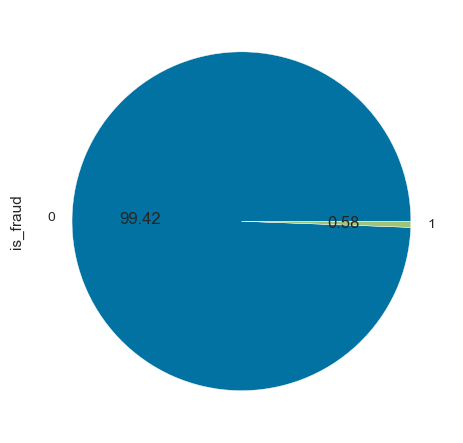

In [8]:
# check imbalance of data
train_df.is_fraud.value_counts().plot.pie(autopct='%.2f')

## Handling Object Columns

### trans_date_trans_time

In [9]:
# train
# Change date to be date type
train_df['trans_date_trans_time'] = pd.to_datetime(train_df['trans_date_trans_time'])
# Create column week number
train_df['week_number'] = train_df['trans_date_trans_time'].dt.dayofweek
assert train_df['week_number'].max() == 6
# Create column month number
train_df['month_number'] = train_df['trans_date_trans_time'].dt.month
assert train_df['month_number'].max() == 12
# Create column year
train_df['year'] = train_df['trans_date_trans_time'].dt.year

In [10]:
# test
# Change date to be date type
test_df['trans_date_trans_time'] = pd.to_datetime(test_df['trans_date_trans_time'])
# Create column week number
test_df['week_number'] = test_df['trans_date_trans_time'].dt.dayofweek
assert test_df['week_number'].max() == 6
# Create column month number
test_df['month_number'] = test_df['trans_date_trans_time'].dt.month
assert test_df['month_number'].max() == 12
# Create column year
test_df['year'] = test_df['trans_date_trans_time'].dt.year

In [11]:
# Drop this column
train_df.drop(columns=['trans_date_trans_time'], axis=1, inplace=True)
test_df.drop(columns=['trans_date_trans_time'], axis=1, inplace=True)

### merchant

In [12]:
# value counts
train_df.merchant.value_counts()

fraud_Kilback LLC                       4403
fraud_Cormier LLC                       3649
fraud_Schumm PLC                        3634
fraud_Kuhn LLC                          3510
fraud_Boyer PLC                         3493
                                        ... 
fraud_Douglas, DuBuque and McKenzie      775
fraud_Treutel-King                       775
fraud_Medhurst, Labadie and Gottlieb     759
fraud_Reichert-Weissnat                  753
fraud_Hahn, Douglas and Schowalter       727
Name: merchant, Length: 693, dtype: int64

In [13]:
# use label encoder to handle this column
label_encoder_merchant = LabelEncoder()
train_df.merchant = label_encoder_merchant.fit_transform(train_df.merchant)
test_df.merchant = label_encoder_merchant.transform(test_df.merchant)

### category

In [14]:
# value counts
train_df.category.value_counts()

gas_transport     131659
grocery_pos       123638
home              123115
shopping_pos      116672
kids_pets         113035
shopping_net       97543
entertainment      94014
food_dining        91461
personal_care      90758
health_fitness     85879
misc_pos           79655
misc_net           63287
grocery_net        45452
travel             40507
Name: category, dtype: int64

In [15]:
# show unique values in this column
np.unique(train_df.category, return_counts=True)

(array(['entertainment', 'food_dining', 'gas_transport', 'grocery_net',
        'grocery_pos', 'health_fitness', 'home', 'kids_pets', 'misc_net',
        'misc_pos', 'personal_care', 'shopping_net', 'shopping_pos',
        'travel'], dtype=object),
 array([ 94014,  91461, 131659,  45452, 123638,  85879, 123115, 113035,
         63287,  79655,  90758,  97543, 116672,  40507], dtype=int64))

<AxesSubplot:title={'center':'Number of frauds by category'}, xlabel='category', ylabel='is_fraud'>

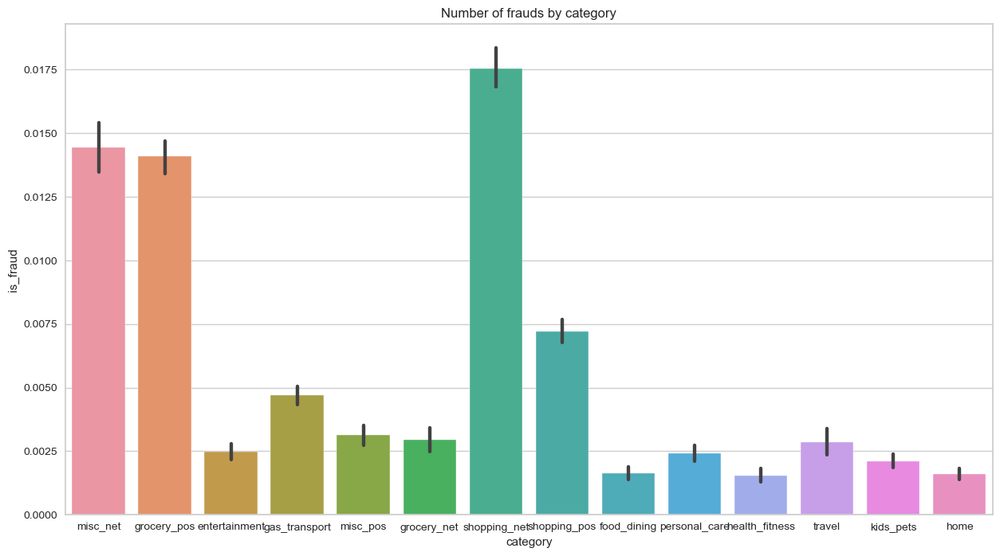

In [16]:
# Category
plt.figure(figsize=(15,8))
plt.title('Number of frauds by category')
sns.barplot(x="category", y='is_fraud' ,data=train_df)

In [17]:
# use one hot encoder for train
train_category_onehot = pd.get_dummies(train_df.category, prefix='category')
train_df = train_df.join(train_category_onehot)

In [18]:
# use one hot encoder for test
test_category_onehot = pd.get_dummies(test_df.category, prefix='category')
test_df = test_df.join(test_category_onehot)

In [19]:
# drop category
train_df.drop(columns=['category'], axis=1, inplace=True)
test_df.drop(columns=['category'], axis=1, inplace=True)

### first and last

In [20]:
# drop first and last columns because they make the model baies to names not focus on other features
train_df.drop(columns=['first', 'last'], axis=1, inplace=True)
test_df.drop(columns=['first', 'last'], axis=1, inplace=True)

### gender

In [21]:
# value counts
train_df['gender'].value_counts()

F    709863
M    586812
Name: gender, dtype: int64

<AxesSubplot:ylabel='gender'>

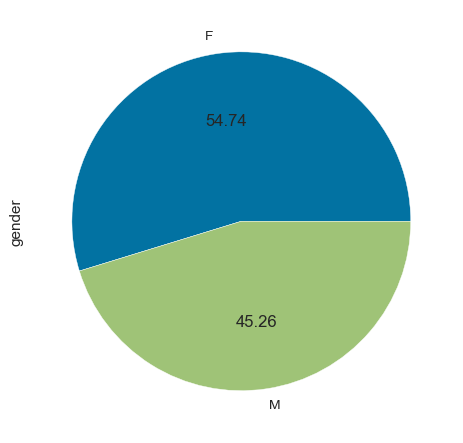

In [22]:
train_df.gender.value_counts().plot.pie(autopct='%.2f')

<AxesSubplot:xlabel='gender', ylabel='is_fraud'>

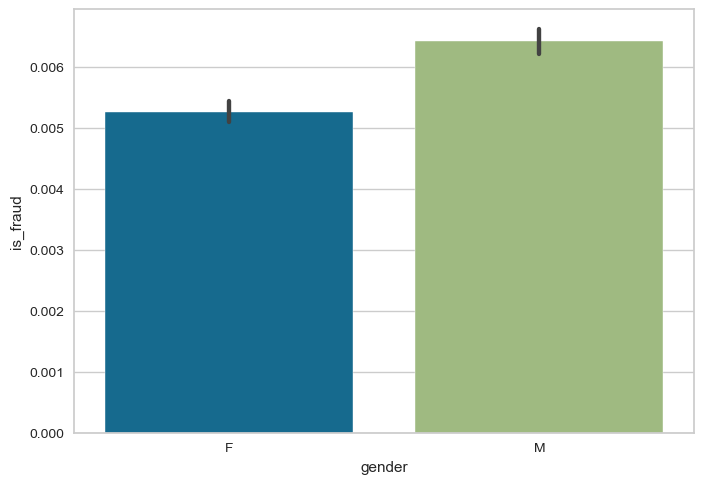

In [23]:
# visualize gender with fraud
sns.barplot(x="gender", y='is_fraud', data=train_df)

In [24]:
# use one hot encoder
train_df.gender = pd.get_dummies(train_df.gender, drop_first=True)
test_df.gender = pd.get_dummies(test_df.gender, drop_first=True)

### street, city, state and zip

In [25]:
# drop these columns because they will make the model bias to streat or city or state
train_df.drop(columns=['street', 'city', 'state', 'zip'], axis=1, inplace=True)
test_df.drop(columns=['street', 'city', 'state', 'zip'], axis=1, inplace=True)

### dob

In [26]:
# function to calculate edge
def calculate_age(row):
    today = date.today()
    return today.year - row['dob'].year - ((today.month, today.day) < (row['dob'].month, row['dob'].day))

In [27]:
# Train data
train_df['dob'] = pd.to_datetime(train_df['dob'])
train_df['age'] = train_df['dob']
train_df['age'] = train_df.apply (lambda row: calculate_age(row), axis=1)

In [28]:
# Test data
test_df['dob'] = pd.to_datetime(test_df['dob'])
test_df['age'] = test_df['dob']
test_df['age'] = test_df.apply (lambda row: calculate_age(row), axis=1)

In [29]:
# drop dop
train_df.drop(columns=['dob'], axis=1, inplace=True)
test_df.drop(columns=['dob'], axis=1, inplace=True)

### Unnamed: 0, cc_num and trans_num

In [30]:
# drop un-named column
train_df.drop(columns=['Unnamed: 0', 'cc_num', 'trans_num'], axis=1, inplace=True)
test_df.drop(columns=['Unnamed: 0', 'cc_num', 'trans_num'], axis=1, inplace=True)

### job

In [31]:
# value counts
train_df['job'].value_counts()

Film/video editor             9779
Exhibition designer           9199
Naval architect               8684
Surveyor, land/geomatics      8680
Materials engineer            8270
                              ... 
Information officer              8
Veterinary surgeon               8
Ship broker                      7
Contracting civil engineer       7
Warehouse manager                7
Name: job, Length: 494, dtype: int64

In [32]:
# len of unique valuse in train_df
len(np.unique(train_df.job))

494

In [33]:
# len of unique valuse in test_df
len(np.unique(test_df.job))

478

In [34]:
# get values in test_df not in train_df
for i in tqdm(np.unique(test_df.job)):
    if i not in np.unique(train_df.job):
        print(i)

 35%|████████████████████████████                                                    | 168/478 [02:06<03:53,  1.33it/s]

Engineer, water


 64%|███████████████████████████████████████████████████▌                            | 308/478 [03:53<02:08,  1.32it/s]

Operational investment banker


 86%|████████████████████████████████████████████████████████████████████▉           | 412/478 [05:12<00:49,  1.32it/s]

Software engineer


100%|████████████████████████████████████████████████████████████████████████████████| 478/478 [06:02<00:00,  1.32it/s]


In [35]:
# use hash to convert job column from string to int
def hash_job(job):
    new_job = []
    for i in tqdm(job):
        val = 0
        for j in range(len(i)):
            val += ord(i[j])
        new_job.append(val)
    return new_job

In [36]:
# convert train_df.job column using hash function
train_df.job = hash_job(train_df.job)

100%|████████████████████████████████████████████████████████████████████| 1296675/1296675 [00:02<00:00, 432498.43it/s]


In [37]:
# convert test_df.job column using hash function
test_df.job = hash_job(test_df.job)

100%|██████████████████████████████████████████████████████████████████████| 555719/555719 [00:01<00:00, 435686.02it/s]


## visualize data after handling columns

array([[<AxesSubplot:title={'center':'merchant'}>,
        <AxesSubplot:title={'center':'amt'}>,
        <AxesSubplot:title={'center':'gender'}>,
        <AxesSubplot:title={'center':'lat'}>,
        <AxesSubplot:title={'center':'long'}>],
       [<AxesSubplot:title={'center':'city_pop'}>,
        <AxesSubplot:title={'center':'job'}>,
        <AxesSubplot:title={'center':'unix_time'}>,
        <AxesSubplot:title={'center':'merch_lat'}>,
        <AxesSubplot:title={'center':'merch_long'}>],
       [<AxesSubplot:title={'center':'is_fraud'}>,
        <AxesSubplot:title={'center':'week_number'}>,
        <AxesSubplot:title={'center':'month_number'}>,
        <AxesSubplot:title={'center':'year'}>,
        <AxesSubplot:title={'center':'category_entertainment'}>],
       [<AxesSubplot:title={'center':'category_food_dining'}>,
        <AxesSubplot:title={'center':'category_gas_transport'}>,
        <AxesSubplot:title={'center':'category_grocery_net'}>,
        <AxesSubplot:title={'center':'cat

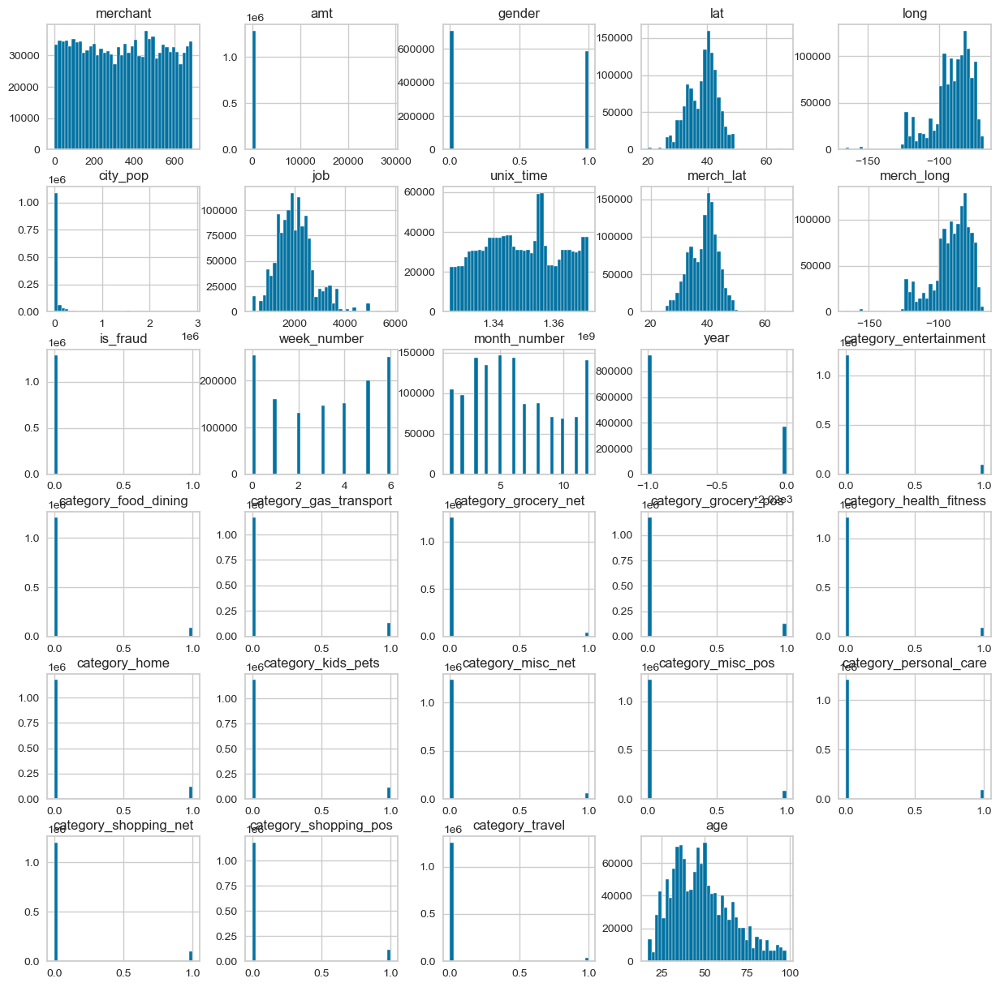

In [38]:
# show distribution of data
train_df.hist(figsize=(15, 15), bins=40)

array([[<AxesSubplot:title={'center':'merchant'}>,
        <AxesSubplot:title={'center':'amt'}>,
        <AxesSubplot:title={'center':'gender'}>,
        <AxesSubplot:title={'center':'lat'}>,
        <AxesSubplot:title={'center':'long'}>],
       [<AxesSubplot:title={'center':'city_pop'}>,
        <AxesSubplot:title={'center':'job'}>,
        <AxesSubplot:title={'center':'unix_time'}>,
        <AxesSubplot:title={'center':'merch_lat'}>,
        <AxesSubplot:title={'center':'merch_long'}>],
       [<AxesSubplot:title={'center':'is_fraud'}>,
        <AxesSubplot:title={'center':'week_number'}>,
        <AxesSubplot:title={'center':'month_number'}>,
        <AxesSubplot:title={'center':'year'}>,
        <AxesSubplot:title={'center':'category_entertainment'}>],
       [<AxesSubplot:title={'center':'category_food_dining'}>,
        <AxesSubplot:title={'center':'category_gas_transport'}>,
        <AxesSubplot:title={'center':'category_grocery_net'}>,
        <AxesSubplot:title={'center':'cat

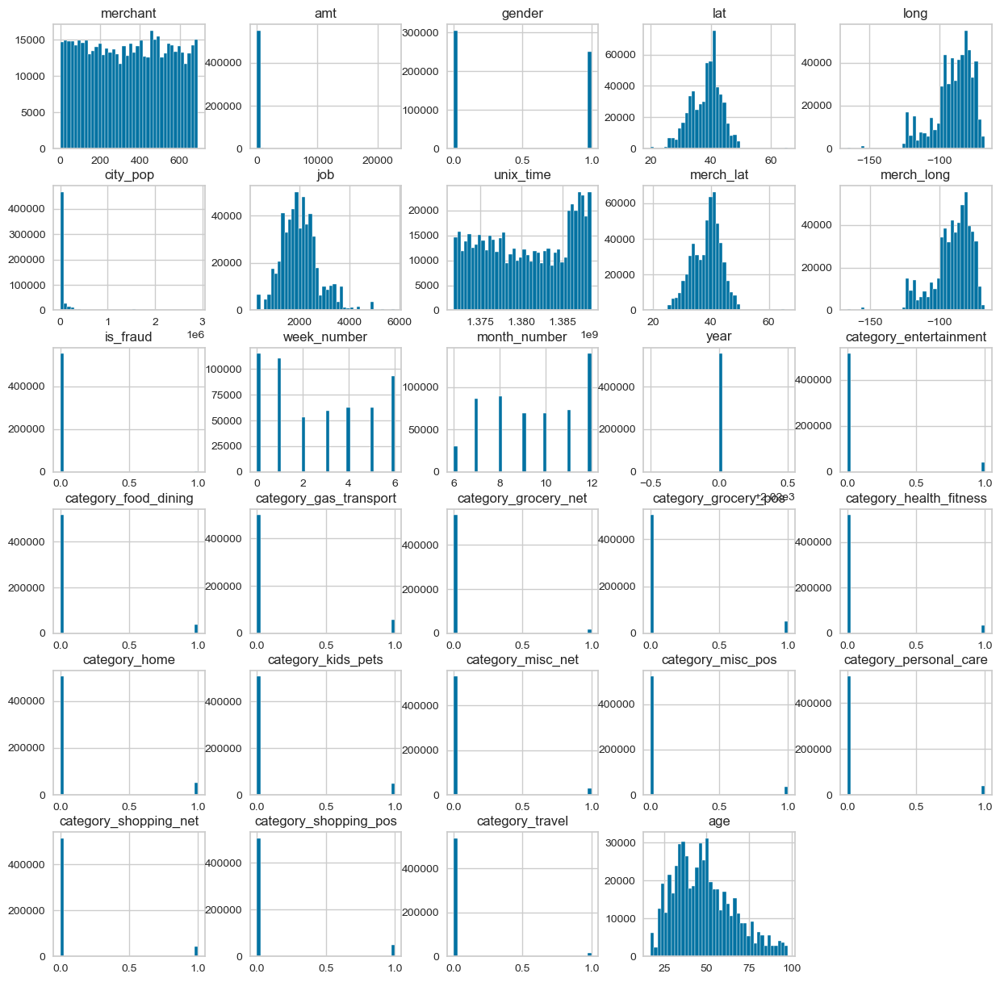

In [39]:
# show distribution of data
test_df.hist(figsize=(15, 15), bins=40)

In [40]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1296675 entries, 0 to 1296674
Data columns (total 29 columns):
 #   Column                   Non-Null Count    Dtype  
---  ------                   --------------    -----  
 0   merchant                 1296675 non-null  int32  
 1   amt                      1296675 non-null  float64
 2   gender                   1296675 non-null  uint8  
 3   lat                      1296675 non-null  float64
 4   long                     1296675 non-null  float64
 5   city_pop                 1296675 non-null  int64  
 6   job                      1296675 non-null  int64  
 7   unix_time                1296675 non-null  int64  
 8   merch_lat                1296675 non-null  float64
 9   merch_long               1296675 non-null  float64
 10  is_fraud                 1296675 non-null  int64  
 11  week_number              1296675 non-null  int64  
 12  month_number             1296675 non-null  int64  
 13  year                     1296675 non-null 

## Check Outliers

<AxesSubplot:xlabel='merchant'>

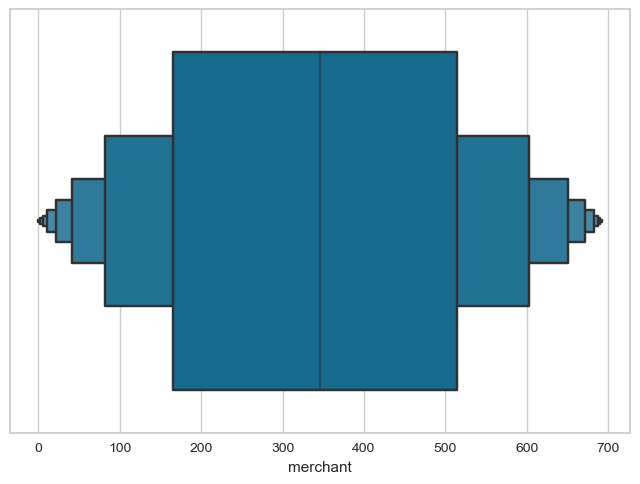

In [41]:
# plot box plot for merchant
sns.boxenplot(x=train_df['merchant'])

<AxesSubplot:xlabel='amt'>

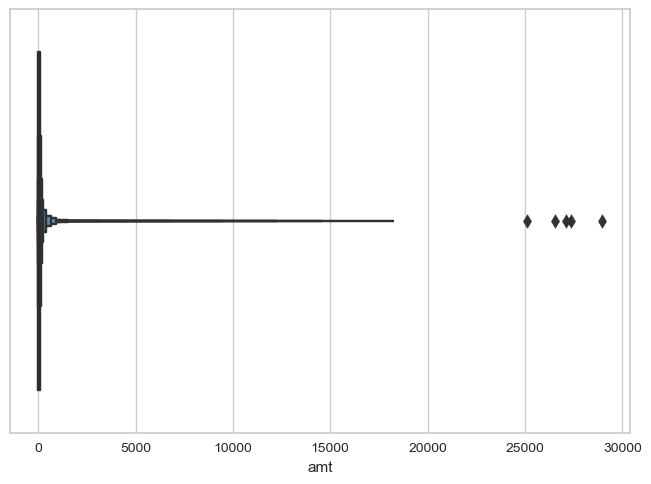

In [42]:
# plot box plot for amt
sns.boxenplot(x=train_df['amt'])

<AxesSubplot:xlabel='lat'>

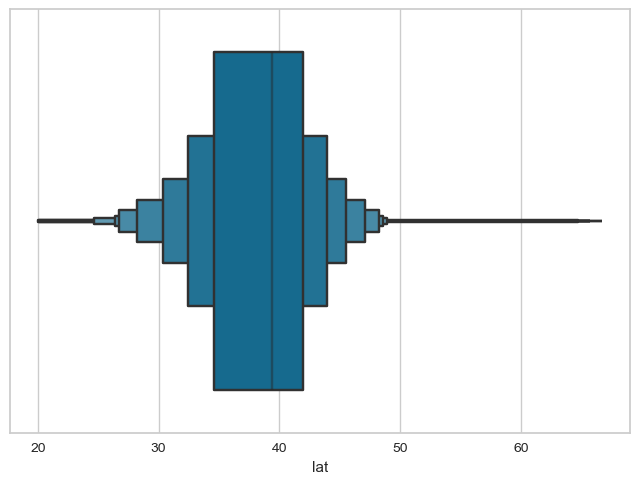

In [43]:
# plot box plot for lat
sns.boxenplot(x=train_df['lat'])

<AxesSubplot:xlabel='long'>

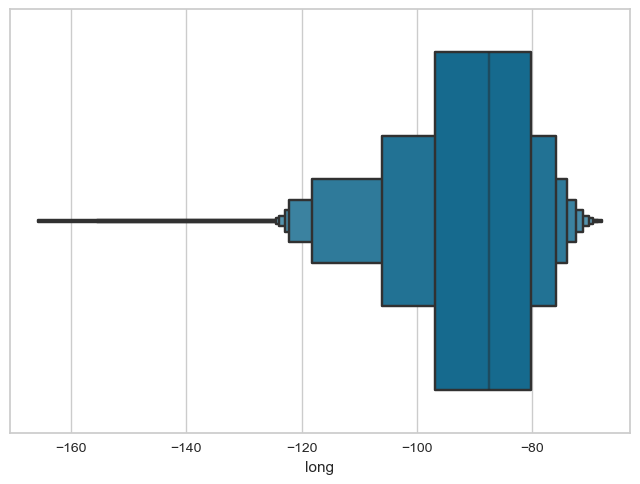

In [44]:
# plot box plot for long
sns.boxenplot(x=train_df['long'])

<AxesSubplot:xlabel='city_pop'>

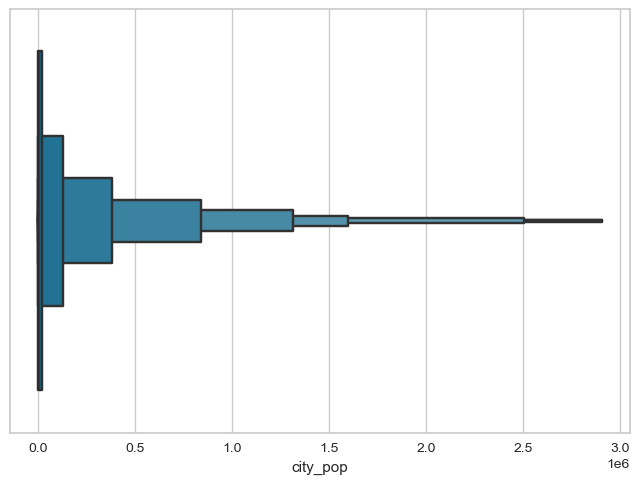

In [45]:
# plot box plot for city_pop
sns.boxenplot(x=train_df['city_pop'])

<AxesSubplot:xlabel='age'>

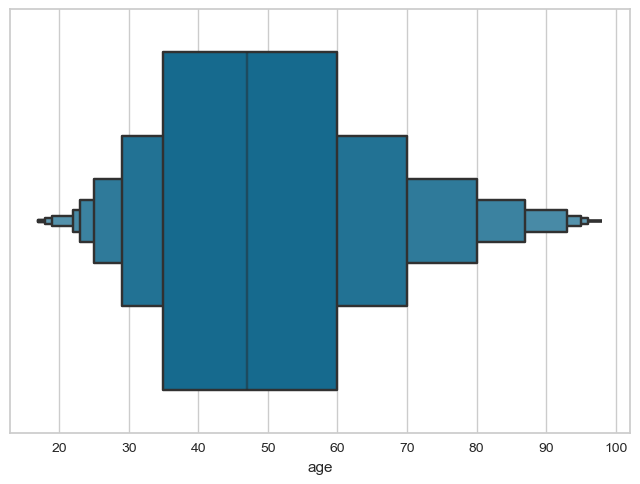

In [46]:
# plot box plot for age
sns.boxenplot(x=train_df['age'])

## Scale Dataset

In [47]:
# use Robust Scaler to reduce the effect of outliers in our dataset
robust_scaler = RobustScaler()
x_train_scaled = robust_scaler.fit_transform(train_df.drop(columns=['is_fraud'], axis=1))
x_test_scaled = robust_scaler.transform(test_df.drop(columns=['is_fraud'], axis=1))

In [48]:
# add data to dataframe
x_train_scaled = pd.DataFrame(data=x_train_scaled, columns=train_df.columns.drop('is_fraud'))
x_test_scaled = pd.DataFrame(data=x_test_scaled, columns=test_df.columns.drop('is_fraud'))

## Original Dataset

In [49]:
# initialize variables
x_original_train = x_train_scaled
x_original_test = x_test_scaled
y_original_train = train_df.is_fraud
y_original_test = test_df.is_fraud

## Use PCA as Dimensionality Reduction to decrease our features to 15 feature beacause most of over sampling or under sampling techniques work with just 15 feature like SMOTE

In [50]:
pca = PCA(n_components=15, random_state=42)
pca_x_train = pca.fit_transform(x_original_train)
pca_x_test = pca.transform(x_original_test)

In [51]:
# Function To Plot roc_auc curve
def plot_roc_auc_curve(pred, title):
    fpr, tpr, thresholds = metrics.roc_curve(y_original_test, pred)
    roc_auc = metrics.auc(fpr, tpr)
    display = metrics.RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc, estimator_name=title)
    display.plot()
    plt.show()

## Handling Data Imbalance

### Smote

<AxesSubplot:ylabel='is_fraud'>

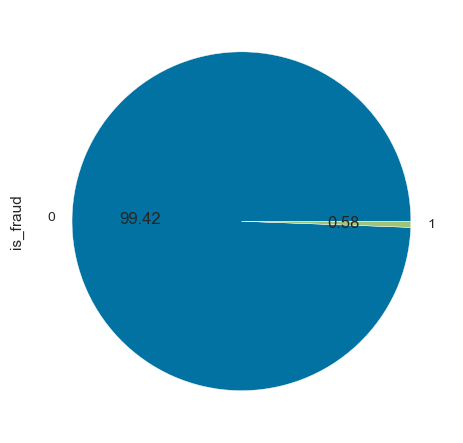

In [52]:
# show data befor sampling
y_original_train.value_counts().plot.pie(autopct='%.2f')

In [53]:
x_original_train

,merchant,amt,gender,lat,long,city_pop,job,unix_time,merch_lat,merch_long,...,category_health_fitness,category_home,category_kids_pets,category_misc_net,category_misc_pos,category_personal_care,category_shopping_net,category_shopping_pos,category_travel,age
0,0.481375,-0.578990,0.0,-0.447479,0.378534,0.053051,0.677565,-1.156974,-0.464366,0.323525,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,-0.52
1,-0.300860,0.812491,0.0,1.302409,-1.846971,-0.117794,1.432920,-1.156973,1.355748,-1.845569,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.12
2,0.126074,2.348483,1.0,0.386139,-1.489489,0.086699,0.877114,-1.156972,0.523981,-1.483516,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.52
3,0.040115,-0.034290,1.0,0.939398,-1.480583,-0.026398,-0.464487,-1.156971,1.061612,-1.507921,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.32
4,-0.140401,-0.075657,1.0,-0.127543,0.481611,-0.120347,1.246900,-1.156966,-0.095615,0.528552,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,-0.44
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1296670,0.438395,-0.434889,1.0,-0.223610,-1.502452,-0.112229,-0.772266,1.093646,-0.349468,-1.455683,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.56
1296671,-0.985673,0.056878,1.0,-0.011967,0.598966,-0.120296,1.462232,1.093646,-0.063514,0.551717,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.16
1296672,0.724928,0.794802,1.0,-0.876337,-1.102284,-0.079500,-0.528749,1.093647,-0.795472,-1.061922,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.32
1296673,0.467049,0.372568,1.0,0.546223,-0.905300,-0.067909,0.263811,1.093650,0.473900,-0.948518,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.20


In [54]:
# initialize smote variable
smote = SMOTE(random_state=42)
smote_x_train, smote_y_train = smote.fit_resample(pca_x_train, y_original_train)

<AxesSubplot:ylabel='is_fraud'>

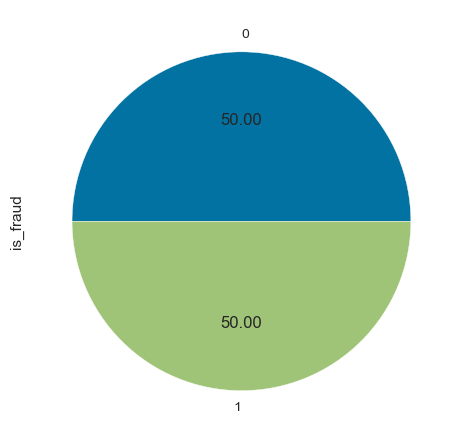

In [55]:
# show data after sampling
smote_y_train.value_counts().plot.pie(autopct='%.2f')

In [56]:
# initialize model
lgbm_classifier = LGBMClassifier(random_state=42)
lgbm_classifier.fit(smote_x_train, smote_y_train)

LGBMClassifier(random_state=42)

In [57]:
# predict
smote_y_pred = lgbm_classifier.predict(pca_x_test)

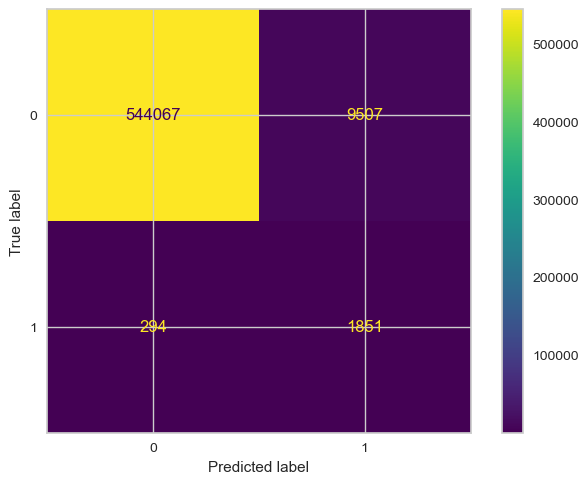

In [58]:
# plot confusion Metrics
metrics.ConfusionMatrixDisplay.from_predictions(y_original_test, smote_y_pred)

In [59]:
# print classification report
print(metrics.classification_report(y_original_test, smote_y_pred))

              precision    recall  f1-score   support

           0       1.00      0.98      0.99    553574
           1       0.16      0.86      0.27      2145

    accuracy                           0.98    555719
   macro avg       0.58      0.92      0.63    555719
weighted avg       1.00      0.98      0.99    555719



In [60]:
# roc_score
smote_roc_score = metrics.roc_auc_score(y_original_test, smote_y_pred)
print(smote_roc_score)

0.9228816036142609


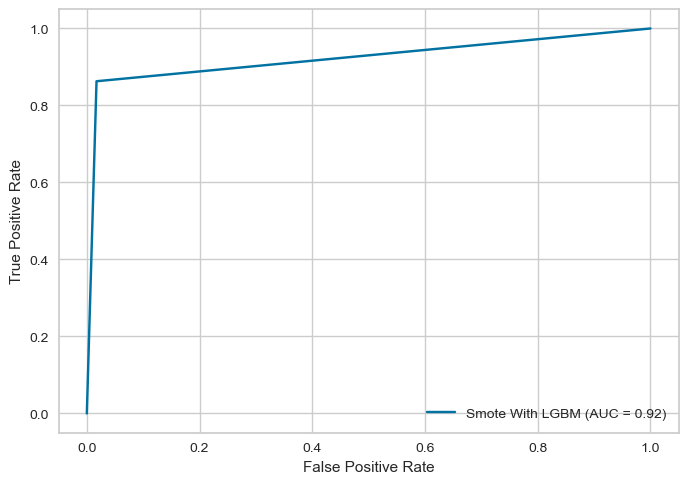

In [61]:
plot_roc_auc_curve(smote_y_pred, "Smote With LGBM")

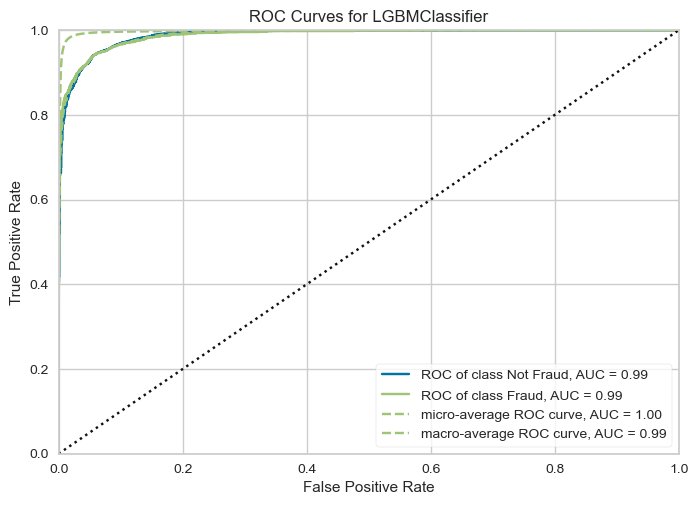

<AxesSubplot:title={'center':'ROC Curves for LGBMClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [62]:
visualizer = ROCAUC(lgbm_classifier, classes=["Not Fraud", "Fraud"])

visualizer.fit(smote_x_train, smote_y_train)        # Fit the training data to the visualizer
visualizer.score(pca_x_test, y_original_test)        # Evaluate the model on the test data
visualizer.show() 

### RandomOverSampler

In [63]:
# initialize RandomOverSampling variable
random_over_sampler = RandomOverSampler(random_state=42)
random_over_sampler_x_train, random_over_sampler_y_train = random_over_sampler.fit_resample(pca_x_train, y_original_train)

<AxesSubplot:ylabel='is_fraud'>

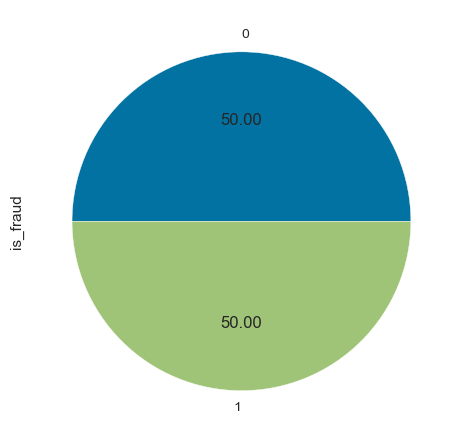

In [64]:
# show data after sampling
random_over_sampler_y_train.value_counts().plot.pie(autopct='%.2f')

In [65]:
# initialize model
lgbm_classifier = LGBMClassifier(random_state=42)
lgbm_classifier.fit(random_over_sampler_x_train, random_over_sampler_y_train)

LGBMClassifier(random_state=42)

In [66]:
# predict
random_over_sampler_y_pred = lgbm_classifier.predict(pca_x_test)

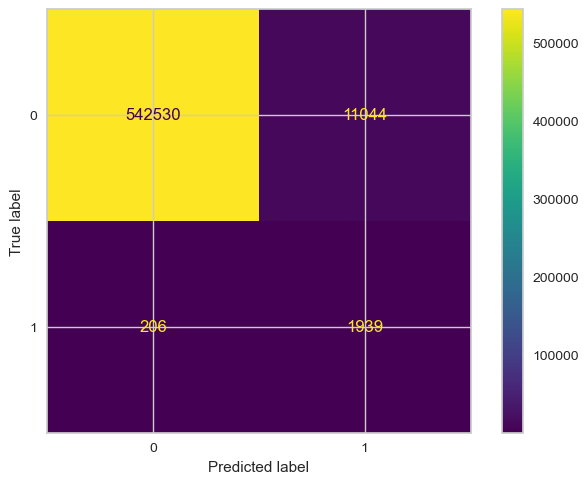

In [67]:
# plot confusion Metrics
metrics.ConfusionMatrixDisplay.from_predictions(y_original_test, random_over_sampler_y_pred)

In [68]:
# print classification report
print(metrics.classification_report(y_original_test, random_over_sampler_y_pred))

              precision    recall  f1-score   support

           0       1.00      0.98      0.99    553574
           1       0.15      0.90      0.26      2145

    accuracy                           0.98    555719
   macro avg       0.57      0.94      0.62    555719
weighted avg       1.00      0.98      0.99    555719



In [69]:
# roc_score
random_over_sampler_roc_score = metrics.roc_auc_score(y_original_test, random_over_sampler_y_pred)
print(random_over_sampler_roc_score)

0.9420061725112179


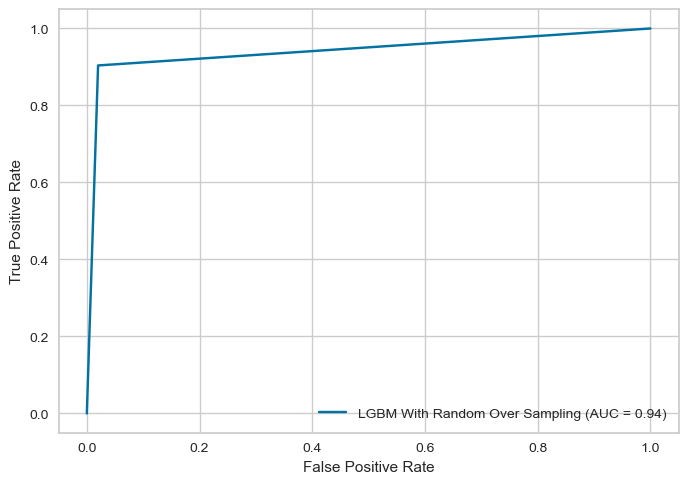

In [70]:
plot_roc_auc_curve(random_over_sampler_y_pred, "LGBM With Random Over Sampling")

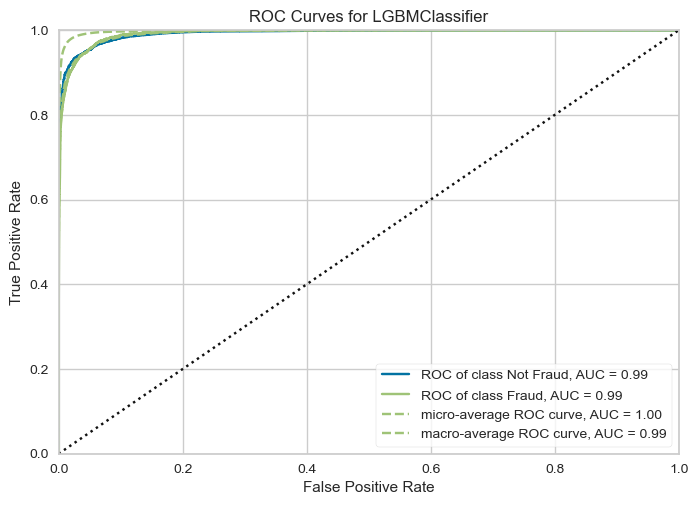

<AxesSubplot:title={'center':'ROC Curves for LGBMClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [71]:
visualizer = ROCAUC(lgbm_classifier, classes=["Not Fraud", "Fraud"])

visualizer.fit(random_over_sampler_x_train, random_over_sampler_y_train)        # Fit the training data to the visualizer
visualizer.score(pca_x_test, y_original_test)        # Evaluate the model on the test data
visualizer.show() 

### EditedNearestNeighbours

In [72]:
# initialize EditedNearestNeighbours variable
edited_nn_sampler = EditedNearestNeighbours()
edited_nn_sampler_x_train, edited_nn_sampler_y_train = edited_nn_sampler.fit_resample(pca_x_train, y_original_train)

<AxesSubplot:ylabel='is_fraud'>

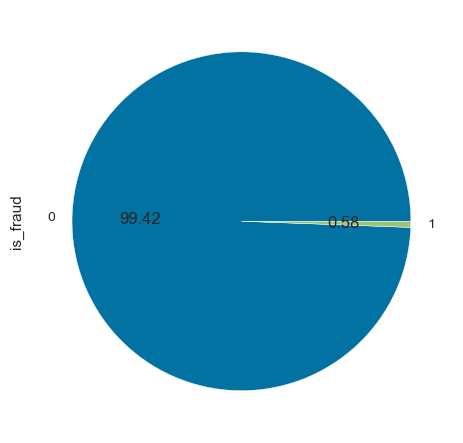

In [73]:
# show data after sampling
edited_nn_sampler_y_train.value_counts().plot.pie(autopct='%.2f')

In [74]:
# initialize model
lgbm_classifier = LGBMClassifier(random_state=42)
lgbm_classifier.fit(edited_nn_sampler_x_train, edited_nn_sampler_y_train)

LGBMClassifier(random_state=42)

In [75]:
# predict
edited_nn_sampler_y_pred = lgbm_classifier.predict(pca_x_test)

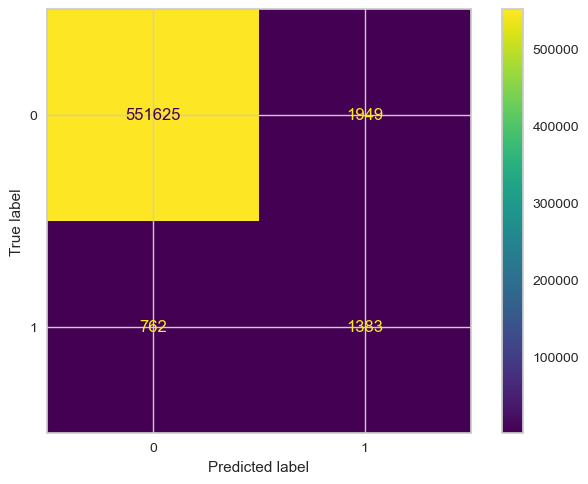

In [76]:
# plot confusion Metrics
metrics.ConfusionMatrixDisplay.from_predictions(y_original_test, edited_nn_sampler_y_pred)

In [77]:
# print classification report
print(metrics.classification_report(y_original_test, edited_nn_sampler_y_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    553574
           1       0.42      0.64      0.51      2145

    accuracy                           1.00    555719
   macro avg       0.71      0.82      0.75    555719
weighted avg       1.00      1.00      1.00    555719



In [78]:
# roc_score
edited_nn_sampler_roc_score = metrics.roc_auc_score(y_original_test, edited_nn_sampler_y_pred)
print(edited_nn_sampler_roc_score)

0.8206172434580922


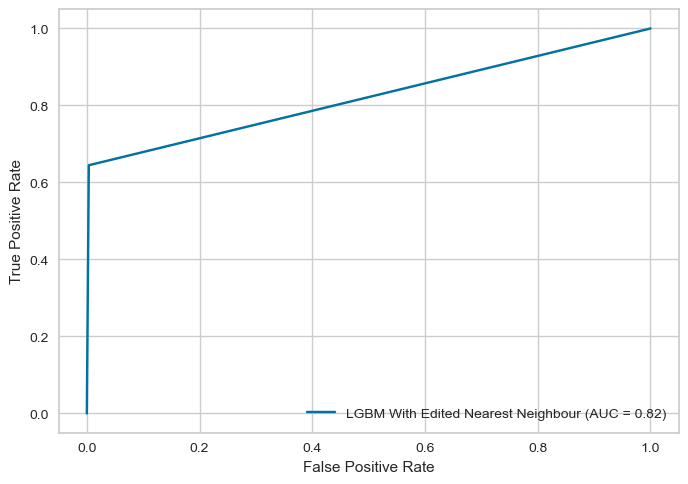

In [79]:
plot_roc_auc_curve(edited_nn_sampler_y_pred, "LGBM With Edited Nearest Neighbour")

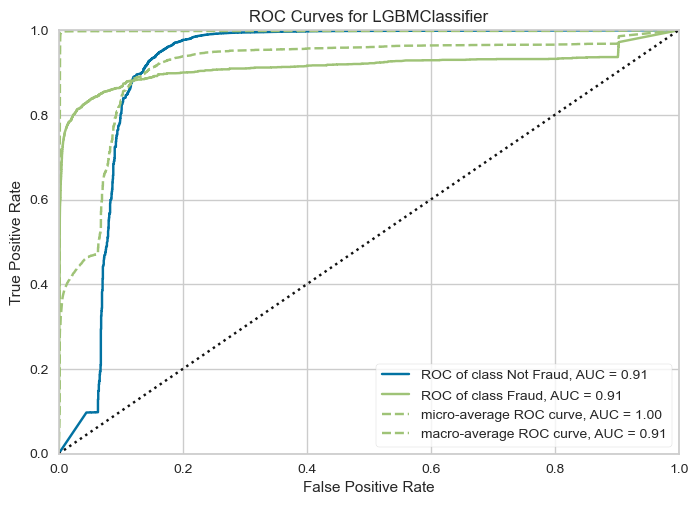

<AxesSubplot:title={'center':'ROC Curves for LGBMClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [80]:
visualizer = ROCAUC(lgbm_classifier, classes=["Not Fraud", "Fraud"])

visualizer.fit(edited_nn_sampler_x_train, edited_nn_sampler_y_train)        # Fit the training data to the visualizer
visualizer.score(pca_x_test, y_original_test)        # Evaluate the model on the test data
visualizer.show()

### Random Under Sampling

In [81]:
# initialize RandomUnderSampling variable
random_under_sampler = RandomUnderSampler(random_state=42)
random_under_sampler_x_train, random_under_sampler_y_train = random_under_sampler.fit_resample(pca_x_train, y_original_train)

<AxesSubplot:ylabel='is_fraud'>

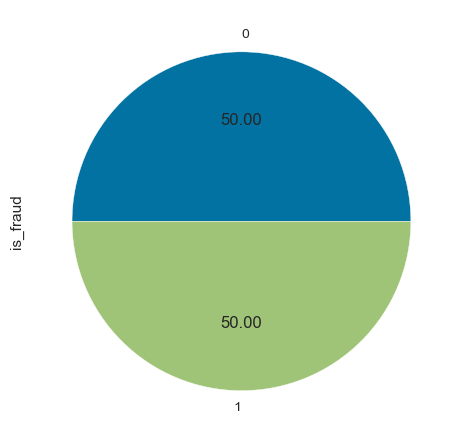

In [82]:
# show data after sampling
random_under_sampler_y_train.value_counts().plot.pie(autopct='%.2f')

In [83]:
# initialize model
lgbm_classifier = LGBMClassifier(random_state=42)
lgbm_classifier.fit(random_under_sampler_x_train, random_under_sampler_y_train)

LGBMClassifier(random_state=42)

In [84]:
# predict
random_under_sampler_y_pred = lgbm_classifier.predict(pca_x_test)

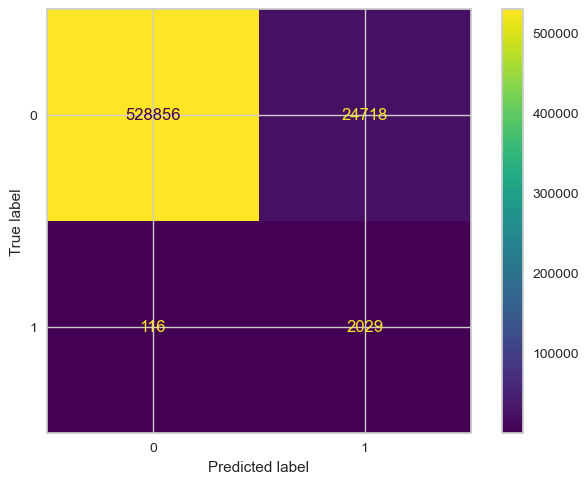

In [85]:
# plot confusion Metrics
metrics.ConfusionMatrixDisplay.from_predictions(y_original_test, random_under_sampler_y_pred)

In [86]:
# print classification report
print(metrics.classification_report(y_original_test, random_under_sampler_y_pred))

              precision    recall  f1-score   support

           0       1.00      0.96      0.98    553574
           1       0.08      0.95      0.14      2145

    accuracy                           0.96    555719
   macro avg       0.54      0.95      0.56    555719
weighted avg       1.00      0.96      0.97    555719



In [87]:
# roc_score
random_under_sampler_roc_score = metrics.roc_auc_score(y_original_test, random_under_sampler_y_pred)
print(random_under_sampler_roc_score)

0.9506345411835915


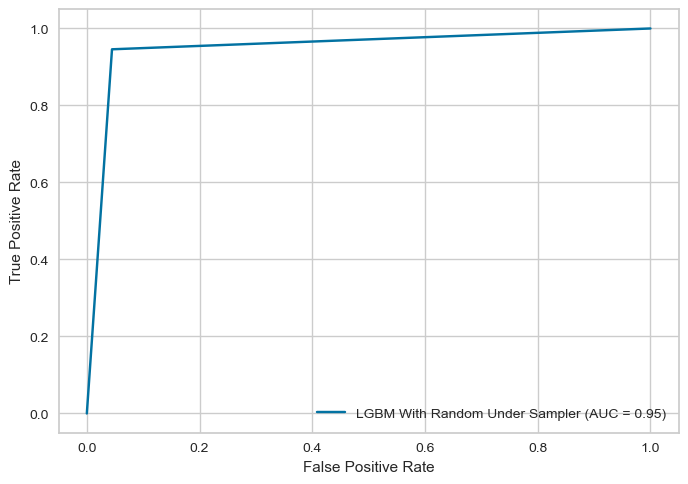

In [88]:
plot_roc_auc_curve(random_under_sampler_y_pred, "LGBM With Random Under Sampler")

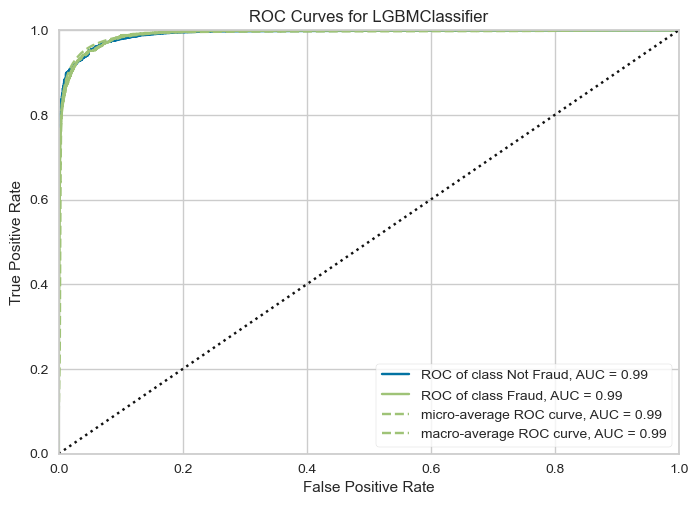

<AxesSubplot:title={'center':'ROC Curves for LGBMClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [89]:
visualizer = ROCAUC(lgbm_classifier, classes=["Not Fraud", "Fraud"])

visualizer.fit(random_under_sampler_x_train, random_under_sampler_y_train)        # Fit the training data to the visualizer
visualizer.score(pca_x_test, y_original_test)        # Evaluate the model on the test data
visualizer.show()

### Chosse The Best Technique To Handle Imbalanced Dataset ...

In [90]:
# initialize Values
techniques = ['SMOTE', 'RandomOverSampling', 'EditedNearestNeighbours', 'RandomUnderSampling']
techniques_roc_auc_scores = [smote_roc_score, random_over_sampler_roc_score, edited_nn_sampler_roc_score, random_under_sampler_roc_score]

In [91]:
# Plot The Result Using Plotly
px.bar(x=techniques, y=techniques_roc_auc_scores, color=techniques, title="Techniques ROC_AUC Scores").update_layout(
    xaxis_title="Techniques", 
    yaxis_title="Roc_Auc_Score"
)

Text(0, 0.5, 'ROC_AUC Score')

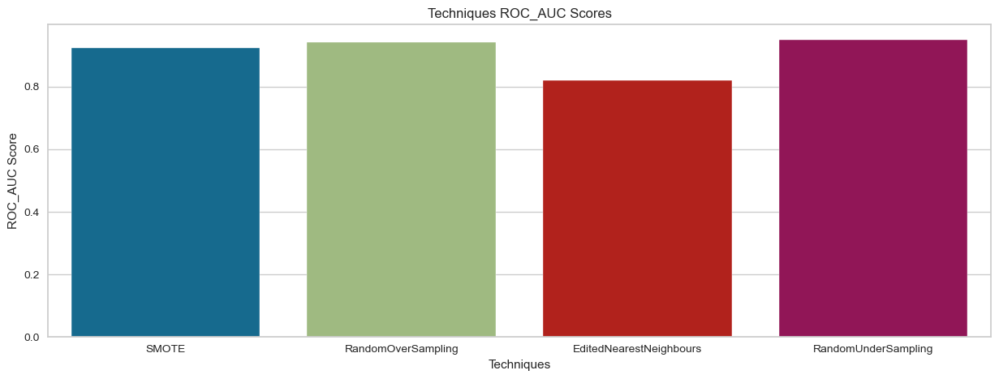

In [92]:
# plot using seaborn
plt.figure(figsize=(15, 5))
plt.title('Techniques ROC_AUC Scores')
sns.barplot(x=techniques, y=techniques_roc_auc_scores)
plt.xlabel("Techniques")
plt.ylabel("ROC_AUC Score")

## Feature Selection

In [93]:
# show correlation between features
random_under_sampler_df = pd.DataFrame(random_under_sampler_x_train)
random_under_sampler_df['is_fraud'] = random_under_sampler_y_train
pca_x_test_df = pd.DataFrame(pca_x_test)
pca_x_test_df['is_fraud'] = y_original_test
random_under_sampler_df.corr()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,is_fraud
0,1.000000,0.024095,0.020472,-0.008846,-0.007461,0.001637,0.031060,-0.009339,-0.010404,0.015488,0.014341,0.013156,-0.002956,0.001529,0.011298,0.022430
1,0.024095,1.000000,-0.022680,0.017700,0.000898,-0.002604,0.087499,-0.028117,0.009944,0.016894,0.068956,-0.106773,0.145902,0.297981,-0.048034,0.620092
2,0.020472,-0.022680,1.000000,0.061629,0.004087,0.011087,-0.006676,-0.012729,0.000306,-0.003810,0.012338,0.008999,0.002062,-0.009651,0.005090,-0.024135
3,-0.008846,0.017700,0.061629,1.000000,-0.009154,-0.012253,-0.019459,-0.018786,0.004965,-0.000316,0.009915,0.002520,-0.002457,0.006339,0.007459,0.019631
4,-0.007461,0.000898,0.004087,-0.009154,1.000000,-0.003693,-0.004050,0.006056,0.010795,-0.003911,-0.026477,0.008600,-0.007643,0.002022,-0.002130,0.002130
5,0.001637,-0.002604,0.011087,-0.012253,-0.003693,1.000000,0.013472,0.048351,0.013896,0.038075,0.006038,-0.008487,0.002516,-0.004942,-0.006569,-0.015586
6,0.031060,0.087499,-0.006676,-0.019459,-0.004050,0.013472,1.000000,0.009157,0.001834,0.032028,-0.001961,-0.008333,-0.036138,0.022059,-0.043280,0.083846
7,-0.009339,-0.028117,-0.012729,-0.018786,0.006056,0.048351,0.009157,1.000000,0.002972,-0.012290,0.033249,0.003655,0.029195,-0.001161,-0.001664,-0.074258
8,-0.010404,0.009944,0.000306,0.004965,0.010795,0.013896,0.001834,0.002972,1.000000,0.002864,0.012786,-0.004199,-0.007160,0.005457,-0.005048,0.003021
9,0.015488,0.016894,-0.003810,-0.000316,-0.003911,0.038075,0.032028,-0.012290,0.002864,1.000000,-0.006171,0.002784,0.000308,0.006018,-0.015060,0.027197


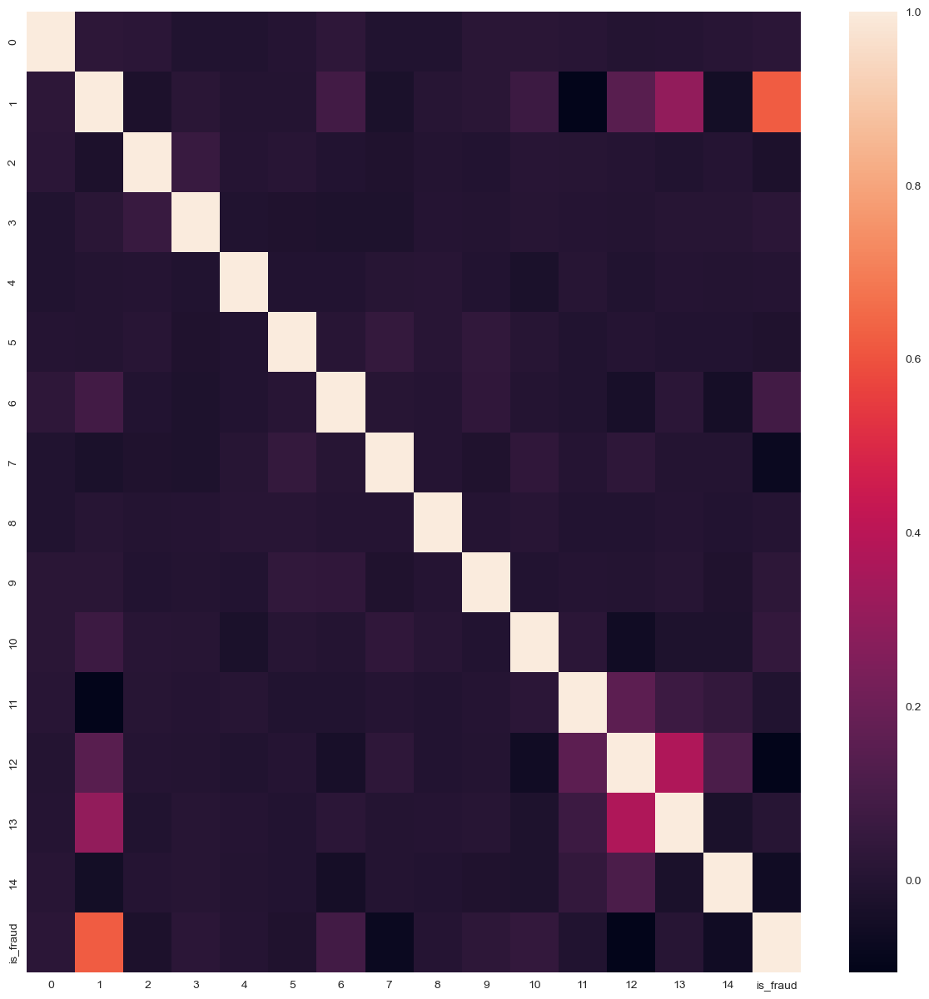

In [94]:
plt.figure(figsize=(15, 15))
sns.heatmap(random_under_sampler_df.corr())
plt.show()

### f_regression Feature Selection

In [95]:
# initialize parameters
f_reg = f_regression(X=random_under_sampler_x_train, y=random_under_sampler_y_train)

In [96]:
f_reg[1].round(3)

array([0.006, 0.   , 0.003, 0.016, 0.794, 0.056, 0.   , 0.   , 0.711,
       0.001, 0.   , 0.165, 0.   , 0.342, 0.   ])

In [97]:
random_under_sampler_df.columns

Index([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 'is_fraud'], dtype='object')

In [98]:
f_regression_x_train = random_under_sampler_df[random_under_sampler_df.columns.drop([4, 8, 'is_fraud'])]
f_regression_x_test = pca_x_test_df[pca_x_test_df.columns.drop([4, 8, 'is_fraud'])]

In [99]:
# calculate roc_score after using f_regression feature selection
lgbm_classifier = LGBMClassifier(random_state=42)
lgbm_classifier.fit(f_regression_x_train, random_under_sampler_y_train)

LGBMClassifier(random_state=42)

In [100]:
# predict x_test
f_regression_feature_selection_y_pred = lgbm_classifier.predict(f_regression_x_test)

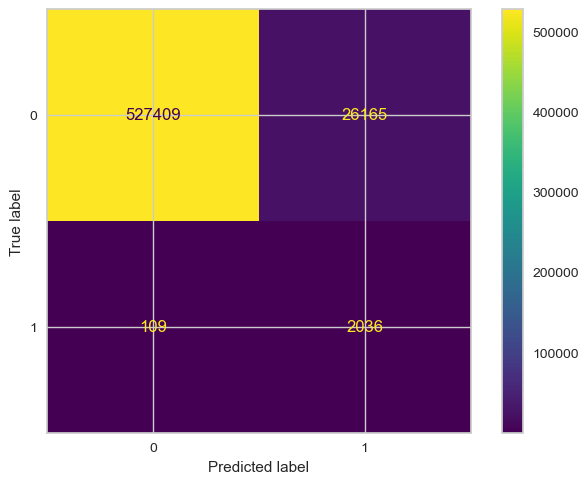

In [101]:
# plot confusion Metrics
metrics.ConfusionMatrixDisplay.from_predictions(y_original_test, f_regression_feature_selection_y_pred)

In [102]:
# print classification report
print(metrics.classification_report(y_original_test, f_regression_feature_selection_y_pred))

              precision    recall  f1-score   support

           0       1.00      0.95      0.98    553574
           1       0.07      0.95      0.13      2145

    accuracy                           0.95    555719
   macro avg       0.54      0.95      0.55    555719
weighted avg       1.00      0.95      0.97    555719



In [103]:
# roc_score
f_regression_feature_selection_roc_score = metrics.roc_auc_score(y_original_test, f_regression_feature_selection_y_pred)
print(f_regression_feature_selection_roc_score)

0.9509592811444054


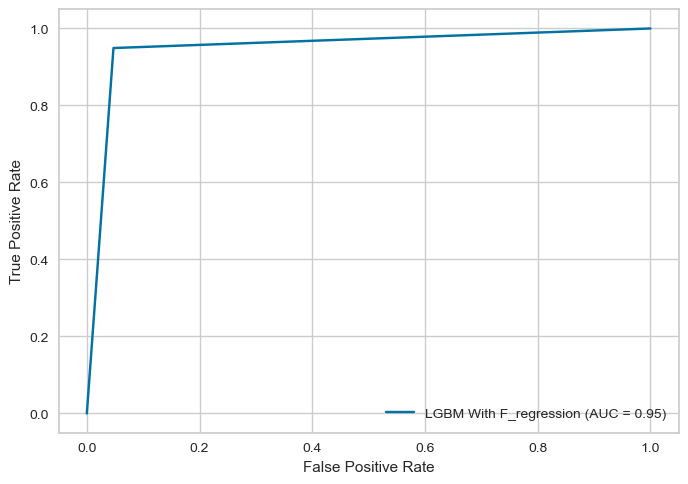

In [104]:
plot_roc_auc_curve(f_regression_feature_selection_y_pred, "LGBM With F_regression")

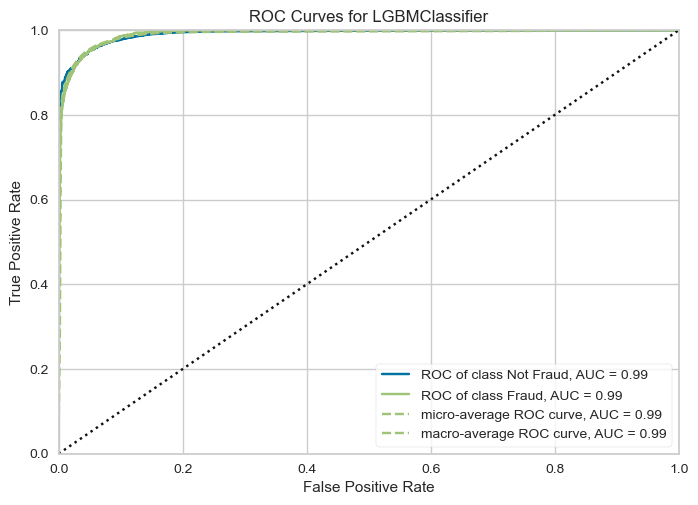

<AxesSubplot:title={'center':'ROC Curves for LGBMClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [105]:
visualizer = ROCAUC(lgbm_classifier, classes=["Not Fraud", "Fraud"])

visualizer.fit(f_regression_x_train, random_under_sampler_y_train)        # Fit the training data to the visualizer
visualizer.score(f_regression_x_test, y_original_test)        # Evaluate the model on the test data
visualizer.show()

### mutual_info_classif

In [106]:
mutal_info = mutual_info_classif(random_under_sampler_x_train, random_under_sampler_y_train)

In [107]:
mutal_info

array([0.12187792, 0.45296045, 0.00549015, 0.        , 0.0498717 ,
       0.02936052, 0.01425879, 0.03650869, 0.01342807, 0.052677  ,
       0.        , 0.14748339, 0.44323467, 0.19167369, 0.26600487])

In [108]:
mutal_info_x_train = random_under_sampler_df[random_under_sampler_df.columns.drop([2, 3, 10, 'is_fraud'])]
mutal_info_x_test = pca_x_test_df[pca_x_test_df.columns.drop([2, 3, 10, 'is_fraud'])]

In [109]:
# calculate roc_score after using f_regression feature selection
lgbm_classifier = LGBMClassifier(random_state=42)
lgbm_classifier.fit(mutal_info_x_train, random_under_sampler_y_train)

LGBMClassifier(random_state=42)

In [110]:
# predict x_test
mutal_info_feature_selection_y_pred = lgbm_classifier.predict(mutal_info_x_test)

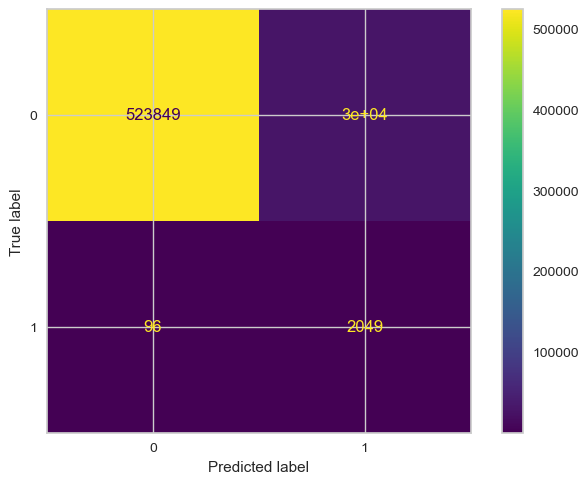

In [111]:
# plot confusion Metrics
metrics.ConfusionMatrixDisplay.from_predictions(y_original_test, mutal_info_feature_selection_y_pred)

In [112]:
# print classification report
print(metrics.classification_report(y_original_test, mutal_info_feature_selection_y_pred))

              precision    recall  f1-score   support

           0       1.00      0.95      0.97    553574
           1       0.06      0.96      0.12      2145

    accuracy                           0.95    555719
   macro avg       0.53      0.95      0.55    555719
weighted avg       1.00      0.95      0.97    555719



In [113]:
# roc_score
mutal_info_feature_selection_roc_score = metrics.roc_auc_score(y_original_test, mutal_info_feature_selection_y_pred)
print(mutal_info_feature_selection_roc_score)

0.9507741152401125


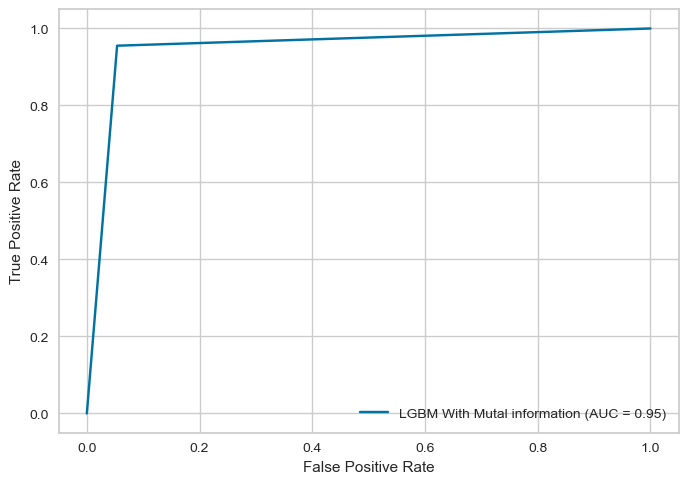

In [114]:
plot_roc_auc_curve(mutal_info_feature_selection_y_pred, "LGBM With Mutal information")

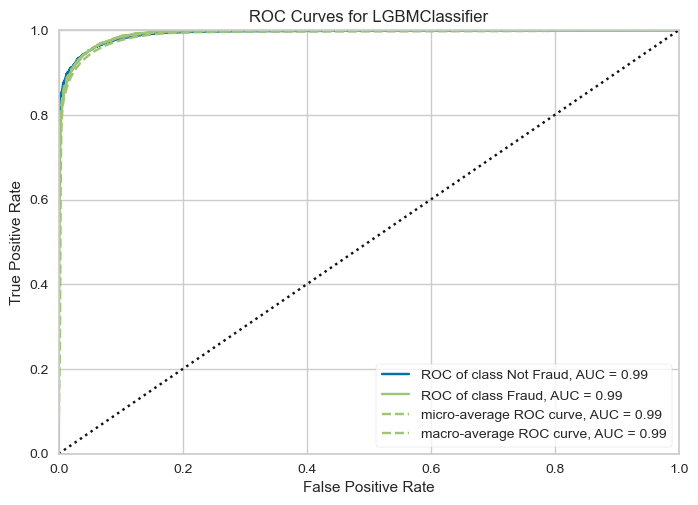

<AxesSubplot:title={'center':'ROC Curves for LGBMClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [115]:
visualizer = ROCAUC(lgbm_classifier, classes=["Not Fraud", "Fraud"])

visualizer.fit(mutal_info_x_train, random_under_sampler_y_train)        # Fit the training data to the visualizer
visualizer.score(mutal_info_x_test, y_original_test)        # Evaluate the model on the test data
visualizer.show()

### Plot Result Of Feature Selection

In [116]:
# initialize Variables
feature_selection_methods = ['Without Feature Selection', 'f_regression', 'mutal_information']
feature_selection_methods_roc_score = [random_under_sampler_roc_score, f_regression_feature_selection_roc_score, mutal_info_feature_selection_roc_score]

In [117]:
# Plot The Result Using Plotly
px.bar(x=feature_selection_methods, y=feature_selection_methods_roc_score, color=feature_selection_methods, title="Feature Selection Methods").update_layout(
    xaxis_title="Feature Selection", 
    yaxis_title="Roc_Auc_Score"
)

Text(0, 0.5, 'Roc_Auc_Score')

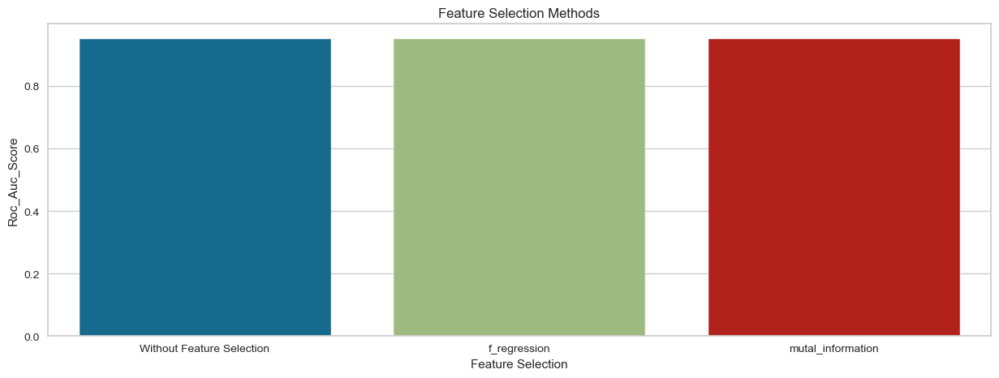

In [118]:
# plot using seaborn
plt.figure(figsize=(15, 5))
plt.title('Feature Selection Methods')
sns.barplot(x=feature_selection_methods, y=feature_selection_methods_roc_score)
plt.xlabel("Feature Selection")
plt.ylabel("Roc_Auc_Score")

## Initialize x_train, y_train, x_test, y_test Variables

In [119]:
# from the previous experiments we find that random under sampling is the best technique to solve data impalance
# from the previous experiments we find that mutal information is the best feature selection method
X_train = mutal_info_x_train
y_train = random_under_sampler_y_train
X_test = mutal_info_x_test
y_test = y_original_test

# Modeling

## Traditional Ml models


In [120]:
#Area under Curve  to evaluate the quality of a binary classification model
#by measuring the area as much the model closer to the ideal model will be great model 
def ROC_curve(ytest,ypred):
  FPR, TPR, _ = metrics.roc_curve(ytest,  ypred)
  auc = metrics.roc_auc_score(ytest, ypred)
  #create ROC curve
  plt.plot(FPR,TPR,label="AUC="+str(auc))
  plt.ylabel('True Positive Rate')
  plt.xlabel('False Positive Rate')
  plt.title('ROC Curve')
  plt.legend(loc=4)
  plt.show()

In [121]:
Accuracy={}
Precision={}
Recall={}
F1_score={}
models = []

### Logistic Regression

####BaseLine

In [122]:
basic_LR= LogisticRegression()
basic_LR.fit(X_train, y_train)
LR_pred = basic_LR.predict(X_test)

In [123]:
#Scoring the model on training_data
print(f'Training Accuracy\t: {basic_LR.score(X_train, y_train)*100} %')

#Scoring the model on test_data
print(f'Testing Accuracy\t:  {basic_LR.score(X_test, y_test)*100} %')

Training Accuracy	: 82.21422861710631 %
Testing Accuracy	:  96.43992737336676 %


In [124]:
print(classification_report(y_test, LR_pred))

              precision    recall  f1-score   support

           0       1.00      0.97      0.98    553574
           1       0.07      0.72      0.14      2145

    accuracy                           0.96    555719
   macro avg       0.54      0.84      0.56    555719
weighted avg       1.00      0.96      0.98    555719



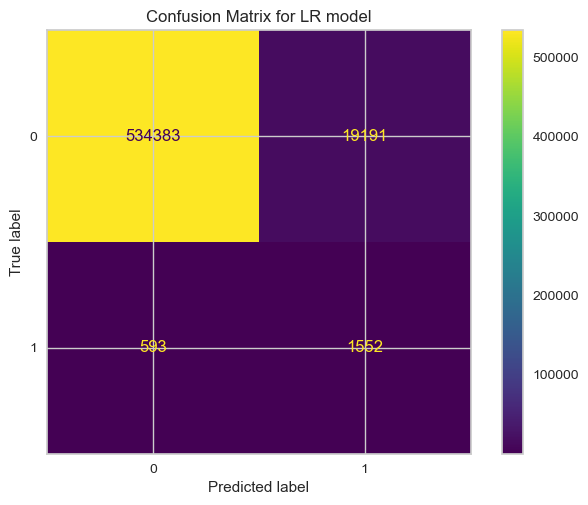

In [125]:
base_cm = confusion_matrix(y_test, LR_pred)
display = ConfusionMatrixDisplay(base_cm).plot()
plt.title("Confusion Matrix for LR model")
plt.show()

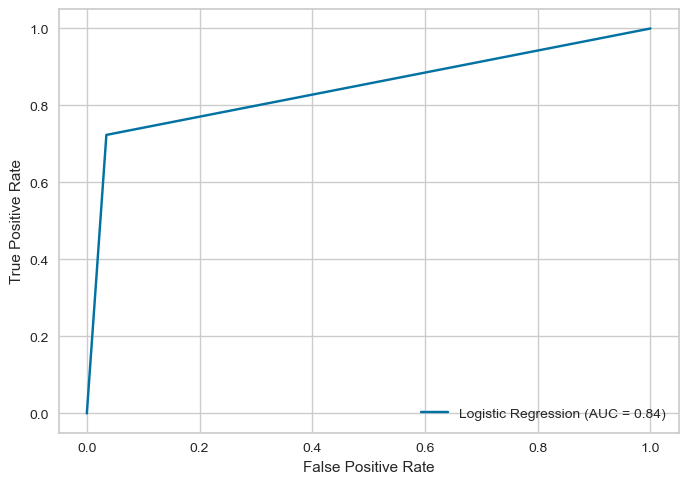

In [126]:
plot_roc_auc_curve(LR_pred, "Logistic Regression")

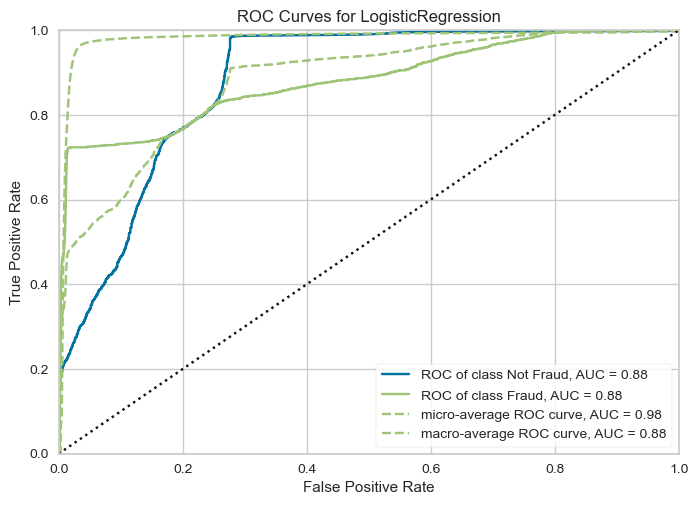

<AxesSubplot:title={'center':'ROC Curves for LogisticRegression'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [127]:
visualizer = ROCAUC(basic_LR, classes=["Not Fraud", "Fraud"])

visualizer.fit(X_train, y_train)        # Fit the training data to the visualizer
visualizer.score(X_test, y_test)        # Evaluate the model on the test data
visualizer.show()

In [128]:
Accuracy['LogisticRegression']=accuracy_score(y_test,LR_pred)
Precision['LogisticRegression']=precision_score(y_test,LR_pred)
Recall['LogisticRegression']=recall_score(y_test,LR_pred)
F1_score['LogisticRegression']=f1_score(y_test,LR_pred)
models.append(basic_LR)

####Grid Search

In [129]:
LRparam_grid = {
    'C': [0.001, 0.01, 0.1, 1, 10, 100, 1000],
    'penalty': ['l1', 'l2'],
    'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga']
}

In [130]:
cv = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)
grid_search = GridSearchCV(estimator=basic_LR, param_grid=LRparam_grid,cv=cv, scoring='recall')
grid_result = grid_search.fit(X_train, y_train)


C:\Users\hrelh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

C:\Users\hrelh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

C:\Users\hrelh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

C:\Users\hrelh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

C:\Users\hrelh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

C:\Users\hrelh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

C:\Users\hrelh\anacond

C:\Users\hrelh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

C:\Users\hrelh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

C:\Users\hrelh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

C:\Users\hrelh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

C:\Users\hrelh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

C:\Users\hrelh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

C:\Users\hrelh\anacond

C:\Users\hrelh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

C:\Users\hrelh\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:444: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

C:\Users\hrelh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

C:\Users\hrelh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

C:\Users\hrelh\anaconda3\lib\sit

C:\Users\hrelh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

C:\Users\hrelh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

C:\Users\hrelh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

C:\Users\hrelh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

C:\Users\hrelh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

C:\Users\hrelh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

C:\Users\hrelh\anacond

In [131]:
# summarize
print('Mean Accuracy: %.3f' % grid_result.best_score_)
print('parameters: %s' % grid_result.best_params_)

Mean Accuracy: 0.761
parameters: {'C': 0.001, 'penalty': 'l1', 'solver': 'liblinear'}


####Tuned Logistic Regression

In [132]:
LR_model = LogisticRegression(C= 0.001, penalty= 'l1',solver='saga')
LR_model.fit(X_train, y_train)
LR_y_pred = LR_model.predict(X_test)

In [133]:
print(f'Training Accuracy\t: {LR_model.score(X_train, y_train)*100} %')

#Scoring the model on test_data
print(f'Testing Accuracy\t:  {LR_model.score(X_test, y_test)*100} %')

Training Accuracy	: 86.07114308553157 %
Testing Accuracy	:  96.25782094907677 %


In [134]:
print(classification_report(y_test, LR_y_pred)) #get the evalutions matrices for  LR

              precision    recall  f1-score   support

           0       1.00      0.96      0.98    553574
           1       0.07      0.75      0.13      2145

    accuracy                           0.96    555719
   macro avg       0.54      0.86      0.56    555719
weighted avg       1.00      0.96      0.98    555719



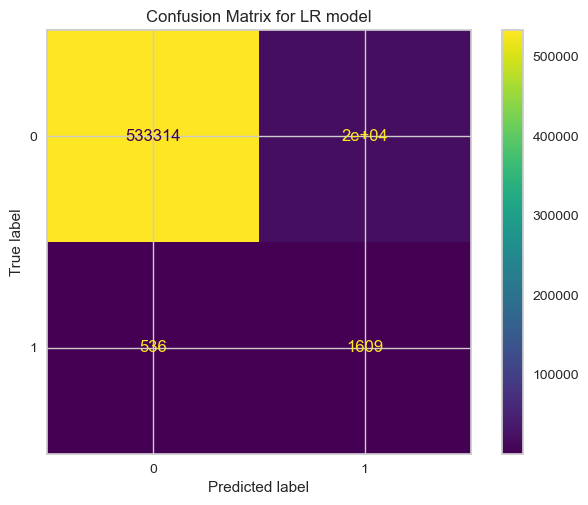

In [135]:
LR_cm = confusion_matrix(y_test, LR_y_pred)
display = ConfusionMatrixDisplay(LR_cm).plot()
plt.title("Confusion Matrix for LR model")
plt.show()

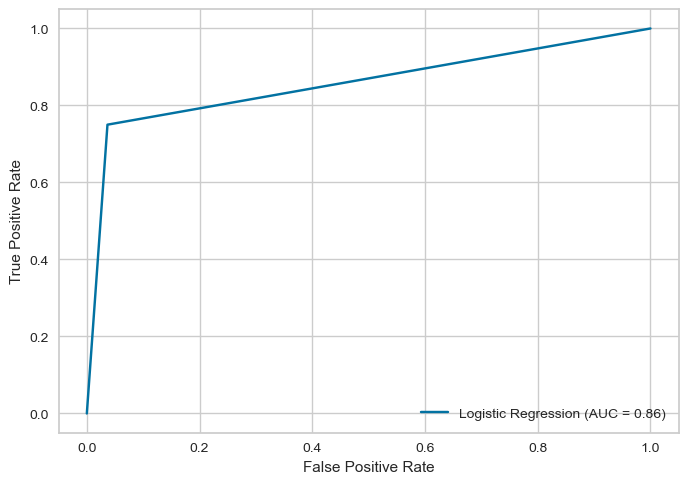

In [136]:
plot_roc_auc_curve(LR_y_pred, "Logistic Regression")

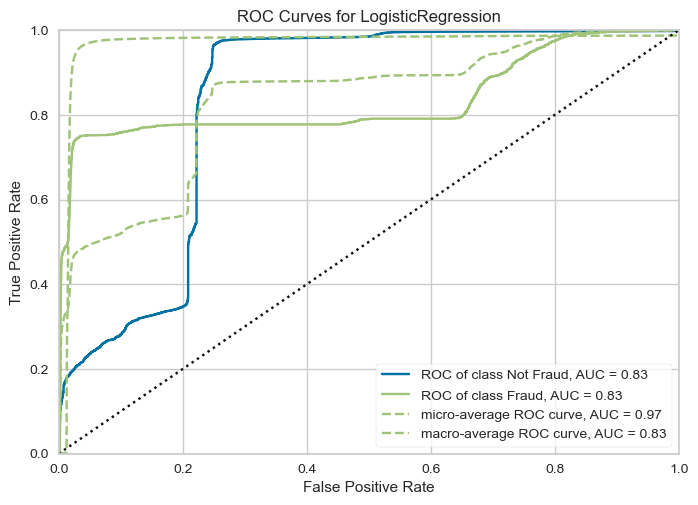

<AxesSubplot:title={'center':'ROC Curves for LogisticRegression'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [137]:
visualizer = ROCAUC(LR_model, classes=["Not Fraud", "Fraud"])

visualizer.fit(X_train, y_train)        # Fit the training data to the visualizer
visualizer.score(X_test, y_test)        # Evaluate the model on the test data
visualizer.show()

### SVM

####Baseline

In [138]:
svm_model = svm.SVC()
svm_model.fit(X_train, y_train)

SVC()

In [139]:
svm_pred = svm_model.predict(X_test)
print("Size of training set: ", X_test.shape)
print(svm_pred.shape)

Size of training set:  (555719, 12)
(555719,)


In [140]:
#Scoring the model on training_data
print(f'Training Accuracy\t: {svm_model.score(X_train, y_train)*100} %')

#Scoring the model on test_data
print(f'Testing Accuracy\t:  {svm_model.score(X_test, y_test)*100} %')

Training Accuracy	: 85.27844391153744 %
Testing Accuracy	:  96.4786159911754 %


In [141]:
accuracy_score(y_test, svm_pred)*100

96.4786159911754

In [142]:
print(classification_report(y_test, svm_pred))

              precision    recall  f1-score   support

           0       1.00      0.97      0.98    553574
           1       0.08      0.72      0.14      2145

    accuracy                           0.96    555719
   macro avg       0.54      0.84      0.56    555719
weighted avg       1.00      0.96      0.98    555719



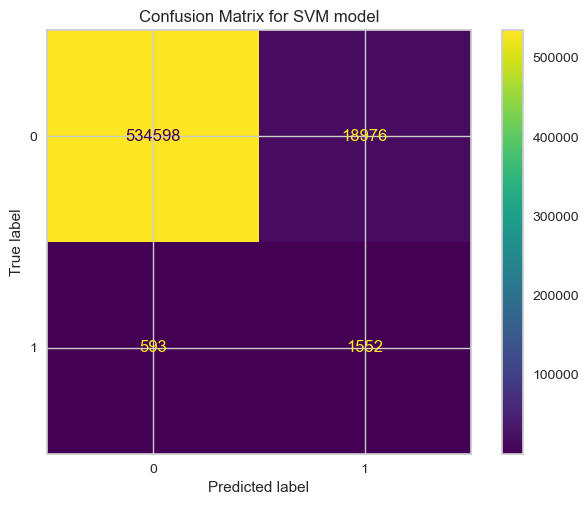

In [143]:
svm_cm = confusion_matrix(y_test, svm_pred)
display = ConfusionMatrixDisplay(svm_cm).plot()
plt.title("Confusion Matrix for SVM model")
plt.show()

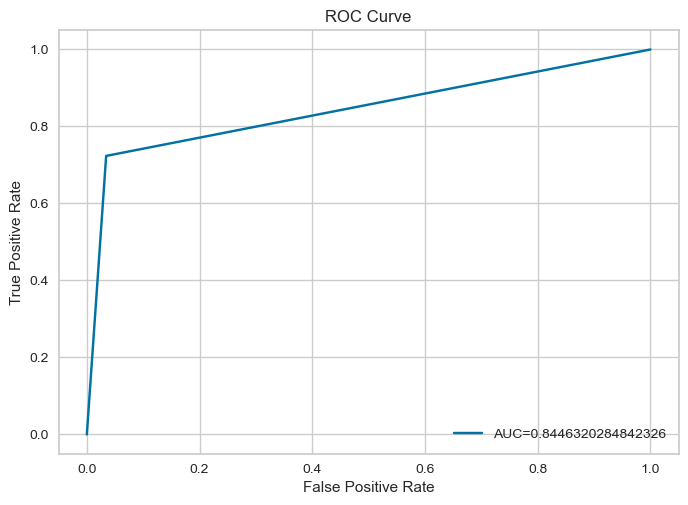

In [144]:
ROC_curve(y_test,svm_pred)

In [145]:
Accuracy['SVM']=accuracy_score(y_test,svm_pred)
Precision['SVM']=precision_score(y_test,svm_pred)
Recall['SVM']=recall_score(y_test,svm_pred)
F1_score['SVM']=f1_score(y_test,svm_pred)
models.append(svm_model)

####Gridsearch

In [146]:
svm_params =  [{'kernel': ['rbf'], 'gamma': [1e-2, 1e-3, 1e-4, 1e-5],
                 'C': [0.001, 0.10, 0.1, 10, 100]},
                {'kernel': ['sigmoid'], 'gamma': [1e-2, 1e-3, 1e-4, 1e-5],
                 'C': [0.001, 0.10, 0.1, 10, 100] },{'kernel': ['linear'], 'C': [0.001, 0.10, 0.1, 10, 100]}]  


In [147]:
svm_cv = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)
SVM_grid = GridSearchCV(estimator=svm_model, 
                 param_grid=svm_params, 
                 cv=svm_cv,   
                 scoring='recall') 
SVM_grid.fit(X_train, y_train)

GridSearchCV(cv=StratifiedKFold(n_splits=10, random_state=42, shuffle=True),
             estimator=SVC(),
             param_grid=[{'C': [0.001, 0.1, 0.1, 10, 100],
                          'gamma': [0.01, 0.001, 0.0001, 1e-05],
                          'kernel': ['rbf']},
                         {'C': [0.001, 0.1, 0.1, 10, 100],
                          'gamma': [0.01, 0.001, 0.0001, 1e-05],
                          'kernel': ['sigmoid']},
                         {'C': [0.001, 0.1, 0.1, 10, 100],
                          'kernel': ['linear']}],
             scoring='recall')

In [148]:
# summarize
print('Mean Accuracy: %.3f' % SVM_grid.best_score_)
print('parameters: %s' % SVM_grid.best_params_)

Mean Accuracy: 0.839
parameters: {'C': 100, 'gamma': 0.01, 'kernel': 'rbf'}


####Tuned SVM

In [149]:
tuned_svm_model = svm.SVC()
tuned_svm_model.fit(X_train, y_train)

SVC()

In [150]:
tuned_svm_pred = tuned_svm_model.predict(X_test)
print("Size of training set: ", X_test.shape)
print(tuned_svm_pred.shape)

Size of training set:  (555719, 12)
(555719,)


In [151]:
#Scoring the model on training_data
print(f'Training Accuracy\t: {tuned_svm_model.score(X_train, y_train)*100} %')

#Scoring the model on test_data
print(f'Testing Accuracy\t:  {tuned_svm_model.score(X_test, y_test)*100} %')

Training Accuracy	: 85.27844391153744 %
Testing Accuracy	:  96.4786159911754 %


In [152]:
accuracy_score(y_test, tuned_svm_pred)*100

96.4786159911754

In [153]:
print(classification_report(y_test, tuned_svm_pred))

              precision    recall  f1-score   support

           0       1.00      0.97      0.98    553574
           1       0.08      0.72      0.14      2145

    accuracy                           0.96    555719
   macro avg       0.54      0.84      0.56    555719
weighted avg       1.00      0.96      0.98    555719



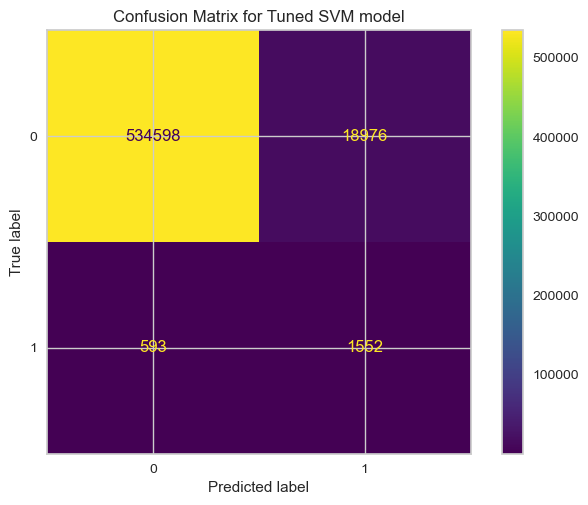

In [154]:
tuned_svm_cm = confusion_matrix(y_test, tuned_svm_pred)
display = ConfusionMatrixDisplay(tuned_svm_cm).plot()
plt.title("Confusion Matrix for Tuned SVM model")
plt.show()

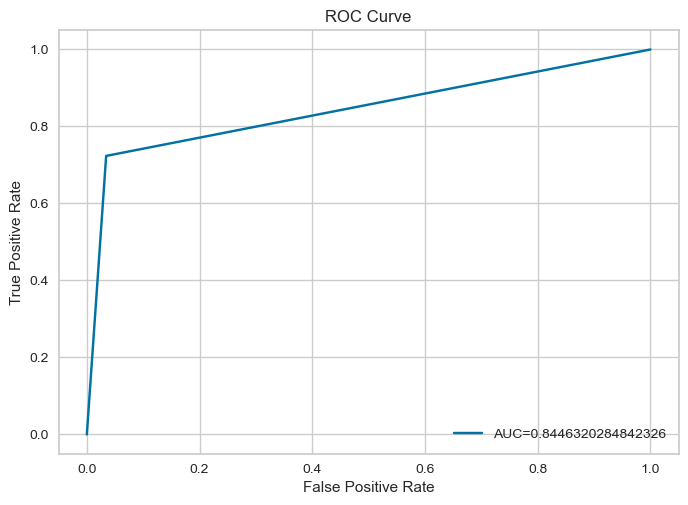

In [155]:
ROC_curve(y_test,tuned_svm_pred)

### GaussianNB

####Baseline

In [156]:
NB_model = GaussianNB()
NB_model.fit(X_train, y_train)
NB_pred = NB_model.predict(X_test)

In [157]:
#Scoring the model on training_data
print(f'Training Accuracy\t: {NB_model.score(X_train, y_train)*100:.3f} %')

#Scoring the model on test_data
print(f'Testing Accuracy\t:  {NB_model.score(X_test, y_test)*100:.3f} %')

Training Accuracy	: 84.626 %
Testing Accuracy	:  95.016 %


In [158]:
print(classification_report(y_test, NB_pred))

              precision    recall  f1-score   support

           0       1.00      0.95      0.97    553574
           1       0.05      0.73      0.10      2145

    accuracy                           0.95    555719
   macro avg       0.53      0.84      0.54    555719
weighted avg       1.00      0.95      0.97    555719



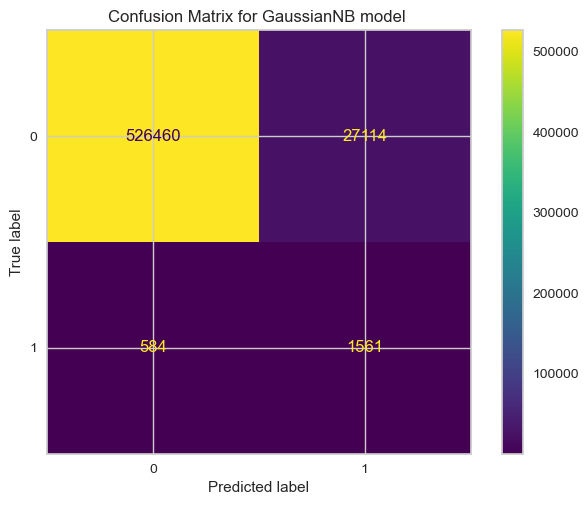

In [159]:
NB_cm = confusion_matrix(y_test, NB_pred)
display = ConfusionMatrixDisplay(NB_cm).plot()
plt.title(f"Confusion Matrix for GaussianNB model ")
plt.show()

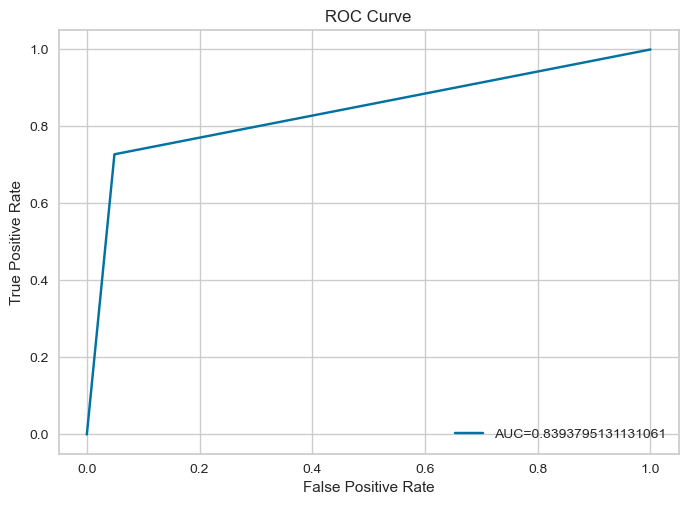

In [160]:
ROC_curve(y_test,NB_pred) #Area under Curve  to evaluate the quality of GaussianNB model

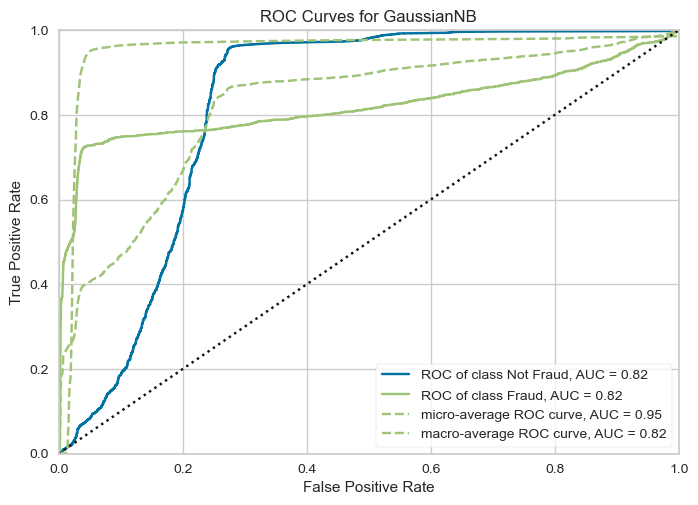

<AxesSubplot:title={'center':'ROC Curves for GaussianNB'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [161]:
visualizer = ROCAUC(NB_model, classes=["Not Fraud", "Fraud"])

visualizer.fit(X_train, y_train)        # Fit the training data to the visualizer
visualizer.score(X_test, y_test)        # Evaluate the model on the test data
visualizer.show()

In [162]:
Accuracy['GaussianNB']=accuracy_score(y_test,NB_pred)
Precision['GaussianNB']=precision_score(y_test,NB_pred)
Recall['GaussianNB']=recall_score(y_test,NB_pred)
F1_score['GaussianNB']=f1_score(y_test,NB_pred)
models.append(NB_model)

####Gridesearch

In [163]:
cv_nb = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)

NB_params = {'var_smoothing': [1e-2, 1e-3, 1e-4, 1e-5, 1e-6, 1e-7, 1e-8, 1e-9, 1e-10, 1e-11, 1e-12, 1e-13, 1e-14, 1e-15]}

NB_grid = GridSearchCV(estimator=NB_model, 
                 param_grid=NB_params, 
                 cv=cv_nb,   
                 scoring='recall') 
NB_grid.fit(X_train, y_train)


GridSearchCV(cv=StratifiedKFold(n_splits=10, random_state=42, shuffle=True),
             estimator=GaussianNB(),
             param_grid={'var_smoothing': [0.01, 0.001, 0.0001, 1e-05, 1e-06,
                                           1e-07, 1e-08, 1e-09, 1e-10, 1e-11,
                                           1e-12, 1e-13, 1e-14, 1e-15]},
             scoring='recall')

In [164]:
# summarize
print('Mean Accuracy: %.3f' % NB_grid.best_score_)
print('Best parameters: %s' % NB_grid.best_params_)

Mean Accuracy: 0.743
Best parameters: {'var_smoothing': 1e-06}


In [165]:
NB_results = pd.DataFrame(NB_grid.cv_results_['params'])
NB_results['test_score'] = NB_grid.cv_results_['mean_test_score']

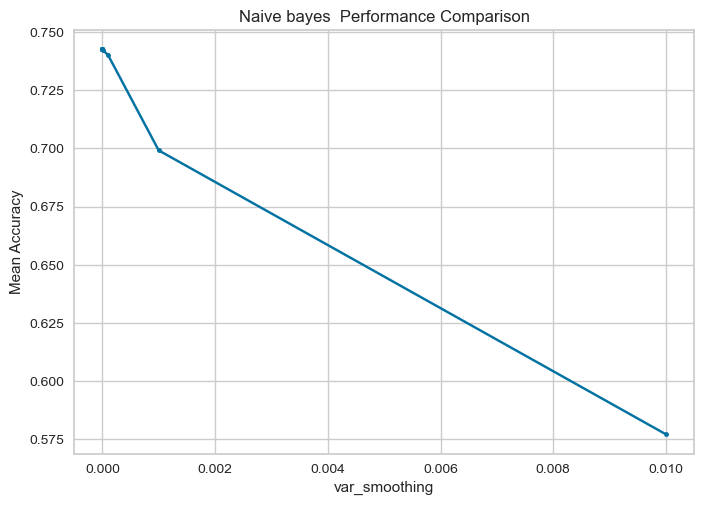

In [166]:
plt.plot(NB_results['var_smoothing'], NB_results['test_score'], marker = '.')    
plt.xlabel('var_smoothing')
plt.ylabel("Mean Accuracy")
plt.title("Naive bayes  Performance Comparison")
plt.show()

####Tuned Naive Bayes

In [167]:
tuned_NB_model = GaussianNB(var_smoothing=0.0001)
tuned_NB_model.fit(X_train, y_train)
tuned_NB_pred = tuned_NB_model.predict(X_test)

In [168]:
#Scoring the model on training_data
print(f'Training Accuracy\t: {tuned_NB_model.score(X_train, y_train)*100:.3f} %')

#Scoring the model on test_data
print(f'Testing Accuracy\t:  {tuned_NB_model.score(X_test, y_test)*100:.3f} %')

Training Accuracy	: 84.772 %
Testing Accuracy	:  95.493 %


In [169]:
print(classification_report(y_test, tuned_NB_pred))

              precision    recall  f1-score   support

           0       1.00      0.96      0.98    553574
           1       0.06      0.73      0.11      2145

    accuracy                           0.95    555719
   macro avg       0.53      0.84      0.54    555719
weighted avg       1.00      0.95      0.97    555719



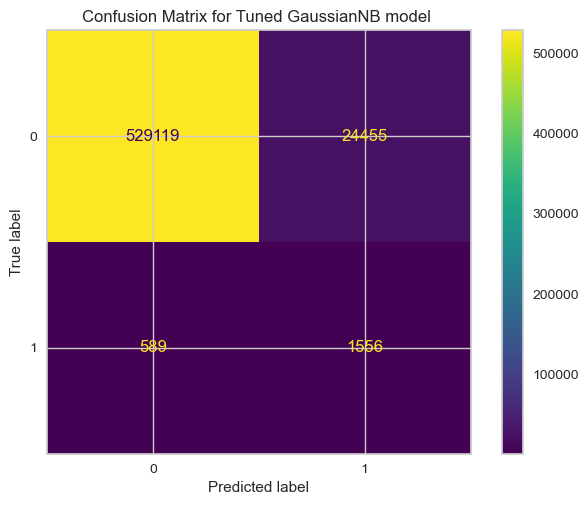

In [170]:
tuned_NB_cm = confusion_matrix(y_test, tuned_NB_pred)
display = ConfusionMatrixDisplay(tuned_NB_cm).plot()
plt.title(f"Confusion Matrix for Tuned GaussianNB model ")
plt.show()

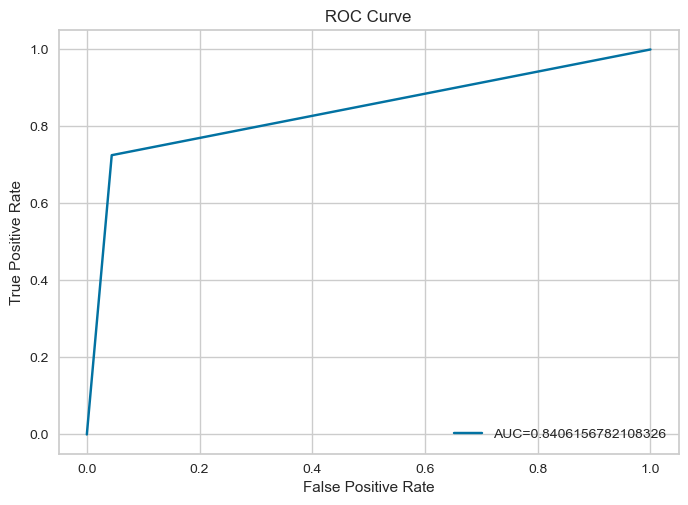

In [171]:
ROC_curve(y_test,tuned_NB_pred) #Area under Curve  to evaluate the quality of GaussianNB model

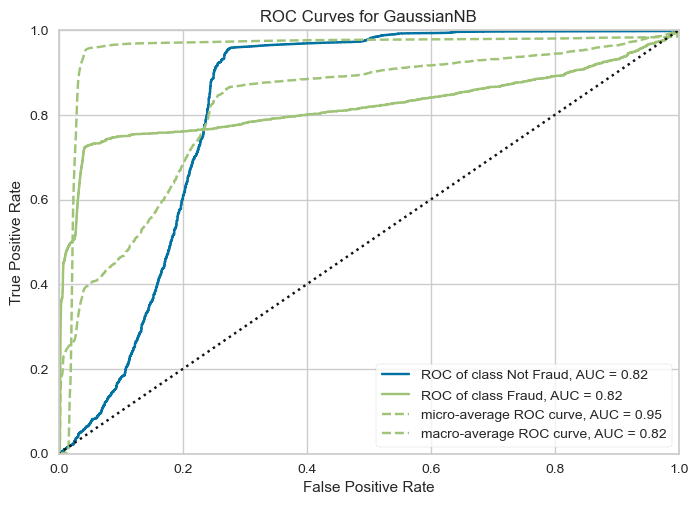

<AxesSubplot:title={'center':'ROC Curves for GaussianNB'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [172]:
visualizer = ROCAUC(tuned_NB_model, classes=["Not Fraud", "Fraud"])

visualizer.fit(X_train, y_train)        # Fit the training data to the visualizer
visualizer.score(X_test, y_test)        # Evaluate the model on the test data
visualizer.show()

### Decision Tree

####Basline

In [173]:
from sklearn.tree import DecisionTreeClassifier

In [174]:
DT_model =  DecisionTreeClassifier()
DT_model.fit(X_train, y_train)
DT_pred = DT_model.predict(X_test)

In [175]:
#Scoring the model on training_data
print(f'Training Accuracy\t: {DT_model.score(X_train, y_train)*100} %')

#Scoring the model on test_data
print(f'Testing Accuracy\t:  {DT_model.score(X_test, y_test)*100} %')

Training Accuracy	: 100.0 %
Testing Accuracy	:  92.37690271522119 %


In [176]:
print(classification_report(y_test, DT_pred))

              precision    recall  f1-score   support

           0       1.00      0.92      0.96    553574
           1       0.04      0.91      0.08      2145

    accuracy                           0.92    555719
   macro avg       0.52      0.92      0.52    555719
weighted avg       1.00      0.92      0.96    555719



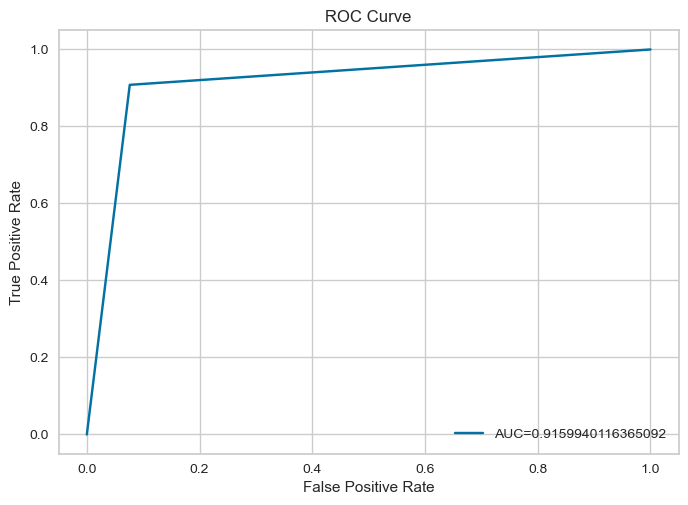

In [177]:
ROC_curve(y_test,DT_pred)#Area under Curve  to evaluate the quality of DT model AUC=80.95

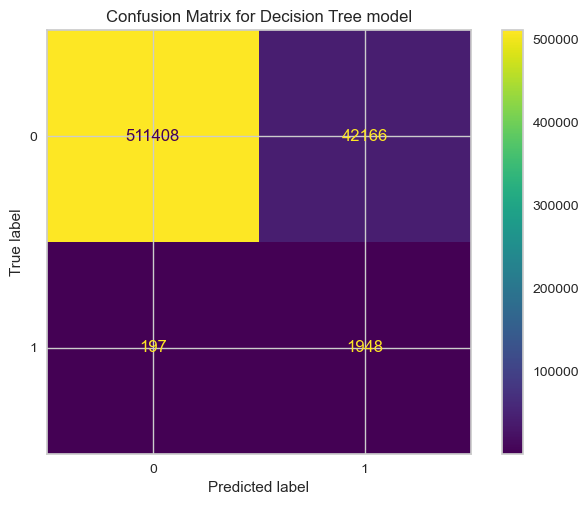

In [178]:
DT_cm = confusion_matrix(y_test, DT_pred)
display = ConfusionMatrixDisplay(DT_cm).plot()
plt.title(f"Confusion Matrix for Decision Tree model")
plt.show()

In [179]:
Accuracy['Decision Tree']=accuracy_score(y_test,DT_pred)
Precision['Decision Tree']=precision_score(y_test,DT_pred)
Recall['Decision Tree']=recall_score(y_test,DT_pred)
F1_score['Decision Tree']=f1_score(y_test,DT_pred)
models.append(DT_model)

####GrideSearch

In [180]:
tree_para = {'criterion':['gini','entropy'],'max_depth':[4,5,6,7,8,9,10,11,12,15,20,30,40,50,70,90,120,150]}
DT_cv = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)
DT_grid = GridSearchCV(DT_model, tree_para, cv=DT_cv,scoring='recall')
DT_grid.fit(X_train, y_train)

GridSearchCV(cv=StratifiedKFold(n_splits=10, random_state=42, shuffle=True),
             estimator=DecisionTreeClassifier(),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [4, 5, 6, 7, 8, 9, 10, 11, 12, 15, 20, 30,
                                       40, 50, 70, 90, 120, 150]},
             scoring='recall')

In [181]:
# summarize
print('Mean Accuracy: %.3f' % DT_grid.best_score_)
print('parameters: %s' % DT_grid.best_params_)

Mean Accuracy: 0.958
parameters: {'criterion': 'gini', 'max_depth': 8}


####Tuned Decision Tree

In [182]:
Tuned_DT_model =  DecisionTreeClassifier(criterion='gini',max_depth=10)
Tuned_DT_model.fit(X_train, y_train)
DT_tuned_pred = Tuned_DT_model.predict(X_test)

In [183]:
#Scoring the model on training_data
print(f'Training Accuracy\t: {Tuned_DT_model.score(X_train, y_train)*100} %')

#Scoring the model on test_data
print(f'Testing Accuracy\t:  {Tuned_DT_model.score(X_test, y_test)*100} %')

Training Accuracy	: 97.10231814548361 %
Testing Accuracy	:  91.72657404191686 %


In [184]:
print(classification_report(y_test, DT_tuned_pred))

              precision    recall  f1-score   support

           0       1.00      0.92      0.96    553574
           1       0.04      0.94      0.08      2145

    accuracy                           0.92    555719
   macro avg       0.52      0.93      0.52    555719
weighted avg       1.00      0.92      0.95    555719



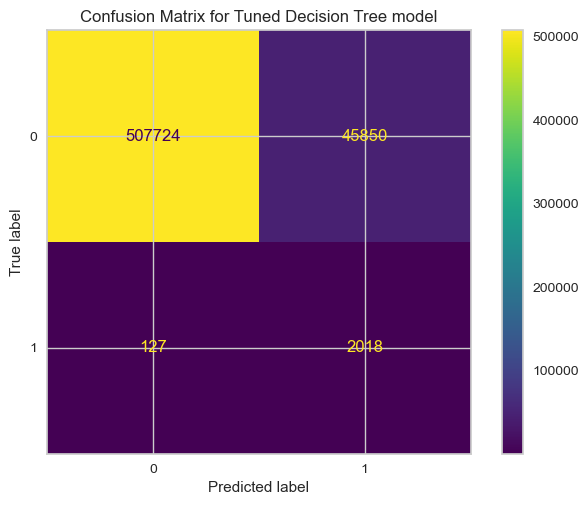

In [185]:
DT_tuned_cm = confusion_matrix(y_test, DT_tuned_pred)
display = ConfusionMatrixDisplay(DT_tuned_cm).plot()
plt.title(f"Confusion Matrix for Tuned Decision Tree model")
plt.show()

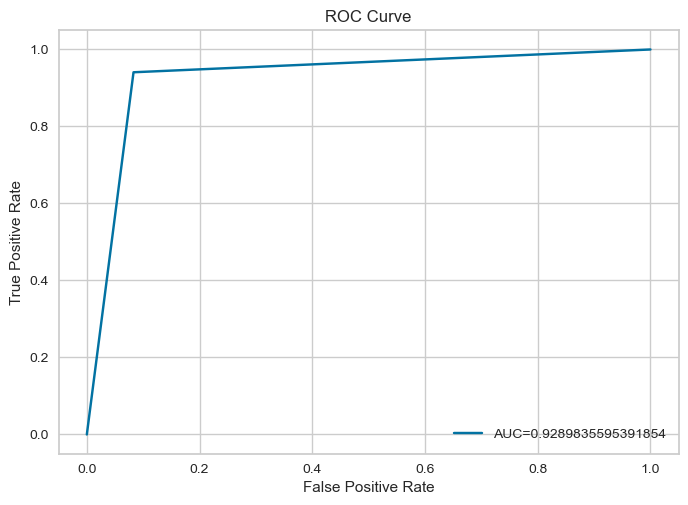

In [186]:
ROC_curve(y_test, DT_tuned_pred)

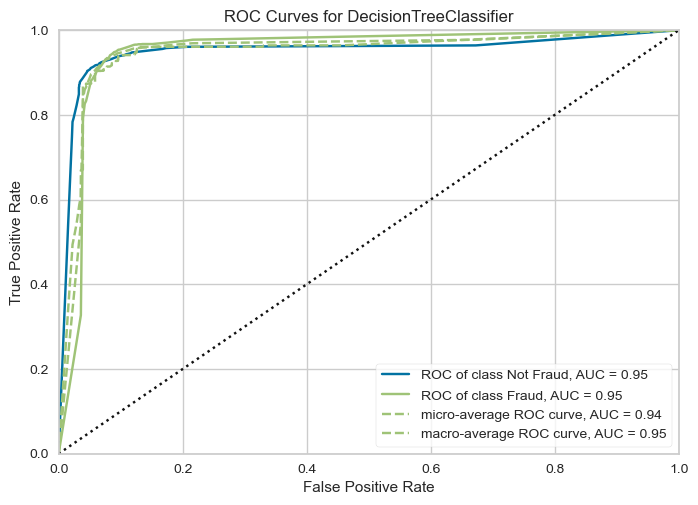

<AxesSubplot:title={'center':'ROC Curves for DecisionTreeClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [187]:
visualizer = ROCAUC(Tuned_DT_model, classes=["Not Fraud", "Fraud"])

visualizer.fit(X_train, y_train)        # Fit the training data to the visualizer
visualizer.score(X_test, y_test)        # Evaluate the model on the test data
visualizer.show()

### SGD Classifier

####Basline

In [188]:
from sklearn.linear_model import SGDClassifier
from sklearn.model_selection import cross_val_predict

In [189]:
#class_weight='balanced', penalty='l2', alpha=0.0001, max_iter=50, loss='log'

In [190]:
sgd_model = SGDClassifier()
sgd_model.fit(X_train, y_train)
sgd_pred=sgd_model.predict(X_test)

In [191]:
#Scoring the model on training_data
print(f'Training Accuracy\t: {sgd_model.score(X_train, y_train)*100} %')

#Scoring the model on test_data
print(f'Testing Accuracy\t:  {sgd_model.score(X_test, y_test)*100} %')

Training Accuracy	: 81.55475619504396 %
Testing Accuracy	:  96.62635252708654 %


In [192]:
print(classification_report(y_test, sgd_pred))

              precision    recall  f1-score   support

           0       1.00      0.97      0.98    553574
           1       0.08      0.73      0.14      2145

    accuracy                           0.97    555719
   macro avg       0.54      0.85      0.56    555719
weighted avg       1.00      0.97      0.98    555719



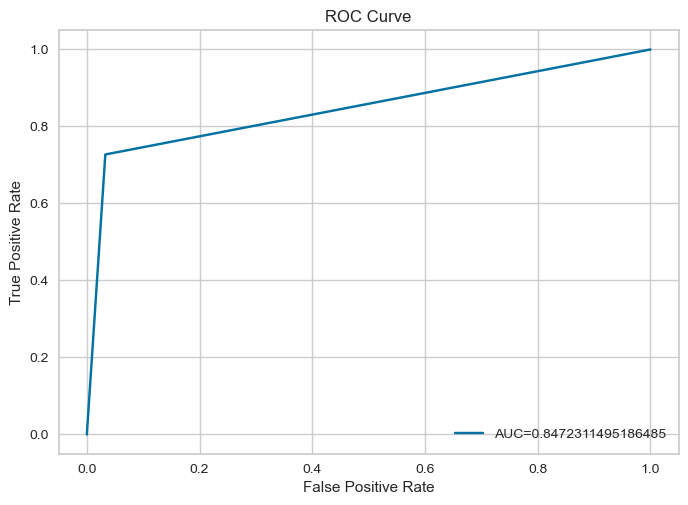

In [193]:
ROC_curve(y_test,sgd_pred)

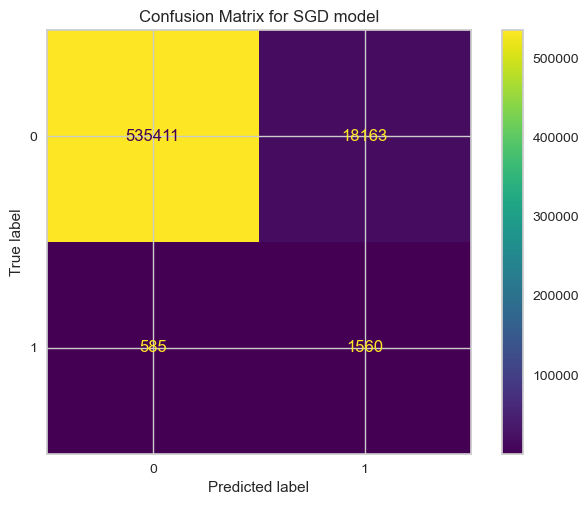

In [194]:
SGD_cm = confusion_matrix(y_test, sgd_pred)
display = ConfusionMatrixDisplay(SGD_cm).plot()
plt.title(f"Confusion Matrix for SGD model")
plt.show()

In [195]:
Accuracy['SGD classifier']=accuracy_score(y_test,sgd_pred)
Precision['SGD classifier']=precision_score(y_test,sgd_pred)
Recall['SGD classifier']=recall_score(y_test,sgd_pred)
F1_score['SGD classifier']=f1_score(y_test,sgd_pred)
models.append(sgd_model)

####Gridesearch

In [196]:
def show_params(searcher, grid_param_1, grid_param_2, name_param_1, name_param_2, rot=0):
    scores_mean = searcher.cv_results_['mean_test_score']
    scores_mean = np.array(scores_mean).reshape(len(grid_param_1), len(grid_param_2)).T

    print('Best params = {}'.format(searcher.best_params_))
    print('Best score = {}'.format(scores_mean.max()))

    _, ax = plt.subplots(1,1)

    # Param1 is the X-axis, Param 2 is represented as a different curve (color line)
    for idx, val in enumerate(grid_param_2):
        ax.plot(grid_param_1, scores_mean[idx, :], '-o', label=name_param_2 + ': ' + str(val))

    ax.tick_params(axis='x', rotation=rot)
    ax.set_title('Grid Search Scores')
    ax.set_xlabel(name_param_1)
    ax.set_ylabel('CV score')
    ax.legend(loc='best')
    ax.grid('on')

In [197]:
grid_params_1 = ['hinge', 'log', 'modified_huber', 'perceptron', 'huber', 'epsilon_insensitive']
grid_params_2 = ['l2', 'l1', 'elasticnet']
sgd_grid = GridSearchCV(SGDClassifier(max_iter=1000), param_grid = {'loss': grid_params_1,'penalty': grid_params_2},scoring='recall')
sgd_grid.fit(X_train, y_train)

C:\Users\hrelh\anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:173: FutureWarning:

The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.

C:\Users\hrelh\anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:173: FutureWarning:

The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.

C:\Users\hrelh\anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:173: FutureWarning:

The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.

C:\Users\hrelh\anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:173: FutureWarning:

The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.

C:\Users\hrelh\anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:173:

GridSearchCV(estimator=SGDClassifier(),
             param_grid={'loss': ['hinge', 'log', 'modified_huber',
                                  'perceptron', 'huber',
                                  'epsilon_insensitive'],
                         'penalty': ['l2', 'l1', 'elasticnet']},
             scoring='recall')

In [198]:
# summarize
print('Mean Accuracy: %.3f' % sgd_grid.best_score_)
print('parameters: %s' % sgd_grid.best_params_)

Mean Accuracy: 0.745
parameters: {'loss': 'modified_huber', 'penalty': 'elasticnet'}


Best params = {'loss': 'modified_huber', 'penalty': 'elasticnet'}
Best score = 0.7446030209775817


array([0.63816009, 0.74273822, 0.73367901, 0.70476061, 0.7368767 ,
       0.73621021, 0.68544086, 0.6745432 , 0.74460302, 0.67678609,
       0.57383058, 0.68796337, 0.66359276, 0.71822318, 0.72515261,
       0.73368043, 0.73008212, 0.55753448])

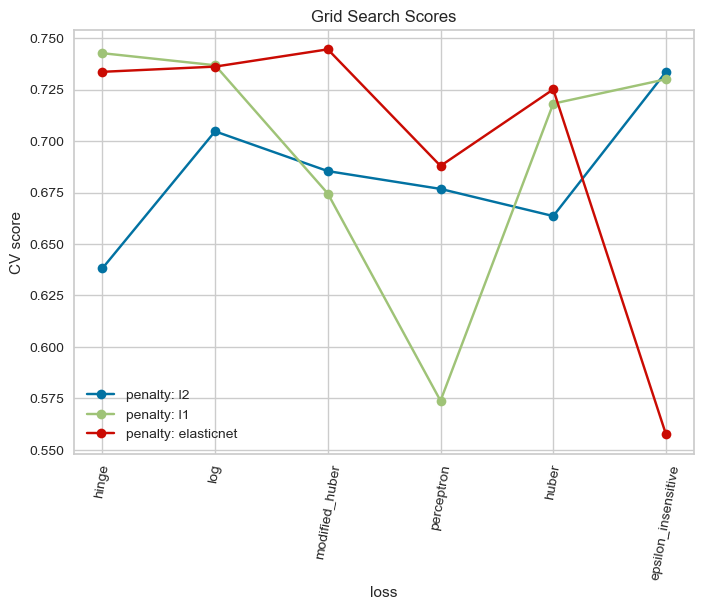

In [199]:
show_params(sgd_grid, grid_params_1, grid_params_2, 'loss', 'penalty', 80)
sgd_grid.cv_results_['mean_test_score']

####Tuned SGD

In [200]:
tuned_SGD_model = SGDClassifier(loss='log', penalty='l2')
tuned_SGD_model.fit(X_train, y_train)
SGD_tuned_pred = sgd_grid.predict(X_test)

C:\Users\hrelh\anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:173: FutureWarning:

The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.



In [201]:
print(f'Training Accuracy\t: {tuned_SGD_model.score(X_train, y_train)*100} %')

#Scoring the model on test_data
print(f'Testing Accuracy\t:  {tuned_SGD_model.score(X_test, y_test)*100} %')

Training Accuracy	: 81.25499600319745 %
Testing Accuracy	:  96.54825550323095 %


In [202]:
print(classification_report(y_test, SGD_tuned_pred)) #get the evalutions matrices for  LR

              precision    recall  f1-score   support

           0       1.00      0.95      0.97    553574
           1       0.05      0.75      0.10      2145

    accuracy                           0.95    555719
   macro avg       0.53      0.85      0.53    555719
weighted avg       1.00      0.95      0.97    555719



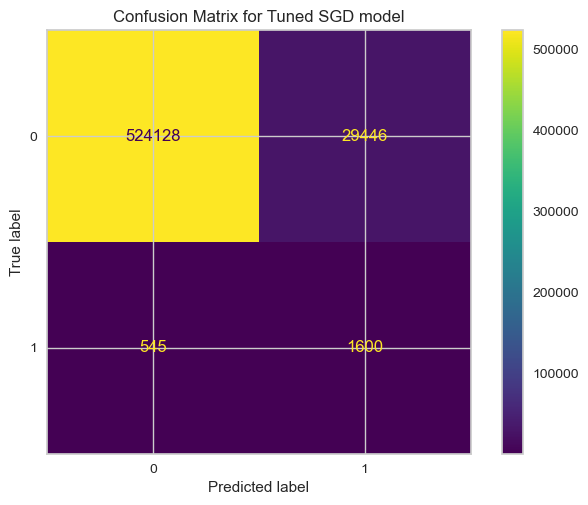

In [203]:
sgt_tuned_cm = confusion_matrix(y_test, SGD_tuned_pred)
display = ConfusionMatrixDisplay(sgt_tuned_cm).plot()
plt.title("Confusion Matrix for Tuned SGD model")
plt.show()

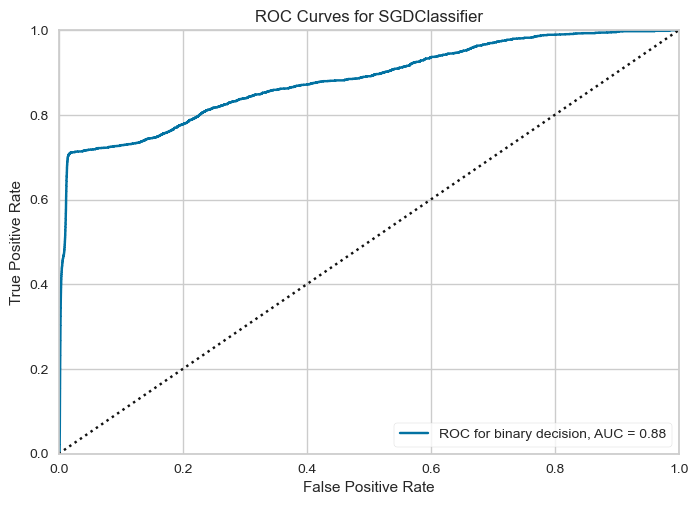

<AxesSubplot:title={'center':'ROC Curves for SGDClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [204]:
viz = ROCAUC(tuned_SGD_model, micro=False, macro=False, per_class=False)
viz.fit(X_train, y_train)
viz.score(X_test, y_test)
viz.poof()

### The Champoin Model

In [205]:
df_model = pd.DataFrame(index=['Logistic Regression','SVM','Gaussian NB','Decision Tree','SGD classifier'],
                        columns=['Accuracy', 'Precision', 'Recall','F1_Score'])
df_model['Accuracy'] = Accuracy.values()
df_model['Precision'] = Precision.values()
df_model['Recall'] = Recall.values()
df_model['F1_Score'] = F1_score.values()
df_model["roc_auc_score"] = [metrics.roc_auc_score(y_original_test, LR_y_pred),
                            metrics.roc_auc_score(y_original_test, svm_pred),
                            metrics.roc_auc_score(y_original_test, NB_pred),
                            metrics.roc_auc_score(y_original_test, DT_pred),
                            metrics.roc_auc_score(y_original_test, SGD_tuned_pred)]

df_model

,Accuracy,Precision,Recall,F1_Score,roc_auc_score
Logistic Regression,0.964399,0.074820,0.723543,0.135617,0.856759
SVM,0.964786,0.075604,0.723543,0.136903,0.844632
Gaussian NB,0.950158,0.054438,0.727739,0.101298,0.839380
Decision Tree,0.923769,0.044158,0.908159,0.084221,0.915994
SGD classifier,0.966264,0.079095,0.727273,0.142674,0.846364


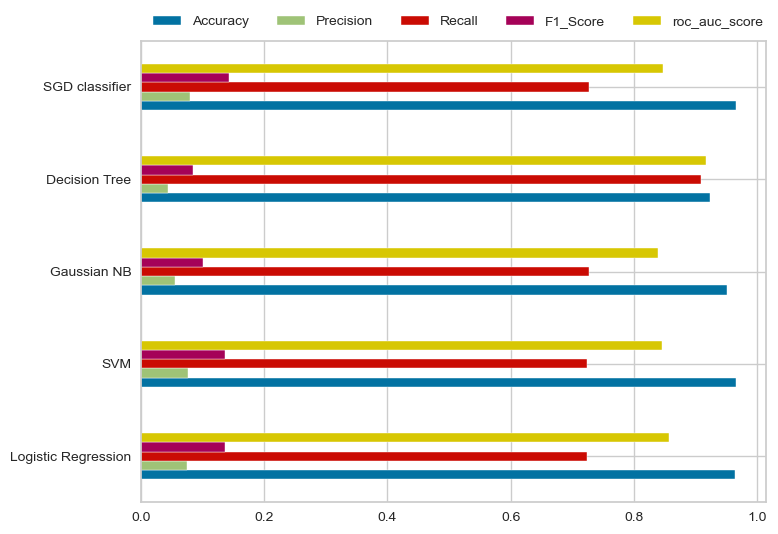

In [206]:
ax = df_model.plot.barh()
ax.legend(
    ncol=len(['Logistic Regression','SVM','Gaussian NB','Decision Tree','SGD classifier']), 
    bbox_to_anchor=(0, 1), 
    loc='lower left', 
    prop={'size': 10}
)
plt.tight_layout()

## Ensemble Techniques

### Random Forest Classifier

In [207]:
# initializa model
rf_clf = RandomForestClassifier(random_state=42)

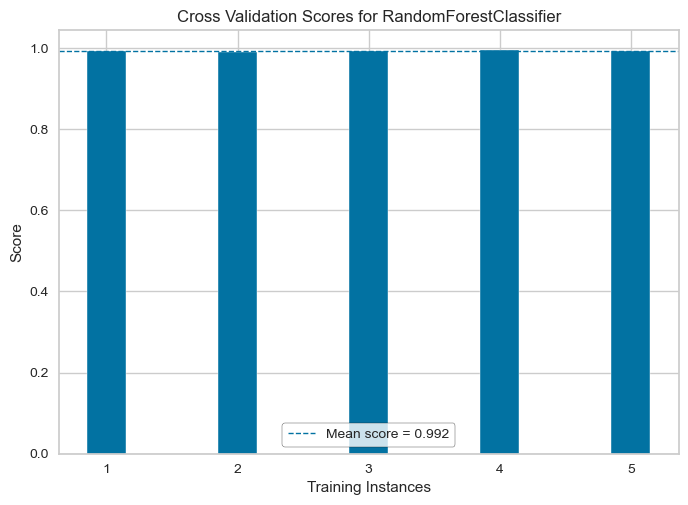

<AxesSubplot:title={'center':'Cross Validation Scores for RandomForestClassifier'}, xlabel='Training Instances', ylabel='Score'>

In [208]:
# yelowbrick cvscores
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
visualizer = CVScores(rf_clf, cv=cv, scoring='roc_auc')

visualizer.fit(X_train, y_train)        # Fit the data to the visualizer
visualizer.show()           # Finalize and render the figure

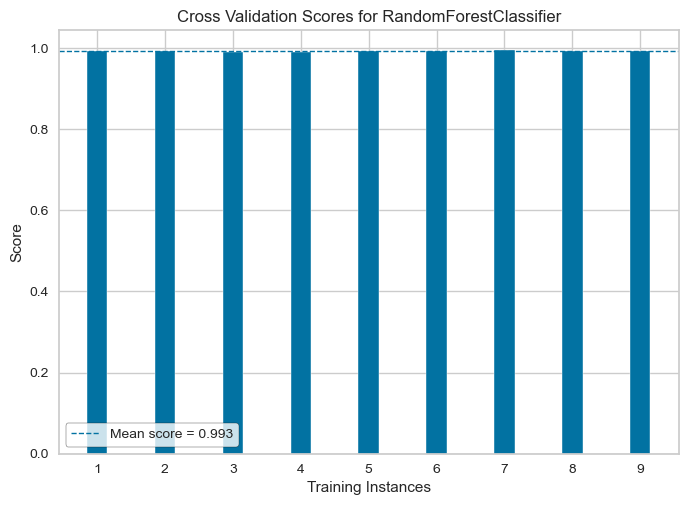

<AxesSubplot:title={'center':'Cross Validation Scores for RandomForestClassifier'}, xlabel='Training Instances', ylabel='Score'>

In [209]:
# yelowbrick cvscores
cv = StratifiedKFold(n_splits=9, shuffle=True, random_state=42)
visualizer = CVScores(rf_clf, cv=cv, scoring='roc_auc')

visualizer.fit(X_train, y_train)        # Fit the data to the visualizer
visualizer.show()           # Finalize and render the figure

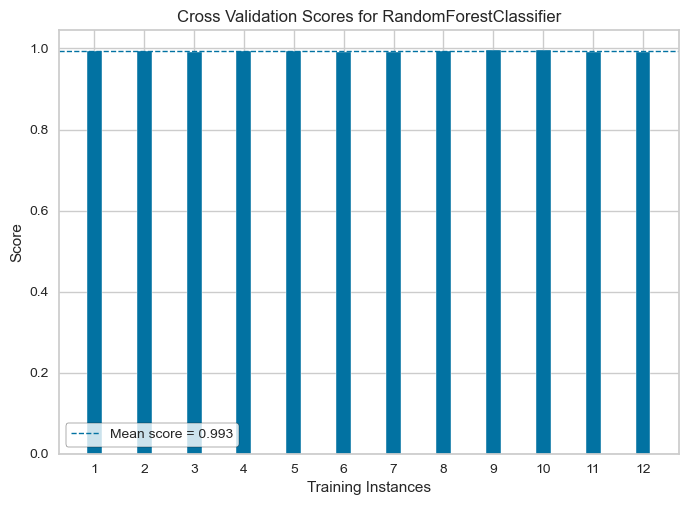

<AxesSubplot:title={'center':'Cross Validation Scores for RandomForestClassifier'}, xlabel='Training Instances', ylabel='Score'>

In [210]:
# yelowbrick cvscores
cv = StratifiedKFold(n_splits=12, shuffle=True, random_state=42)
visualizer = CVScores(rf_clf, cv=cv, scoring='roc_auc')

visualizer.fit(X_train, y_train)        # Fit the data to the visualizer
visualizer.show()           # Finalize and render the figure

In [211]:
# fit the model model
rf_clf.fit(X_train, y_train)

RandomForestClassifier(random_state=42)

In [212]:
# predict x test
rf_clf_y_pred = rf_clf.predict(X_test)

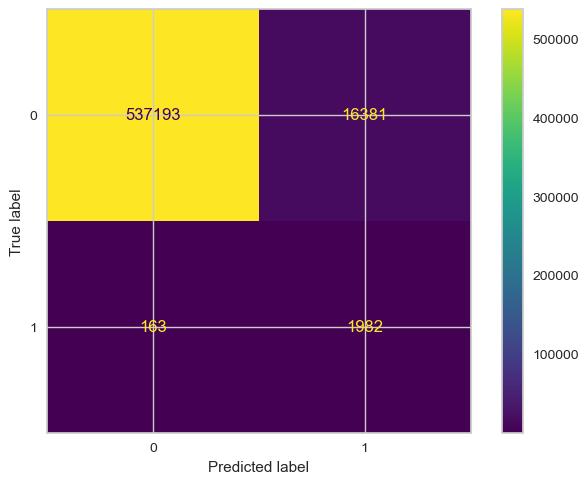

In [213]:
# plot Confusion Metrics
metrics.ConfusionMatrixDisplay.from_predictions(y_test, rf_clf_y_pred)

In [214]:
# print classification report
print(metrics.classification_report(y_test, rf_clf_y_pred))

              precision    recall  f1-score   support

           0       1.00      0.97      0.98    553574
           1       0.11      0.92      0.19      2145

    accuracy                           0.97    555719
   macro avg       0.55      0.95      0.59    555719
weighted avg       1.00      0.97      0.98    555719



In [215]:
# get roc_auc score
rf_clf_roc_auc_score = metrics.roc_auc_score(y_test, rf_clf_y_pred)
print("Random Forest Roc_AUC Score Is {}".format(rf_clf_roc_auc_score))

Random Forest Roc_AUC Score Is 0.9472089887974666


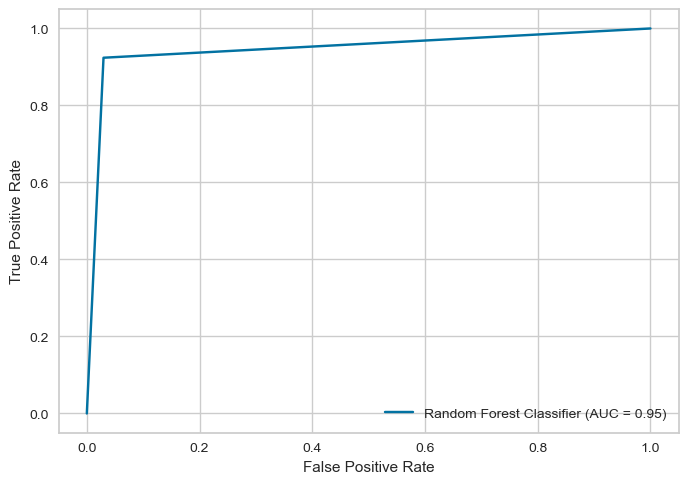

In [216]:
plot_roc_auc_curve(rf_clf_y_pred, "Random Forest Classifier")

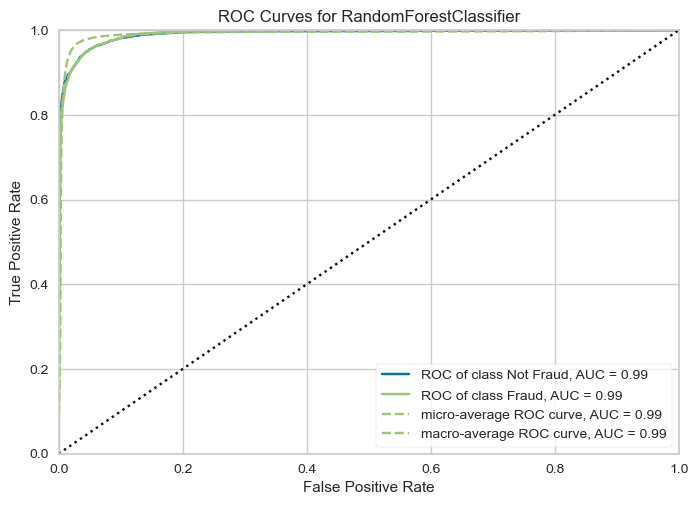

<AxesSubplot:title={'center':'ROC Curves for RandomForestClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [217]:
visualizer = ROCAUC(rf_clf, classes=["Not Fraud", "Fraud"])

visualizer.fit(X_train, y_train)        # Fit the training data to the visualizer
visualizer.score(X_test, y_test)        # Evaluate the model on the test data
visualizer.show()

### ExtraTreesClassifier

In [218]:
# initializa model
extra_trees_clf = ExtraTreesClassifier(random_state=42)

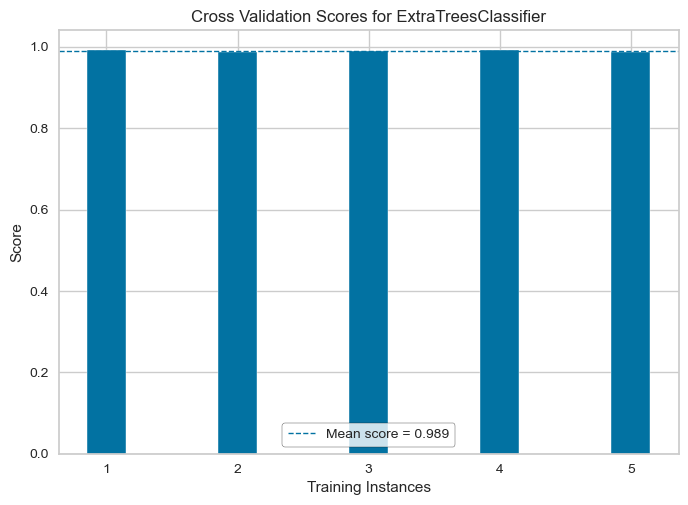

<AxesSubplot:title={'center':'Cross Validation Scores for ExtraTreesClassifier'}, xlabel='Training Instances', ylabel='Score'>

In [219]:
# yelowbrick cvscores
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
visualizer = CVScores(extra_trees_clf, cv=cv, scoring='roc_auc')

visualizer.fit(X_train, y_train)        # Fit the data to the visualizer
visualizer.show()           # Finalize and render the figure

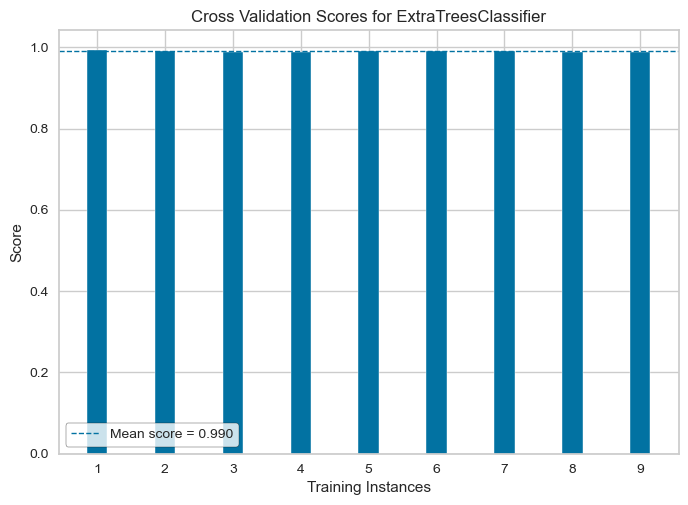

<AxesSubplot:title={'center':'Cross Validation Scores for ExtraTreesClassifier'}, xlabel='Training Instances', ylabel='Score'>

In [220]:
# yelowbrick cvscores
cv = StratifiedKFold(n_splits=9, shuffle=True, random_state=42)
visualizer = CVScores(extra_trees_clf, cv=cv, scoring='roc_auc')

visualizer.fit(X_train, y_train)        # Fit the data to the visualizer
visualizer.show()           # Finalize and render the figure

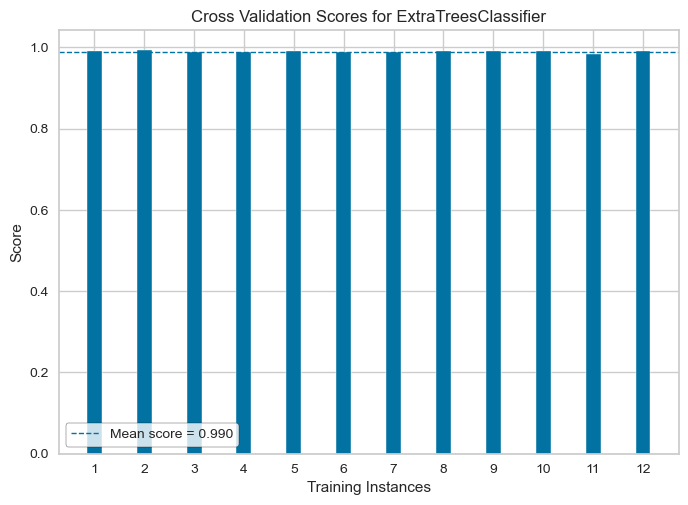

<AxesSubplot:title={'center':'Cross Validation Scores for ExtraTreesClassifier'}, xlabel='Training Instances', ylabel='Score'>

In [221]:
# yelowbrick cvscores
cv = StratifiedKFold(n_splits=12, shuffle=True, random_state=42)
visualizer = CVScores(extra_trees_clf, cv=cv, scoring='roc_auc')

visualizer.fit(X_train, y_train)        # Fit the data to the visualizer
visualizer.show()           # Finalize and render the figure

In [222]:
# fit the model model
extra_trees_clf.fit(X_train, y_train)

ExtraTreesClassifier(random_state=42)

In [223]:
# predict x test
extra_tress_clf_y_pred = extra_trees_clf.predict(X_test)

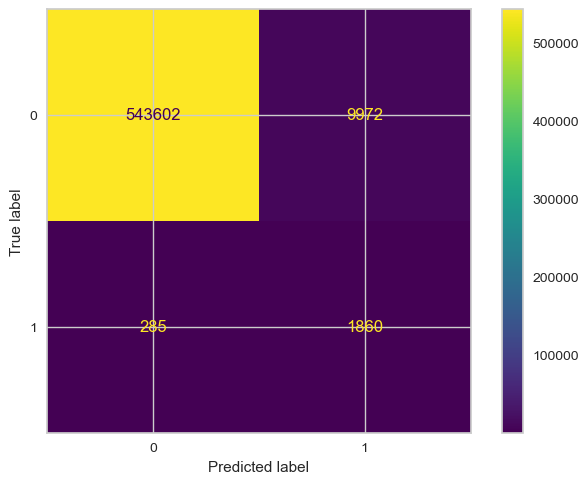

In [224]:
# plot Confusion Metrics
metrics.ConfusionMatrixDisplay.from_predictions(y_test, extra_tress_clf_y_pred)

In [225]:
# print classification report
print(metrics.classification_report(y_test, extra_tress_clf_y_pred))

              precision    recall  f1-score   support

           0       1.00      0.98      0.99    553574
           1       0.16      0.87      0.27      2145

    accuracy                           0.98    555719
   macro avg       0.58      0.92      0.63    555719
weighted avg       1.00      0.98      0.99    555719



In [226]:
# get roc_auc score
extra_trees_clf_roc_auc_score = metrics.roc_auc_score(y_test, extra_tress_clf_y_pred)
print("Extra Trees Roc_AUC Score Is {}".format(extra_trees_clf_roc_auc_score))

Extra Trees Roc_AUC Score Is 0.9245595076631216


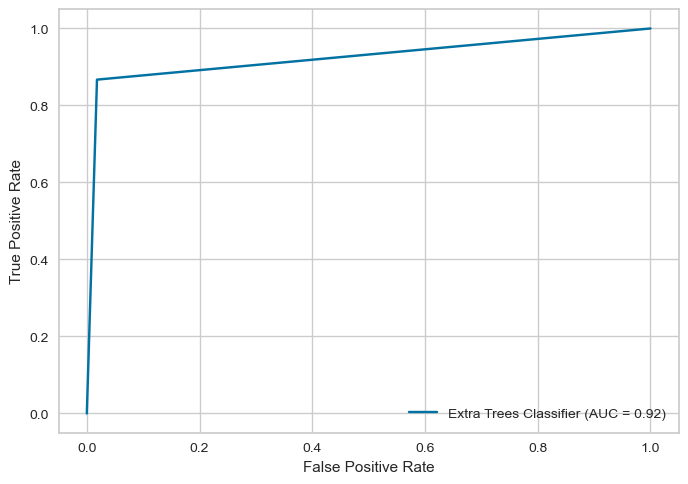

In [227]:
plot_roc_auc_curve(extra_tress_clf_y_pred, "Extra Trees Classifier")

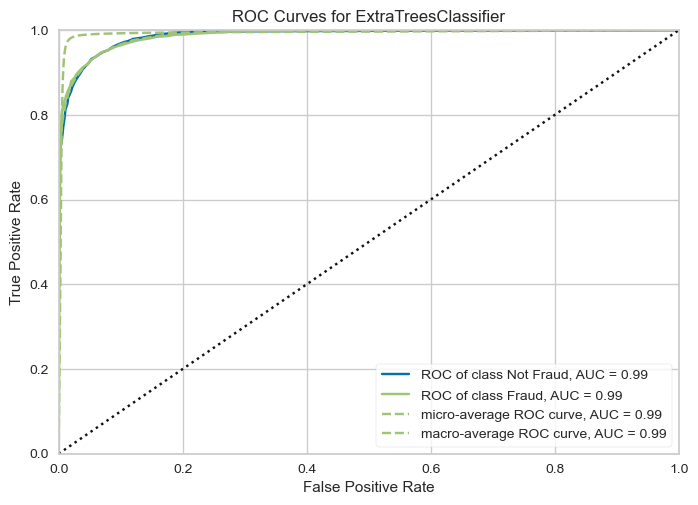

<AxesSubplot:title={'center':'ROC Curves for ExtraTreesClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [228]:
visualizer = ROCAUC(extra_trees_clf, classes=["Not Fraud", "Fraud"])

visualizer.fit(X_train, y_train)        # Fit the training data to the visualizer
visualizer.score(X_test, y_test)        # Evaluate the model on the test data
visualizer.show()

### XGBoost Classifier

In [229]:
# initializa model
xgb_clf = XGBClassifier(random_state=42)

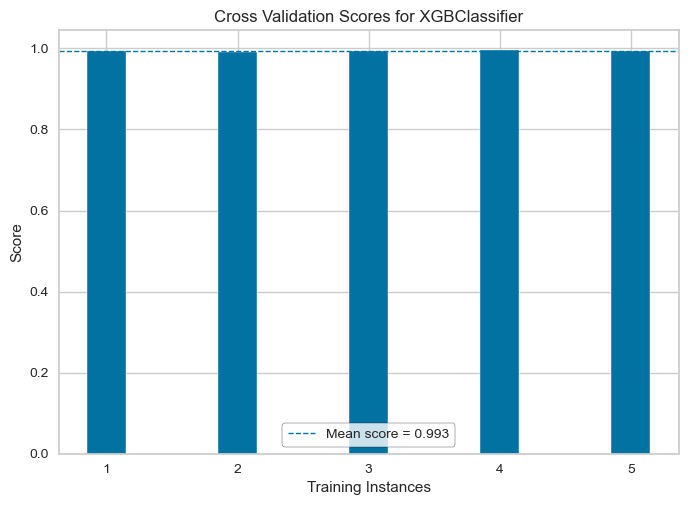

<AxesSubplot:title={'center':'Cross Validation Scores for XGBClassifier'}, xlabel='Training Instances', ylabel='Score'>

In [230]:
# yelowbrick cvscores
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
visualizer = CVScores(xgb_clf, cv=cv, scoring='roc_auc')

visualizer.fit(X_train, y_train)        # Fit the data to the visualizer
visualizer.show()           # Finalize and render the figure

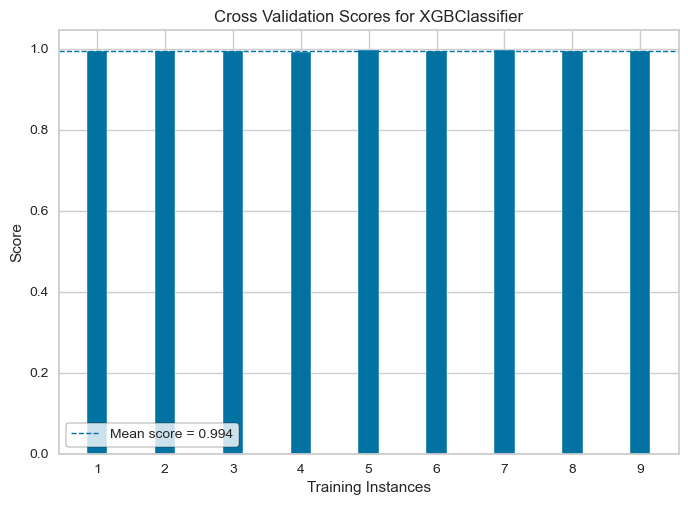

<AxesSubplot:title={'center':'Cross Validation Scores for XGBClassifier'}, xlabel='Training Instances', ylabel='Score'>

In [231]:
# yelowbrick cvscores
cv = StratifiedKFold(n_splits=9, shuffle=True, random_state=42)
visualizer = CVScores(xgb_clf, cv=cv, scoring='roc_auc')

visualizer.fit(X_train, y_train)        # Fit the data to the visualizer
visualizer.show()           # Finalize and render the figure

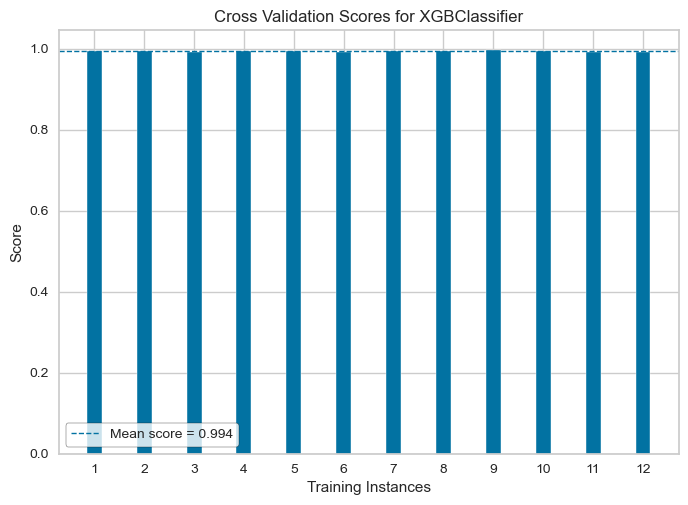

<AxesSubplot:title={'center':'Cross Validation Scores for XGBClassifier'}, xlabel='Training Instances', ylabel='Score'>

In [232]:
# yelowbrick cvscores
cv = StratifiedKFold(n_splits=12, shuffle=True, random_state=42)
visualizer = CVScores(xgb_clf, cv=cv, scoring='roc_auc')

visualizer.fit(X_train, y_train)        # Fit the data to the visualizer
visualizer.show()           # Finalize and render the figure

In [233]:
# fit the model model
xgb_clf.fit(X_train, y_train)

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=0, gpu_id=-1,
              grow_policy='depthwise', importance_type=None,
              interaction_constraints='', learning_rate=0.300000012,
              max_bin=256, max_cat_threshold=64, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=0, num_parallel_tree=1, predictor='auto', random_state=42, ...)

In [234]:
# predict x test
xgb_clf_y_pred = xgb_clf.predict(X_test)

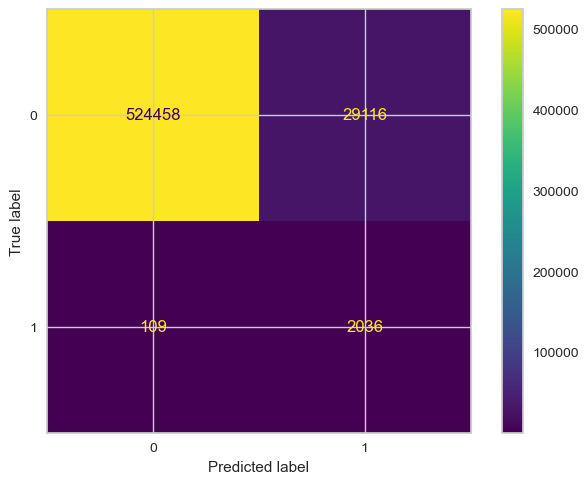

In [235]:
# plot Confusion Metrics
metrics.ConfusionMatrixDisplay.from_predictions(y_test, xgb_clf_y_pred)

In [236]:
# print classification report
print(metrics.classification_report(y_test, xgb_clf_y_pred))

              precision    recall  f1-score   support

           0       1.00      0.95      0.97    553574
           1       0.07      0.95      0.12      2145

    accuracy                           0.95    555719
   macro avg       0.53      0.95      0.55    555719
weighted avg       1.00      0.95      0.97    555719



In [237]:
# get roc_auc score
xgb_clf_roc_auc_score = metrics.roc_auc_score(y_test, xgb_clf_y_pred)
print("XGBoost Classifier Roc_AUC Score Is {}".format(xgb_clf_roc_auc_score))

XGBoost Classifier Roc_AUC Score Is 0.9482938741708121


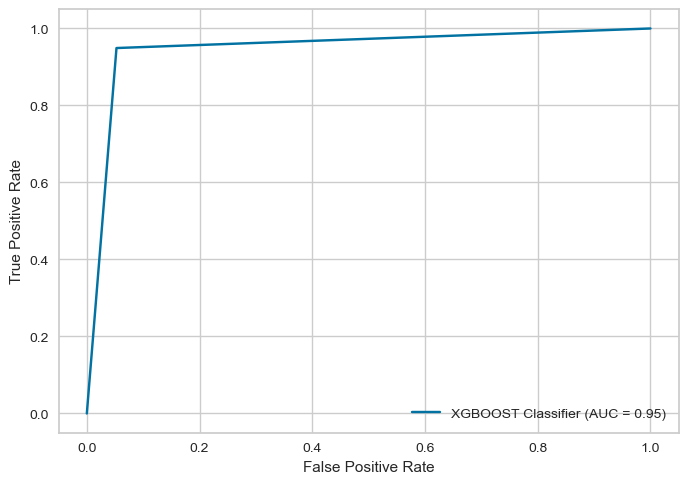

In [238]:
plot_roc_auc_curve(xgb_clf_y_pred, "XGBOOST Classifier")

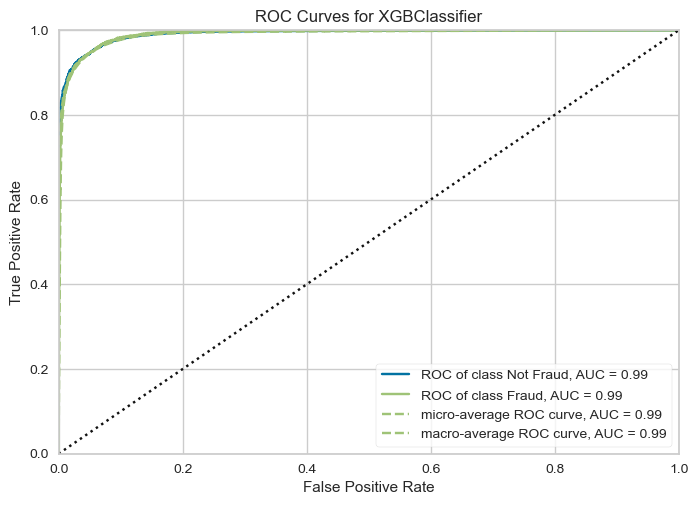

<AxesSubplot:title={'center':'ROC Curves for XGBClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [239]:
visualizer = ROCAUC(xgb_clf, classes=["Not Fraud", "Fraud"])

visualizer.fit(X_train, y_train)        # Fit the training data to the visualizer
visualizer.score(X_test, y_test)        # Evaluate the model on the test data
visualizer.show()

### LGBMClassifier

In [240]:
# initializa model
lgbm_clf = LGBMClassifier(random_state=42)

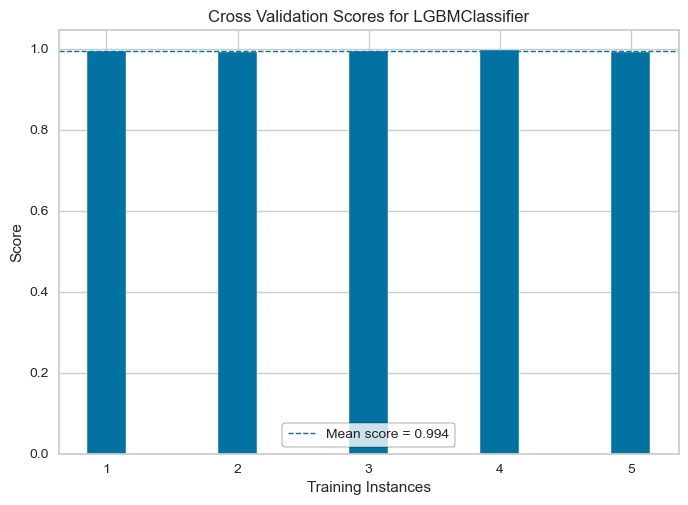

<AxesSubplot:title={'center':'Cross Validation Scores for LGBMClassifier'}, xlabel='Training Instances', ylabel='Score'>

In [241]:
# yelowbrick cvscores
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
visualizer = CVScores(lgbm_clf, cv=cv, scoring='roc_auc')

visualizer.fit(X_train, y_train)        # Fit the data to the visualizer
visualizer.show()           # Finalize and render the figure

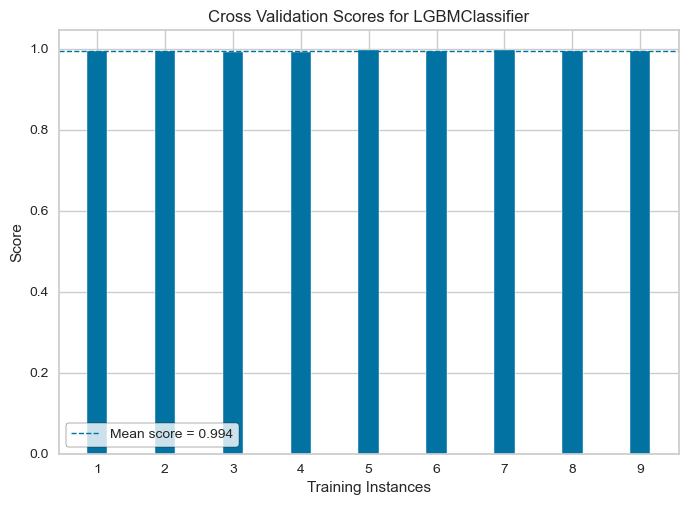

<AxesSubplot:title={'center':'Cross Validation Scores for LGBMClassifier'}, xlabel='Training Instances', ylabel='Score'>

In [242]:
# yelowbrick cvscores
cv = StratifiedKFold(n_splits=9, shuffle=True, random_state=42)
visualizer = CVScores(lgbm_clf, cv=cv, scoring='roc_auc')

visualizer.fit(X_train, y_train)        # Fit the data to the visualizer
visualizer.show()           # Finalize and render the figure

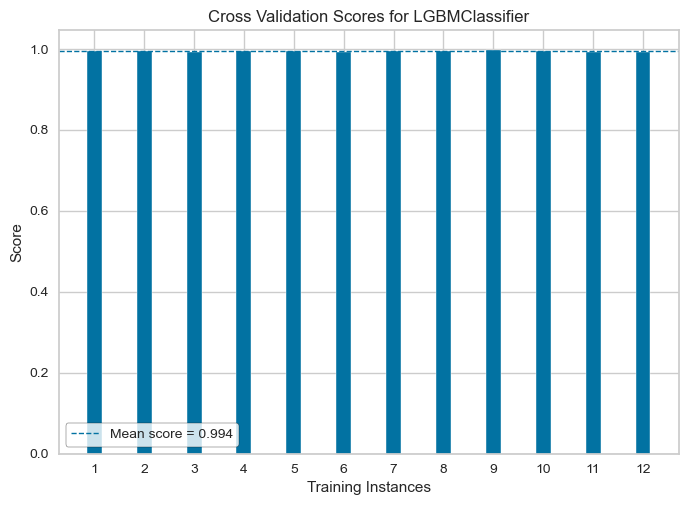

<AxesSubplot:title={'center':'Cross Validation Scores for LGBMClassifier'}, xlabel='Training Instances', ylabel='Score'>

In [243]:
# yelowbrick cvscores
cv = StratifiedKFold(n_splits=12, shuffle=True, random_state=42)
visualizer = CVScores(lgbm_clf, cv=cv, scoring='roc_auc')

visualizer.fit(X_train, y_train)        # Fit the data to the visualizer
visualizer.show()           # Finalize and render the figure

In [244]:
# fit the model model
lgbm_clf.fit(X_train, y_train)

LGBMClassifier(random_state=42)

In [245]:
# predict x test
lgbm_clf_y_pred = lgbm_clf.predict(X_test)

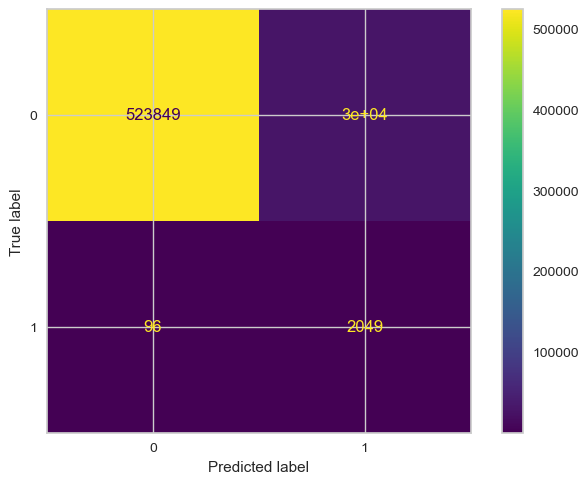

In [246]:
# plot Confusion Metrics
metrics.ConfusionMatrixDisplay.from_predictions(y_test, lgbm_clf_y_pred)

In [247]:
# print classification report
print(metrics.classification_report(y_test, lgbm_clf_y_pred))

              precision    recall  f1-score   support

           0       1.00      0.95      0.97    553574
           1       0.06      0.96      0.12      2145

    accuracy                           0.95    555719
   macro avg       0.53      0.95      0.55    555719
weighted avg       1.00      0.95      0.97    555719



In [248]:
# get roc_auc score
lgbm_clf_roc_auc_score = metrics.roc_auc_score(y_test, lgbm_clf_y_pred)
print("LGBMClassifier Roc_AUC Score Is {}".format(lgbm_clf_roc_auc_score))

LGBMClassifier Roc_AUC Score Is 0.9507741152401125


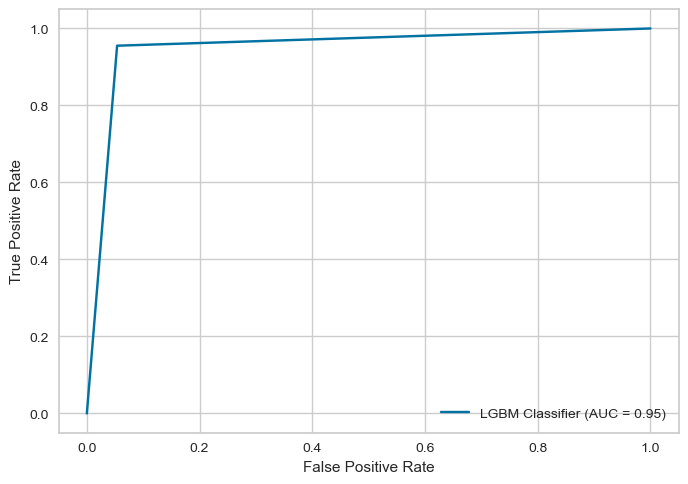

In [249]:
plot_roc_auc_curve(lgbm_clf_y_pred, "LGBM Classifier")

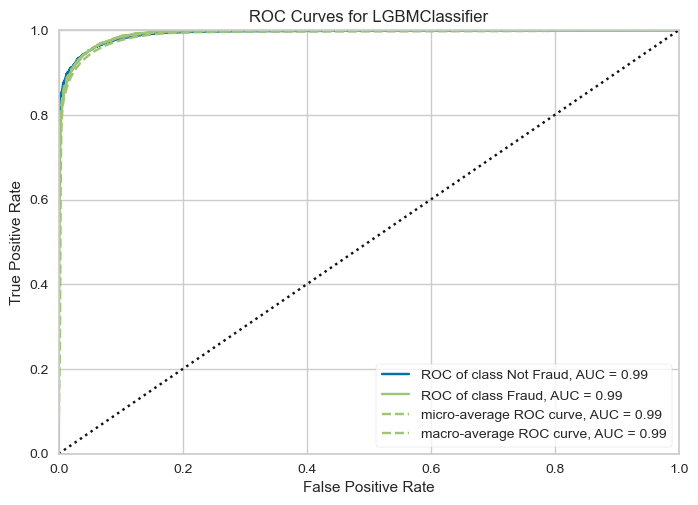

<AxesSubplot:title={'center':'ROC Curves for LGBMClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [250]:
visualizer = ROCAUC(lgbm_clf, classes=["Not Fraud", "Fraud"])

visualizer.fit(X_train, y_train)        # Fit the training data to the visualizer
visualizer.score(X_test, y_test)        # Evaluate the model on the test data
visualizer.show()

### HistGradientBoostingClassifier

In [251]:
# initializa model
hist_clf = HistGradientBoostingClassifier(random_state=42)

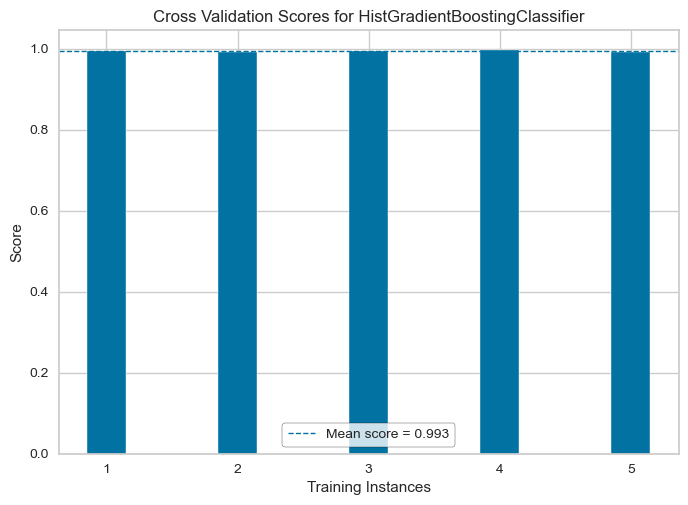

<AxesSubplot:title={'center':'Cross Validation Scores for HistGradientBoostingClassifier'}, xlabel='Training Instances', ylabel='Score'>

In [252]:
# yelowbrick cvscores
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
visualizer = CVScores(hist_clf, cv=cv, scoring='roc_auc')

visualizer.fit(X_train, y_train)        # Fit the data to the visualizer
visualizer.show()           # Finalize and render the figure

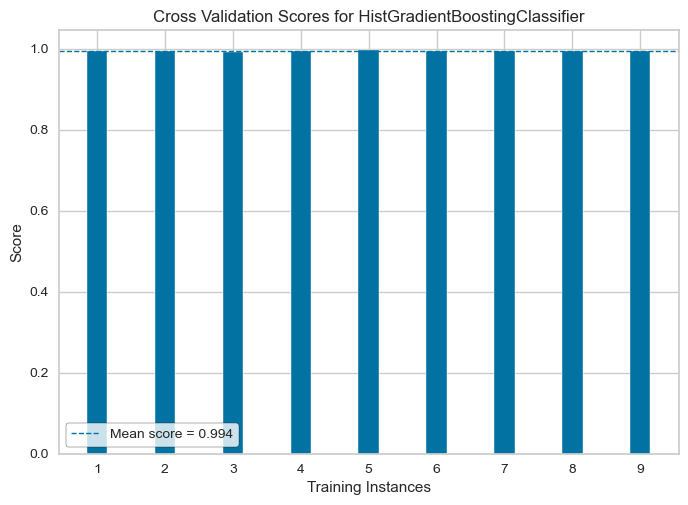

<AxesSubplot:title={'center':'Cross Validation Scores for HistGradientBoostingClassifier'}, xlabel='Training Instances', ylabel='Score'>

In [253]:
# yelowbrick cvscores
cv = StratifiedKFold(n_splits=9, shuffle=True, random_state=42)
visualizer = CVScores(hist_clf, cv=cv, scoring='roc_auc')

visualizer.fit(X_train, y_train)        # Fit the data to the visualizer
visualizer.show()           # Finalize and render the figure

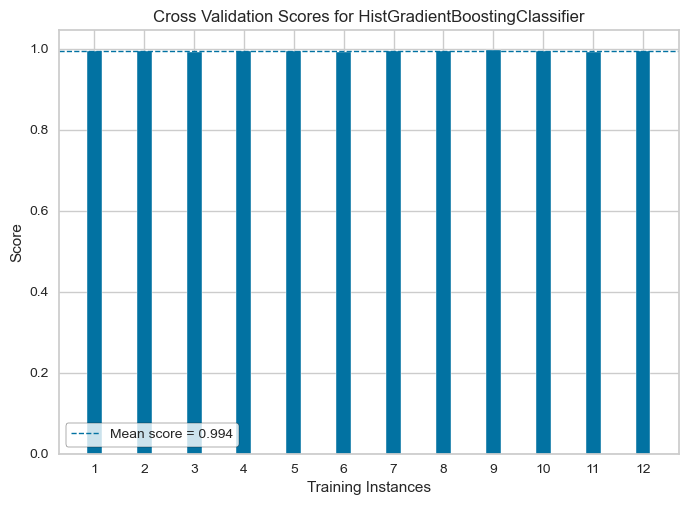

<AxesSubplot:title={'center':'Cross Validation Scores for HistGradientBoostingClassifier'}, xlabel='Training Instances', ylabel='Score'>

In [254]:
# yelowbrick cvscores
cv = StratifiedKFold(n_splits=12, shuffle=True, random_state=42)
visualizer = CVScores(hist_clf, cv=cv, scoring='roc_auc')

visualizer.fit(X_train, y_train)        # Fit the data to the visualizer
visualizer.show()           # Finalize and render the figure

In [255]:
# fit the model model
hist_clf.fit(X_train, y_train)

HistGradientBoostingClassifier(random_state=42)

In [256]:
# predict x test
hist_clf_y_pred = hist_clf.predict(X_test)

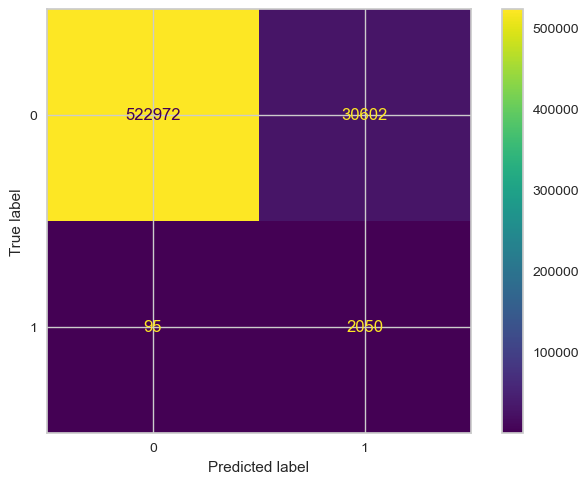

In [257]:
# plot Confusion Metrics
metrics.ConfusionMatrixDisplay.from_predictions(y_test, hist_clf_y_pred)

In [258]:
# print classification report
print(metrics.classification_report(y_test, hist_clf_y_pred))

              precision    recall  f1-score   support

           0       1.00      0.94      0.97    553574
           1       0.06      0.96      0.12      2145

    accuracy                           0.94    555719
   macro avg       0.53      0.95      0.54    555719
weighted avg       1.00      0.94      0.97    555719



In [259]:
# get roc_auc score
hist_clf_roc_auc_score = metrics.roc_auc_score(y_test, hist_clf_y_pred)
print("HistGradientBoosting Roc_AUC Score Is {}".format(hist_clf_roc_auc_score))

HistGradientBoosting Roc_AUC Score Is 0.9502150901205046


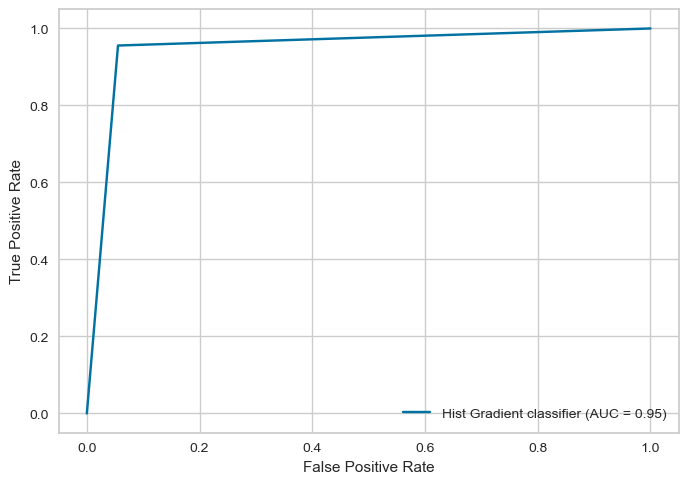

In [260]:
plot_roc_auc_curve(hist_clf_y_pred, "Hist Gradient classifier")

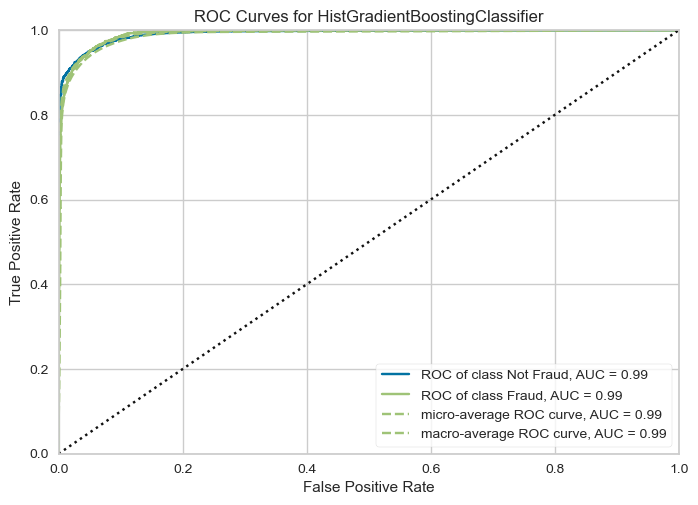

<AxesSubplot:title={'center':'ROC Curves for HistGradientBoostingClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [261]:
visualizer = ROCAUC(hist_clf, classes=["Not Fraud", "Fraud"])

visualizer.fit(X_train, y_train)        # Fit the training data to the visualizer
visualizer.score(X_test, y_test)        # Evaluate the model on the test data
visualizer.show()

### Voting Classifier

In [262]:
# initializa model
vot_clf = VotingClassifier(estimators=[
    ("RandomForest", RandomForestClassifier()),
    ("XGBoost", XGBClassifier()),
    ("HistGradientBoosting", HistGradientBoostingClassifier())
])

In [263]:
# fit the model model
vot_clf.fit(X_train, y_train)

VotingClassifier(estimators=[('RandomForest', RandomForestClassifier()),
                             ('XGBoost',
                              XGBClassifier(base_score=None, booster=None,
                                            callbacks=None,
                                            colsample_bylevel=None,
                                            colsample_bynode=None,
                                            colsample_bytree=None,
                                            early_stopping_rounds=None,
                                            enable_categorical=False,
                                            eval_metric=None,
                                            feature_types=None, gamma=None,
                                            gpu_id=None, grow_policy=None,
                                            importance_type...
                                            interaction_constraints=None,
                                            learning_rate=None, max_bin=None,
                                            max_cat_threshold=None,
                                            max_cat_to_onehot=None,
                                            max_delta_step=None, max_depth=None,
                                            max_leaves=None,
                                            min_child_weight=None, missing=nan,
                                            monotone_constraints=None,
                                            n_estimators=100, n_jobs=None,
                                            num_parallel_tree=None,
                                            predictor=None, random_state=None, ...)),
                             ('HistGradientBoosting',
                              HistGradientBoostingClassifier())])

In [264]:
# predict x test
vot_clf_y_pred = lgbm_clf.predict(X_test)

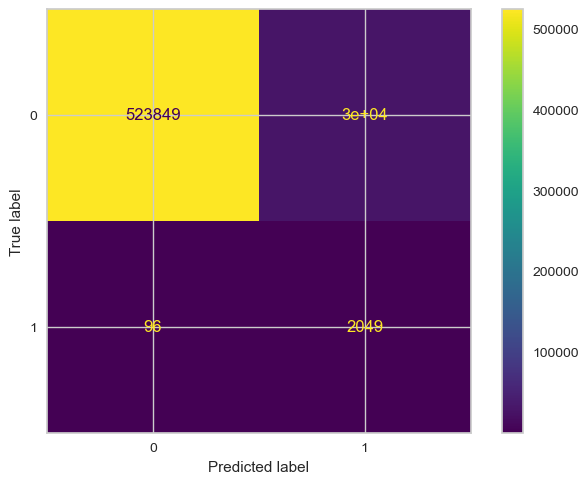

In [265]:
# plot Confusion Metrics
metrics.ConfusionMatrixDisplay.from_predictions(y_test, vot_clf_y_pred)

In [266]:
# print classification report
print(metrics.classification_report(y_test, vot_clf_y_pred))

              precision    recall  f1-score   support

           0       1.00      0.95      0.97    553574
           1       0.06      0.96      0.12      2145

    accuracy                           0.95    555719
   macro avg       0.53      0.95      0.55    555719
weighted avg       1.00      0.95      0.97    555719



In [267]:
# get roc_auc score
vot_clf_roc_auc_score = metrics.roc_auc_score(y_test, vot_clf_y_pred)
print("LGBMClassifier Roc_AUC Score Is {}".format(vot_clf_roc_auc_score))

LGBMClassifier Roc_AUC Score Is 0.9507741152401125


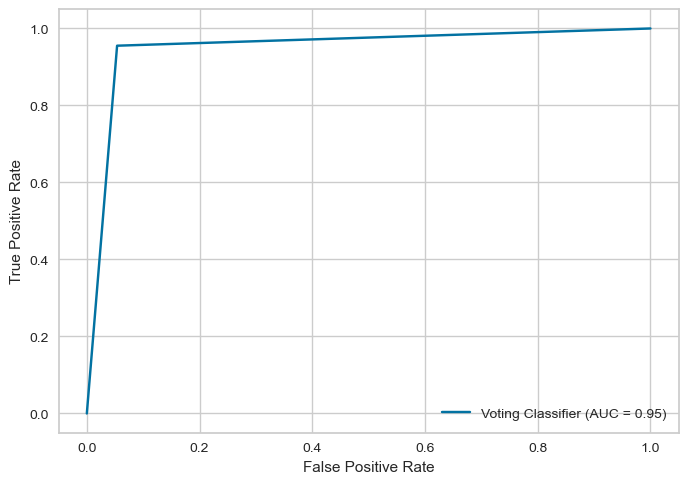

In [268]:
plot_roc_auc_curve(vot_clf_y_pred, "Voting Classifier")

### Compare Between Ensemble Models

In [269]:
# initialize Parameters
ensemble_models = [
    'RandomForest',
    'ExtraTrees',
    'XGBoost',
    'LGBM',
    'HistGradientBoostin',
    'Voting'
]
ensembe_models_roc_auc_score = [
    rf_clf_roc_auc_score,
    extra_trees_clf_roc_auc_score,
    xgb_clf_roc_auc_score,
    lgbm_clf_roc_auc_score,
    hist_clf_roc_auc_score,
    vot_clf_roc_auc_score
]

In [319]:
ensembe_models_roc_auc_score

[0.9472089887974666,
 0.9245595076631216,
 0.9482938741708121,
 0.9507741152401125,
 0.9502150901205046,
 0.9507741152401125]

In [270]:
# Plot The Result Using Plotly
px.bar(x=ensemble_models, y=ensembe_models_roc_auc_score, color=ensemble_models, title="Ensemble Models").update_layout(
    xaxis_title="Models", 
    yaxis_title="Roc_Auc_Score"
)

Text(0, 0.5, 'Roc_Auc_Score')

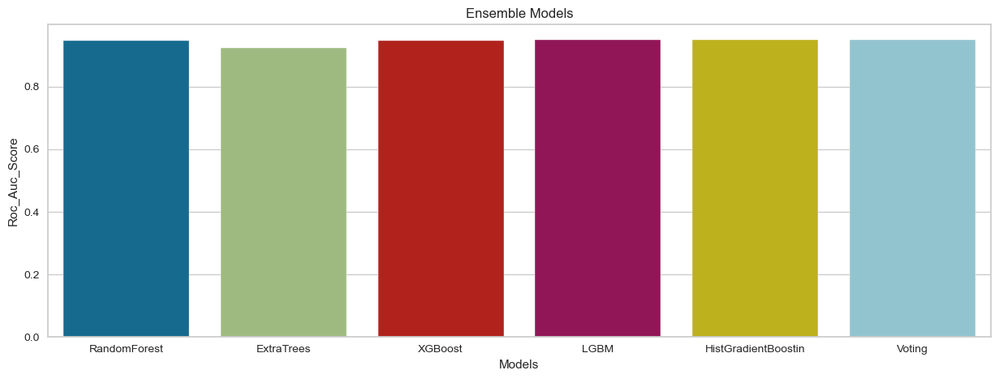

In [271]:
# plot using seaborn
plt.figure(figsize=(15, 5))
plt.title('Ensemble Models')
sns.barplot(x=ensemble_models, y=ensembe_models_roc_auc_score)
plt.xlabel("Models")
plt.ylabel("Roc_Auc_Score")

### Tune The best Model ['LGBM Classifier']

In [321]:
# Tune Learning Rate
lr_list = [0.1, 0.01, 0.001, 0.3, 0.03, 0.003, 0.9, 0.09, 0.009]
lr_list_str = ['0.1', '0.01', '0.001', '0.3', '0.03', '0.003', '0.9', '0.09', '0.009']
lr_roc_score = []
for i in tqdm(lr_list):
    model = LGBMClassifier(random_state=42, learning_rate=i)
    model.fit(X_train, y_train)
    model_y_pred = model.predict(X_test)
    lr_roc_score.append(metrics.roc_auc_score(y_test, model_y_pred))

100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:06<00:00,  1.39it/s]


In [322]:
lr_roc_score

[0.9507741152401125,
 0.9427230904532946,
 0.9373722729897334,
 0.9472061245954168,
 0.9495766615047867,
 0.9388065889077498,
 0.8527990121880007,
 0.9502410127912772,
 0.9413064246224763]

<AxesSubplot:>

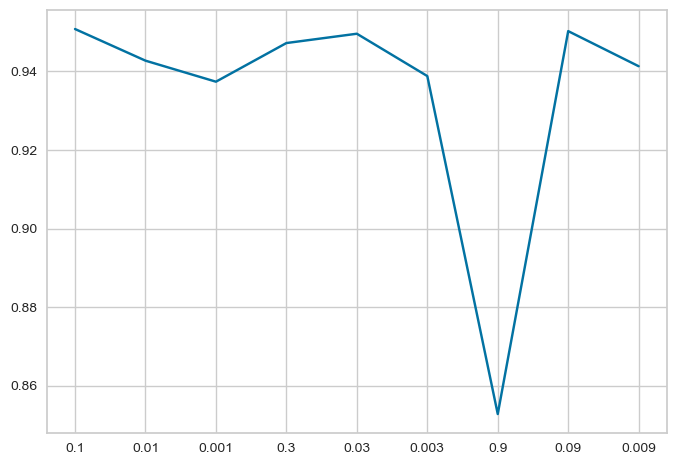

In [323]:
# plot The result
sns.lineplot(x=lr_list_str, y=lr_roc_score)

In [324]:
lr_roc_score[np.argmax(lr_roc_score)]

0.9507741152401125

### Ensemble Learning Conclusion
The Best Model Is LGBM Classifier with learning rate of '0.1' and The Roc_Auc Score is '0.9525143415801215'

## Neural Network

In [275]:
#set AdamW as optimizer
Adamw_learning_rate = 0.001
optimizer_Adamw =AdamW(learning_rate=Adamw_learning_rate , weight_decay=.00001)

In [276]:
#set neural network parameters
num_classes=2
features= X_train.shape[1]
num_epochs = 500
batch_size = 64
verbose = 1

In [277]:
# Create the model
model = Sequential()
#hidden layer
model.add(Dense(10, input_shape=(features,), activation='relu'))
model.add(Dense(8, activation='relu'))
model.add(Dense(5, activation='relu'))
#Output layer
model.add(Dense(num_classes, activation='sigmoid'))
print(model.summary())

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 10)                130       
                                                                 
 dense_1 (Dense)             (None, 8)                 88        
                                                                 
 dense_2 (Dense)             (None, 5)                 45        
                                                                 
 dense_3 (Dense)             (None, 2)                 12        
                                                                 
Total params: 275
Trainable params: 275
Non-trainable params: 0
_________________________________________________________________
None


In [278]:
model.compile(loss='sparse_categorical_crossentropy', optimizer=optimizer_Adamw, metrics=['accuracy'])

# fit the keras model on the dataset
model_fit = model.fit(X_train, y_train, epochs= num_epochs, batch_size= batch_size, verbose=verbose)

Epoch 1/500
235/235 [==============================] - 1s 1ms/step - loss: 0.5075 - accuracy: 0.7920
Epoch 2/500
235/235 [==============================] - 0s 983us/step - loss: 0.3959 - accuracy: 0.8510
Epoch 3/500
235/235 [==============================] - 0s 980us/step - loss: 0.3686 - accuracy: 0.8538
Epoch 4/500
235/235 [==============================] - 0s 980us/step - loss: 0.3531 - accuracy: 0.8550
Epoch 5/500
235/235 [==============================] - 0s 963us/step - loss: 0.3355 - accuracy: 0.8595
Epoch 6/500
235/235 [==============================] - 0s 976us/step - loss: 0.3206 - accuracy: 0.8626
Epoch 7/500
235/235 [==============================] - 0s 972us/step - loss: 0.3100 - accuracy: 0.8650
Epoch 8/500
235/235 [==============================] - 0s 984us/step - loss: 0.3018 - accuracy: 0.8675
Epoch 9/500
235/235 [==============================] - 0s 977us/step - loss: 0.2943 - accuracy: 0.8701
Epoch 10/500
235/235 [==============================] - 0s 968us/step - los

235/235 [==============================] - 0s 972us/step - loss: 0.1957 - accuracy: 0.9131
Epoch 80/500
235/235 [==============================] - 0s 957us/step - loss: 0.1939 - accuracy: 0.9136
Epoch 81/500
235/235 [==============================] - 0s 960us/step - loss: 0.1955 - accuracy: 0.9145
Epoch 82/500
235/235 [==============================] - 0s 970us/step - loss: 0.1940 - accuracy: 0.9153
Epoch 83/500
235/235 [==============================] - 0s 950us/step - loss: 0.1940 - accuracy: 0.9132
Epoch 84/500
235/235 [==============================] - 0s 958us/step - loss: 0.1941 - accuracy: 0.9141
Epoch 85/500
235/235 [==============================] - 0s 983us/step - loss: 0.1936 - accuracy: 0.9137
Epoch 86/500
235/235 [==============================] - 0s 976us/step - loss: 0.1929 - accuracy: 0.9141
Epoch 87/500
235/235 [==============================] - 0s 973us/step - loss: 0.1919 - accuracy: 0.9148
Epoch 88/500
235/235 [==============================] - 0s 958us/step - loss:

235/235 [==============================] - 0s 967us/step - loss: 0.1591 - accuracy: 0.9303
Epoch 158/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1587 - accuracy: 0.9285
Epoch 159/500
235/235 [==============================] - 0s 970us/step - loss: 0.1582 - accuracy: 0.9283
Epoch 160/500
235/235 [==============================] - 0s 965us/step - loss: 0.1584 - accuracy: 0.9286
Epoch 161/500
235/235 [==============================] - 0s 949us/step - loss: 0.1576 - accuracy: 0.9289
Epoch 162/500
235/235 [==============================] - 0s 959us/step - loss: 0.1564 - accuracy: 0.9294
Epoch 163/500
235/235 [==============================] - 0s 971us/step - loss: 0.1554 - accuracy: 0.9309
Epoch 164/500
235/235 [==============================] - 0s 965us/step - loss: 0.1579 - accuracy: 0.9279
Epoch 165/500
235/235 [==============================] - 0s 964us/step - loss: 0.1570 - accuracy: 0.9276
Epoch 166/500
235/235 [==============================] - 0s 974us/step 

235/235 [==============================] - 0s 954us/step - loss: 0.1475 - accuracy: 0.9337
Epoch 236/500
235/235 [==============================] - 0s 961us/step - loss: 0.1496 - accuracy: 0.9334
Epoch 237/500
235/235 [==============================] - 0s 970us/step - loss: 0.1487 - accuracy: 0.9330
Epoch 238/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1498 - accuracy: 0.9320
Epoch 239/500
235/235 [==============================] - 0s 975us/step - loss: 0.1477 - accuracy: 0.9355
Epoch 240/500
235/235 [==============================] - 0s 962us/step - loss: 0.1483 - accuracy: 0.9342
Epoch 241/500
235/235 [==============================] - 0s 978us/step - loss: 0.1488 - accuracy: 0.9351
Epoch 242/500
235/235 [==============================] - 0s 958us/step - loss: 0.1489 - accuracy: 0.9331
Epoch 243/500
235/235 [==============================] - 0s 968us/step - loss: 0.1479 - accuracy: 0.9359
Epoch 244/500
235/235 [==============================] - 0s 961us/step 

235/235 [==============================] - 0s 975us/step - loss: 0.1451 - accuracy: 0.9349
Epoch 314/500
235/235 [==============================] - 0s 965us/step - loss: 0.1455 - accuracy: 0.9353
Epoch 315/500
235/235 [==============================] - 0s 969us/step - loss: 0.1443 - accuracy: 0.9385
Epoch 316/500
235/235 [==============================] - 0s 969us/step - loss: 0.1462 - accuracy: 0.9363
Epoch 317/500
235/235 [==============================] - 0s 995us/step - loss: 0.1447 - accuracy: 0.9363
Epoch 318/500
235/235 [==============================] - 0s 959us/step - loss: 0.1455 - accuracy: 0.9353
Epoch 319/500
235/235 [==============================] - 0s 970us/step - loss: 0.1450 - accuracy: 0.9366
Epoch 320/500
235/235 [==============================] - 0s 973us/step - loss: 0.1466 - accuracy: 0.9354
Epoch 321/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1443 - accuracy: 0.9375
Epoch 322/500
235/235 [==============================] - 0s 953us/step 

235/235 [==============================] - 0s 972us/step - loss: 0.1420 - accuracy: 0.9382
Epoch 392/500
235/235 [==============================] - 0s 980us/step - loss: 0.1413 - accuracy: 0.9378
Epoch 393/500
235/235 [==============================] - 0s 978us/step - loss: 0.1414 - accuracy: 0.9376
Epoch 394/500
235/235 [==============================] - 0s 955us/step - loss: 0.1433 - accuracy: 0.9381
Epoch 395/500
235/235 [==============================] - 0s 962us/step - loss: 0.1412 - accuracy: 0.9384
Epoch 396/500
235/235 [==============================] - 0s 968us/step - loss: 0.1419 - accuracy: 0.9376
Epoch 397/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1414 - accuracy: 0.9386
Epoch 398/500
235/235 [==============================] - 0s 971us/step - loss: 0.1401 - accuracy: 0.9372
Epoch 399/500
235/235 [==============================] - 0s 971us/step - loss: 0.1419 - accuracy: 0.9378
Epoch 400/500
235/235 [==============================] - 0s 961us/step 

235/235 [==============================] - 0s 980us/step - loss: 0.1348 - accuracy: 0.9432
Epoch 470/500
235/235 [==============================] - 0s 959us/step - loss: 0.1352 - accuracy: 0.9416
Epoch 471/500
235/235 [==============================] - 0s 958us/step - loss: 0.1361 - accuracy: 0.9413
Epoch 472/500
235/235 [==============================] - 0s 976us/step - loss: 0.1366 - accuracy: 0.9404
Epoch 473/500
235/235 [==============================] - 0s 971us/step - loss: 0.1381 - accuracy: 0.9416
Epoch 474/500
235/235 [==============================] - 0s 974us/step - loss: 0.1354 - accuracy: 0.9412
Epoch 475/500
235/235 [==============================] - 0s 961us/step - loss: 0.1366 - accuracy: 0.9402
Epoch 476/500
235/235 [==============================] - 0s 967us/step - loss: 0.1347 - accuracy: 0.9427
Epoch 477/500
235/235 [==============================] - 0s 962us/step - loss: 0.1362 - accuracy: 0.9414
Epoch 478/500
235/235 [==============================] - 0s 967us/ste

In [279]:
print(model_fit.history.keys())

dict_keys(['loss', 'accuracy'])


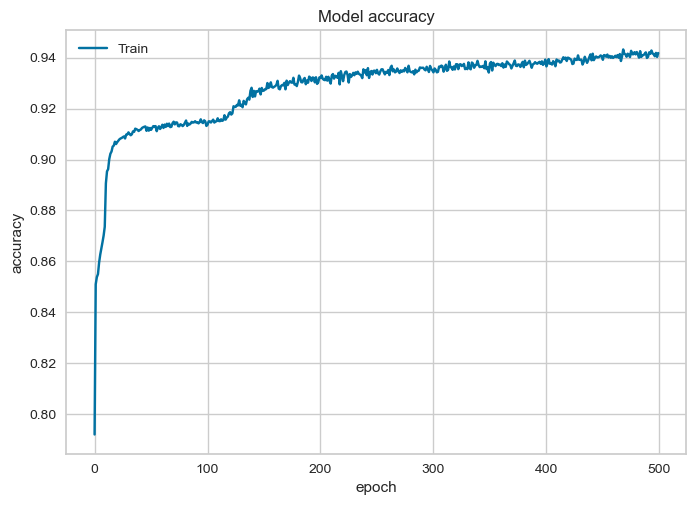

In [280]:
# summarize history for accuracy
plt.plot(model_fit.history['accuracy'])
#p lt.plot(model_fit.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['Train', 'Testing'], loc='upper left')
plt.show()

In [281]:
mlp_pred = model.predict(X_test)
mlp_pred = np.argmax(mlp_pred , axis = 1)
mlp_pred = mlp_pred.reshape((-1,1))

17367/17367 [==============================] - 13s 736us/step


In [282]:
#evalute model preformance
score = model.evaluate(X_test, y_test, verbose=1)
print('Loss: %.2f' % ( score[0]))
print('Accuracy: %.2f' % ( score[1]*100))

17367/17367 [==============================] - 15s 850us/step - loss: 0.1412 - accuracy: 0.9509
Loss: 0.14
Accuracy: 95.09


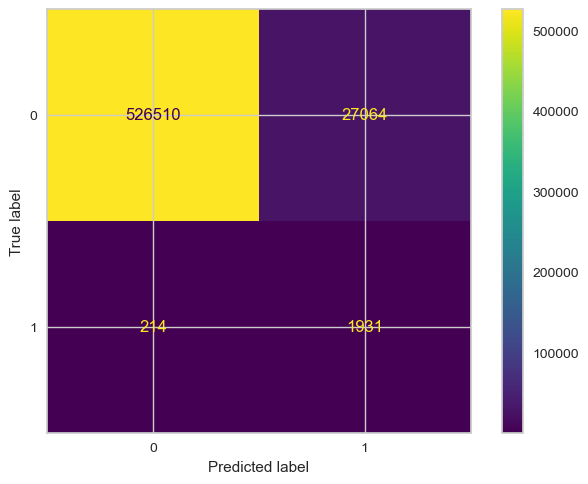

In [283]:
metrics.ConfusionMatrixDisplay.from_predictions(y_test, mlp_pred)

In [284]:
print(metrics.classification_report(y_test, mlp_pred))

              precision    recall  f1-score   support

           0       1.00      0.95      0.97    553574
           1       0.07      0.90      0.12      2145

    accuracy                           0.95    555719
   macro avg       0.53      0.93      0.55    555719
weighted avg       1.00      0.95      0.97    555719



In [285]:
lr_precision, lr_recall, _ = precision_recall_curve(y_test, mlp_pred)

In [286]:
lr_f1, lr_auc = f1_score(y_test, mlp_pred), roc_auc_score(y_test, mlp_pred)

In [287]:
# summarize scores
print('fraud: f1=%.3f auc=%.3f' % (lr_f1, lr_auc))

fraud: f1=0.124 auc=0.926


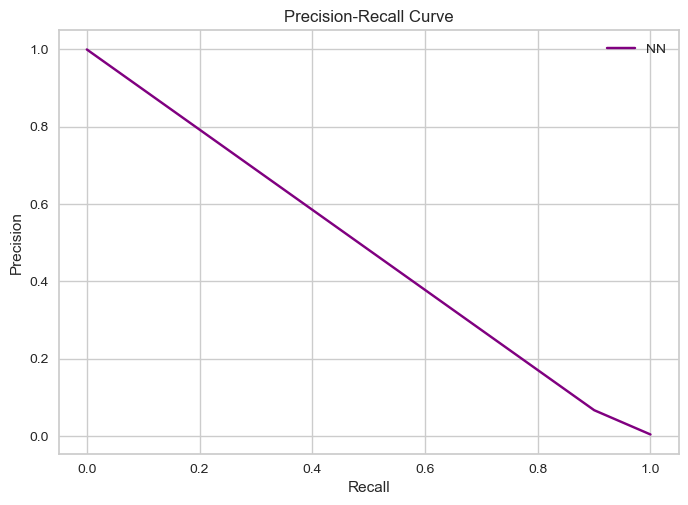

In [288]:
#calculate precision and recall
precision, recall, thresholds = precision_recall_curve(y_test, mlp_pred)

#create precision recall curve
fig, ax = plt.subplots()
ax.plot(recall, precision, color='purple', label='NN')

#add axis labels to plot
ax.set_title('Precision-Recall Curve')
ax.set_ylabel('Precision')
ax.set_xlabel('Recall')
# show the legend
plt.legend()
#display plot
plt.show()

In [289]:
# get roc_auc score
NN_roc_auc_score = metrics.roc_auc_score(y_test, mlp_pred)
print("Neural network Roc_AUC Score Is {}".format(NN_roc_auc_score))

Neural network Roc_AUC Score Is 0.9256717604407343


## Tuning Hyperparameters NN

### Functions

In [290]:
def MLP(train_dataset,train_target,num_epochs,batch_size,verbose,optimizer,num_hidden = 1,num_neurons = 10,active_fun = 'relu' ):
  model = keras.models.Sequential()
  for num  in range(0,num_hidden):
    model.add(Dense(num_neurons, input_shape=(train_dataset.shape[1],),activation=active_fun ))
  model.add(Dense(num_classes, activation='sigmoid'))
  model.compile(loss='sparse_categorical_crossentropy', optimizer=optimizer, metrics=['accuracy'])
  model.fit(train_dataset, train_target, epochs=num_epochs, batch_size=batch_size, verbose=verbose)
  return model

In [291]:
def summary(Acc,type_,Loss=None):

    if Loss==None:
        min_max_avg = {
        type_ + " Acc_min" : np.min(Acc) ,
        type_ +" Acc_max" : np.max(Acc) ,
        type_ +" Acc_avg" :np.mean(Acc)
    }
        return min_max_avg
    else :
        min_max_avg = {
              type_ +" Acc_min" : np.min(Acc) ,
              type_ +" Acc_max" : np.max(Acc) ,
              type_ +" Acc_avg" :np.mean(Acc) ,

              type_ +" Losse_min" : np.min(Loss) ,
              type_ +" Losse_max" : np.max(Loss) ,
              type_ +" Losse_avg" :np.mean(Loss) 
          }
        return min_max_avg

In [292]:
def multiple_fit (Model ,times,x_train,y_train,x_test, y_test,PLot_Loss=False):

    Acc_Train = []
    Loss_Train = [] 
    Acc_Test =[]
    Loss_Test=[]


    for i in range(times):
        # Train Accuracy
        score_Trian = Model.evaluate(x_train, y_train, verbose=verbose)
        Loss_Train.append(score_Trian[0]) #Loss
        Acc_Train.append(score_Trian[1]) #Acc

        # Test Accuracy
        score_Test = Model.evaluate(x_test, y_test, verbose=0)
        Loss_Test.append(score_Test[0]) #Loss
        Acc_Test.append(score_Test[1]) #Acc



    return {
    "Acc_Train" : Acc_Train ,
    "Loss_Train" : Loss_Train ,

    "Acc_Test" :Acc_Test ,
    "Loss_Test" : Loss_Test ,


    }

In [293]:
def optimizersg(opt_name,learning_rate_num):
  if opt_name == 'SGD':
    optimizer = keras.optimizers.SGD(learning_rate= learning_rate_num,nesterov=True)
    return optimizer

  elif opt_name == 'AdamW':
    optimizer = AdamW(learning_rate=Adamw_learning_rate , weight_decay=.00001)
    return optimizer

  elif opt_name == 'RMSprop':
    optimizer = keras.optimizers.RMSprop(learning_rate= learning_rate_num)
    return optimizer

### Different batch sizes

In [294]:
#vary batch size
Bs_total= [32,64,128] 
dictry1= []
dictry2= []
dictry3= []
for Bs in Bs_total :
  tuned_model = MLP(X_train,y_train,num_epochs,Bs,verbose,optimizer_Adamw)
  dictry = multiple_fit(tuned_model ,5 ,X_train,y_train,X_test, y_test,PLot_Loss=False)
  dictry1.append(summary(dictry["Acc_Train"],'Train'))
  dictry2.append(summary(dictry["Acc_Test"],'Test'))

Epoch 1/500
470/470 [==============================] - 1s 929us/step - loss: 0.4057 - accuracy: 0.8327
Epoch 2/500
470/470 [==============================] - 0s 935us/step - loss: 0.3656 - accuracy: 0.8519
Epoch 3/500
470/470 [==============================] - 0s 932us/step - loss: 0.3417 - accuracy: 0.8728
Epoch 4/500
470/470 [==============================] - 0s 926us/step - loss: 0.3243 - accuracy: 0.8857
Epoch 5/500
470/470 [==============================] - 0s 927us/step - loss: 0.3132 - accuracy: 0.8922
Epoch 6/500
470/470 [==============================] - 0s 927us/step - loss: 0.3046 - accuracy: 0.8970
Epoch 7/500
470/470 [==============================] - 0s 916us/step - loss: 0.2989 - accuracy: 0.8983
Epoch 8/500
470/470 [==============================] - 0s 934us/step - loss: 0.2946 - accuracy: 0.8989
Epoch 9/500
470/470 [==============================] - 0s 943us/step - loss: 0.2900 - accuracy: 0.9000
Epoch 10/500
470/470 [==============================] - 0s 924us/step - l

470/470 [==============================] - 0s 889us/step - loss: 0.2247 - accuracy: 0.9089
Epoch 80/500
470/470 [==============================] - 0s 925us/step - loss: 0.2240 - accuracy: 0.9095
Epoch 81/500
470/470 [==============================] - 0s 1ms/step - loss: 0.2243 - accuracy: 0.9096
Epoch 82/500
470/470 [==============================] - 0s 954us/step - loss: 0.2239 - accuracy: 0.9098
Epoch 83/500
470/470 [==============================] - 0s 879us/step - loss: 0.2237 - accuracy: 0.9108
Epoch 84/500
470/470 [==============================] - 0s 1ms/step - loss: 0.2252 - accuracy: 0.9083
Epoch 85/500
470/470 [==============================] - 0s 892us/step - loss: 0.2242 - accuracy: 0.9095
Epoch 86/500
470/470 [==============================] - 0s 916us/step - loss: 0.2239 - accuracy: 0.9099
Epoch 87/500
470/470 [==============================] - 0s 932us/step - loss: 0.2244 - accuracy: 0.9095
Epoch 88/500
470/470 [==============================] - 0s 924us/step - loss: 0.2

470/470 [==============================] - 0s 919us/step - loss: 0.2121 - accuracy: 0.9131
Epoch 158/500
470/470 [==============================] - 0s 917us/step - loss: 0.2090 - accuracy: 0.9138
Epoch 159/500
470/470 [==============================] - 0s 930us/step - loss: 0.2091 - accuracy: 0.9140
Epoch 160/500
470/470 [==============================] - 0s 920us/step - loss: 0.2099 - accuracy: 0.9136
Epoch 161/500
470/470 [==============================] - 0s 917us/step - loss: 0.2098 - accuracy: 0.9131
Epoch 162/500
470/470 [==============================] - 0s 911us/step - loss: 0.2089 - accuracy: 0.9130
Epoch 163/500
470/470 [==============================] - 0s 913us/step - loss: 0.2073 - accuracy: 0.9144
Epoch 164/500
470/470 [==============================] - 0s 921us/step - loss: 0.2079 - accuracy: 0.9153
Epoch 165/500
470/470 [==============================] - 0s 926us/step - loss: 0.2066 - accuracy: 0.9155
Epoch 166/500
470/470 [==============================] - 0s 921us/ste

470/470 [==============================] - 0s 926us/step - loss: 0.1887 - accuracy: 0.9255
Epoch 236/500
470/470 [==============================] - 0s 927us/step - loss: 0.1861 - accuracy: 0.9248
Epoch 237/500
470/470 [==============================] - 0s 918us/step - loss: 0.1846 - accuracy: 0.9268
Epoch 238/500
470/470 [==============================] - 0s 948us/step - loss: 0.1873 - accuracy: 0.9245
Epoch 239/500
470/470 [==============================] - 0s 879us/step - loss: 0.1849 - accuracy: 0.9257
Epoch 240/500
470/470 [==============================] - 1s 1ms/step - loss: 0.1843 - accuracy: 0.9259
Epoch 241/500
470/470 [==============================] - 0s 937us/step - loss: 0.1867 - accuracy: 0.9268
Epoch 242/500
470/470 [==============================] - 1s 1ms/step - loss: 0.1865 - accuracy: 0.9257
Epoch 243/500
470/470 [==============================] - 0s 1ms/step - loss: 0.1880 - accuracy: 0.9251
Epoch 244/500
470/470 [==============================] - 1s 1ms/step - loss

470/470 [==============================] - 0s 1ms/step - loss: 0.1813 - accuracy: 0.9252
Epoch 314/500
470/470 [==============================] - 0s 998us/step - loss: 0.1816 - accuracy: 0.9262
Epoch 315/500
470/470 [==============================] - 0s 1ms/step - loss: 0.1816 - accuracy: 0.9282
Epoch 316/500
470/470 [==============================] - 0s 916us/step - loss: 0.1828 - accuracy: 0.9273
Epoch 317/500
470/470 [==============================] - 0s 939us/step - loss: 0.1818 - accuracy: 0.9263
Epoch 318/500
470/470 [==============================] - 0s 944us/step - loss: 0.1825 - accuracy: 0.9282
Epoch 319/500
470/470 [==============================] - 0s 946us/step - loss: 0.1809 - accuracy: 0.9282
Epoch 320/500
470/470 [==============================] - 0s 931us/step - loss: 0.1799 - accuracy: 0.9302
Epoch 321/500
470/470 [==============================] - 0s 1ms/step - loss: 0.1832 - accuracy: 0.9259
Epoch 322/500
470/470 [==============================] - 0s 1ms/step - loss

470/470 [==============================] - 0s 904us/step - loss: 0.1806 - accuracy: 0.9282
Epoch 392/500
470/470 [==============================] - 0s 891us/step - loss: 0.1801 - accuracy: 0.9287
Epoch 393/500
470/470 [==============================] - 0s 892us/step - loss: 0.1803 - accuracy: 0.9297
Epoch 394/500
470/470 [==============================] - 0s 917us/step - loss: 0.1804 - accuracy: 0.9274
Epoch 395/500
470/470 [==============================] - 0s 918us/step - loss: 0.1834 - accuracy: 0.9270
Epoch 396/500
470/470 [==============================] - 0s 998us/step - loss: 0.1786 - accuracy: 0.9277
Epoch 397/500
470/470 [==============================] - 0s 1ms/step - loss: 0.1806 - accuracy: 0.9282
Epoch 398/500
470/470 [==============================] - 0s 999us/step - loss: 0.1804 - accuracy: 0.9295
Epoch 399/500
470/470 [==============================] - 1s 1ms/step - loss: 0.1813 - accuracy: 0.9272
Epoch 400/500
470/470 [==============================] - 0s 949us/step - 

470/470 [==============================] - 0s 911us/step - loss: 0.1809 - accuracy: 0.9282
Epoch 470/500
470/470 [==============================] - 0s 898us/step - loss: 0.1783 - accuracy: 0.9289
Epoch 471/500
470/470 [==============================] - 0s 872us/step - loss: 0.1791 - accuracy: 0.9283
Epoch 472/500
470/470 [==============================] - 0s 954us/step - loss: 0.1867 - accuracy: 0.9269
Epoch 473/500
470/470 [==============================] - 0s 1ms/step - loss: 0.1800 - accuracy: 0.9291
Epoch 474/500
470/470 [==============================] - 0s 970us/step - loss: 0.1802 - accuracy: 0.9277
Epoch 475/500
470/470 [==============================] - 0s 964us/step - loss: 0.1790 - accuracy: 0.9300
Epoch 476/500
470/470 [==============================] - 0s 945us/step - loss: 0.1815 - accuracy: 0.9289
Epoch 477/500
470/470 [==============================] - 0s 962us/step - loss: 0.1804 - accuracy: 0.9288
Epoch 478/500
470/470 [==============================] - 0s 982us/step 

235/235 [==============================] - 0s 927us/step - loss: 0.2869 - accuracy: 0.8818
Epoch 44/500
235/235 [==============================] - 0s 913us/step - loss: 0.2851 - accuracy: 0.8812
Epoch 45/500
235/235 [==============================] - 0s 948us/step - loss: 0.2840 - accuracy: 0.8834
Epoch 46/500
235/235 [==============================] - 0s 946us/step - loss: 0.2830 - accuracy: 0.8832
Epoch 47/500
235/235 [==============================] - 0s 975us/step - loss: 0.2816 - accuracy: 0.8870
Epoch 48/500
235/235 [==============================] - 0s 954us/step - loss: 0.2810 - accuracy: 0.8844
Epoch 49/500
235/235 [==============================] - 0s 915us/step - loss: 0.2801 - accuracy: 0.8874
Epoch 50/500
235/235 [==============================] - 0s 916us/step - loss: 0.2804 - accuracy: 0.8860
Epoch 51/500
235/235 [==============================] - 0s 907us/step - loss: 0.2788 - accuracy: 0.8872
Epoch 52/500
235/235 [==============================] - 0s 910us/step - loss:

235/235 [==============================] - 0s 966us/step - loss: 0.2288 - accuracy: 0.9097
Epoch 122/500
235/235 [==============================] - 0s 935us/step - loss: 0.2283 - accuracy: 0.9103
Epoch 123/500
235/235 [==============================] - 0s 912us/step - loss: 0.2285 - accuracy: 0.9093
Epoch 124/500
235/235 [==============================] - 0s 910us/step - loss: 0.2285 - accuracy: 0.9095
Epoch 125/500
235/235 [==============================] - 0s 920us/step - loss: 0.2275 - accuracy: 0.9098
Epoch 126/500
235/235 [==============================] - 0s 918us/step - loss: 0.2270 - accuracy: 0.9097
Epoch 127/500
235/235 [==============================] - 0s 919us/step - loss: 0.2274 - accuracy: 0.9103
Epoch 128/500
235/235 [==============================] - 0s 915us/step - loss: 0.2268 - accuracy: 0.9101
Epoch 129/500
235/235 [==============================] - 0s 914us/step - loss: 0.2272 - accuracy: 0.9099
Epoch 130/500
235/235 [==============================] - 0s 922us/ste

235/235 [==============================] - 0s 916us/step - loss: 0.2137 - accuracy: 0.9159
Epoch 200/500
235/235 [==============================] - 0s 960us/step - loss: 0.2121 - accuracy: 0.9171
Epoch 201/500
235/235 [==============================] - 0s 1ms/step - loss: 0.2121 - accuracy: 0.9158
Epoch 202/500
235/235 [==============================] - 0s 936us/step - loss: 0.2115 - accuracy: 0.9165
Epoch 203/500
235/235 [==============================] - 0s 1ms/step - loss: 0.2109 - accuracy: 0.9167
Epoch 204/500
235/235 [==============================] - 0s 927us/step - loss: 0.2140 - accuracy: 0.9149
Epoch 205/500
235/235 [==============================] - 0s 956us/step - loss: 0.2112 - accuracy: 0.9164
Epoch 206/500
235/235 [==============================] - 0s 964us/step - loss: 0.2113 - accuracy: 0.9155
Epoch 207/500
235/235 [==============================] - 0s 993us/step - loss: 0.2105 - accuracy: 0.9173
Epoch 208/500
235/235 [==============================] - 0s 934us/step - 

235/235 [==============================] - 0s 969us/step - loss: 0.2063 - accuracy: 0.9171
Epoch 278/500
235/235 [==============================] - 0s 888us/step - loss: 0.2047 - accuracy: 0.9172
Epoch 279/500
235/235 [==============================] - 0s 880us/step - loss: 0.2081 - accuracy: 0.9159
Epoch 280/500
235/235 [==============================] - 0s 904us/step - loss: 0.2042 - accuracy: 0.9183
Epoch 281/500
235/235 [==============================] - 0s 882us/step - loss: 0.2086 - accuracy: 0.9185
Epoch 282/500
235/235 [==============================] - 0s 878us/step - loss: 0.2066 - accuracy: 0.9177
Epoch 283/500
235/235 [==============================] - 0s 901us/step - loss: 0.2080 - accuracy: 0.9169
Epoch 284/500
235/235 [==============================] - 0s 935us/step - loss: 0.2063 - accuracy: 0.9169
Epoch 285/500
235/235 [==============================] - 0s 950us/step - loss: 0.2059 - accuracy: 0.9185
Epoch 286/500
235/235 [==============================] - 0s 943us/ste

235/235 [==============================] - 0s 974us/step - loss: 0.2035 - accuracy: 0.9180
Epoch 356/500
235/235 [==============================] - 0s 935us/step - loss: 0.2034 - accuracy: 0.9193
Epoch 357/500
235/235 [==============================] - 0s 956us/step - loss: 0.2047 - accuracy: 0.9183
Epoch 358/500
235/235 [==============================] - 0s 941us/step - loss: 0.2041 - accuracy: 0.9181
Epoch 359/500
235/235 [==============================] - 0s 917us/step - loss: 0.2040 - accuracy: 0.9195
Epoch 360/500
235/235 [==============================] - 0s 935us/step - loss: 0.2043 - accuracy: 0.9188
Epoch 361/500
235/235 [==============================] - 0s 955us/step - loss: 0.2028 - accuracy: 0.9185
Epoch 362/500
235/235 [==============================] - 0s 957us/step - loss: 0.2027 - accuracy: 0.9173
Epoch 363/500
235/235 [==============================] - 0s 924us/step - loss: 0.2032 - accuracy: 0.9178
Epoch 364/500
235/235 [==============================] - 0s 977us/ste

235/235 [==============================] - 0s 932us/step - loss: 0.2034 - accuracy: 0.9189
Epoch 434/500
235/235 [==============================] - 0s 931us/step - loss: 0.2011 - accuracy: 0.9189
Epoch 435/500
235/235 [==============================] - 0s 895us/step - loss: 0.2024 - accuracy: 0.9195
Epoch 436/500
235/235 [==============================] - 0s 883us/step - loss: 0.2019 - accuracy: 0.9191
Epoch 437/500
235/235 [==============================] - 0s 890us/step - loss: 0.2035 - accuracy: 0.9188
Epoch 438/500
235/235 [==============================] - 0s 885us/step - loss: 0.2025 - accuracy: 0.9187
Epoch 439/500
235/235 [==============================] - 0s 893us/step - loss: 0.2028 - accuracy: 0.9187
Epoch 440/500
235/235 [==============================] - 0s 884us/step - loss: 0.2018 - accuracy: 0.9194
Epoch 441/500
235/235 [==============================] - 0s 949us/step - loss: 0.2034 - accuracy: 0.9185
Epoch 442/500
235/235 [==============================] - 0s 1ms/step 

118/118 [==============================] - 0s 977us/step - loss: 0.3195 - accuracy: 0.8910
Epoch 8/500
118/118 [==============================] - 0s 1ms/step - loss: 0.3128 - accuracy: 0.8945
Epoch 9/500
118/118 [==============================] - 0s 1ms/step - loss: 0.3070 - accuracy: 0.8962
Epoch 10/500
118/118 [==============================] - 0s 908us/step - loss: 0.2995 - accuracy: 0.8985
Epoch 11/500
118/118 [==============================] - 0s 948us/step - loss: 0.2937 - accuracy: 0.9004
Epoch 12/500
118/118 [==============================] - 0s 929us/step - loss: 0.2881 - accuracy: 0.9005
Epoch 13/500
118/118 [==============================] - 0s 926us/step - loss: 0.2836 - accuracy: 0.9031
Epoch 14/500
118/118 [==============================] - 0s 946us/step - loss: 0.2802 - accuracy: 0.9031
Epoch 15/500
118/118 [==============================] - 0s 1ms/step - loss: 0.2778 - accuracy: 0.9034
Epoch 16/500
118/118 [==============================] - 0s 973us/step - loss: 0.2746 

118/118 [==============================] - 0s 1ms/step - loss: 0.2250 - accuracy: 0.9097
Epoch 87/500
118/118 [==============================] - 0s 1ms/step - loss: 0.2248 - accuracy: 0.9101
Epoch 88/500
118/118 [==============================] - 0s 1ms/step - loss: 0.2240 - accuracy: 0.9109
Epoch 89/500
118/118 [==============================] - 0s 1ms/step - loss: 0.2237 - accuracy: 0.9108
Epoch 90/500
118/118 [==============================] - 0s 969us/step - loss: 0.2234 - accuracy: 0.9103
Epoch 91/500
118/118 [==============================] - 0s 1ms/step - loss: 0.2239 - accuracy: 0.9100
Epoch 92/500
118/118 [==============================] - 0s 973us/step - loss: 0.2235 - accuracy: 0.9101
Epoch 93/500
118/118 [==============================] - 0s 982us/step - loss: 0.2243 - accuracy: 0.9101
Epoch 94/500
118/118 [==============================] - 0s 1ms/step - loss: 0.2237 - accuracy: 0.9109
Epoch 95/500
118/118 [==============================] - 0s 914us/step - loss: 0.2227 - ac

118/118 [==============================] - 0s 959us/step - loss: 0.2143 - accuracy: 0.9107
Epoch 165/500
118/118 [==============================] - 0s 1ms/step - loss: 0.2139 - accuracy: 0.9108
Epoch 166/500
118/118 [==============================] - 0s 950us/step - loss: 0.2143 - accuracy: 0.9096
Epoch 167/500
118/118 [==============================] - 0s 1ms/step - loss: 0.2140 - accuracy: 0.9110
Epoch 168/500
118/118 [==============================] - 0s 982us/step - loss: 0.2135 - accuracy: 0.9108
Epoch 169/500
118/118 [==============================] - 0s 1ms/step - loss: 0.2132 - accuracy: 0.9102
Epoch 170/500
118/118 [==============================] - 0s 1ms/step - loss: 0.2133 - accuracy: 0.9115
Epoch 171/500
118/118 [==============================] - 0s 1ms/step - loss: 0.2131 - accuracy: 0.9118
Epoch 172/500
118/118 [==============================] - 0s 1ms/step - loss: 0.2132 - accuracy: 0.9117
Epoch 173/500
118/118 [==============================] - 0s 980us/step - loss: 0.

118/118 [==============================] - 0s 1ms/step - loss: 0.2066 - accuracy: 0.9139
Epoch 243/500
118/118 [==============================] - 0s 1ms/step - loss: 0.2075 - accuracy: 0.9126
Epoch 244/500
118/118 [==============================] - 0s 1ms/step - loss: 0.2056 - accuracy: 0.9133
Epoch 245/500
118/118 [==============================] - 0s 1ms/step - loss: 0.2061 - accuracy: 0.9133
Epoch 246/500
118/118 [==============================] - 0s 1ms/step - loss: 0.2062 - accuracy: 0.9132
Epoch 247/500
118/118 [==============================] - 0s 1ms/step - loss: 0.2060 - accuracy: 0.9117
Epoch 248/500
118/118 [==============================] - 0s 1ms/step - loss: 0.2067 - accuracy: 0.9137
Epoch 249/500
118/118 [==============================] - 0s 974us/step - loss: 0.2058 - accuracy: 0.9141
Epoch 250/500
118/118 [==============================] - 0s 1ms/step - loss: 0.2061 - accuracy: 0.9129
Epoch 251/500
118/118 [==============================] - 0s 1ms/step - loss: 0.2054 -

118/118 [==============================] - 0s 863us/step - loss: 0.1933 - accuracy: 0.9187
Epoch 321/500
118/118 [==============================] - 0s 915us/step - loss: 0.1931 - accuracy: 0.9181
Epoch 322/500
118/118 [==============================] - 0s 1ms/step - loss: 0.1930 - accuracy: 0.9196
Epoch 323/500
118/118 [==============================] - 0s 872us/step - loss: 0.1921 - accuracy: 0.9196
Epoch 324/500
118/118 [==============================] - 0s 969us/step - loss: 0.1930 - accuracy: 0.9175
Epoch 325/500
118/118 [==============================] - 0s 900us/step - loss: 0.1921 - accuracy: 0.9177
Epoch 326/500
118/118 [==============================] - 0s 1ms/step - loss: 0.1925 - accuracy: 0.9180
Epoch 327/500
118/118 [==============================] - 0s 957us/step - loss: 0.1921 - accuracy: 0.9193
Epoch 328/500
118/118 [==============================] - 0s 1ms/step - loss: 0.1913 - accuracy: 0.9193
Epoch 329/500
118/118 [==============================] - 0s 948us/step - lo

118/118 [==============================] - 0s 869us/step - loss: 0.1802 - accuracy: 0.9275
Epoch 399/500
118/118 [==============================] - 0s 900us/step - loss: 0.1784 - accuracy: 0.9265
Epoch 400/500
118/118 [==============================] - 0s 873us/step - loss: 0.1780 - accuracy: 0.9271
Epoch 401/500
118/118 [==============================] - 0s 933us/step - loss: 0.1777 - accuracy: 0.9270
Epoch 402/500
118/118 [==============================] - 0s 883us/step - loss: 0.1792 - accuracy: 0.9259
Epoch 403/500
118/118 [==============================] - 0s 881us/step - loss: 0.1784 - accuracy: 0.9250
Epoch 404/500
118/118 [==============================] - 0s 873us/step - loss: 0.1807 - accuracy: 0.9261
Epoch 405/500
118/118 [==============================] - 0s 872us/step - loss: 0.1777 - accuracy: 0.9271
Epoch 406/500
118/118 [==============================] - 0s 878us/step - loss: 0.1771 - accuracy: 0.9263
Epoch 407/500
118/118 [==============================] - 0s 865us/ste

118/118 [==============================] - 0s 888us/step - loss: 0.1737 - accuracy: 0.9283
Epoch 477/500
118/118 [==============================] - 0s 953us/step - loss: 0.1757 - accuracy: 0.9273
Epoch 478/500
118/118 [==============================] - 0s 980us/step - loss: 0.1744 - accuracy: 0.9279
Epoch 479/500
118/118 [==============================] - 0s 889us/step - loss: 0.1747 - accuracy: 0.9293
Epoch 480/500
118/118 [==============================] - 0s 966us/step - loss: 0.1747 - accuracy: 0.9289
Epoch 481/500
118/118 [==============================] - 0s 980us/step - loss: 0.1754 - accuracy: 0.9275
Epoch 482/500
118/118 [==============================] - 0s 991us/step - loss: 0.1748 - accuracy: 0.9291
Epoch 483/500
118/118 [==============================] - 0s 1ms/step - loss: 0.1756 - accuracy: 0.9276
Epoch 484/500
118/118 [==============================] - 0s 966us/step - loss: 0.1748 - accuracy: 0.9281
Epoch 485/500
118/118 [==============================] - 0s 917us/step 

In [295]:
train_ta = pd.DataFrame(dictry1) 
train_ta['batch size'] = Bs_total
train_ta

,Train Acc_min,Train Acc_max,Train Acc_avg,batch size
0,0.931588,0.931588,0.931588,32
1,0.916600,0.916600,0.916600,64
2,0.929323,0.929323,0.929323,128


In [296]:
test_ta = pd.DataFrame(dictry2) 
test_ta['batch size'] = Bs_total
test_ta

,Test Acc_min,Test Acc_max,Test Acc_avg,batch size
0,0.960923,0.960923,0.960923,32
1,0.981788,0.981788,0.981788,64
2,0.972378,0.972378,0.972378,128


In [297]:
Best_batch_size= test_ta.loc[test_ta['Test Acc_avg'] == test_ta['Test Acc_avg'].max(), 'batch size'].values[0]
print("Best batch size is --> {}" .format(Best_batch_size))

Best batch size is --> 64


In [298]:
mlpt_pred = tuned_model.predict(X_test)
mlpt_pred = np.argmax(mlp_pred , axis = 1)
mlpt_pred = mlp_pred.reshape((-1,1))

17367/17367 [==============================] - 14s 802us/step


In [299]:
#evalute model preformance
score = tuned_model.evaluate(X_test, y_test, verbose=1)
print('Loss: %.2f' % ( score[0]))
print('Accuracy: %.2f' % ( score[1]*100))

17367/17367 [==============================] - 16s 922us/step - loss: 0.1279 - accuracy: 0.9724
Loss: 0.13
Accuracy: 97.24


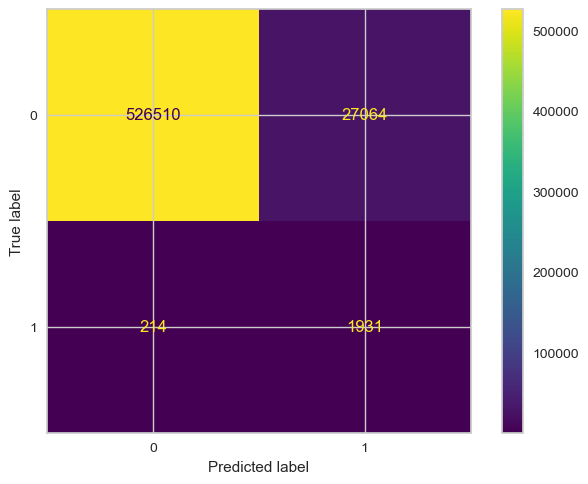

In [300]:
metrics.ConfusionMatrixDisplay.from_predictions(y_test, mlpt_pred)

In [301]:
print(metrics.classification_report(y_test, mlpt_pred))

              precision    recall  f1-score   support

           0       1.00      0.95      0.97    553574
           1       0.07      0.90      0.12      2145

    accuracy                           0.95    555719
   macro avg       0.53      0.93      0.55    555719
weighted avg       1.00      0.95      0.97    555719



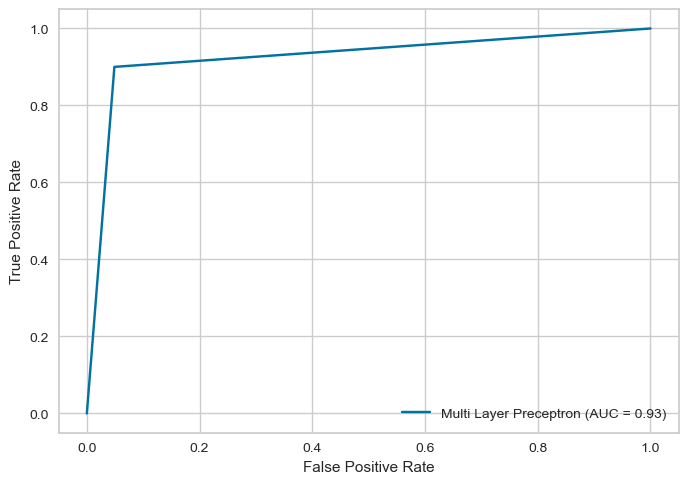

In [302]:
plot_roc_auc_curve(mlpt_pred, "Multi Layer Preceptron")

In [303]:
lr_f1, lr_auc = f1_score(y_test, mlpt_pred), roc_auc_score(y_test, mlpt_pred)
print('fraud: f1=%.3f auc=%.3f' % (lr_f1, lr_auc))

fraud: f1=0.124 auc=0.926


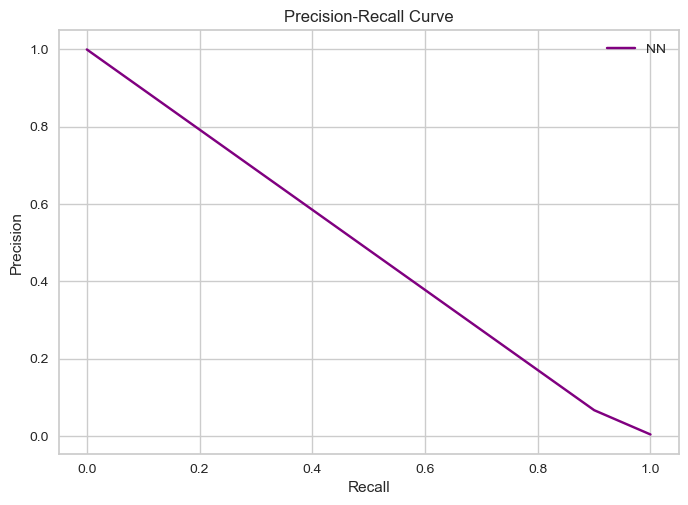

In [304]:
#calculate precision and recall
precision, recall, thresholds = precision_recall_curve(y_test, mlpt_pred)

#create precision recall curve
fig, ax = plt.subplots()
ax.plot(recall, precision, color='purple', label='NN')

#add axis labels to plot
ax.set_title('Precision-Recall Curve')
ax.set_ylabel('Precision')
ax.set_xlabel('Recall')
# show the legend
plt.legend()
#display plot
plt.show()

### Different layers

In [305]:
ls_dict  = []
neurons = [10,20,30,40]
hidden_layers = [1,2,4,8]

for neu in neurons:
  for num in hidden_layers:
    tu_model =MLP(X_train,y_train,num_epochs,
                  Best_batch_size,verbose,optimizer_Adamw,num,neu)
    d = multiple_fit(tu_model ,5 ,X_train,y_train,X_test, 
                     y_test,PLot_Loss=False)
    train_summ = summary(d["Acc_Train"],'Train')
    test_summ = summary(d["Acc_Test"],'Test')

    All= {
        "Hidden layers":num ,
        "Number of neurons":neu,

        "Max train acc":train_summ["Train Acc_max"] ,
        "Min train acc":train_summ["Train Acc_min"],
        "Avg train acc":train_summ["Train Acc_avg"],

        "Max test acc":test_summ["Test Acc_max"],
        "Min test acc":test_summ["Test Acc_min"],
        "Avg test acc":test_summ["Test Acc_avg"], 


    }
    ls_dict.append(All)
all = pd.DataFrame.from_dict(ls_dict)

Epoch 1/500
235/235 [==============================] - 1s 1ms/step - loss: 0.4513 - accuracy: 0.8281
Epoch 2/500
235/235 [==============================] - 0s 1ms/step - loss: 0.3856 - accuracy: 0.8456
Epoch 3/500
235/235 [==============================] - 0s 1ms/step - loss: 0.3760 - accuracy: 0.8469
Epoch 4/500
235/235 [==============================] - 0s 947us/step - loss: 0.3708 - accuracy: 0.8519
Epoch 5/500
235/235 [==============================] - 0s 930us/step - loss: 0.3663 - accuracy: 0.8533
Epoch 6/500
235/235 [==============================] - 0s 939us/step - loss: 0.3622 - accuracy: 0.8573
Epoch 7/500
235/235 [==============================] - 0s 950us/step - loss: 0.3584 - accuracy: 0.8591
Epoch 8/500
235/235 [==============================] - 0s 951us/step - loss: 0.3547 - accuracy: 0.8632
Epoch 9/500
235/235 [==============================] - 0s 929us/step - loss: 0.3506 - accuracy: 0.8659
Epoch 10/500
235/235 [==============================] - 0s 951us/step - loss: 0

235/235 [==============================] - 0s 1ms/step - loss: 0.2448 - accuracy: 0.9091
Epoch 81/500
235/235 [==============================] - 0s 1ms/step - loss: 0.2440 - accuracy: 0.9102
Epoch 82/500
235/235 [==============================] - 0s 1ms/step - loss: 0.2425 - accuracy: 0.9106
Epoch 83/500
235/235 [==============================] - 0s 1ms/step - loss: 0.2430 - accuracy: 0.9107
Epoch 84/500
235/235 [==============================] - 0s 1ms/step - loss: 0.2415 - accuracy: 0.9103
Epoch 85/500
235/235 [==============================] - 0s 1ms/step - loss: 0.2409 - accuracy: 0.9102
Epoch 86/500
235/235 [==============================] - 0s 1ms/step - loss: 0.2409 - accuracy: 0.9111
Epoch 87/500
235/235 [==============================] - 0s 1ms/step - loss: 0.2398 - accuracy: 0.9111
Epoch 88/500
235/235 [==============================] - 0s 1ms/step - loss: 0.2398 - accuracy: 0.9117
Epoch 89/500
235/235 [==============================] - 0s 1ms/step - loss: 0.2385 - accuracy: 

235/235 [==============================] - 0s 914us/step - loss: 0.2107 - accuracy: 0.9158
Epoch 160/500
235/235 [==============================] - 0s 1ms/step - loss: 0.2100 - accuracy: 0.9151
Epoch 161/500
235/235 [==============================] - 0s 1ms/step - loss: 0.2107 - accuracy: 0.9156
Epoch 162/500
235/235 [==============================] - 0s 1ms/step - loss: 0.2098 - accuracy: 0.9161
Epoch 163/500
235/235 [==============================] - 0s 1ms/step - loss: 0.2089 - accuracy: 0.9154
Epoch 164/500
235/235 [==============================] - 0s 1ms/step - loss: 0.2088 - accuracy: 0.9163
Epoch 165/500
235/235 [==============================] - 0s 1ms/step - loss: 0.2081 - accuracy: 0.9172
Epoch 166/500
235/235 [==============================] - 0s 991us/step - loss: 0.2074 - accuracy: 0.9166
Epoch 167/500
235/235 [==============================] - 0s 952us/step - loss: 0.2076 - accuracy: 0.9161
Epoch 168/500
235/235 [==============================] - 0s 960us/step - loss: 0.

235/235 [==============================] - 0s 917us/step - loss: 0.1828 - accuracy: 0.9277
Epoch 238/500
235/235 [==============================] - 0s 922us/step - loss: 0.1829 - accuracy: 0.9287
Epoch 239/500
235/235 [==============================] - 0s 897us/step - loss: 0.1832 - accuracy: 0.9291
Epoch 240/500
235/235 [==============================] - 0s 966us/step - loss: 0.1824 - accuracy: 0.9276
Epoch 241/500
235/235 [==============================] - 0s 934us/step - loss: 0.1825 - accuracy: 0.9266
Epoch 242/500
235/235 [==============================] - 0s 943us/step - loss: 0.1857 - accuracy: 0.9268
Epoch 243/500
235/235 [==============================] - 0s 929us/step - loss: 0.1829 - accuracy: 0.9279
Epoch 244/500
235/235 [==============================] - 0s 899us/step - loss: 0.1829 - accuracy: 0.9271
Epoch 245/500
235/235 [==============================] - 0s 897us/step - loss: 0.1811 - accuracy: 0.9293
Epoch 246/500
235/235 [==============================] - 0s 907us/ste

235/235 [==============================] - 0s 897us/step - loss: 0.1770 - accuracy: 0.9305
Epoch 316/500
235/235 [==============================] - 0s 893us/step - loss: 0.1777 - accuracy: 0.9306
Epoch 317/500
235/235 [==============================] - 0s 902us/step - loss: 0.1775 - accuracy: 0.9313
Epoch 318/500
235/235 [==============================] - 0s 887us/step - loss: 0.1776 - accuracy: 0.9301
Epoch 319/500
235/235 [==============================] - 0s 915us/step - loss: 0.1792 - accuracy: 0.9311
Epoch 320/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1777 - accuracy: 0.9293
Epoch 321/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1785 - accuracy: 0.9297
Epoch 322/500
235/235 [==============================] - 0s 908us/step - loss: 0.1779 - accuracy: 0.9298
Epoch 323/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1795 - accuracy: 0.9292
Epoch 324/500
235/235 [==============================] - 0s 1ms/step - loss

235/235 [==============================] - 0s 917us/step - loss: 0.1784 - accuracy: 0.9309
Epoch 394/500
235/235 [==============================] - 0s 933us/step - loss: 0.1774 - accuracy: 0.9301
Epoch 395/500
235/235 [==============================] - 0s 921us/step - loss: 0.1766 - accuracy: 0.9311
Epoch 396/500
235/235 [==============================] - 0s 970us/step - loss: 0.1769 - accuracy: 0.9311
Epoch 397/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1767 - accuracy: 0.9312
Epoch 398/500
235/235 [==============================] - 0s 922us/step - loss: 0.1782 - accuracy: 0.9297
Epoch 399/500
235/235 [==============================] - 0s 916us/step - loss: 0.1778 - accuracy: 0.9306
Epoch 400/500
235/235 [==============================] - 0s 920us/step - loss: 0.1778 - accuracy: 0.9304
Epoch 401/500
235/235 [==============================] - 0s 980us/step - loss: 0.1780 - accuracy: 0.9301
Epoch 402/500
235/235 [==============================] - 0s 952us/step 

235/235 [==============================] - 0s 910us/step - loss: 0.1781 - accuracy: 0.9294
Epoch 472/500
235/235 [==============================] - 0s 913us/step - loss: 0.1797 - accuracy: 0.9311
Epoch 473/500
235/235 [==============================] - 0s 932us/step - loss: 0.1764 - accuracy: 0.9303
Epoch 474/500
235/235 [==============================] - 0s 933us/step - loss: 0.1778 - accuracy: 0.9298
Epoch 475/500
235/235 [==============================] - 0s 911us/step - loss: 0.1775 - accuracy: 0.9310
Epoch 476/500
235/235 [==============================] - 0s 909us/step - loss: 0.1766 - accuracy: 0.9295
Epoch 477/500
235/235 [==============================] - 0s 915us/step - loss: 0.1763 - accuracy: 0.9305
Epoch 478/500
235/235 [==============================] - 0s 953us/step - loss: 0.1775 - accuracy: 0.9303
Epoch 479/500
235/235 [==============================] - 0s 941us/step - loss: 0.1797 - accuracy: 0.9292
Epoch 480/500
235/235 [==============================] - 0s 1ms/step 

Epoch 46/500
235/235 [==============================] - 0s 1ms/step - loss: 0.2141 - accuracy: 0.9095
Epoch 47/500
235/235 [==============================] - 0s 932us/step - loss: 0.2138 - accuracy: 0.9084
Epoch 48/500
235/235 [==============================] - 0s 968us/step - loss: 0.2125 - accuracy: 0.9087
Epoch 49/500
235/235 [==============================] - 0s 1ms/step - loss: 0.2108 - accuracy: 0.9101
Epoch 50/500
235/235 [==============================] - 0s 1ms/step - loss: 0.2107 - accuracy: 0.9085
Epoch 51/500
235/235 [==============================] - 0s 950us/step - loss: 0.2099 - accuracy: 0.9107
Epoch 52/500
235/235 [==============================] - 0s 968us/step - loss: 0.2086 - accuracy: 0.9093
Epoch 53/500
235/235 [==============================] - 0s 973us/step - loss: 0.2088 - accuracy: 0.9101
Epoch 54/500
235/235 [==============================] - 0s 997us/step - loss: 0.2075 - accuracy: 0.9103
Epoch 55/500
235/235 [==============================] - 0s 987us/step 

235/235 [==============================] - 0s 1ms/step - loss: 0.1654 - accuracy: 0.9284
Epoch 126/500
235/235 [==============================] - 0s 987us/step - loss: 0.1655 - accuracy: 0.9280
Epoch 127/500
235/235 [==============================] - 0s 974us/step - loss: 0.1647 - accuracy: 0.9281
Epoch 128/500
235/235 [==============================] - 0s 974us/step - loss: 0.1639 - accuracy: 0.9302
Epoch 129/500
235/235 [==============================] - 0s 936us/step - loss: 0.1651 - accuracy: 0.9278
Epoch 130/500
235/235 [==============================] - 0s 987us/step - loss: 0.1638 - accuracy: 0.9287
Epoch 131/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1649 - accuracy: 0.9291
Epoch 132/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1646 - accuracy: 0.9287
Epoch 133/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1650 - accuracy: 0.9285
Epoch 134/500
235/235 [==============================] - 0s 974us/step - loss

235/235 [==============================] - 0s 2ms/step - loss: 0.1556 - accuracy: 0.9331
Epoch 205/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1552 - accuracy: 0.9347
Epoch 206/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1555 - accuracy: 0.9333
Epoch 207/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1554 - accuracy: 0.9343
Epoch 208/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1548 - accuracy: 0.9329
Epoch 209/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1538 - accuracy: 0.9344
Epoch 210/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1555 - accuracy: 0.9340
Epoch 211/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1553 - accuracy: 0.9321
Epoch 212/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1546 - accuracy: 0.9336
Epoch 213/500
235/235 [==============================] - 0s 966us/step - loss: 0.1542 -

235/235 [==============================] - 0s 1ms/step - loss: 0.1500 - accuracy: 0.9337
Epoch 284/500
235/235 [==============================] - 0s 987us/step - loss: 0.1501 - accuracy: 0.9353
Epoch 285/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1496 - accuracy: 0.9359
Epoch 286/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1491 - accuracy: 0.9353
Epoch 287/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1503 - accuracy: 0.9357
Epoch 288/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1494 - accuracy: 0.9333
Epoch 289/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1492 - accuracy: 0.9357
Epoch 290/500
235/235 [==============================] - 0s 1000us/step - loss: 0.1492 - accuracy: 0.9359
Epoch 291/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1498 - accuracy: 0.9352
Epoch 292/500
235/235 [==============================] - 0s 970us/step - loss: 0.1

235/235 [==============================] - 0s 1ms/step - loss: 0.1492 - accuracy: 0.9357
Epoch 363/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1477 - accuracy: 0.9359
Epoch 364/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1481 - accuracy: 0.9360
Epoch 365/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1473 - accuracy: 0.9361
Epoch 366/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1476 - accuracy: 0.9356
Epoch 367/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1472 - accuracy: 0.9371
Epoch 368/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1473 - accuracy: 0.9366
Epoch 369/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1474 - accuracy: 0.9366
Epoch 370/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1493 - accuracy: 0.9342
Epoch 371/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1485 - a

235/235 [==============================] - 0s 999us/step - loss: 0.1484 - accuracy: 0.9349
Epoch 442/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1469 - accuracy: 0.9367
Epoch 443/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1475 - accuracy: 0.9369
Epoch 444/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1477 - accuracy: 0.9359
Epoch 445/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1470 - accuracy: 0.9360
Epoch 446/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1473 - accuracy: 0.9362
Epoch 447/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1476 - accuracy: 0.9362
Epoch 448/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1479 - accuracy: 0.9361
Epoch 449/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1471 - accuracy: 0.9368
Epoch 450/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1484 -

235/235 [==============================] - 0s 1ms/step - loss: 0.2173 - accuracy: 0.9128
Epoch 17/500
235/235 [==============================] - 0s 1ms/step - loss: 0.2148 - accuracy: 0.9137
Epoch 18/500
235/235 [==============================] - 0s 1ms/step - loss: 0.2128 - accuracy: 0.9141
Epoch 19/500
235/235 [==============================] - 0s 1ms/step - loss: 0.2113 - accuracy: 0.9134
Epoch 20/500
235/235 [==============================] - 0s 1ms/step - loss: 0.2087 - accuracy: 0.9145
Epoch 21/500
235/235 [==============================] - 0s 1ms/step - loss: 0.2057 - accuracy: 0.9153
Epoch 22/500
235/235 [==============================] - 0s 1ms/step - loss: 0.2066 - accuracy: 0.9151
Epoch 23/500
235/235 [==============================] - 0s 1ms/step - loss: 0.2031 - accuracy: 0.9159
Epoch 24/500
235/235 [==============================] - 0s 1ms/step - loss: 0.2036 - accuracy: 0.9141
Epoch 25/500
235/235 [==============================] - 0s 1ms/step - loss: 0.2003 - accuracy: 

235/235 [==============================] - 0s 1ms/step - loss: 0.1480 - accuracy: 0.9365
Epoch 97/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1499 - accuracy: 0.9354
Epoch 98/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1537 - accuracy: 0.9321
Epoch 99/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1479 - accuracy: 0.9363
Epoch 100/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1487 - accuracy: 0.9363
Epoch 101/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1502 - accuracy: 0.9354
Epoch 102/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1498 - accuracy: 0.9358
Epoch 103/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1471 - accuracy: 0.9373
Epoch 104/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1517 - accuracy: 0.9352
Epoch 105/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1504 - accu

235/235 [==============================] - 0s 1ms/step - loss: 0.1425 - accuracy: 0.9398
Epoch 176/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1404 - accuracy: 0.9390
Epoch 177/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1407 - accuracy: 0.9399
Epoch 178/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1440 - accuracy: 0.9366
Epoch 179/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1431 - accuracy: 0.9375
Epoch 180/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1413 - accuracy: 0.9381
Epoch 181/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1432 - accuracy: 0.9395
Epoch 182/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1430 - accuracy: 0.9391
Epoch 183/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1415 - accuracy: 0.9397
Epoch 184/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1431 - a

235/235 [==============================] - 0s 1ms/step - loss: 0.1378 - accuracy: 0.9431
Epoch 255/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1398 - accuracy: 0.9392
Epoch 256/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1428 - accuracy: 0.9382
Epoch 257/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1387 - accuracy: 0.9399
Epoch 258/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1391 - accuracy: 0.9412
Epoch 259/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1409 - accuracy: 0.9371
Epoch 260/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1393 - accuracy: 0.9395
Epoch 261/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1389 - accuracy: 0.9408
Epoch 262/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1382 - accuracy: 0.9392
Epoch 263/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1378 - a

235/235 [==============================] - 0s 1ms/step - loss: 0.1351 - accuracy: 0.9403
Epoch 334/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1363 - accuracy: 0.9405
Epoch 335/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1352 - accuracy: 0.9434
Epoch 336/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1378 - accuracy: 0.9389
Epoch 337/500
235/235 [==============================] - 0s 2ms/step - loss: 0.1360 - accuracy: 0.9427
Epoch 338/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1344 - accuracy: 0.9417
Epoch 339/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1341 - accuracy: 0.9413
Epoch 340/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1360 - accuracy: 0.9422
Epoch 341/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1348 - accuracy: 0.9421
Epoch 342/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1363 - a

235/235 [==============================] - 0s 1ms/step - loss: 0.1330 - accuracy: 0.9433
Epoch 413/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1320 - accuracy: 0.9410
Epoch 414/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1336 - accuracy: 0.9404
Epoch 415/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1322 - accuracy: 0.9424
Epoch 416/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1345 - accuracy: 0.9418
Epoch 417/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1331 - accuracy: 0.9435
Epoch 418/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1312 - accuracy: 0.9433
Epoch 419/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1310 - accuracy: 0.9428
Epoch 420/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1330 - accuracy: 0.9426
Epoch 421/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1327 - a

235/235 [==============================] - 0s 1ms/step - loss: 0.1312 - accuracy: 0.9433
Epoch 492/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1311 - accuracy: 0.9418
Epoch 493/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1284 - accuracy: 0.9437
Epoch 494/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1364 - accuracy: 0.9421
Epoch 495/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1304 - accuracy: 0.9436
Epoch 496/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1303 - accuracy: 0.9434
Epoch 497/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1284 - accuracy: 0.9438
Epoch 498/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1327 - accuracy: 0.9423
Epoch 499/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1299 - accuracy: 0.9442
Epoch 500/500
470/470 [==============================] - 0s 832us/step - loss: 0.1248 -

Epoch 67/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1604 - accuracy: 0.9266
Epoch 68/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1611 - accuracy: 0.9255
Epoch 69/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1599 - accuracy: 0.9268
Epoch 70/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1599 - accuracy: 0.9259
Epoch 71/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1602 - accuracy: 0.9252
Epoch 72/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1598 - accuracy: 0.9266
Epoch 73/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1605 - accuracy: 0.9249
Epoch 74/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1600 - accuracy: 0.9273
Epoch 75/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1610 - accuracy: 0.9272
Epoch 76/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1597

235/235 [==============================] - 0s 1ms/step - loss: 0.1493 - accuracy: 0.9324
Epoch 147/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1446 - accuracy: 0.9353
Epoch 148/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1454 - accuracy: 0.9343
Epoch 149/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1515 - accuracy: 0.9303
Epoch 150/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1454 - accuracy: 0.9331
Epoch 151/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1441 - accuracy: 0.9359
Epoch 152/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1455 - accuracy: 0.9329
Epoch 153/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1461 - accuracy: 0.9343
Epoch 154/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1444 - accuracy: 0.9338
Epoch 155/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1491 - a

235/235 [==============================] - 0s 1ms/step - loss: 0.1399 - accuracy: 0.9371
Epoch 226/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1392 - accuracy: 0.9371
Epoch 227/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1415 - accuracy: 0.9375
Epoch 228/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1444 - accuracy: 0.9381
Epoch 229/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1405 - accuracy: 0.9375
Epoch 230/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1376 - accuracy: 0.9373
Epoch 231/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1380 - accuracy: 0.9385
Epoch 232/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1387 - accuracy: 0.9384
Epoch 233/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1444 - accuracy: 0.9356
Epoch 234/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1400 - a

235/235 [==============================] - 0s 1ms/step - loss: 0.1352 - accuracy: 0.9407
Epoch 305/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1424 - accuracy: 0.9378
Epoch 306/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1342 - accuracy: 0.9420
Epoch 307/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1360 - accuracy: 0.9398
Epoch 308/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1347 - accuracy: 0.9412
Epoch 309/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1356 - accuracy: 0.9404
Epoch 310/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1357 - accuracy: 0.9397
Epoch 311/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1353 - accuracy: 0.9402
Epoch 312/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1341 - accuracy: 0.9393
Epoch 313/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1339 - a

235/235 [==============================] - 0s 1ms/step - loss: 0.1302 - accuracy: 0.9417
Epoch 384/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1363 - accuracy: 0.9391
Epoch 385/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1322 - accuracy: 0.9389
Epoch 386/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1312 - accuracy: 0.9410
Epoch 387/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1348 - accuracy: 0.9418
Epoch 388/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1319 - accuracy: 0.9415
Epoch 389/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1317 - accuracy: 0.9423
Epoch 390/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1340 - accuracy: 0.9386
Epoch 391/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1355 - accuracy: 0.9399
Epoch 392/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1365 - a

235/235 [==============================] - 0s 1ms/step - loss: 0.1274 - accuracy: 0.9428
Epoch 463/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1252 - accuracy: 0.9460
Epoch 464/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1254 - accuracy: 0.9464
Epoch 465/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1251 - accuracy: 0.9449
Epoch 466/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1252 - accuracy: 0.9458
Epoch 467/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1251 - accuracy: 0.9470
Epoch 468/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1267 - accuracy: 0.9447
Epoch 469/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1288 - accuracy: 0.9444
Epoch 470/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1255 - accuracy: 0.9464
Epoch 471/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1241 - a

235/235 [==============================] - 0s 954us/step - loss: 0.2233 - accuracy: 0.9120
Epoch 38/500
235/235 [==============================] - 0s 931us/step - loss: 0.2224 - accuracy: 0.9119
Epoch 39/500
235/235 [==============================] - 0s 952us/step - loss: 0.2219 - accuracy: 0.9130
Epoch 40/500
235/235 [==============================] - 0s 949us/step - loss: 0.2229 - accuracy: 0.9119
Epoch 41/500
235/235 [==============================] - 0s 1ms/step - loss: 0.2199 - accuracy: 0.9125
Epoch 42/500
235/235 [==============================] - 0s 943us/step - loss: 0.2220 - accuracy: 0.9117
Epoch 43/500
235/235 [==============================] - 0s 948us/step - loss: 0.2192 - accuracy: 0.9134
Epoch 44/500
235/235 [==============================] - 0s 966us/step - loss: 0.2202 - accuracy: 0.9120
Epoch 45/500
235/235 [==============================] - 0s 956us/step - loss: 0.2187 - accuracy: 0.9128
Epoch 46/500
235/235 [==============================] - 0s 938us/step - loss: 0

235/235 [==============================] - 0s 909us/step - loss: 0.2032 - accuracy: 0.9154
Epoch 117/500
235/235 [==============================] - 0s 927us/step - loss: 0.2041 - accuracy: 0.9147
Epoch 118/500
235/235 [==============================] - 0s 944us/step - loss: 0.2043 - accuracy: 0.9147
Epoch 119/500
235/235 [==============================] - 0s 981us/step - loss: 0.2044 - accuracy: 0.9159
Epoch 120/500
235/235 [==============================] - 0s 950us/step - loss: 0.2030 - accuracy: 0.9157
Epoch 121/500
235/235 [==============================] - 0s 958us/step - loss: 0.2039 - accuracy: 0.9149
Epoch 122/500
235/235 [==============================] - 0s 949us/step - loss: 0.2036 - accuracy: 0.9153
Epoch 123/500
235/235 [==============================] - 0s 952us/step - loss: 0.2030 - accuracy: 0.9157
Epoch 124/500
235/235 [==============================] - 0s 934us/step - loss: 0.2028 - accuracy: 0.9149
Epoch 125/500
235/235 [==============================] - 0s 961us/ste

235/235 [==============================] - 0s 944us/step - loss: 0.1973 - accuracy: 0.9159
Epoch 195/500
235/235 [==============================] - 0s 953us/step - loss: 0.1971 - accuracy: 0.9163
Epoch 196/500
235/235 [==============================] - 0s 949us/step - loss: 0.1984 - accuracy: 0.9169
Epoch 197/500
235/235 [==============================] - 0s 950us/step - loss: 0.2001 - accuracy: 0.9156
Epoch 198/500
235/235 [==============================] - 0s 941us/step - loss: 0.1975 - accuracy: 0.9159
Epoch 199/500
235/235 [==============================] - 0s 945us/step - loss: 0.1969 - accuracy: 0.9151
Epoch 200/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1980 - accuracy: 0.9165
Epoch 201/500
235/235 [==============================] - 0s 944us/step - loss: 0.1974 - accuracy: 0.9164
Epoch 202/500
235/235 [==============================] - 0s 938us/step - loss: 0.1991 - accuracy: 0.9161
Epoch 203/500
235/235 [==============================] - 0s 1ms/step - 

235/235 [==============================] - 0s 1ms/step - loss: 0.1942 - accuracy: 0.9174
Epoch 273/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1949 - accuracy: 0.9173
Epoch 274/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1939 - accuracy: 0.9175
Epoch 275/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1940 - accuracy: 0.9177
Epoch 276/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1956 - accuracy: 0.9165
Epoch 277/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1930 - accuracy: 0.9177
Epoch 278/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1946 - accuracy: 0.9167
Epoch 279/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1940 - accuracy: 0.9181
Epoch 280/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1933 - accuracy: 0.9178
Epoch 281/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1941 - a

235/235 [==============================] - 0s 1ms/step - loss: 0.1857 - accuracy: 0.9215
Epoch 352/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1837 - accuracy: 0.9221
Epoch 353/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1833 - accuracy: 0.9209
Epoch 354/500
235/235 [==============================] - 0s 954us/step - loss: 0.1825 - accuracy: 0.9219
Epoch 355/500
235/235 [==============================] - 0s 964us/step - loss: 0.1827 - accuracy: 0.9222
Epoch 356/500
235/235 [==============================] - 0s 953us/step - loss: 0.1858 - accuracy: 0.9219
Epoch 357/500
235/235 [==============================] - 0s 941us/step - loss: 0.1827 - accuracy: 0.9217
Epoch 358/500
235/235 [==============================] - 0s 918us/step - loss: 0.1822 - accuracy: 0.9235
Epoch 359/500
235/235 [==============================] - 0s 967us/step - loss: 0.1822 - accuracy: 0.9219
Epoch 360/500
235/235 [==============================] - 0s 966us/step - lo

235/235 [==============================] - 0s 950us/step - loss: 0.1695 - accuracy: 0.9285
Epoch 430/500
235/235 [==============================] - 0s 969us/step - loss: 0.1699 - accuracy: 0.9301
Epoch 431/500
235/235 [==============================] - 0s 961us/step - loss: 0.1702 - accuracy: 0.9306
Epoch 432/500
235/235 [==============================] - 0s 940us/step - loss: 0.1703 - accuracy: 0.9300
Epoch 433/500
235/235 [==============================] - 0s 963us/step - loss: 0.1724 - accuracy: 0.9281
Epoch 434/500
235/235 [==============================] - 0s 992us/step - loss: 0.1699 - accuracy: 0.9291
Epoch 435/500
235/235 [==============================] - 0s 954us/step - loss: 0.1704 - accuracy: 0.9300
Epoch 436/500
235/235 [==============================] - 0s 920us/step - loss: 0.1729 - accuracy: 0.9301
Epoch 437/500
235/235 [==============================] - 0s 900us/step - loss: 0.1729 - accuracy: 0.9285
Epoch 438/500
235/235 [==============================] - 0s 921us/ste

235/235 [==============================] - 0s 1ms/step - loss: 0.3209 - accuracy: 0.8799
Epoch 4/500
235/235 [==============================] - 0s 1ms/step - loss: 0.2872 - accuracy: 0.8979
Epoch 5/500
235/235 [==============================] - 0s 1ms/step - loss: 0.2709 - accuracy: 0.9023
Epoch 6/500
235/235 [==============================] - 0s 1ms/step - loss: 0.2589 - accuracy: 0.9037
Epoch 7/500
235/235 [==============================] - 0s 1ms/step - loss: 0.2474 - accuracy: 0.9069
Epoch 8/500
235/235 [==============================] - 0s 1ms/step - loss: 0.2394 - accuracy: 0.9093
Epoch 9/500
235/235 [==============================] - 0s 1ms/step - loss: 0.2329 - accuracy: 0.9099
Epoch 10/500
235/235 [==============================] - 0s 1ms/step - loss: 0.2275 - accuracy: 0.9085
Epoch 11/500
235/235 [==============================] - 0s 1ms/step - loss: 0.2233 - accuracy: 0.9098
Epoch 12/500
235/235 [==============================] - 0s 1ms/step - loss: 0.2179 - accuracy: 0.9107

235/235 [==============================] - 0s 1ms/step - loss: 0.1643 - accuracy: 0.9272
Epoch 84/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1635 - accuracy: 0.9274
Epoch 85/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1646 - accuracy: 0.9267
Epoch 86/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1623 - accuracy: 0.9271
Epoch 87/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1635 - accuracy: 0.9271
Epoch 88/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1617 - accuracy: 0.9295
Epoch 89/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1632 - accuracy: 0.9264
Epoch 90/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1641 - accuracy: 0.9267
Epoch 91/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1616 - accuracy: 0.9287
Epoch 92/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1605 - accuracy: 

235/235 [==============================] - 0s 1ms/step - loss: 0.1431 - accuracy: 0.9396
Epoch 163/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1442 - accuracy: 0.9378
Epoch 164/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1411 - accuracy: 0.9381
Epoch 165/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1411 - accuracy: 0.9385
Epoch 166/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1397 - accuracy: 0.9410
Epoch 167/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1396 - accuracy: 0.9401
Epoch 168/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1395 - accuracy: 0.9392
Epoch 169/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1419 - accuracy: 0.9376
Epoch 170/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1410 - accuracy: 0.9406
Epoch 171/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1398 - a

235/235 [==============================] - 0s 1ms/step - loss: 0.1308 - accuracy: 0.9441
Epoch 242/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1320 - accuracy: 0.9448
Epoch 243/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1308 - accuracy: 0.9431
Epoch 244/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1313 - accuracy: 0.9444
Epoch 245/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1318 - accuracy: 0.9428
Epoch 246/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1308 - accuracy: 0.9441
Epoch 247/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1328 - accuracy: 0.9432
Epoch 248/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1312 - accuracy: 0.9442
Epoch 249/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1296 - accuracy: 0.9437
Epoch 250/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1315 - a

235/235 [==============================] - 0s 1ms/step - loss: 0.1282 - accuracy: 0.9448
Epoch 321/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1264 - accuracy: 0.9455
Epoch 322/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1269 - accuracy: 0.9451
Epoch 323/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1279 - accuracy: 0.9460
Epoch 324/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1277 - accuracy: 0.9448
Epoch 325/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1273 - accuracy: 0.9458
Epoch 326/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1261 - accuracy: 0.9461
Epoch 327/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1277 - accuracy: 0.9445
Epoch 328/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1264 - accuracy: 0.9460
Epoch 329/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1263 - a

235/235 [==============================] - 0s 1ms/step - loss: 0.1257 - accuracy: 0.9472
Epoch 400/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1245 - accuracy: 0.9478
Epoch 401/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1233 - accuracy: 0.9478
Epoch 402/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1276 - accuracy: 0.9461
Epoch 403/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1244 - accuracy: 0.9461
Epoch 404/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1243 - accuracy: 0.9472
Epoch 405/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1216 - accuracy: 0.9479
Epoch 406/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1243 - accuracy: 0.9470
Epoch 407/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1251 - accuracy: 0.9473
Epoch 408/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1232 - a

235/235 [==============================] - 0s 1ms/step - loss: 0.1213 - accuracy: 0.9494
Epoch 479/500
235/235 [==============================] - 0s 983us/step - loss: 0.1213 - accuracy: 0.9488
Epoch 480/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1209 - accuracy: 0.9490
Epoch 481/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1206 - accuracy: 0.9472
Epoch 482/500
235/235 [==============================] - 0s 998us/step - loss: 0.1210 - accuracy: 0.9491
Epoch 483/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1222 - accuracy: 0.9484
Epoch 484/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1194 - accuracy: 0.9498
Epoch 485/500
235/235 [==============================] - 0s 998us/step - loss: 0.1218 - accuracy: 0.9491
Epoch 486/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1207 - accuracy: 0.9487
Epoch 487/500
235/235 [==============================] - 0s 1ms/step - loss: 0.12

235/235 [==============================] - 0s 1ms/step - loss: 0.1643 - accuracy: 0.9275
Epoch 54/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1635 - accuracy: 0.9281
Epoch 55/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1610 - accuracy: 0.9303
Epoch 56/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1625 - accuracy: 0.9297
Epoch 57/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1652 - accuracy: 0.9287
Epoch 58/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1605 - accuracy: 0.9308
Epoch 59/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1609 - accuracy: 0.9299
Epoch 60/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1613 - accuracy: 0.9284
Epoch 61/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1610 - accuracy: 0.9281
Epoch 62/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1597 - accuracy: 

235/235 [==============================] - 0s 1ms/step - loss: 0.1343 - accuracy: 0.9414
Epoch 134/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1365 - accuracy: 0.9414
Epoch 135/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1378 - accuracy: 0.9394
Epoch 136/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1375 - accuracy: 0.9373
Epoch 137/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1363 - accuracy: 0.9408
Epoch 138/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1362 - accuracy: 0.9403
Epoch 139/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1333 - accuracy: 0.9426
Epoch 140/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1338 - accuracy: 0.9414
Epoch 141/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1330 - accuracy: 0.9427
Epoch 142/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1359 - a

235/235 [==============================] - 0s 1ms/step - loss: 0.1210 - accuracy: 0.9492
Epoch 213/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1204 - accuracy: 0.9477
Epoch 214/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1209 - accuracy: 0.9462
Epoch 215/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1204 - accuracy: 0.9474
Epoch 216/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1247 - accuracy: 0.9463
Epoch 217/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1196 - accuracy: 0.9490
Epoch 218/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1215 - accuracy: 0.9476
Epoch 219/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1208 - accuracy: 0.9483
Epoch 220/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1187 - accuracy: 0.9480
Epoch 221/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1195 - a

235/235 [==============================] - 0s 1ms/step - loss: 0.1088 - accuracy: 0.9526
Epoch 292/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1108 - accuracy: 0.9506
Epoch 293/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1122 - accuracy: 0.9500
Epoch 294/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1119 - accuracy: 0.9515
Epoch 295/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1103 - accuracy: 0.9522
Epoch 296/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1096 - accuracy: 0.9527
Epoch 297/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1116 - accuracy: 0.9493
Epoch 298/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1129 - accuracy: 0.9487
Epoch 299/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1087 - accuracy: 0.9528
Epoch 300/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1073 - a

235/235 [==============================] - 0s 1ms/step - loss: 0.1027 - accuracy: 0.9554
Epoch 371/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1007 - accuracy: 0.9578
Epoch 372/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1017 - accuracy: 0.9569
Epoch 373/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1025 - accuracy: 0.9569
Epoch 374/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0992 - accuracy: 0.9567
Epoch 375/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1048 - accuracy: 0.9532
Epoch 376/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1049 - accuracy: 0.9540
Epoch 377/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1022 - accuracy: 0.9552
Epoch 378/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0984 - accuracy: 0.9568
Epoch 379/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1023 - a

235/235 [==============================] - 0s 1ms/step - loss: 0.0947 - accuracy: 0.9595
Epoch 450/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0966 - accuracy: 0.9586
Epoch 451/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0929 - accuracy: 0.9618
Epoch 452/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0958 - accuracy: 0.9606
Epoch 453/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0961 - accuracy: 0.9584
Epoch 454/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0943 - accuracy: 0.9583
Epoch 455/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0940 - accuracy: 0.9590
Epoch 456/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0939 - accuracy: 0.9597
Epoch 457/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0979 - accuracy: 0.9583
Epoch 458/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0930 - a

235/235 [==============================] - 0s 1ms/step - loss: 0.1692 - accuracy: 0.9265
Epoch 25/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1672 - accuracy: 0.9259
Epoch 26/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1702 - accuracy: 0.9248
Epoch 27/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1650 - accuracy: 0.9275
Epoch 28/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1669 - accuracy: 0.9252
Epoch 29/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1649 - accuracy: 0.9259
Epoch 30/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1613 - accuracy: 0.9287
Epoch 31/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1621 - accuracy: 0.9294
Epoch 32/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1608 - accuracy: 0.9298
Epoch 33/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1618 - accuracy: 

235/235 [==============================] - 0s 1ms/step - loss: 0.1121 - accuracy: 0.9524
Epoch 105/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1143 - accuracy: 0.9515
Epoch 106/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1160 - accuracy: 0.9495
Epoch 107/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1146 - accuracy: 0.9512
Epoch 108/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1127 - accuracy: 0.9526
Epoch 109/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1128 - accuracy: 0.9506
Epoch 110/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1124 - accuracy: 0.9515
Epoch 111/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1159 - accuracy: 0.9494
Epoch 112/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1156 - accuracy: 0.9508
Epoch 113/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1138 - a

235/235 [==============================] - 0s 1ms/step - loss: 0.0976 - accuracy: 0.9572
Epoch 184/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0967 - accuracy: 0.9580
Epoch 185/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0980 - accuracy: 0.9578
Epoch 186/500
235/235 [==============================] - 0s 2ms/step - loss: 0.0998 - accuracy: 0.9564
Epoch 187/500
235/235 [==============================] - 0s 2ms/step - loss: 0.1006 - accuracy: 0.9573
Epoch 188/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1021 - accuracy: 0.9564
Epoch 189/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0944 - accuracy: 0.9595
Epoch 190/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0968 - accuracy: 0.9577
Epoch 191/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1021 - accuracy: 0.9565
Epoch 192/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0989 - a

235/235 [==============================] - 0s 1ms/step - loss: 0.0888 - accuracy: 0.9619
Epoch 263/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0879 - accuracy: 0.9622
Epoch 264/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0912 - accuracy: 0.9600
Epoch 265/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0885 - accuracy: 0.9624
Epoch 266/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0889 - accuracy: 0.9606
Epoch 267/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0883 - accuracy: 0.9615
Epoch 268/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0856 - accuracy: 0.9627
Epoch 269/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0886 - accuracy: 0.9622
Epoch 270/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0863 - accuracy: 0.9630
Epoch 271/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0855 - a

235/235 [==============================] - 0s 1ms/step - loss: 0.0870 - accuracy: 0.9638
Epoch 342/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0824 - accuracy: 0.9648
Epoch 343/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0828 - accuracy: 0.9652
Epoch 344/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0809 - accuracy: 0.9663
Epoch 345/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0778 - accuracy: 0.9672
Epoch 346/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0798 - accuracy: 0.9654
Epoch 347/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0822 - accuracy: 0.9638
Epoch 348/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0750 - accuracy: 0.9682
Epoch 349/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0829 - accuracy: 0.9652
Epoch 350/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0828 - a

235/235 [==============================] - 0s 1ms/step - loss: 0.0804 - accuracy: 0.9644
Epoch 421/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0754 - accuracy: 0.9671
Epoch 422/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0830 - accuracy: 0.9646
Epoch 423/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0787 - accuracy: 0.9680
Epoch 424/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0733 - accuracy: 0.9682
Epoch 425/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0821 - accuracy: 0.9656
Epoch 426/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0789 - accuracy: 0.9648
Epoch 427/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0838 - accuracy: 0.9643
Epoch 428/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0808 - accuracy: 0.9651
Epoch 429/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0756 - a

235/235 [==============================] - 0s 1ms/step - loss: 0.0788 - accuracy: 0.9677
Epoch 500/500
470/470 [==============================] - 1s 983us/step - loss: 0.0649 - accuracy: 0.9738
Epoch 1/500
235/235 [==============================] - 1s 980us/step - loss: 0.4011 - accuracy: 0.8363
Epoch 2/500
235/235 [==============================] - 0s 1ms/step - loss: 0.3341 - accuracy: 0.8806
Epoch 3/500
235/235 [==============================] - 0s 1ms/step - loss: 0.3029 - accuracy: 0.8966
Epoch 4/500
235/235 [==============================] - 0s 982us/step - loss: 0.2831 - accuracy: 0.9031
Epoch 5/500
235/235 [==============================] - 0s 999us/step - loss: 0.2726 - accuracy: 0.9052
Epoch 6/500
235/235 [==============================] - 0s 985us/step - loss: 0.2639 - accuracy: 0.9063
Epoch 7/500
235/235 [==============================] - 0s 990us/step - loss: 0.2582 - accuracy: 0.9070
Epoch 8/500
235/235 [==============================] - 0s 1ms/step - loss: 0.2552 - accur

235/235 [==============================] - 0s 991us/step - loss: 0.2071 - accuracy: 0.9152
Epoch 75/500
235/235 [==============================] - 0s 982us/step - loss: 0.2040 - accuracy: 0.9155
Epoch 76/500
235/235 [==============================] - 0s 995us/step - loss: 0.2049 - accuracy: 0.9164
Epoch 77/500
235/235 [==============================] - 0s 1ms/step - loss: 0.2048 - accuracy: 0.9161
Epoch 78/500
235/235 [==============================] - 0s 977us/step - loss: 0.2034 - accuracy: 0.9163
Epoch 79/500
235/235 [==============================] - 0s 963us/step - loss: 0.2022 - accuracy: 0.9165
Epoch 80/500
235/235 [==============================] - 0s 957us/step - loss: 0.2036 - accuracy: 0.9159
Epoch 81/500
235/235 [==============================] - 0s 933us/step - loss: 0.2028 - accuracy: 0.9163
Epoch 82/500
235/235 [==============================] - 0s 945us/step - loss: 0.2016 - accuracy: 0.9163
Epoch 83/500
235/235 [==============================] - 0s 976us/step - loss: 0

235/235 [==============================] - 0s 1ms/step - loss: 0.1730 - accuracy: 0.9289
Epoch 154/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1706 - accuracy: 0.9277
Epoch 155/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1755 - accuracy: 0.9260
Epoch 156/500
235/235 [==============================] - 0s 997us/step - loss: 0.1770 - accuracy: 0.9280
Epoch 157/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1725 - accuracy: 0.9268
Epoch 158/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1678 - accuracy: 0.9299
Epoch 159/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1692 - accuracy: 0.9282
Epoch 160/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1716 - accuracy: 0.9271
Epoch 161/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1686 - accuracy: 0.9297
Epoch 162/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1680 -

Epoch 232/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1587 - accuracy: 0.9326
Epoch 233/500
235/235 [==============================] - 0s 898us/step - loss: 0.1598 - accuracy: 0.9322
Epoch 234/500
235/235 [==============================] - 0s 915us/step - loss: 0.1599 - accuracy: 0.9336
Epoch 235/500
235/235 [==============================] - 0s 925us/step - loss: 0.1570 - accuracy: 0.9345
Epoch 236/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1594 - accuracy: 0.9321
Epoch 237/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1607 - accuracy: 0.9335
Epoch 238/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1592 - accuracy: 0.9332
Epoch 239/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1567 - accuracy: 0.9335
Epoch 240/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1577 - accuracy: 0.9345
Epoch 241/500
235/235 [==============================] - 0s 1ms/ste

235/235 [==============================] - 0s 932us/step - loss: 0.1548 - accuracy: 0.9347
Epoch 311/500
235/235 [==============================] - 0s 948us/step - loss: 0.1540 - accuracy: 0.9353
Epoch 312/500
235/235 [==============================] - 0s 942us/step - loss: 0.1554 - accuracy: 0.9342
Epoch 313/500
235/235 [==============================] - 0s 953us/step - loss: 0.1540 - accuracy: 0.9345
Epoch 314/500
235/235 [==============================] - 0s 941us/step - loss: 0.1532 - accuracy: 0.9361
Epoch 315/500
235/235 [==============================] - 0s 948us/step - loss: 0.1545 - accuracy: 0.9351
Epoch 316/500
235/235 [==============================] - 0s 947us/step - loss: 0.1532 - accuracy: 0.9331
Epoch 317/500
235/235 [==============================] - 0s 930us/step - loss: 0.1535 - accuracy: 0.9359
Epoch 318/500
235/235 [==============================] - 0s 935us/step - loss: 0.1541 - accuracy: 0.9363
Epoch 319/500
235/235 [==============================] - 0s 1ms/step 

235/235 [==============================] - 0s 954us/step - loss: 0.1527 - accuracy: 0.9354
Epoch 389/500
235/235 [==============================] - 0s 952us/step - loss: 0.1519 - accuracy: 0.9355
Epoch 390/500
235/235 [==============================] - 0s 982us/step - loss: 0.1530 - accuracy: 0.9351
Epoch 391/500
235/235 [==============================] - 0s 948us/step - loss: 0.1546 - accuracy: 0.9350
Epoch 392/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1508 - accuracy: 0.9366
Epoch 393/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1521 - accuracy: 0.9349
Epoch 394/500
235/235 [==============================] - 0s 971us/step - loss: 0.1529 - accuracy: 0.9361
Epoch 395/500
235/235 [==============================] - 0s 971us/step - loss: 0.1503 - accuracy: 0.9368
Epoch 396/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1529 - accuracy: 0.9346
Epoch 397/500
235/235 [==============================] - 0s 982us/step - lo

235/235 [==============================] - 0s 988us/step - loss: 0.1509 - accuracy: 0.9352
Epoch 467/500
235/235 [==============================] - 0s 957us/step - loss: 0.1509 - accuracy: 0.9379
Epoch 468/500
235/235 [==============================] - 0s 967us/step - loss: 0.1526 - accuracy: 0.9361
Epoch 469/500
235/235 [==============================] - 0s 979us/step - loss: 0.1496 - accuracy: 0.9380
Epoch 470/500
235/235 [==============================] - 0s 933us/step - loss: 0.1494 - accuracy: 0.9362
Epoch 471/500
235/235 [==============================] - 0s 978us/step - loss: 0.1493 - accuracy: 0.9368
Epoch 472/500
235/235 [==============================] - 0s 962us/step - loss: 0.1483 - accuracy: 0.9369
Epoch 473/500
235/235 [==============================] - 0s 953us/step - loss: 0.1511 - accuracy: 0.9374
Epoch 474/500
235/235 [==============================] - 0s 939us/step - loss: 0.1513 - accuracy: 0.9380
Epoch 475/500
235/235 [==============================] - 0s 959us/ste

235/235 [==============================] - 0s 1ms/step - loss: 0.1731 - accuracy: 0.9233
Epoch 41/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1700 - accuracy: 0.9243
Epoch 42/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1695 - accuracy: 0.9245
Epoch 43/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1682 - accuracy: 0.9257
Epoch 44/500
235/235 [==============================] - 0s 999us/step - loss: 0.1675 - accuracy: 0.9243
Epoch 45/500
235/235 [==============================] - 0s 980us/step - loss: 0.1667 - accuracy: 0.9252
Epoch 46/500
235/235 [==============================] - 0s 974us/step - loss: 0.1675 - accuracy: 0.9252
Epoch 47/500
235/235 [==============================] - 0s 974us/step - loss: 0.1645 - accuracy: 0.9248
Epoch 48/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1654 - accuracy: 0.9248
Epoch 49/500
235/235 [==============================] - 0s 998us/step - loss: 0.1630 - 

235/235 [==============================] - 0s 982us/step - loss: 0.1284 - accuracy: 0.9445
Epoch 120/500
235/235 [==============================] - 0s 986us/step - loss: 0.1286 - accuracy: 0.9463
Epoch 121/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1277 - accuracy: 0.9451
Epoch 122/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1250 - accuracy: 0.9472
Epoch 123/500
235/235 [==============================] - 0s 980us/step - loss: 0.1268 - accuracy: 0.9464
Epoch 124/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1253 - accuracy: 0.9466
Epoch 125/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1275 - accuracy: 0.9466
Epoch 126/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1266 - accuracy: 0.9467
Epoch 127/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1246 - accuracy: 0.9470
Epoch 128/500
235/235 [==============================] - 0s 1ms/step - loss: 0.12

235/235 [==============================] - 0s 970us/step - loss: 0.1110 - accuracy: 0.9546
Epoch 198/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1132 - accuracy: 0.9510
Epoch 199/500
235/235 [==============================] - 0s 950us/step - loss: 0.1103 - accuracy: 0.9530
Epoch 200/500
235/235 [==============================] - 0s 991us/step - loss: 0.1115 - accuracy: 0.9536
Epoch 201/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1103 - accuracy: 0.9514
Epoch 202/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1104 - accuracy: 0.9525
Epoch 203/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1093 - accuracy: 0.9533
Epoch 204/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1100 - accuracy: 0.9536
Epoch 205/500
235/235 [==============================] - 0s 993us/step - loss: 0.1087 - accuracy: 0.9541
Epoch 206/500
235/235 [==============================] - 0s 963us/step - loss: 

235/235 [==============================] - 0s 944us/step - loss: 0.1009 - accuracy: 0.9570
Epoch 276/500
235/235 [==============================] - 0s 948us/step - loss: 0.1007 - accuracy: 0.9574
Epoch 277/500
235/235 [==============================] - 0s 958us/step - loss: 0.0982 - accuracy: 0.9572
Epoch 278/500
235/235 [==============================] - 0s 995us/step - loss: 0.0989 - accuracy: 0.9571
Epoch 279/500
235/235 [==============================] - 0s 946us/step - loss: 0.0985 - accuracy: 0.9576
Epoch 280/500
235/235 [==============================] - 0s 961us/step - loss: 0.1026 - accuracy: 0.9572
Epoch 281/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0995 - accuracy: 0.9562
Epoch 282/500
235/235 [==============================] - 0s 999us/step - loss: 0.0986 - accuracy: 0.9576
Epoch 283/500
235/235 [==============================] - 0s 990us/step - loss: 0.1000 - accuracy: 0.9566
Epoch 284/500
235/235 [==============================] - 0s 983us/step 

235/235 [==============================] - 0s 1ms/step - loss: 0.0948 - accuracy: 0.9596
Epoch 354/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0921 - accuracy: 0.9604
Epoch 355/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0943 - accuracy: 0.9609
Epoch 356/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0928 - accuracy: 0.9585
Epoch 357/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0911 - accuracy: 0.9614
Epoch 358/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0930 - accuracy: 0.9602
Epoch 359/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0932 - accuracy: 0.9600
Epoch 360/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0936 - accuracy: 0.9593
Epoch 361/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0949 - accuracy: 0.9580
Epoch 362/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0955 - a

235/235 [==============================] - 0s 979us/step - loss: 0.0895 - accuracy: 0.9612
Epoch 432/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0952 - accuracy: 0.9578
Epoch 433/500
235/235 [==============================] - 0s 948us/step - loss: 0.0916 - accuracy: 0.9594
Epoch 434/500
235/235 [==============================] - 0s 949us/step - loss: 0.0899 - accuracy: 0.9625
Epoch 435/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0895 - accuracy: 0.9618
Epoch 436/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0905 - accuracy: 0.9620
Epoch 437/500
235/235 [==============================] - 0s 978us/step - loss: 0.0941 - accuracy: 0.9601
Epoch 438/500
235/235 [==============================] - 0s 964us/step - loss: 0.0921 - accuracy: 0.9610
Epoch 439/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0911 - accuracy: 0.9610
Epoch 440/500
235/235 [==============================] - 0s 1ms/step - loss: 

235/235 [==============================] - 0s 1ms/step - loss: 0.2411 - accuracy: 0.9049
Epoch 6/500
235/235 [==============================] - 0s 1ms/step - loss: 0.2320 - accuracy: 0.9060
Epoch 7/500
235/235 [==============================] - 0s 1ms/step - loss: 0.2308 - accuracy: 0.9069
Epoch 8/500
235/235 [==============================] - 0s 1ms/step - loss: 0.2234 - accuracy: 0.9086
Epoch 9/500
235/235 [==============================] - 0s 1ms/step - loss: 0.2213 - accuracy: 0.9090
Epoch 10/500
235/235 [==============================] - 0s 1ms/step - loss: 0.2169 - accuracy: 0.9105
Epoch 11/500
235/235 [==============================] - 0s 1ms/step - loss: 0.2116 - accuracy: 0.9115
Epoch 12/500
235/235 [==============================] - 0s 1ms/step - loss: 0.2068 - accuracy: 0.9122
Epoch 13/500
235/235 [==============================] - 0s 1ms/step - loss: 0.2020 - accuracy: 0.9131
Epoch 14/500
235/235 [==============================] - 0s 2ms/step - loss: 0.1977 - accuracy: 0.91

235/235 [==============================] - 0s 1ms/step - loss: 0.1221 - accuracy: 0.9485
Epoch 86/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1236 - accuracy: 0.9474
Epoch 87/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1235 - accuracy: 0.9470
Epoch 88/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1209 - accuracy: 0.9472
Epoch 89/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1209 - accuracy: 0.9466
Epoch 90/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1204 - accuracy: 0.9481
Epoch 91/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1194 - accuracy: 0.9468
Epoch 92/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1215 - accuracy: 0.9468
Epoch 93/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1179 - accuracy: 0.9485
Epoch 94/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1205 - accuracy: 

235/235 [==============================] - 0s 1ms/step - loss: 0.1038 - accuracy: 0.9570
Epoch 165/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1039 - accuracy: 0.9553
Epoch 166/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1056 - accuracy: 0.9558
Epoch 167/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0999 - accuracy: 0.9574
Epoch 168/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0997 - accuracy: 0.9577
Epoch 169/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1037 - accuracy: 0.9558
Epoch 170/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1005 - accuracy: 0.9578
Epoch 171/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1009 - accuracy: 0.9573
Epoch 172/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1005 - accuracy: 0.9572
Epoch 173/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1007 - a

235/235 [==============================] - 0s 1ms/step - loss: 0.0870 - accuracy: 0.9640
Epoch 244/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0903 - accuracy: 0.9608
Epoch 245/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0894 - accuracy: 0.9618
Epoch 246/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0900 - accuracy: 0.9626
Epoch 247/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0893 - accuracy: 0.9641
Epoch 248/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0890 - accuracy: 0.9632
Epoch 249/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0886 - accuracy: 0.9627
Epoch 250/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0866 - accuracy: 0.9625
Epoch 251/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0851 - accuracy: 0.9641
Epoch 252/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0883 - a

235/235 [==============================] - 0s 1ms/step - loss: 0.0757 - accuracy: 0.9685
Epoch 323/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0811 - accuracy: 0.9653
Epoch 324/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0781 - accuracy: 0.9664
Epoch 325/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0815 - accuracy: 0.9665
Epoch 326/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0778 - accuracy: 0.9667
Epoch 327/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0782 - accuracy: 0.9672
Epoch 328/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0766 - accuracy: 0.9685
Epoch 329/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0792 - accuracy: 0.9664
Epoch 330/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0752 - accuracy: 0.9679
Epoch 331/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0786 - a

235/235 [==============================] - 0s 1ms/step - loss: 0.0696 - accuracy: 0.9716
Epoch 402/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0709 - accuracy: 0.9708
Epoch 403/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0728 - accuracy: 0.9692
Epoch 404/500
235/235 [==============================] - 0s 2ms/step - loss: 0.0702 - accuracy: 0.9708
Epoch 405/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0728 - accuracy: 0.9700
Epoch 406/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0706 - accuracy: 0.9702
Epoch 407/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0742 - accuracy: 0.9717
Epoch 408/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0781 - accuracy: 0.9680
Epoch 409/500
235/235 [==============================] - 0s 2ms/step - loss: 0.0660 - accuracy: 0.9720
Epoch 410/500
235/235 [==============================] - 0s 2ms/step - loss: 0.0667 - a

235/235 [==============================] - 0s 1ms/step - loss: 0.0663 - accuracy: 0.9737
Epoch 481/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0639 - accuracy: 0.9742
Epoch 482/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0619 - accuracy: 0.9750
Epoch 483/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0669 - accuracy: 0.9734
Epoch 484/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0784 - accuracy: 0.9685
Epoch 485/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0666 - accuracy: 0.9727
Epoch 486/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0634 - accuracy: 0.9753
Epoch 487/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0621 - accuracy: 0.9753
Epoch 488/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0655 - accuracy: 0.9729
Epoch 489/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0635 - a

235/235 [==============================] - 0s 1ms/step - loss: 0.1229 - accuracy: 0.9478
Epoch 56/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1204 - accuracy: 0.9464
Epoch 57/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1163 - accuracy: 0.9484
Epoch 58/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1164 - accuracy: 0.9498
Epoch 59/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1203 - accuracy: 0.9480
Epoch 60/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1158 - accuracy: 0.9481
Epoch 61/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1158 - accuracy: 0.9514
Epoch 62/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1204 - accuracy: 0.9463
Epoch 63/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1155 - accuracy: 0.9507
Epoch 64/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1136 - accuracy: 

235/235 [==============================] - 0s 1ms/step - loss: 0.0934 - accuracy: 0.9596
Epoch 136/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0931 - accuracy: 0.9606
Epoch 137/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0949 - accuracy: 0.9577
Epoch 138/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0932 - accuracy: 0.9605
Epoch 139/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0942 - accuracy: 0.9594
Epoch 140/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0909 - accuracy: 0.9603
Epoch 141/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0968 - accuracy: 0.9589
Epoch 142/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0928 - accuracy: 0.9610
Epoch 143/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0912 - accuracy: 0.9600
Epoch 144/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0920 - a

235/235 [==============================] - 0s 1ms/step - loss: 0.0803 - accuracy: 0.9643
Epoch 215/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0807 - accuracy: 0.9646
Epoch 216/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0823 - accuracy: 0.9652
Epoch 217/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0812 - accuracy: 0.9655
Epoch 218/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0836 - accuracy: 0.9652
Epoch 219/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0811 - accuracy: 0.9664
Epoch 220/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0847 - accuracy: 0.9638
Epoch 221/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0795 - accuracy: 0.9652
Epoch 222/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0816 - accuracy: 0.9647
Epoch 223/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0804 - a

235/235 [==============================] - 0s 2ms/step - loss: 0.0690 - accuracy: 0.9697
Epoch 294/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0728 - accuracy: 0.9688
Epoch 295/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0732 - accuracy: 0.9688
Epoch 296/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0730 - accuracy: 0.9690
Epoch 297/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0719 - accuracy: 0.9694
Epoch 298/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0722 - accuracy: 0.9680
Epoch 299/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0715 - accuracy: 0.9690
Epoch 300/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0691 - accuracy: 0.9706
Epoch 301/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0731 - accuracy: 0.9682
Epoch 302/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0709 - a

235/235 [==============================] - 0s 1ms/step - loss: 0.0672 - accuracy: 0.9729
Epoch 373/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0640 - accuracy: 0.9735
Epoch 374/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0700 - accuracy: 0.9717
Epoch 375/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0690 - accuracy: 0.9708
Epoch 376/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0641 - accuracy: 0.9744
Epoch 377/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0655 - accuracy: 0.9722
Epoch 378/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0668 - accuracy: 0.9718
Epoch 379/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0663 - accuracy: 0.9722
Epoch 380/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0644 - accuracy: 0.9743
Epoch 381/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0658 - a

235/235 [==============================] - 0s 1ms/step - loss: 0.0625 - accuracy: 0.9733
Epoch 452/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0602 - accuracy: 0.9755
Epoch 453/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0636 - accuracy: 0.9733
Epoch 454/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0602 - accuracy: 0.9758
Epoch 455/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0605 - accuracy: 0.9748
Epoch 456/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0544 - accuracy: 0.9766
Epoch 457/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0628 - accuracy: 0.9738
Epoch 458/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0597 - accuracy: 0.9751
Epoch 459/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0622 - accuracy: 0.9738
Epoch 460/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0581 - a

235/235 [==============================] - 0s 987us/step - loss: 0.2253 - accuracy: 0.9111
Epoch 27/500
235/235 [==============================] - 0s 981us/step - loss: 0.2259 - accuracy: 0.9116
Epoch 28/500
235/235 [==============================] - 0s 989us/step - loss: 0.2246 - accuracy: 0.9103
Epoch 29/500
235/235 [==============================] - 0s 975us/step - loss: 0.2225 - accuracy: 0.9100
Epoch 30/500
235/235 [==============================] - 0s 1ms/step - loss: 0.2260 - accuracy: 0.9111
Epoch 31/500
235/235 [==============================] - 0s 1ms/step - loss: 0.2207 - accuracy: 0.9115
Epoch 32/500
235/235 [==============================] - 0s 971us/step - loss: 0.2198 - accuracy: 0.9112
Epoch 33/500
235/235 [==============================] - 0s 956us/step - loss: 0.2188 - accuracy: 0.9129
Epoch 34/500
235/235 [==============================] - 0s 963us/step - loss: 0.2185 - accuracy: 0.9121
Epoch 35/500
235/235 [==============================] - 0s 966us/step - loss: 0.2

235/235 [==============================] - 0s 985us/step - loss: 0.1955 - accuracy: 0.9162
Epoch 106/500
235/235 [==============================] - 0s 988us/step - loss: 0.1974 - accuracy: 0.9158
Epoch 107/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1932 - accuracy: 0.9162
Epoch 108/500
235/235 [==============================] - 0s 998us/step - loss: 0.1951 - accuracy: 0.9171
Epoch 109/500
235/235 [==============================] - 0s 986us/step - loss: 0.1932 - accuracy: 0.9175
Epoch 110/500
235/235 [==============================] - 0s 984us/step - loss: 0.1928 - accuracy: 0.9171
Epoch 111/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1945 - accuracy: 0.9180
Epoch 112/500
235/235 [==============================] - 0s 987us/step - loss: 0.1933 - accuracy: 0.9179
Epoch 113/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1975 - accuracy: 0.9163
Epoch 114/500
235/235 [==============================] - 0s 991us/step - lo

235/235 [==============================] - 0s 970us/step - loss: 0.1856 - accuracy: 0.9193
Epoch 184/500
235/235 [==============================] - 0s 998us/step - loss: 0.1868 - accuracy: 0.9186
Epoch 185/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1871 - accuracy: 0.9185
Epoch 186/500
235/235 [==============================] - 0s 990us/step - loss: 0.1850 - accuracy: 0.9189
Epoch 187/500
235/235 [==============================] - 0s 955us/step - loss: 0.1881 - accuracy: 0.9197
Epoch 188/500
235/235 [==============================] - 0s 954us/step - loss: 0.1848 - accuracy: 0.9202
Epoch 189/500
235/235 [==============================] - 0s 999us/step - loss: 0.1853 - accuracy: 0.9204
Epoch 190/500
235/235 [==============================] - 0s 977us/step - loss: 0.1844 - accuracy: 0.9191
Epoch 191/500
235/235 [==============================] - 0s 983us/step - loss: 0.1868 - accuracy: 0.9195
Epoch 192/500
235/235 [==============================] - 0s 987us/step 

235/235 [==============================] - 0s 999us/step - loss: 0.1808 - accuracy: 0.9210
Epoch 262/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1799 - accuracy: 0.9209
Epoch 263/500
235/235 [==============================] - 0s 992us/step - loss: 0.1813 - accuracy: 0.9196
Epoch 264/500
235/235 [==============================] - 0s 993us/step - loss: 0.1818 - accuracy: 0.9200
Epoch 265/500
235/235 [==============================] - 0s 990us/step - loss: 0.1814 - accuracy: 0.9201
Epoch 266/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1809 - accuracy: 0.9211
Epoch 267/500
235/235 [==============================] - 0s 982us/step - loss: 0.1778 - accuracy: 0.9217
Epoch 268/500
235/235 [==============================] - 0s 955us/step - loss: 0.1819 - accuracy: 0.9220
Epoch 269/500
235/235 [==============================] - 0s 966us/step - loss: 0.1793 - accuracy: 0.9214
Epoch 270/500
235/235 [==============================] - 0s 996us/step - 

235/235 [==============================] - 0s 990us/step - loss: 0.1758 - accuracy: 0.9234
Epoch 340/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1748 - accuracy: 0.9222
Epoch 341/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1759 - accuracy: 0.9221
Epoch 342/500
235/235 [==============================] - 0s 927us/step - loss: 0.1745 - accuracy: 0.9233
Epoch 343/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1786 - accuracy: 0.9216
Epoch 344/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1758 - accuracy: 0.9230
Epoch 345/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1746 - accuracy: 0.9242
Epoch 346/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1743 - accuracy: 0.9244
Epoch 347/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1760 - accuracy: 0.9223
Epoch 348/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1768

235/235 [==============================] - 0s 978us/step - loss: 0.1733 - accuracy: 0.9237
Epoch 418/500
235/235 [==============================] - 0s 929us/step - loss: 0.1721 - accuracy: 0.9249
Epoch 419/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1744 - accuracy: 0.9233
Epoch 420/500
235/235 [==============================] - 0s 974us/step - loss: 0.1741 - accuracy: 0.9224
Epoch 421/500
235/235 [==============================] - 0s 999us/step - loss: 0.1729 - accuracy: 0.9240
Epoch 422/500
235/235 [==============================] - 0s 994us/step - loss: 0.1746 - accuracy: 0.9237
Epoch 423/500
235/235 [==============================] - 0s 974us/step - loss: 0.1762 - accuracy: 0.9230
Epoch 424/500
235/235 [==============================] - 0s 968us/step - loss: 0.1763 - accuracy: 0.9215
Epoch 425/500
235/235 [==============================] - 0s 952us/step - loss: 0.1735 - accuracy: 0.9240
Epoch 426/500
235/235 [==============================] - 0s 918us/step 

Epoch 496/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1697 - accuracy: 0.9245
Epoch 497/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1742 - accuracy: 0.9235
Epoch 498/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1734 - accuracy: 0.9241
Epoch 499/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1722 - accuracy: 0.9248
Epoch 500/500
470/470 [==============================] - 0s 817us/step - loss: 0.1658 - accuracy: 0.9263
Epoch 1/500
235/235 [==============================] - 1s 1ms/step - loss: 0.3716 - accuracy: 0.8592
Epoch 2/500
235/235 [==============================] - 0s 1ms/step - loss: 0.3021 - accuracy: 0.8926
Epoch 3/500
235/235 [==============================] - 0s 1ms/step - loss: 0.2848 - accuracy: 0.8983
Epoch 4/500
235/235 [==============================] - 0s 1ms/step - loss: 0.2648 - accuracy: 0.9033
Epoch 5/500
235/235 [==============================] - 0s 1ms/step - loss: 0.25

235/235 [==============================] - 0s 1ms/step - loss: 0.1425 - accuracy: 0.9375
Epoch 72/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1418 - accuracy: 0.9380
Epoch 73/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1406 - accuracy: 0.9391
Epoch 74/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1438 - accuracy: 0.9363
Epoch 75/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1419 - accuracy: 0.9375
Epoch 76/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1397 - accuracy: 0.9388
Epoch 77/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1400 - accuracy: 0.9378
Epoch 78/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1398 - accuracy: 0.9400
Epoch 79/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1396 - accuracy: 0.9380
Epoch 80/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1394 - accuracy: 

235/235 [==============================] - 0s 1ms/step - loss: 0.1122 - accuracy: 0.9522
Epoch 151/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1127 - accuracy: 0.9530
Epoch 152/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1133 - accuracy: 0.9514
Epoch 153/500
235/235 [==============================] - 0s 988us/step - loss: 0.1129 - accuracy: 0.9530
Epoch 154/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1130 - accuracy: 0.9526
Epoch 155/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1118 - accuracy: 0.9531
Epoch 156/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1105 - accuracy: 0.9537
Epoch 157/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1131 - accuracy: 0.9506
Epoch 158/500
235/235 [==============================] - 0s 987us/step - loss: 0.1135 - accuracy: 0.9504
Epoch 159/500
235/235 [==============================] - 0s 974us/step - loss: 0.10

235/235 [==============================] - 0s 1ms/step - loss: 0.1038 - accuracy: 0.9568
Epoch 230/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1012 - accuracy: 0.9564
Epoch 231/500
235/235 [==============================] - 0s 997us/step - loss: 0.0983 - accuracy: 0.9598
Epoch 232/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1032 - accuracy: 0.9549
Epoch 233/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1004 - accuracy: 0.9574
Epoch 234/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0993 - accuracy: 0.9574
Epoch 235/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0979 - accuracy: 0.9587
Epoch 236/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0979 - accuracy: 0.9580
Epoch 237/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0989 - accuracy: 0.9586
Epoch 238/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0999 -

235/235 [==============================] - 0s 954us/step - loss: 0.0916 - accuracy: 0.9619
Epoch 309/500
235/235 [==============================] - 0s 955us/step - loss: 0.0914 - accuracy: 0.9600
Epoch 310/500
235/235 [==============================] - 0s 935us/step - loss: 0.0924 - accuracy: 0.9602
Epoch 311/500
235/235 [==============================] - 0s 968us/step - loss: 0.0903 - accuracy: 0.9629
Epoch 312/500
235/235 [==============================] - 0s 974us/step - loss: 0.0929 - accuracy: 0.9615
Epoch 313/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0926 - accuracy: 0.9614
Epoch 314/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0912 - accuracy: 0.9621
Epoch 315/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0909 - accuracy: 0.9619
Epoch 316/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0914 - accuracy: 0.9608
Epoch 317/500
235/235 [==============================] - 0s 1ms/step - loss: 

235/235 [==============================] - 0s 1ms/step - loss: 0.0860 - accuracy: 0.9650
Epoch 388/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0851 - accuracy: 0.9648
Epoch 389/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0868 - accuracy: 0.9643
Epoch 390/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0863 - accuracy: 0.9628
Epoch 391/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0868 - accuracy: 0.9647
Epoch 392/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0875 - accuracy: 0.9628
Epoch 393/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0873 - accuracy: 0.9642
Epoch 394/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0856 - accuracy: 0.9646
Epoch 395/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0859 - accuracy: 0.9632
Epoch 396/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0861 - a

235/235 [==============================] - 0s 1ms/step - loss: 0.0828 - accuracy: 0.9652
Epoch 467/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0857 - accuracy: 0.9634
Epoch 468/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0834 - accuracy: 0.9652
Epoch 469/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0842 - accuracy: 0.9656
Epoch 470/500
235/235 [==============================] - 0s 996us/step - loss: 0.0828 - accuracy: 0.9652
Epoch 471/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0844 - accuracy: 0.9652
Epoch 472/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0816 - accuracy: 0.9664
Epoch 473/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0865 - accuracy: 0.9640
Epoch 474/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0864 - accuracy: 0.9635
Epoch 475/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0843 -

235/235 [==============================] - 0s 1ms/step - loss: 0.1373 - accuracy: 0.9389
Epoch 42/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1353 - accuracy: 0.9394
Epoch 43/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1327 - accuracy: 0.9419
Epoch 44/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1309 - accuracy: 0.9425
Epoch 45/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1306 - accuracy: 0.9424
Epoch 46/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1284 - accuracy: 0.9431
Epoch 47/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1296 - accuracy: 0.9420
Epoch 48/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1288 - accuracy: 0.9445
Epoch 49/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1300 - accuracy: 0.9419
Epoch 50/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1337 - accuracy: 

235/235 [==============================] - 0s 1ms/step - loss: 0.0958 - accuracy: 0.9596
Epoch 122/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0936 - accuracy: 0.9598
Epoch 123/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0901 - accuracy: 0.9628
Epoch 124/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0930 - accuracy: 0.9586
Epoch 125/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0933 - accuracy: 0.9606
Epoch 126/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0915 - accuracy: 0.9595
Epoch 127/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0928 - accuracy: 0.9609
Epoch 128/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0893 - accuracy: 0.9613
Epoch 129/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0902 - accuracy: 0.9630
Epoch 130/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0927 - a

235/235 [==============================] - 0s 1ms/step - loss: 0.0753 - accuracy: 0.9672
Epoch 201/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0712 - accuracy: 0.9705
Epoch 202/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0697 - accuracy: 0.9706
Epoch 203/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0700 - accuracy: 0.9702
Epoch 204/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0744 - accuracy: 0.9690
Epoch 205/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0752 - accuracy: 0.9685
Epoch 206/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0719 - accuracy: 0.9698
Epoch 207/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0725 - accuracy: 0.9693
Epoch 208/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0716 - accuracy: 0.9692
Epoch 209/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0715 - a

235/235 [==============================] - 0s 1ms/step - loss: 0.0620 - accuracy: 0.9744
Epoch 280/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0631 - accuracy: 0.9730
Epoch 281/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0588 - accuracy: 0.9746
Epoch 282/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0612 - accuracy: 0.9748
Epoch 283/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0608 - accuracy: 0.9750
Epoch 284/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0689 - accuracy: 0.9701
Epoch 285/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0652 - accuracy: 0.9726
Epoch 286/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0623 - accuracy: 0.9744
Epoch 287/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0601 - accuracy: 0.9746
Epoch 288/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0599 - a

235/235 [==============================] - 0s 1ms/step - loss: 0.0561 - accuracy: 0.9770
Epoch 359/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0572 - accuracy: 0.9763
Epoch 360/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0603 - accuracy: 0.9748
Epoch 361/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0531 - accuracy: 0.9788
Epoch 362/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0534 - accuracy: 0.9770
Epoch 363/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0536 - accuracy: 0.9773
Epoch 364/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0517 - accuracy: 0.9788
Epoch 365/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0575 - accuracy: 0.9772
Epoch 366/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0652 - accuracy: 0.9738
Epoch 367/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0522 - a

235/235 [==============================] - 0s 1ms/step - loss: 0.0508 - accuracy: 0.9797
Epoch 438/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0474 - accuracy: 0.9815
Epoch 439/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0568 - accuracy: 0.9772
Epoch 440/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0475 - accuracy: 0.9803
Epoch 441/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0524 - accuracy: 0.9803
Epoch 442/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0490 - accuracy: 0.9801
Epoch 443/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0499 - accuracy: 0.9789
Epoch 444/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0527 - accuracy: 0.9781
Epoch 445/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0509 - accuracy: 0.9792
Epoch 446/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0493 - a

235/235 [==============================] - 0s 1ms/step - loss: 0.1862 - accuracy: 0.9167
Epoch 13/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1854 - accuracy: 0.9159
Epoch 14/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1795 - accuracy: 0.9195
Epoch 15/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1762 - accuracy: 0.9211
Epoch 16/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1718 - accuracy: 0.9243
Epoch 17/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1683 - accuracy: 0.9254
Epoch 18/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1714 - accuracy: 0.9251
Epoch 19/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1649 - accuracy: 0.9273
Epoch 20/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1627 - accuracy: 0.9294
Epoch 21/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1617 - accuracy: 

235/235 [==============================] - 0s 1ms/step - loss: 0.1034 - accuracy: 0.9560
Epoch 93/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1063 - accuracy: 0.9516
Epoch 94/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1031 - accuracy: 0.9567
Epoch 95/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0975 - accuracy: 0.9584
Epoch 96/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0981 - accuracy: 0.9559
Epoch 97/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0984 - accuracy: 0.9558
Epoch 98/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1025 - accuracy: 0.9567
Epoch 99/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0993 - accuracy: 0.9566
Epoch 100/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1020 - accuracy: 0.9566
Epoch 101/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1001 - accuracy

235/235 [==============================] - 0s 1ms/step - loss: 0.0835 - accuracy: 0.9666
Epoch 172/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0780 - accuracy: 0.9675
Epoch 173/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0844 - accuracy: 0.9649
Epoch 174/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0813 - accuracy: 0.9671
Epoch 175/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0814 - accuracy: 0.9663
Epoch 176/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0789 - accuracy: 0.9673
Epoch 177/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0806 - accuracy: 0.9668
Epoch 178/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0821 - accuracy: 0.9658
Epoch 179/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0814 - accuracy: 0.9666
Epoch 180/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0766 - a

235/235 [==============================] - 0s 2ms/step - loss: 0.0733 - accuracy: 0.9706
Epoch 251/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0692 - accuracy: 0.9724
Epoch 252/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0706 - accuracy: 0.9703
Epoch 253/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0679 - accuracy: 0.9728
Epoch 254/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0763 - accuracy: 0.9684
Epoch 255/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0688 - accuracy: 0.9728
Epoch 256/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0675 - accuracy: 0.9738
Epoch 257/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0695 - accuracy: 0.9726
Epoch 258/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0656 - accuracy: 0.9727
Epoch 259/500
235/235 [==============================] - 0s 2ms/step - loss: 0.0661 - a

235/235 [==============================] - 0s 1ms/step - loss: 0.0648 - accuracy: 0.9745
Epoch 330/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0594 - accuracy: 0.9769
Epoch 331/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0658 - accuracy: 0.9738
Epoch 332/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0676 - accuracy: 0.9723
Epoch 333/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0591 - accuracy: 0.9770
Epoch 334/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0600 - accuracy: 0.9760
Epoch 335/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0631 - accuracy: 0.9760
Epoch 336/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0554 - accuracy: 0.9774
Epoch 337/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0637 - accuracy: 0.9747
Epoch 338/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0625 - a

235/235 [==============================] - 0s 1ms/step - loss: 0.0673 - accuracy: 0.9749
Epoch 409/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0505 - accuracy: 0.9805
Epoch 410/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0542 - accuracy: 0.9779
Epoch 411/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0502 - accuracy: 0.9805
Epoch 412/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0587 - accuracy: 0.9783
Epoch 413/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0581 - accuracy: 0.9783
Epoch 414/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0533 - accuracy: 0.9791
Epoch 415/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0554 - accuracy: 0.9781
Epoch 416/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0591 - accuracy: 0.9760
Epoch 417/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0513 - a

235/235 [==============================] - 0s 1ms/step - loss: 0.0526 - accuracy: 0.9788
Epoch 488/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0545 - accuracy: 0.9802
Epoch 489/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0484 - accuracy: 0.9815
Epoch 490/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0474 - accuracy: 0.9813
Epoch 491/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0535 - accuracy: 0.9803
Epoch 492/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0466 - accuracy: 0.9826
Epoch 493/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0528 - accuracy: 0.9801
Epoch 494/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0480 - accuracy: 0.9816
Epoch 495/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0557 - accuracy: 0.9792
Epoch 496/500
235/235 [==============================] - 0s 1ms/step - loss: 0.0476 - a

In [306]:
data_1_layer = all[all['Hidden layers'] == 1 ]
data_1_layer

,Hidden layers,Number of neurons,Max train acc,Min train acc,Avg train acc,Max test acc,Min test acc,Avg test acc
0,1,10,0.931055,0.931055,0.931055,0.963462,0.963462,0.963462
4,1,20,0.933120,0.933120,0.933120,0.974660,0.974660,0.974660
8,1,30,0.935718,0.935718,0.935718,0.922279,0.922279,0.922279
12,1,40,0.926326,0.926326,0.926326,0.966893,0.966893,0.966893


In [307]:
data_2_layer = all[all['Hidden layers'] == 2 ]
data_2_layer

,Hidden layers,Number of neurons,Max train acc,Min train acc,Avg train acc,Max test acc,Min test acc,Avg test acc
1,2,10,0.936584,0.936584,0.936584,0.958042,0.958042,0.958042
5,2,20,0.951639,0.951639,0.951639,0.969497,0.969497,0.969497
9,2,30,0.964162,0.964162,0.964162,0.948267,0.948267,0.948267
13,2,40,0.969824,0.969824,0.969824,0.871406,0.871406,0.871406


In [308]:
data_4_layer = all[all['Hidden layers'] == 4 ]
data_4_layer

,Hidden layers,Number of neurons,Max train acc,Min train acc,Avg train acc,Max test acc,Min test acc,Avg test acc
2,4,10,0.946509,0.946509,0.946509,0.938953,0.938953,0.938953
6,4,20,0.960965,0.960965,0.960965,0.942268,0.942268,0.942268
10,4,30,0.976286,0.976286,0.976286,0.956428,0.956428,0.956428
14,4,40,0.983014,0.983014,0.983014,0.945633,0.945633,0.945633


In [309]:
data_8_layer = all[all['Hidden layers'] == 8 ]
data_8_layer

,Hidden layers,Number of neurons,Max train acc,Min train acc,Avg train acc,Max test acc,Min test acc,Avg test acc
3,8,10,0.950107,0.950107,0.950107,0.954551,0.954551,0.954551
7,8,20,0.973754,0.973754,0.973754,0.956046,0.956046,0.956046
11,8,30,0.979750,0.979750,0.979750,0.945926,0.945926,0.945926
15,8,40,0.985945,0.985945,0.985945,0.950270,0.950270,0.950270


In [310]:
best_num_neurons =  all.loc[all["Avg test acc"].max() ==all["Avg test acc"],"Number of neurons"].values[0]
best_num_hidden =  all.loc[all["Avg test acc"].max() ==all["Avg test acc"],"Hidden layers"].values[0]

print('Neurons number that gives best testn accuracy is --> {}'.format(best_num_neurons))
print('Hidden layers number that gives the best test accuracy is --> {}'.format(best_num_hidden))

Neurons number that gives best testn accuracy is --> 20
Hidden layers number that gives the best test accuracy is --> 1


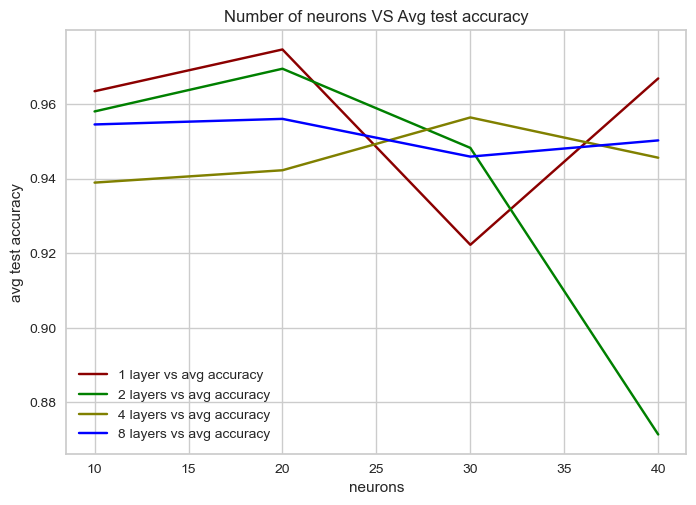

In [311]:
# plot 
# plt.figure(figsize=(9, 9))
plt.plot(neurons, data_1_layer['Avg test acc'], 'darkred', label = "1 layer vs avg accuracy")
plt.plot(neurons, data_2_layer['Avg test acc'], 'green',label = "2 layers vs avg accuracy")
plt.plot(neurons, data_4_layer['Avg test acc'] ,'olive', label = "4 layers vs avg accuracy")
plt.plot(neurons, data_8_layer['Avg test acc'],'blue', label = "8 layers vs avg accuracy")


plt.title('Number of neurons VS Avg test accuracy')
plt.xlabel('neurons')
plt.ylabel('avg test accuracy')
plt.legend()
plt.show()

### Different learning rates and optimizers 

In [312]:
#Vary Learning rate and different optimizers
optimizer_learning_rates = [0.1,0.01,0.001,0.0001,0.00001,1,10]
mo_nums = [0.1,0.5,0.9]
optimizers_name = ['AdamW','RMSprop','SGD']
ls_dict_opt  = []
#------------------------------------------------------------------------------#
for op_name in tqdm(optimizers_name) :
  if op_name == 'AdamW' or op_name == 'RMSprop':
    for lr_num in optimizer_learning_rates:
      opt_l = optimizersg(op_name ,lr_num)
      model_opt =MLP (X_train,y_train,num_epochs,
                    Best_batch_size,verbose,opt_l,best_num_hidden,best_num_neurons)
      model_opt_fit = multiple_fit(model_opt ,5 ,X_train,y_train,X_test, 
                      y_test,PLot_Loss=False)
      train_opt = summary(model_opt_fit["Acc_Train"],'Train')
      test_opt = summary(model_opt_fit["Acc_Test"],'Test')
      

      All_opt= {
          "Optimizer_name":op_name,
          "learning_rates":lr_num ,
          "Momentum_numbers": 'null' ,

          "Max train acc":train_opt["Train Acc_max"] ,
          "Min train acc":train_opt["Train Acc_min"],
          "Avg train acc":train_opt["Train Acc_avg"],

          "Max test acc":test_opt["Test Acc_max"],
          "Min test acc":test_opt["Test Acc_min"],
          "Avg test acc":test_opt["Test Acc_avg"], 


      }
      ls_dict_opt.append(All_opt)

  else:      
      for lr_num in tqdm(optimizer_learning_rates):
        opt_l = optimizersg(op_name ,lr_num)
        model_opt =MLP (X_train,y_train,num_epochs,
                    Best_batch_size,verbose,opt_l,best_num_hidden,best_num_neurons)
        model_opt_fit = multiple_fit(model_opt ,5 ,X_train,y_train,X_test, 
                      y_test,PLot_Loss=False)
        train_opt = summary(model_opt_fit["Acc_Train"],'Train')
        test_opt = summary(model_opt_fit["Acc_Test"],'Test')

        All_opt= {
          "Optimizer_name":op_name,
          "learning_rates":lr_num ,
      

          "Max train acc":train_opt["Train Acc_max"] ,
          "Min train acc":train_opt["Train Acc_min"],
          "Avg train acc":train_opt["Train Acc_avg"],

          "Max test acc":test_opt["Test Acc_max"],
          "Min test acc":test_opt["Test Acc_min"],
          "Avg test acc":test_opt["Test Acc_avg"],

      }
      
        ls_dict_opt.append(All_opt)
#------------------------------------------------------------------------------#
All_opt = pd.DataFrame.from_dict(ls_dict_opt)

  0%|                                                                                            | 0/3 [00:00<?, ?it/s]

Epoch 1/500
235/235 [==============================] - 1s 989us/step - loss: 0.6608 - accuracy: 0.6940
Epoch 2/500
235/235 [==============================] - 0s 952us/step - loss: 0.4136 - accuracy: 0.8377
Epoch 3/500
235/235 [==============================] - 0s 951us/step - loss: 0.4012 - accuracy: 0.8396
Epoch 4/500
235/235 [==============================] - 0s 949us/step - loss: 0.3900 - accuracy: 0.8403
Epoch 5/500
235/235 [==============================] - 0s 990us/step - loss: 0.3835 - accuracy: 0.8428
Epoch 6/500
235/235 [==============================] - 0s 946us/step - loss: 0.3768 - accuracy: 0.8425
Epoch 7/500
235/235 [==============================] - 0s 949us/step - loss: 0.3711 - accuracy: 0.8453
Epoch 8/500
235/235 [==============================] - 0s 972us/step - loss: 0.3657 - accuracy: 0.8503
Epoch 9/500
235/235 [==============================] - 0s 962us/step - loss: 0.3601 - accuracy: 0.8521
Epoch 10/500
235/235 [==============================] - 0s 956us/step - l

Epoch 80/500
235/235 [==============================] - 0s 1ms/step - loss: 0.2157 - accuracy: 0.9137
Epoch 81/500
235/235 [==============================] - 0s 985us/step - loss: 0.2155 - accuracy: 0.9121
Epoch 82/500
235/235 [==============================] - 0s 976us/step - loss: 0.2173 - accuracy: 0.9123
Epoch 83/500
235/235 [==============================] - 0s 1ms/step - loss: 0.2138 - accuracy: 0.9142
Epoch 84/500
235/235 [==============================] - 0s 1ms/step - loss: 0.2144 - accuracy: 0.9129
Epoch 85/500
235/235 [==============================] - 0s 1ms/step - loss: 0.2129 - accuracy: 0.9143
Epoch 86/500
235/235 [==============================] - 0s 997us/step - loss: 0.2129 - accuracy: 0.9147
Epoch 87/500
235/235 [==============================] - 0s 1ms/step - loss: 0.2136 - accuracy: 0.9139
Epoch 88/500
235/235 [==============================] - 0s 890us/step - loss: 0.2123 - accuracy: 0.9141
Epoch 89/500
235/235 [==============================] - 0s 877us/step - lo

235/235 [==============================] - 0s 943us/step - loss: 0.1775 - accuracy: 0.9274
Epoch 159/500
235/235 [==============================] - 0s 898us/step - loss: 0.1766 - accuracy: 0.9276
Epoch 160/500
235/235 [==============================] - 0s 894us/step - loss: 0.1800 - accuracy: 0.9284
Epoch 161/500
235/235 [==============================] - 0s 887us/step - loss: 0.1773 - accuracy: 0.9277
Epoch 162/500
235/235 [==============================] - 0s 902us/step - loss: 0.1767 - accuracy: 0.9285
Epoch 163/500
235/235 [==============================] - 0s 893us/step - loss: 0.1767 - accuracy: 0.9285
Epoch 164/500
235/235 [==============================] - 0s 903us/step - loss: 0.1761 - accuracy: 0.9267
Epoch 165/500
235/235 [==============================] - 0s 900us/step - loss: 0.1752 - accuracy: 0.9298
Epoch 166/500
235/235 [==============================] - 0s 891us/step - loss: 0.1759 - accuracy: 0.9281
Epoch 167/500
235/235 [==============================] - 0s 918us/ste

235/235 [==============================] - 0s 889us/step - loss: 0.1648 - accuracy: 0.9301
Epoch 237/500
235/235 [==============================] - 0s 898us/step - loss: 0.1629 - accuracy: 0.9336
Epoch 238/500
235/235 [==============================] - 0s 898us/step - loss: 0.1658 - accuracy: 0.9316
Epoch 239/500
235/235 [==============================] - 0s 900us/step - loss: 0.1636 - accuracy: 0.9337
Epoch 240/500
235/235 [==============================] - 0s 891us/step - loss: 0.1643 - accuracy: 0.9315
Epoch 241/500
235/235 [==============================] - 0s 905us/step - loss: 0.1639 - accuracy: 0.9336
Epoch 242/500
235/235 [==============================] - 0s 893us/step - loss: 0.1634 - accuracy: 0.9323
Epoch 243/500
235/235 [==============================] - 0s 897us/step - loss: 0.1637 - accuracy: 0.9318
Epoch 244/500
235/235 [==============================] - 0s 899us/step - loss: 0.1649 - accuracy: 0.9321
Epoch 245/500
235/235 [==============================] - 0s 893us/ste

235/235 [==============================] - 0s 923us/step - loss: 0.1599 - accuracy: 0.9331
Epoch 315/500
235/235 [==============================] - 0s 907us/step - loss: 0.1626 - accuracy: 0.9327
Epoch 316/500
235/235 [==============================] - 0s 902us/step - loss: 0.1598 - accuracy: 0.9331
Epoch 317/500
235/235 [==============================] - 0s 909us/step - loss: 0.1578 - accuracy: 0.9347
Epoch 318/500
235/235 [==============================] - 0s 913us/step - loss: 0.1579 - accuracy: 0.9335
Epoch 319/500
235/235 [==============================] - 0s 915us/step - loss: 0.1583 - accuracy: 0.9353
Epoch 320/500
235/235 [==============================] - 0s 910us/step - loss: 0.1574 - accuracy: 0.9335
Epoch 321/500
235/235 [==============================] - 0s 898us/step - loss: 0.1570 - accuracy: 0.9341
Epoch 322/500
235/235 [==============================] - 0s 899us/step - loss: 0.1617 - accuracy: 0.9325
Epoch 323/500
235/235 [==============================] - 0s 910us/ste

235/235 [==============================] - 0s 913us/step - loss: 0.1578 - accuracy: 0.9351
Epoch 393/500
235/235 [==============================] - 0s 906us/step - loss: 0.1543 - accuracy: 0.9365
Epoch 394/500
235/235 [==============================] - 0s 974us/step - loss: 0.1572 - accuracy: 0.9357
Epoch 395/500
235/235 [==============================] - 0s 918us/step - loss: 0.1564 - accuracy: 0.9357
Epoch 396/500
235/235 [==============================] - 0s 959us/step - loss: 0.1568 - accuracy: 0.9347
Epoch 397/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1546 - accuracy: 0.9351
Epoch 398/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1569 - accuracy: 0.9353
Epoch 399/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1570 - accuracy: 0.9351
Epoch 400/500
235/235 [==============================] - 0s 888us/step - loss: 0.1556 - accuracy: 0.9357
Epoch 401/500
235/235 [==============================] - 0s 930us/step - lo

235/235 [==============================] - 0s 951us/step - loss: 0.1532 - accuracy: 0.9362
Epoch 471/500
235/235 [==============================] - 0s 968us/step - loss: 0.1544 - accuracy: 0.9371
Epoch 472/500
235/235 [==============================] - 0s 984us/step - loss: 0.1540 - accuracy: 0.9353
Epoch 473/500
235/235 [==============================] - 0s 955us/step - loss: 0.1545 - accuracy: 0.9371
Epoch 474/500
235/235 [==============================] - 0s 997us/step - loss: 0.1563 - accuracy: 0.9349
Epoch 475/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1545 - accuracy: 0.9351
Epoch 476/500
235/235 [==============================] - 0s 986us/step - loss: 0.1573 - accuracy: 0.9367
Epoch 477/500
235/235 [==============================] - 0s 959us/step - loss: 0.1562 - accuracy: 0.9367
Epoch 478/500
235/235 [==============================] - 0s 995us/step - loss: 0.1555 - accuracy: 0.9345
Epoch 479/500
235/235 [==============================] - 0s 952us/step 

235/235 [==============================] - 0s 904us/step - loss: 0.2299 - accuracy: 0.9122
Epoch 45/500
235/235 [==============================] - 0s 891us/step - loss: 0.2289 - accuracy: 0.9105
Epoch 46/500
235/235 [==============================] - 0s 902us/step - loss: 0.2286 - accuracy: 0.9113
Epoch 47/500
235/235 [==============================] - 0s 903us/step - loss: 0.2284 - accuracy: 0.9101
Epoch 48/500
235/235 [==============================] - 0s 903us/step - loss: 0.2294 - accuracy: 0.9114
Epoch 49/500
235/235 [==============================] - 0s 894us/step - loss: 0.2296 - accuracy: 0.9108
Epoch 50/500
235/235 [==============================] - 0s 898us/step - loss: 0.2274 - accuracy: 0.9113
Epoch 51/500
235/235 [==============================] - 0s 906us/step - loss: 0.2254 - accuracy: 0.9117
Epoch 52/500
235/235 [==============================] - 0s 900us/step - loss: 0.2258 - accuracy: 0.9131
Epoch 53/500
235/235 [==============================] - 0s 913us/step - loss:

235/235 [==============================] - 0s 897us/step - loss: 0.2001 - accuracy: 0.9161
Epoch 123/500
235/235 [==============================] - 0s 898us/step - loss: 0.2005 - accuracy: 0.9168
Epoch 124/500
235/235 [==============================] - 0s 908us/step - loss: 0.2004 - accuracy: 0.9175
Epoch 125/500
235/235 [==============================] - 0s 900us/step - loss: 0.1994 - accuracy: 0.9167
Epoch 126/500
235/235 [==============================] - 0s 918us/step - loss: 0.1964 - accuracy: 0.9169
Epoch 127/500
235/235 [==============================] - 0s 899us/step - loss: 0.1982 - accuracy: 0.9171
Epoch 128/500
235/235 [==============================] - 0s 909us/step - loss: 0.1992 - accuracy: 0.9175
Epoch 129/500
235/235 [==============================] - 0s 898us/step - loss: 0.1975 - accuracy: 0.9175
Epoch 130/500
235/235 [==============================] - 0s 901us/step - loss: 0.1976 - accuracy: 0.9175
Epoch 131/500
235/235 [==============================] - 0s 901us/ste

235/235 [==============================] - 0s 850us/step - loss: 0.1881 - accuracy: 0.9205
Epoch 201/500
235/235 [==============================] - 0s 881us/step - loss: 0.1896 - accuracy: 0.9186
Epoch 202/500
235/235 [==============================] - 0s 950us/step - loss: 0.1875 - accuracy: 0.9195
Epoch 203/500
235/235 [==============================] - 0s 922us/step - loss: 0.1872 - accuracy: 0.9207
Epoch 204/500
235/235 [==============================] - 0s 952us/step - loss: 0.1878 - accuracy: 0.9212
Epoch 205/500
235/235 [==============================] - 0s 991us/step - loss: 0.1870 - accuracy: 0.9211
Epoch 206/500
235/235 [==============================] - 0s 970us/step - loss: 0.1855 - accuracy: 0.9216
Epoch 207/500
235/235 [==============================] - 0s 915us/step - loss: 0.1890 - accuracy: 0.9196
Epoch 208/500
235/235 [==============================] - 0s 928us/step - loss: 0.1874 - accuracy: 0.9201
Epoch 209/500
235/235 [==============================] - 0s 932us/ste

235/235 [==============================] - 0s 1ms/step - loss: 0.1815 - accuracy: 0.9215
Epoch 279/500
235/235 [==============================] - 0s 940us/step - loss: 0.1825 - accuracy: 0.9215
Epoch 280/500
235/235 [==============================] - 0s 936us/step - loss: 0.1841 - accuracy: 0.9209
Epoch 281/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1831 - accuracy: 0.9212
Epoch 282/500
235/235 [==============================] - 0s 910us/step - loss: 0.1843 - accuracy: 0.9207
Epoch 283/500
235/235 [==============================] - 0s 902us/step - loss: 0.1827 - accuracy: 0.9211
Epoch 284/500
235/235 [==============================] - 0s 906us/step - loss: 0.1825 - accuracy: 0.9220
Epoch 285/500
235/235 [==============================] - 0s 902us/step - loss: 0.1831 - accuracy: 0.9201
Epoch 286/500
235/235 [==============================] - 0s 909us/step - loss: 0.1816 - accuracy: 0.9216
Epoch 287/500
235/235 [==============================] - 0s 904us/step - 

235/235 [==============================] - 0s 860us/step - loss: 0.1797 - accuracy: 0.9230
Epoch 357/500
235/235 [==============================] - 0s 880us/step - loss: 0.1793 - accuracy: 0.9219
Epoch 358/500
235/235 [==============================] - 0s 869us/step - loss: 0.1827 - accuracy: 0.9223
Epoch 359/500
235/235 [==============================] - 0s 859us/step - loss: 0.1798 - accuracy: 0.9223
Epoch 360/500
235/235 [==============================] - 0s 856us/step - loss: 0.1793 - accuracy: 0.9223
Epoch 361/500
235/235 [==============================] - 0s 856us/step - loss: 0.1817 - accuracy: 0.9201
Epoch 362/500
235/235 [==============================] - 0s 856us/step - loss: 0.1818 - accuracy: 0.9205
Epoch 363/500
235/235 [==============================] - 0s 861us/step - loss: 0.1790 - accuracy: 0.9215
Epoch 364/500
235/235 [==============================] - 0s 854us/step - loss: 0.1808 - accuracy: 0.9207
Epoch 365/500
235/235 [==============================] - 0s 854us/ste

235/235 [==============================] - 0s 833us/step - loss: 0.1750 - accuracy: 0.9230
Epoch 435/500
235/235 [==============================] - 0s 849us/step - loss: 0.1746 - accuracy: 0.9262
Epoch 436/500
235/235 [==============================] - 0s 888us/step - loss: 0.1745 - accuracy: 0.9234
Epoch 437/500
235/235 [==============================] - 0s 880us/step - loss: 0.1746 - accuracy: 0.9245
Epoch 438/500
235/235 [==============================] - 0s 889us/step - loss: 0.1735 - accuracy: 0.9267
Epoch 439/500
235/235 [==============================] - 0s 880us/step - loss: 0.1737 - accuracy: 0.9265
Epoch 440/500
235/235 [==============================] - 0s 911us/step - loss: 0.1714 - accuracy: 0.9257
Epoch 441/500
235/235 [==============================] - 0s 928us/step - loss: 0.1747 - accuracy: 0.9257
Epoch 442/500
235/235 [==============================] - 0s 872us/step - loss: 0.1750 - accuracy: 0.9251
Epoch 443/500
235/235 [==============================] - 0s 879us/ste

235/235 [==============================] - 0s 941us/step - loss: 0.2971 - accuracy: 0.8978
Epoch 9/500
235/235 [==============================] - 0s 948us/step - loss: 0.2887 - accuracy: 0.9002
Epoch 10/500
235/235 [==============================] - 0s 936us/step - loss: 0.2823 - accuracy: 0.9019
Epoch 11/500
235/235 [==============================] - 0s 943us/step - loss: 0.2758 - accuracy: 0.9028
Epoch 12/500
235/235 [==============================] - 0s 954us/step - loss: 0.2708 - accuracy: 0.9047
Epoch 13/500
235/235 [==============================] - 0s 927us/step - loss: 0.2678 - accuracy: 0.9049
Epoch 14/500
235/235 [==============================] - 0s 928us/step - loss: 0.2652 - accuracy: 0.9051
Epoch 15/500
235/235 [==============================] - 0s 904us/step - loss: 0.2625 - accuracy: 0.9053
Epoch 16/500
235/235 [==============================] - 0s 934us/step - loss: 0.2595 - accuracy: 0.9057
Epoch 17/500
235/235 [==============================] - 0s 984us/step - loss: 

235/235 [==============================] - 0s 968us/step - loss: 0.2121 - accuracy: 0.9144
Epoch 88/500
235/235 [==============================] - 0s 951us/step - loss: 0.2118 - accuracy: 0.9135
Epoch 89/500
235/235 [==============================] - 0s 993us/step - loss: 0.2131 - accuracy: 0.9139
Epoch 90/500
235/235 [==============================] - 0s 1ms/step - loss: 0.2122 - accuracy: 0.9140
Epoch 91/500
235/235 [==============================] - 0s 990us/step - loss: 0.2130 - accuracy: 0.9140
Epoch 92/500
235/235 [==============================] - 0s 1ms/step - loss: 0.2111 - accuracy: 0.9148
Epoch 93/500
235/235 [==============================] - 0s 1ms/step - loss: 0.2116 - accuracy: 0.9129
Epoch 94/500
235/235 [==============================] - 0s 942us/step - loss: 0.2111 - accuracy: 0.9147
Epoch 95/500
235/235 [==============================] - 0s 946us/step - loss: 0.2100 - accuracy: 0.9143
Epoch 96/500
235/235 [==============================] - 0s 919us/step - loss: 0.211

Epoch 166/500
235/235 [==============================] - 0s 1ms/step - loss: 0.2000 - accuracy: 0.9154
Epoch 167/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1995 - accuracy: 0.9162
Epoch 168/500
235/235 [==============================] - 0s 1ms/step - loss: 0.2003 - accuracy: 0.9164
Epoch 169/500
235/235 [==============================] - 0s 968us/step - loss: 0.1999 - accuracy: 0.9162
Epoch 170/500
235/235 [==============================] - 0s 980us/step - loss: 0.2007 - accuracy: 0.9151
Epoch 171/500
235/235 [==============================] - 0s 992us/step - loss: 0.2024 - accuracy: 0.9160
Epoch 172/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1998 - accuracy: 0.9160
Epoch 173/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1997 - accuracy: 0.9156
Epoch 174/500
235/235 [==============================] - 0s 924us/step - loss: 0.1979 - accuracy: 0.9161
Epoch 175/500
235/235 [==============================] - 0s 935us

235/235 [==============================] - 0s 971us/step - loss: 0.1838 - accuracy: 0.9227
Epoch 245/500
235/235 [==============================] - 0s 977us/step - loss: 0.1832 - accuracy: 0.9225
Epoch 246/500
235/235 [==============================] - 0s 953us/step - loss: 0.1834 - accuracy: 0.9231
Epoch 247/500
235/235 [==============================] - 0s 960us/step - loss: 0.1826 - accuracy: 0.9242
Epoch 248/500
235/235 [==============================] - 0s 924us/step - loss: 0.1824 - accuracy: 0.9238
Epoch 249/500
235/235 [==============================] - 0s 979us/step - loss: 0.1821 - accuracy: 0.9229
Epoch 250/500
235/235 [==============================] - 0s 983us/step - loss: 0.1818 - accuracy: 0.9242
Epoch 251/500
235/235 [==============================] - 0s 983us/step - loss: 0.1803 - accuracy: 0.9242
Epoch 252/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1813 - accuracy: 0.9242
Epoch 253/500
235/235 [==============================] - 0s 977us/step 

235/235 [==============================] - 0s 981us/step - loss: 0.1698 - accuracy: 0.9291
Epoch 323/500
235/235 [==============================] - 0s 976us/step - loss: 0.1699 - accuracy: 0.9291
Epoch 324/500
235/235 [==============================] - 0s 979us/step - loss: 0.1690 - accuracy: 0.9310
Epoch 325/500
235/235 [==============================] - 0s 975us/step - loss: 0.1682 - accuracy: 0.9301
Epoch 326/500
235/235 [==============================] - 0s 980us/step - loss: 0.1705 - accuracy: 0.9309
Epoch 327/500
235/235 [==============================] - 0s 973us/step - loss: 0.1698 - accuracy: 0.9304
Epoch 328/500
235/235 [==============================] - 0s 966us/step - loss: 0.1701 - accuracy: 0.9319
Epoch 329/500
235/235 [==============================] - 0s 942us/step - loss: 0.1683 - accuracy: 0.9307
Epoch 330/500
235/235 [==============================] - 0s 968us/step - loss: 0.1716 - accuracy: 0.9305
Epoch 331/500
235/235 [==============================] - 0s 977us/ste

235/235 [==============================] - 0s 948us/step - loss: 0.1664 - accuracy: 0.9317
Epoch 401/500
235/235 [==============================] - 0s 910us/step - loss: 0.1672 - accuracy: 0.9321
Epoch 402/500
235/235 [==============================] - 0s 958us/step - loss: 0.1657 - accuracy: 0.9330
Epoch 403/500
235/235 [==============================] - 0s 963us/step - loss: 0.1662 - accuracy: 0.9320
Epoch 404/500
235/235 [==============================] - 0s 969us/step - loss: 0.1676 - accuracy: 0.9309
Epoch 405/500
235/235 [==============================] - 0s 998us/step - loss: 0.1667 - accuracy: 0.9293
Epoch 406/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1673 - accuracy: 0.9317
Epoch 407/500
235/235 [==============================] - 0s 990us/step - loss: 0.1670 - accuracy: 0.9314
Epoch 408/500
235/235 [==============================] - 0s 981us/step - loss: 0.1654 - accuracy: 0.9334
Epoch 409/500
235/235 [==============================] - 0s 957us/step 

235/235 [==============================] - 0s 981us/step - loss: 0.1654 - accuracy: 0.9322
Epoch 479/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1649 - accuracy: 0.9326
Epoch 480/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1665 - accuracy: 0.9305
Epoch 481/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1656 - accuracy: 0.9319
Epoch 482/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1659 - accuracy: 0.9325
Epoch 483/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1653 - accuracy: 0.9319
Epoch 484/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1633 - accuracy: 0.9323
Epoch 485/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1638 - accuracy: 0.9327
Epoch 486/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1645 - accuracy: 0.9327
Epoch 487/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1663 -

235/235 [==============================] - 0s 1ms/step - loss: 0.2204 - accuracy: 0.9116
Epoch 54/500
235/235 [==============================] - 0s 911us/step - loss: 0.2191 - accuracy: 0.9120
Epoch 55/500
235/235 [==============================] - 0s 938us/step - loss: 0.2202 - accuracy: 0.9098
Epoch 56/500
235/235 [==============================] - 0s 970us/step - loss: 0.2181 - accuracy: 0.9118
Epoch 57/500
235/235 [==============================] - 0s 1ms/step - loss: 0.2180 - accuracy: 0.9116
Epoch 58/500
235/235 [==============================] - 0s 1ms/step - loss: 0.2185 - accuracy: 0.9124
Epoch 59/500
235/235 [==============================] - 0s 1ms/step - loss: 0.2175 - accuracy: 0.9119
Epoch 60/500
235/235 [==============================] - 0s 1ms/step - loss: 0.2173 - accuracy: 0.9123
Epoch 61/500
235/235 [==============================] - 0s 872us/step - loss: 0.2167 - accuracy: 0.9125
Epoch 62/500
235/235 [==============================] - 0s 950us/step - loss: 0.2151 - 

235/235 [==============================] - 0s 891us/step - loss: 0.1851 - accuracy: 0.9239
Epoch 132/500
235/235 [==============================] - 0s 881us/step - loss: 0.1849 - accuracy: 0.9228
Epoch 133/500
235/235 [==============================] - 0s 873us/step - loss: 0.1872 - accuracy: 0.9231
Epoch 134/500
235/235 [==============================] - 0s 862us/step - loss: 0.1840 - accuracy: 0.9247
Epoch 135/500
235/235 [==============================] - 0s 887us/step - loss: 0.1865 - accuracy: 0.9235
Epoch 136/500
235/235 [==============================] - 0s 885us/step - loss: 0.1854 - accuracy: 0.9252
Epoch 137/500
235/235 [==============================] - 0s 879us/step - loss: 0.1851 - accuracy: 0.9247
Epoch 138/500
235/235 [==============================] - 0s 889us/step - loss: 0.1840 - accuracy: 0.9253
Epoch 139/500
235/235 [==============================] - 0s 877us/step - loss: 0.1854 - accuracy: 0.9239
Epoch 140/500
235/235 [==============================] - 0s 878us/ste

235/235 [==============================] - 0s 880us/step - loss: 0.1766 - accuracy: 0.9282
Epoch 210/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1755 - accuracy: 0.9291
Epoch 211/500
235/235 [==============================] - 0s 884us/step - loss: 0.1779 - accuracy: 0.9282
Epoch 212/500
235/235 [==============================] - 0s 874us/step - loss: 0.1745 - accuracy: 0.9303
Epoch 213/500
235/235 [==============================] - 0s 872us/step - loss: 0.1740 - accuracy: 0.9296
Epoch 214/500
235/235 [==============================] - 0s 877us/step - loss: 0.1750 - accuracy: 0.9299
Epoch 215/500
235/235 [==============================] - 0s 871us/step - loss: 0.1752 - accuracy: 0.9277
Epoch 216/500
235/235 [==============================] - 0s 884us/step - loss: 0.1770 - accuracy: 0.9275
Epoch 217/500
235/235 [==============================] - 0s 874us/step - loss: 0.1732 - accuracy: 0.9308
Epoch 218/500
235/235 [==============================] - 0s 892us/step 

235/235 [==============================] - 0s 934us/step - loss: 0.1728 - accuracy: 0.9297
Epoch 288/500
235/235 [==============================] - 0s 942us/step - loss: 0.1730 - accuracy: 0.9287
Epoch 289/500
235/235 [==============================] - 0s 930us/step - loss: 0.1725 - accuracy: 0.9311
Epoch 290/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1700 - accuracy: 0.9313
Epoch 291/500
235/235 [==============================] - 0s 949us/step - loss: 0.1704 - accuracy: 0.9308
Epoch 292/500
235/235 [==============================] - 0s 945us/step - loss: 0.1725 - accuracy: 0.9297
Epoch 293/500
235/235 [==============================] - 0s 948us/step - loss: 0.1711 - accuracy: 0.9304
Epoch 294/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1744 - accuracy: 0.9299
Epoch 295/500
235/235 [==============================] - 0s 924us/step - loss: 0.1756 - accuracy: 0.9310
Epoch 296/500
235/235 [==============================] - 0s 1ms/step - lo

235/235 [==============================] - 0s 1ms/step - loss: 0.1705 - accuracy: 0.9317
Epoch 366/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1702 - accuracy: 0.9312
Epoch 367/500
235/235 [==============================] - 0s 979us/step - loss: 0.1688 - accuracy: 0.9308
Epoch 368/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1691 - accuracy: 0.9305
Epoch 369/500
235/235 [==============================] - 0s 901us/step - loss: 0.1706 - accuracy: 0.9320
Epoch 370/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1698 - accuracy: 0.9321
Epoch 371/500
235/235 [==============================] - 0s 1ms/step - loss: 0.1703 - accuracy: 0.9309
Epoch 372/500
235/235 [==============================] - 0s 960us/step - loss: 0.1710 - accuracy: 0.9300
Epoch 373/500
235/235 [==============================] - 0s 931us/step - loss: 0.1724 - accuracy: 0.9301
Epoch 374/500
235/235 [==============================] - 0s 939us/step - loss: 

235/235 [==============================] - 0s 1ms/step - loss: 0.1689 - accuracy: 0.9309
Epoch 444/500
235/235 [==============================] - 0s 915us/step - loss: 0.1674 - accuracy: 0.9320
Epoch 445/500
235/235 [==============================] - 0s 937us/step - loss: 0.1662 - accuracy: 0.9331
Epoch 446/500
235/235 [==============================] - 0s 921us/step - loss: 0.1690 - accuracy: 0.9315
Epoch 447/500
235/235 [==============================] - 0s 912us/step - loss: 0.1695 - accuracy: 0.9315
Epoch 448/500
235/235 [==============================] - 0s 921us/step - loss: 0.1704 - accuracy: 0.9328
Epoch 449/500
235/235 [==============================] - 0s 961us/step - loss: 0.1686 - accuracy: 0.9309
Epoch 450/500
235/235 [==============================] - 0s 907us/step - loss: 0.1693 - accuracy: 0.9312
Epoch 451/500
235/235 [==============================] - 0s 936us/step - loss: 0.1666 - accuracy: 0.9328
Epoch 452/500
235/235 [==============================] - 0s 958us/step 

235/235 [==============================] - 0s 911us/step - loss: 0.2962 - accuracy: 0.8936
Epoch 18/500
235/235 [==============================] - 0s 881us/step - loss: 0.2907 - accuracy: 0.8957
Epoch 19/500
235/235 [==============================] - 0s 900us/step - loss: 0.2857 - accuracy: 0.8995
Epoch 20/500
235/235 [==============================] - 0s 890us/step - loss: 0.2830 - accuracy: 0.9025
Epoch 21/500
235/235 [==============================] - 0s 886us/step - loss: 0.2771 - accuracy: 0.9035
Epoch 22/500
235/235 [==============================] - 0s 890us/step - loss: 0.2733 - accuracy: 0.9052
Epoch 23/500
235/235 [==============================] - 0s 875us/step - loss: 0.2701 - accuracy: 0.9055
Epoch 24/500
235/235 [==============================] - 0s 888us/step - loss: 0.2691 - accuracy: 0.9059
Epoch 25/500
235/235 [==============================] - 0s 878us/step - loss: 0.2657 - accuracy: 0.9064
Epoch 26/500
235/235 [==============================] - 0s 883us/step - loss:

235/235 [==============================] - 0s 887us/step - loss: 0.2096 - accuracy: 0.9148
Epoch 96/500
235/235 [==============================] - 0s 887us/step - loss: 0.2084 - accuracy: 0.9140
Epoch 97/500
235/235 [==============================] - 0s 872us/step - loss: 0.2082 - accuracy: 0.9147
Epoch 98/500
235/235 [==============================] - 0s 879us/step - loss: 0.2082 - accuracy: 0.9147
Epoch 99/500
235/235 [==============================] - 0s 877us/step - loss: 0.2060 - accuracy: 0.9162
Epoch 100/500
235/235 [==============================] - 0s 887us/step - loss: 0.2101 - accuracy: 0.9140
Epoch 101/500
235/235 [==============================] - 0s 887us/step - loss: 0.2057 - accuracy: 0.9153
Epoch 102/500
235/235 [==============================] - 0s 876us/step - loss: 0.2068 - accuracy: 0.9155
Epoch 103/500
235/235 [==============================] - 0s 880us/step - loss: 0.2071 - accuracy: 0.9149
Epoch 104/500
235/235 [==============================] - 0s 880us/step - 

235/235 [==============================] - 0s 906us/step - loss: 0.1865 - accuracy: 0.9269
Epoch 174/500
235/235 [==============================] - 0s 932us/step - loss: 0.1844 - accuracy: 0.9269
Epoch 175/500
235/235 [==============================] - 0s 931us/step - loss: 0.1913 - accuracy: 0.9241
Epoch 176/500
235/235 [==============================] - 0s 923us/step - loss: 0.1859 - accuracy: 0.9258
Epoch 177/500
235/235 [==============================] - 0s 910us/step - loss: 0.1833 - accuracy: 0.9267
Epoch 178/500
235/235 [==============================] - 0s 866us/step - loss: 0.1854 - accuracy: 0.9267
Epoch 179/500
235/235 [==============================] - 0s 854us/step - loss: 0.1853 - accuracy: 0.9261
Epoch 180/500
235/235 [==============================] - 0s 893us/step - loss: 0.1857 - accuracy: 0.9266
Epoch 181/500
235/235 [==============================] - 0s 890us/step - loss: 0.1867 - accuracy: 0.9259
Epoch 182/500
235/235 [==============================] - 0s 869us/ste

235/235 [==============================] - 0s 881us/step - loss: 0.1758 - accuracy: 0.9296
Epoch 252/500
235/235 [==============================] - 0s 871us/step - loss: 0.1757 - accuracy: 0.9298
Epoch 253/500
235/235 [==============================] - 0s 892us/step - loss: 0.1733 - accuracy: 0.9305
Epoch 254/500
235/235 [==============================] - 0s 879us/step - loss: 0.1747 - accuracy: 0.9296
Epoch 255/500
235/235 [==============================] - 0s 881us/step - loss: 0.1754 - accuracy: 0.9303
Epoch 256/500
235/235 [==============================] - 0s 902us/step - loss: 0.1743 - accuracy: 0.9303
Epoch 257/500
235/235 [==============================] - 0s 887us/step - loss: 0.1763 - accuracy: 0.9295
Epoch 258/500
235/235 [==============================] - 0s 889us/step - loss: 0.1783 - accuracy: 0.9305
Epoch 259/500
235/235 [==============================] - 0s 884us/step - loss: 0.1753 - accuracy: 0.9297
Epoch 260/500
235/235 [==============================] - 0s 875us/ste

235/235 [==============================] - 0s 879us/step - loss: 0.1714 - accuracy: 0.9308
Epoch 330/500
235/235 [==============================] - 0s 876us/step - loss: 0.1709 - accuracy: 0.9315
Epoch 331/500
235/235 [==============================] - 0s 881us/step - loss: 0.1696 - accuracy: 0.9330
Epoch 332/500
235/235 [==============================] - 0s 882us/step - loss: 0.1705 - accuracy: 0.9323
Epoch 333/500
235/235 [==============================] - 0s 884us/step - loss: 0.1711 - accuracy: 0.9325
Epoch 334/500
235/235 [==============================] - 0s 878us/step - loss: 0.1737 - accuracy: 0.9291
Epoch 335/500
235/235 [==============================] - 0s 878us/step - loss: 0.1707 - accuracy: 0.9323
Epoch 336/500
235/235 [==============================] - 0s 879us/step - loss: 0.1739 - accuracy: 0.9320
Epoch 337/500
235/235 [==============================] - 0s 889us/step - loss: 0.1723 - accuracy: 0.9314
Epoch 338/500
235/235 [==============================] - 0s 878us/ste

235/235 [==============================] - 0s 892us/step - loss: 0.1699 - accuracy: 0.9321
Epoch 408/500
235/235 [==============================] - 0s 875us/step - loss: 0.1685 - accuracy: 0.9325
Epoch 409/500
235/235 [==============================] - 0s 885us/step - loss: 0.1691 - accuracy: 0.9325
Epoch 410/500
235/235 [==============================] - 0s 885us/step - loss: 0.1749 - accuracy: 0.9291
Epoch 411/500
235/235 [==============================] - 0s 885us/step - loss: 0.1685 - accuracy: 0.9330
Epoch 412/500
235/235 [==============================] - 0s 883us/step - loss: 0.1704 - accuracy: 0.9331
Epoch 413/500
235/235 [==============================] - 0s 884us/step - loss: 0.1701 - accuracy: 0.9318
Epoch 414/500
235/235 [==============================] - 0s 883us/step - loss: 0.1706 - accuracy: 0.9317
Epoch 415/500
235/235 [==============================] - 0s 876us/step - loss: 0.1685 - accuracy: 0.9327
Epoch 416/500
235/235 [==============================] - 0s 883us/ste

235/235 [==============================] - 0s 879us/step - loss: 0.1680 - accuracy: 0.9334
Epoch 486/500
235/235 [==============================] - 0s 877us/step - loss: 0.1699 - accuracy: 0.9311
Epoch 487/500
235/235 [==============================] - 0s 889us/step - loss: 0.1699 - accuracy: 0.9323
Epoch 488/500
235/235 [==============================] - 0s 882us/step - loss: 0.1707 - accuracy: 0.9313
Epoch 489/500
235/235 [==============================] - 0s 883us/step - loss: 0.1693 - accuracy: 0.9331
Epoch 490/500
235/235 [==============================] - 0s 888us/step - loss: 0.1684 - accuracy: 0.9316
Epoch 491/500
235/235 [==============================] - 0s 879us/step - loss: 0.1720 - accuracy: 0.9301
Epoch 492/500
235/235 [==============================] - 0s 885us/step - loss: 0.1690 - accuracy: 0.9319
Epoch 493/500
235/235 [==============================] - 0s 883us/step - loss: 0.1690 - accuracy: 0.9327
Epoch 494/500
235/235 [==============================] - 0s 874us/ste

235/235 [==============================] - 0s 886us/step - loss: 0.2208 - accuracy: 0.9115
Epoch 60/500
235/235 [==============================] - 0s 876us/step - loss: 0.2217 - accuracy: 0.9114
Epoch 61/500
235/235 [==============================] - 0s 895us/step - loss: 0.2201 - accuracy: 0.9109
Epoch 62/500
235/235 [==============================] - 0s 883us/step - loss: 0.2201 - accuracy: 0.9115
Epoch 63/500
235/235 [==============================] - 0s 888us/step - loss: 0.2207 - accuracy: 0.9125
Epoch 64/500
235/235 [==============================] - 0s 886us/step - loss: 0.2197 - accuracy: 0.9117
Epoch 65/500
235/235 [==============================] - 0s 881us/step - loss: 0.2195 - accuracy: 0.9119
Epoch 66/500
235/235 [==============================] - 0s 896us/step - loss: 0.2197 - accuracy: 0.9119
Epoch 67/500
235/235 [==============================] - 0s 877us/step - loss: 0.2182 - accuracy: 0.9122
Epoch 68/500
235/235 [==============================] - 0s 898us/step - loss:

235/235 [==============================] - 0s 888us/step - loss: 0.2066 - accuracy: 0.9151
Epoch 138/500
235/235 [==============================] - 0s 882us/step - loss: 0.2113 - accuracy: 0.9127
Epoch 139/500
235/235 [==============================] - 0s 890us/step - loss: 0.2093 - accuracy: 0.9134
Epoch 140/500
235/235 [==============================] - 0s 881us/step - loss: 0.2096 - accuracy: 0.9141
Epoch 141/500
235/235 [==============================] - 0s 895us/step - loss: 0.2063 - accuracy: 0.9153
Epoch 142/500
235/235 [==============================] - 0s 905us/step - loss: 0.2075 - accuracy: 0.9139
Epoch 143/500
235/235 [==============================] - 0s 902us/step - loss: 0.2075 - accuracy: 0.9141
Epoch 144/500
235/235 [==============================] - 0s 888us/step - loss: 0.2067 - accuracy: 0.9142
Epoch 145/500
235/235 [==============================] - 0s 888us/step - loss: 0.2064 - accuracy: 0.9148
Epoch 146/500
235/235 [==============================] - 0s 903us/ste

235/235 [==============================] - 0s 878us/step - loss: 0.2023 - accuracy: 0.9160
Epoch 216/500
235/235 [==============================] - 0s 880us/step - loss: 0.2039 - accuracy: 0.9151
Epoch 217/500
235/235 [==============================] - 0s 893us/step - loss: 0.2029 - accuracy: 0.9155
Epoch 218/500
235/235 [==============================] - 0s 882us/step - loss: 0.2023 - accuracy: 0.9158
Epoch 219/500
235/235 [==============================] - 0s 886us/step - loss: 0.2017 - accuracy: 0.9161
Epoch 220/500
235/235 [==============================] - 0s 881us/step - loss: 0.2025 - accuracy: 0.9149
Epoch 221/500
235/235 [==============================] - 0s 881us/step - loss: 0.2016 - accuracy: 0.9164
Epoch 222/500
235/235 [==============================] - 0s 884us/step - loss: 0.2024 - accuracy: 0.9158
Epoch 223/500
235/235 [==============================] - 0s 885us/step - loss: 0.2007 - accuracy: 0.9160
Epoch 224/500
235/235 [==============================] - 0s 889us/ste

235/235 [==============================] - 0s 892us/step - loss: 0.1950 - accuracy: 0.9181
Epoch 294/500
235/235 [==============================] - 0s 888us/step - loss: 0.1946 - accuracy: 0.9182
Epoch 295/500
235/235 [==============================] - 0s 879us/step - loss: 0.1959 - accuracy: 0.9169
Epoch 296/500
235/235 [==============================] - 0s 899us/step - loss: 0.1957 - accuracy: 0.9184
Epoch 297/500
235/235 [==============================] - 0s 901us/step - loss: 0.1946 - accuracy: 0.9183
Epoch 298/500
235/235 [==============================] - 0s 883us/step - loss: 0.1931 - accuracy: 0.9187
Epoch 299/500
235/235 [==============================] - 0s 881us/step - loss: 0.1944 - accuracy: 0.9183
Epoch 300/500
235/235 [==============================] - 0s 895us/step - loss: 0.1953 - accuracy: 0.9183
Epoch 301/500
235/235 [==============================] - 0s 877us/step - loss: 0.1947 - accuracy: 0.9177
Epoch 302/500
235/235 [==============================] - 0s 882us/ste

235/235 [==============================] - 0s 881us/step - loss: 0.1766 - accuracy: 0.9282
Epoch 372/500
235/235 [==============================] - 0s 882us/step - loss: 0.1757 - accuracy: 0.9277
Epoch 373/500
235/235 [==============================] - 0s 982us/step - loss: 0.1742 - accuracy: 0.9276
Epoch 374/500
235/235 [==============================] - 0s 889us/step - loss: 0.1741 - accuracy: 0.9276
Epoch 375/500
235/235 [==============================] - 0s 881us/step - loss: 0.1773 - accuracy: 0.9269
Epoch 376/500
235/235 [==============================] - 0s 887us/step - loss: 0.1750 - accuracy: 0.9282
Epoch 377/500
235/235 [==============================] - 0s 881us/step - loss: 0.1743 - accuracy: 0.9280
Epoch 378/500
235/235 [==============================] - 0s 871us/step - loss: 0.1746 - accuracy: 0.9275
Epoch 379/500
235/235 [==============================] - 0s 886us/step - loss: 0.1746 - accuracy: 0.9285
Epoch 380/500
235/235 [==============================] - 0s 877us/ste

235/235 [==============================] - 0s 894us/step - loss: 0.1686 - accuracy: 0.9301
Epoch 450/500
235/235 [==============================] - 0s 880us/step - loss: 0.1680 - accuracy: 0.9305
Epoch 451/500
235/235 [==============================] - 0s 891us/step - loss: 0.1689 - accuracy: 0.9295
Epoch 452/500
235/235 [==============================] - 0s 885us/step - loss: 0.1673 - accuracy: 0.9318
Epoch 453/500
235/235 [==============================] - 0s 891us/step - loss: 0.1662 - accuracy: 0.9308
Epoch 454/500
235/235 [==============================] - 0s 889us/step - loss: 0.1694 - accuracy: 0.9296
Epoch 455/500
235/235 [==============================] - 0s 881us/step - loss: 0.1666 - accuracy: 0.9314
Epoch 456/500
235/235 [==============================] - 0s 891us/step - loss: 0.1663 - accuracy: 0.9315
Epoch 457/500
235/235 [==============================] - 0s 953us/step - loss: 0.1676 - accuracy: 0.9296
Epoch 458/500
235/235 [==============================] - 0s 1ms/step 

235/235 [==============================] - 0s 945us/step - loss: 0.2447 - accuracy: 0.9079
Epoch 24/500
235/235 [==============================] - 0s 941us/step - loss: 0.2434 - accuracy: 0.9086
Epoch 25/500
235/235 [==============================] - 0s 925us/step - loss: 0.2430 - accuracy: 0.9079
Epoch 26/500
235/235 [==============================] - 0s 981us/step - loss: 0.2406 - accuracy: 0.9079
Epoch 27/500
235/235 [==============================] - 0s 938us/step - loss: 0.2403 - accuracy: 0.9075
Epoch 28/500
235/235 [==============================] - 0s 936us/step - loss: 0.2387 - accuracy: 0.9083
Epoch 29/500
235/235 [==============================] - 0s 925us/step - loss: 0.2376 - accuracy: 0.9096
Epoch 30/500
235/235 [==============================] - 0s 938us/step - loss: 0.2368 - accuracy: 0.9091
Epoch 31/500
235/235 [==============================] - 0s 936us/step - loss: 0.2368 - accuracy: 0.9075
Epoch 32/500
235/235 [==============================] - 0s 925us/step - loss:

235/235 [==============================] - 0s 963us/step - loss: 0.2134 - accuracy: 0.9142
Epoch 102/500
235/235 [==============================] - 0s 898us/step - loss: 0.2130 - accuracy: 0.9127
Epoch 103/500
235/235 [==============================] - 0s 883us/step - loss: 0.2130 - accuracy: 0.9135
Epoch 104/500
235/235 [==============================] - 0s 888us/step - loss: 0.2155 - accuracy: 0.9132
Epoch 105/500
235/235 [==============================] - 0s 891us/step - loss: 0.2130 - accuracy: 0.9139
Epoch 106/500
235/235 [==============================] - 0s 892us/step - loss: 0.2137 - accuracy: 0.9129
Epoch 107/500
235/235 [==============================] - 0s 876us/step - loss: 0.2133 - accuracy: 0.9131
Epoch 108/500
235/235 [==============================] - 0s 887us/step - loss: 0.2121 - accuracy: 0.9137
Epoch 109/500
235/235 [==============================] - 0s 895us/step - loss: 0.2121 - accuracy: 0.9130
Epoch 110/500
235/235 [==============================] - 0s 889us/ste

235/235 [==============================] - 0s 896us/step - loss: 0.2046 - accuracy: 0.9155
Epoch 180/500
235/235 [==============================] - 0s 877us/step - loss: 0.2031 - accuracy: 0.9149
Epoch 181/500
235/235 [==============================] - 0s 884us/step - loss: 0.2026 - accuracy: 0.9149
Epoch 182/500
235/235 [==============================] - 0s 897us/step - loss: 0.2034 - accuracy: 0.9155
Epoch 183/500
235/235 [==============================] - 0s 889us/step - loss: 0.2018 - accuracy: 0.9154
Epoch 184/500
235/235 [==============================] - 0s 881us/step - loss: 0.2028 - accuracy: 0.9152
Epoch 185/500
235/235 [==============================] - 0s 904us/step - loss: 0.2017 - accuracy: 0.9157
Epoch 186/500
235/235 [==============================] - 0s 903us/step - loss: 0.2029 - accuracy: 0.9153
Epoch 187/500
235/235 [==============================] - 0s 901us/step - loss: 0.2011 - accuracy: 0.9159
Epoch 188/500
235/235 [==============================] - 0s 992us/ste

235/235 [==============================] - 0s 933us/step - loss: 0.1910 - accuracy: 0.9183
Epoch 258/500
235/235 [==============================] - 0s 974us/step - loss: 0.1933 - accuracy: 0.9181
Epoch 259/500
235/235 [==============================] - 0s 923us/step - loss: 0.1914 - accuracy: 0.9183
Epoch 260/500
235/235 [==============================] - 0s 919us/step - loss: 0.1939 - accuracy: 0.9148
Epoch 261/500
235/235 [==============================] - 0s 923us/step - loss: 0.1930 - accuracy: 0.9187
Epoch 262/500
235/235 [==============================] - 0s 919us/step - loss: 0.1914 - accuracy: 0.9192
Epoch 263/500
235/235 [==============================] - 0s 915us/step - loss: 0.1910 - accuracy: 0.9190
Epoch 264/500
235/235 [==============================] - 0s 932us/step - loss: 0.1920 - accuracy: 0.9174
Epoch 265/500
235/235 [==============================] - 0s 919us/step - loss: 0.1917 - accuracy: 0.9173
Epoch 266/500
235/235 [==============================] - 0s 910us/ste

235/235 [==============================] - 0s 893us/step - loss: 0.1835 - accuracy: 0.9194
Epoch 336/500
235/235 [==============================] - 0s 886us/step - loss: 0.1843 - accuracy: 0.9190
Epoch 337/500
235/235 [==============================] - 0s 889us/step - loss: 0.1811 - accuracy: 0.9193
Epoch 338/500
235/235 [==============================] - 0s 891us/step - loss: 0.1815 - accuracy: 0.9189
Epoch 339/500
235/235 [==============================] - 0s 904us/step - loss: 0.1820 - accuracy: 0.9199
Epoch 340/500
235/235 [==============================] - 0s 897us/step - loss: 0.1795 - accuracy: 0.9217
Epoch 341/500
235/235 [==============================] - 0s 900us/step - loss: 0.1809 - accuracy: 0.9199
Epoch 342/500
235/235 [==============================] - 0s 896us/step - loss: 0.1841 - accuracy: 0.9197
Epoch 343/500
235/235 [==============================] - 0s 899us/step - loss: 0.1815 - accuracy: 0.9195
Epoch 344/500
235/235 [==============================] - 0s 887us/ste

235/235 [==============================] - 0s 881us/step - loss: 0.1700 - accuracy: 0.9292
Epoch 414/500
235/235 [==============================] - 0s 891us/step - loss: 0.1675 - accuracy: 0.9295
Epoch 415/500
235/235 [==============================] - 0s 891us/step - loss: 0.1672 - accuracy: 0.9297
Epoch 416/500
235/235 [==============================] - 0s 893us/step - loss: 0.1697 - accuracy: 0.9292
Epoch 417/500
235/235 [==============================] - 0s 892us/step - loss: 0.1678 - accuracy: 0.9299
Epoch 418/500
235/235 [==============================] - 0s 892us/step - loss: 0.1685 - accuracy: 0.9291
Epoch 419/500
235/235 [==============================] - 0s 880us/step - loss: 0.1681 - accuracy: 0.9289
Epoch 420/500
235/235 [==============================] - 0s 893us/step - loss: 0.1673 - accuracy: 0.9285
Epoch 421/500
235/235 [==============================] - 0s 892us/step - loss: 0.1654 - accuracy: 0.9304
Epoch 422/500
235/235 [==============================] - 0s 890us/ste

235/235 [==============================] - 0s 891us/step - loss: 0.1640 - accuracy: 0.9327
Epoch 492/500
235/235 [==============================] - 0s 891us/step - loss: 0.1641 - accuracy: 0.9313
Epoch 493/500
235/235 [==============================] - 0s 887us/step - loss: 0.1613 - accuracy: 0.9331
Epoch 494/500
235/235 [==============================] - 0s 880us/step - loss: 0.1625 - accuracy: 0.9324
Epoch 495/500
235/235 [==============================] - 0s 943us/step - loss: 0.1621 - accuracy: 0.9319
Epoch 496/500
235/235 [==============================] - 0s 886us/step - loss: 0.1638 - accuracy: 0.9310
Epoch 497/500
235/235 [==============================] - 0s 887us/step - loss: 0.1613 - accuracy: 0.9327
Epoch 498/500
235/235 [==============================] - 0s 887us/step - loss: 0.1631 - accuracy: 0.9303
Epoch 499/500
235/235 [==============================] - 0s 889us/step - loss: 0.1619 - accuracy: 0.9331
Epoch 500/500
470/470 [==============================] - 0s 824us/ste

 33%|███████████████████████████▎                                                      | 1/3 [20:22<40:44, 1222.28s/it]

Epoch 1/500
235/235 [==============================] - 1s 921us/step - loss: 0.5046 - accuracy: 0.8461
Epoch 2/500
235/235 [==============================] - 0s 917us/step - loss: 0.3809 - accuracy: 0.8750
Epoch 3/500
235/235 [==============================] - 0s 946us/step - loss: 0.3380 - accuracy: 0.8893
Epoch 4/500
235/235 [==============================] - 0s 953us/step - loss: 0.3137 - accuracy: 0.8928
Epoch 5/500
235/235 [==============================] - 0s 927us/step - loss: 0.3372 - accuracy: 0.8932
Epoch 6/500
235/235 [==============================] - 0s 941us/step - loss: 0.3143 - accuracy: 0.8928
Epoch 7/500
235/235 [==============================] - 0s 930us/step - loss: 0.3195 - accuracy: 0.8963
Epoch 8/500
235/235 [==============================] - 0s 925us/step - loss: 0.3131 - accuracy: 0.8962
Epoch 9/500
235/235 [==============================] - 0s 891us/step - loss: 0.2939 - accuracy: 0.8985
Epoch 10/500
235/235 [==============================] - 0s 894us/step - l

235/235 [==============================] - 0s 913us/step - loss: 0.2583 - accuracy: 0.9043
Epoch 80/500
235/235 [==============================] - 0s 895us/step - loss: 0.2683 - accuracy: 0.9043
Epoch 81/500
235/235 [==============================] - 0s 904us/step - loss: 0.2563 - accuracy: 0.9068
Epoch 82/500
235/235 [==============================] - 0s 892us/step - loss: 0.2537 - accuracy: 0.9048
Epoch 83/500
235/235 [==============================] - 0s 903us/step - loss: 0.2571 - accuracy: 0.9056
Epoch 84/500
235/235 [==============================] - 0s 898us/step - loss: 0.2612 - accuracy: 0.9029
Epoch 85/500
235/235 [==============================] - 0s 895us/step - loss: 0.2553 - accuracy: 0.9053
Epoch 86/500
235/235 [==============================] - 0s 897us/step - loss: 0.2549 - accuracy: 0.9063
Epoch 87/500
235/235 [==============================] - 0s 897us/step - loss: 0.2629 - accuracy: 0.9038
Epoch 88/500
235/235 [==============================] - 0s 898us/step - loss:

235/235 [==============================] - 0s 910us/step - loss: 0.2505 - accuracy: 0.9035
Epoch 158/500
235/235 [==============================] - 0s 904us/step - loss: 0.2512 - accuracy: 0.9046
Epoch 159/500
235/235 [==============================] - 0s 922us/step - loss: 0.2621 - accuracy: 0.9058
Epoch 160/500
235/235 [==============================] - 0s 924us/step - loss: 0.2486 - accuracy: 0.9057
Epoch 161/500
235/235 [==============================] - 0s 928us/step - loss: 0.2635 - accuracy: 0.9017
Epoch 162/500
235/235 [==============================] - 0s 930us/step - loss: 0.2630 - accuracy: 0.9027
Epoch 163/500
235/235 [==============================] - 0s 903us/step - loss: 0.2576 - accuracy: 0.9061
Epoch 164/500
235/235 [==============================] - 0s 901us/step - loss: 0.2690 - accuracy: 0.9063
Epoch 165/500
235/235 [==============================] - 0s 904us/step - loss: 0.2540 - accuracy: 0.9047
Epoch 166/500
235/235 [==============================] - 0s 890us/ste

235/235 [==============================] - 0s 902us/step - loss: 0.2720 - accuracy: 0.9037
Epoch 236/500
235/235 [==============================] - 0s 890us/step - loss: 0.2577 - accuracy: 0.9045
Epoch 237/500
235/235 [==============================] - 0s 894us/step - loss: 0.2672 - accuracy: 0.9053
Epoch 238/500
235/235 [==============================] - 0s 930us/step - loss: 0.2602 - accuracy: 0.9062
Epoch 239/500
235/235 [==============================] - 0s 900us/step - loss: 0.2633 - accuracy: 0.9043
Epoch 240/500
235/235 [==============================] - 0s 901us/step - loss: 0.2607 - accuracy: 0.9036
Epoch 241/500
235/235 [==============================] - 0s 903us/step - loss: 0.2541 - accuracy: 0.9043
Epoch 242/500
235/235 [==============================] - 0s 900us/step - loss: 0.2566 - accuracy: 0.9056
Epoch 243/500
235/235 [==============================] - 0s 898us/step - loss: 0.2537 - accuracy: 0.9084
Epoch 244/500
235/235 [==============================] - 0s 898us/ste

235/235 [==============================] - 0s 889us/step - loss: 0.2608 - accuracy: 0.9021
Epoch 314/500
235/235 [==============================] - 0s 891us/step - loss: 0.2512 - accuracy: 0.9051
Epoch 315/500
235/235 [==============================] - 0s 896us/step - loss: 0.2593 - accuracy: 0.9062
Epoch 316/500
235/235 [==============================] - 0s 899us/step - loss: 0.2562 - accuracy: 0.9045
Epoch 317/500
235/235 [==============================] - 0s 897us/step - loss: 0.2616 - accuracy: 0.9040
Epoch 318/500
235/235 [==============================] - 0s 896us/step - loss: 0.2617 - accuracy: 0.9049
Epoch 319/500
235/235 [==============================] - 0s 906us/step - loss: 0.2573 - accuracy: 0.9012
Epoch 320/500
235/235 [==============================] - 0s 896us/step - loss: 0.2556 - accuracy: 0.9039
Epoch 321/500
235/235 [==============================] - 0s 922us/step - loss: 0.2557 - accuracy: 0.9063
Epoch 322/500
235/235 [==============================] - 0s 903us/ste

235/235 [==============================] - 0s 900us/step - loss: 0.2470 - accuracy: 0.9065
Epoch 392/500
235/235 [==============================] - 0s 888us/step - loss: 0.2599 - accuracy: 0.9050
Epoch 393/500
235/235 [==============================] - 0s 903us/step - loss: 0.2589 - accuracy: 0.9048
Epoch 394/500
235/235 [==============================] - 0s 897us/step - loss: 0.2561 - accuracy: 0.9062
Epoch 395/500
235/235 [==============================] - 0s 895us/step - loss: 0.2512 - accuracy: 0.9046
Epoch 396/500
235/235 [==============================] - 0s 913us/step - loss: 0.2586 - accuracy: 0.9045
Epoch 397/500
235/235 [==============================] - 0s 926us/step - loss: 0.2542 - accuracy: 0.9059
Epoch 398/500
235/235 [==============================] - 0s 918us/step - loss: 0.2626 - accuracy: 0.9063
Epoch 399/500
235/235 [==============================] - 0s 917us/step - loss: 0.2573 - accuracy: 0.9050
Epoch 400/500
235/235 [==============================] - 0s 913us/ste

235/235 [==============================] - 0s 932us/step - loss: 0.2529 - accuracy: 0.9067
Epoch 470/500
235/235 [==============================] - 0s 924us/step - loss: 0.2573 - accuracy: 0.9061
Epoch 471/500
235/235 [==============================] - 0s 923us/step - loss: 0.2624 - accuracy: 0.9060
Epoch 472/500
235/235 [==============================] - 0s 936us/step - loss: 0.2546 - accuracy: 0.9064
Epoch 473/500
235/235 [==============================] - 0s 914us/step - loss: 0.2599 - accuracy: 0.9043
Epoch 474/500
235/235 [==============================] - 0s 921us/step - loss: 0.2626 - accuracy: 0.9029
Epoch 475/500
235/235 [==============================] - 0s 898us/step - loss: 0.2504 - accuracy: 0.9059
Epoch 476/500
235/235 [==============================] - 0s 906us/step - loss: 0.2586 - accuracy: 0.9067
Epoch 477/500
235/235 [==============================] - 0s 927us/step - loss: 0.2473 - accuracy: 0.9071
Epoch 478/500
235/235 [==============================] - 0s 921us/ste

235/235 [==============================] - 0s 909us/step - loss: 0.1851 - accuracy: 0.9245
Epoch 44/500
235/235 [==============================] - 0s 916us/step - loss: 0.1983 - accuracy: 0.9242
Epoch 45/500
235/235 [==============================] - 0s 906us/step - loss: 0.1824 - accuracy: 0.9247
Epoch 46/500
235/235 [==============================] - 0s 906us/step - loss: 0.1835 - accuracy: 0.9247
Epoch 47/500
235/235 [==============================] - 0s 907us/step - loss: 0.1899 - accuracy: 0.9235
Epoch 48/500
235/235 [==============================] - 0s 910us/step - loss: 0.1857 - accuracy: 0.9246
Epoch 49/500
235/235 [==============================] - 0s 910us/step - loss: 0.1824 - accuracy: 0.9243
Epoch 50/500
235/235 [==============================] - 0s 912us/step - loss: 0.1870 - accuracy: 0.9239
Epoch 51/500
235/235 [==============================] - 0s 907us/step - loss: 0.1817 - accuracy: 0.9235
Epoch 52/500
235/235 [==============================] - 0s 935us/step - loss:

235/235 [==============================] - 0s 910us/step - loss: 0.1678 - accuracy: 0.9309
Epoch 122/500
235/235 [==============================] - 0s 909us/step - loss: 0.1719 - accuracy: 0.9298
Epoch 123/500
235/235 [==============================] - 0s 919us/step - loss: 0.1693 - accuracy: 0.9295
Epoch 124/500
235/235 [==============================] - 0s 899us/step - loss: 0.1676 - accuracy: 0.9321
Epoch 125/500
235/235 [==============================] - 0s 921us/step - loss: 0.1697 - accuracy: 0.9311
Epoch 126/500
235/235 [==============================] - 0s 915us/step - loss: 0.1713 - accuracy: 0.9307
Epoch 127/500
235/235 [==============================] - 0s 905us/step - loss: 0.1714 - accuracy: 0.9298
Epoch 128/500
235/235 [==============================] - 0s 911us/step - loss: 0.1671 - accuracy: 0.9318
Epoch 129/500
235/235 [==============================] - 0s 908us/step - loss: 0.1753 - accuracy: 0.9291
Epoch 130/500
235/235 [==============================] - 0s 902us/ste

235/235 [==============================] - 0s 1ms/step - loss: 0.1655 - accuracy: 0.9322
Epoch 200/500
235/235 [==============================] - 0s 996us/step - loss: 0.1638 - accuracy: 0.9323
Epoch 201/500
235/235 [==============================] - 0s 922us/step - loss: 0.1616 - accuracy: 0.9338
Epoch 202/500
235/235 [==============================] - 0s 912us/step - loss: 0.1618 - accuracy: 0.9333
Epoch 203/500
235/235 [==============================] - 0s 948us/step - loss: 0.1626 - accuracy: 0.9345
Epoch 204/500
235/235 [==============================] - 0s 911us/step - loss: 0.1691 - accuracy: 0.9327
Epoch 205/500
235/235 [==============================] - 0s 908us/step - loss: 0.1680 - accuracy: 0.9317
Epoch 206/500
235/235 [==============================] - 0s 905us/step - loss: 0.1658 - accuracy: 0.9344
Epoch 207/500
235/235 [==============================] - 0s 906us/step - loss: 0.1647 - accuracy: 0.9327
Epoch 208/500
235/235 [==============================] - 0s 907us/step 

235/235 [==============================] - 0s 905us/step - loss: 0.1602 - accuracy: 0.9347
Epoch 278/500
235/235 [==============================] - 0s 906us/step - loss: 0.1630 - accuracy: 0.9344
Epoch 279/500
235/235 [==============================] - 0s 913us/step - loss: 0.1569 - accuracy: 0.9361
Epoch 280/500
235/235 [==============================] - 0s 906us/step - loss: 0.1592 - accuracy: 0.9359
Epoch 281/500
235/235 [==============================] - 0s 913us/step - loss: 0.1585 - accuracy: 0.9347
Epoch 282/500
235/235 [==============================] - 0s 910us/step - loss: 0.1597 - accuracy: 0.9347
Epoch 283/500
235/235 [==============================] - 0s 901us/step - loss: 0.1595 - accuracy: 0.9347
Epoch 284/500
235/235 [==============================] - 0s 921us/step - loss: 0.1589 - accuracy: 0.9350
Epoch 285/500
235/235 [==============================] - 0s 908us/step - loss: 0.1614 - accuracy: 0.9371
Epoch 286/500
235/235 [==============================] - 0s 912us/ste

235/235 [==============================] - 0s 903us/step - loss: 0.1568 - accuracy: 0.9375
Epoch 356/500
235/235 [==============================] - 0s 952us/step - loss: 0.1590 - accuracy: 0.9365
Epoch 357/500
235/235 [==============================] - 0s 943us/step - loss: 0.1595 - accuracy: 0.9362
Epoch 358/500
235/235 [==============================] - 0s 902us/step - loss: 0.1569 - accuracy: 0.9351
Epoch 359/500
235/235 [==============================] - 0s 987us/step - loss: 0.1573 - accuracy: 0.9375
Epoch 360/500
235/235 [==============================] - 0s 943us/step - loss: 0.1573 - accuracy: 0.9368
Epoch 361/500
235/235 [==============================] - 0s 909us/step - loss: 0.1599 - accuracy: 0.9351
Epoch 362/500
235/235 [==============================] - 0s 910us/step - loss: 0.1569 - accuracy: 0.9366
Epoch 363/500
235/235 [==============================] - 0s 935us/step - loss: 0.1554 - accuracy: 0.9349
Epoch 364/500
235/235 [==============================] - 0s 911us/ste

235/235 [==============================] - 0s 907us/step - loss: 0.1584 - accuracy: 0.9361
Epoch 434/500
235/235 [==============================] - 0s 909us/step - loss: 0.1522 - accuracy: 0.9376
Epoch 435/500
235/235 [==============================] - 0s 910us/step - loss: 0.1549 - accuracy: 0.9353
Epoch 436/500
235/235 [==============================] - 0s 918us/step - loss: 0.1539 - accuracy: 0.9376
Epoch 437/500
235/235 [==============================] - 0s 911us/step - loss: 0.1574 - accuracy: 0.9364
Epoch 438/500
235/235 [==============================] - 0s 912us/step - loss: 0.1549 - accuracy: 0.9371
Epoch 439/500
235/235 [==============================] - 0s 911us/step - loss: 0.1572 - accuracy: 0.9369
Epoch 440/500
235/235 [==============================] - 0s 910us/step - loss: 0.1545 - accuracy: 0.9367
Epoch 441/500
235/235 [==============================] - 0s 908us/step - loss: 0.1523 - accuracy: 0.9379
Epoch 442/500
235/235 [==============================] - 0s 918us/ste

Epoch 7/500
235/235 [==============================] - 0s 909us/step - loss: 0.3213 - accuracy: 0.8879
Epoch 8/500
235/235 [==============================] - 0s 915us/step - loss: 0.3097 - accuracy: 0.8944
Epoch 9/500
235/235 [==============================] - 0s 912us/step - loss: 0.3008 - accuracy: 0.8973
Epoch 10/500
235/235 [==============================] - 0s 907us/step - loss: 0.2924 - accuracy: 0.9002
Epoch 11/500
235/235 [==============================] - 0s 905us/step - loss: 0.2839 - accuracy: 0.9014
Epoch 12/500
235/235 [==============================] - 0s 919us/step - loss: 0.2790 - accuracy: 0.9039
Epoch 13/500
235/235 [==============================] - 0s 885us/step - loss: 0.2733 - accuracy: 0.9049
Epoch 14/500
235/235 [==============================] - 0s 891us/step - loss: 0.2693 - accuracy: 0.9053
Epoch 15/500
235/235 [==============================] - 0s 885us/step - loss: 0.2653 - accuracy: 0.9066
Epoch 16/500
235/235 [==============================] - 0s 888us/st

235/235 [==============================] - 0s 974us/step - loss: 0.2130 - accuracy: 0.9155
Epoch 86/500
235/235 [==============================] - 0s 957us/step - loss: 0.2116 - accuracy: 0.9158
Epoch 87/500
235/235 [==============================] - 0s 940us/step - loss: 0.2117 - accuracy: 0.9149
Epoch 88/500
235/235 [==============================] - 0s 944us/step - loss: 0.2123 - accuracy: 0.9150
Epoch 89/500
235/235 [==============================] - 0s 936us/step - loss: 0.2112 - accuracy: 0.9151
Epoch 90/500
235/235 [==============================] - 0s 954us/step - loss: 0.2117 - accuracy: 0.9157
Epoch 91/500
235/235 [==============================] - 0s 930us/step - loss: 0.2113 - accuracy: 0.9133
Epoch 92/500
235/235 [==============================] - 0s 900us/step - loss: 0.2104 - accuracy: 0.9149
Epoch 93/500
235/235 [==============================] - 0s 903us/step - loss: 0.2107 - accuracy: 0.9144
Epoch 94/500
235/235 [==============================] - 0s 889us/step - loss:

235/235 [==============================] - 0s 890us/step - loss: 0.1990 - accuracy: 0.9185
Epoch 164/500
235/235 [==============================] - 0s 899us/step - loss: 0.2001 - accuracy: 0.9193
Epoch 165/500
235/235 [==============================] - 0s 921us/step - loss: 0.1994 - accuracy: 0.9193
Epoch 166/500
235/235 [==============================] - 0s 899us/step - loss: 0.1981 - accuracy: 0.9186
Epoch 167/500
235/235 [==============================] - 0s 894us/step - loss: 0.1978 - accuracy: 0.9186
Epoch 168/500
235/235 [==============================] - 0s 900us/step - loss: 0.2000 - accuracy: 0.9189
Epoch 169/500
235/235 [==============================] - 0s 892us/step - loss: 0.1977 - accuracy: 0.9197
Epoch 170/500
235/235 [==============================] - 0s 894us/step - loss: 0.1988 - accuracy: 0.9201
Epoch 171/500
235/235 [==============================] - 0s 896us/step - loss: 0.1984 - accuracy: 0.9201
Epoch 172/500
235/235 [==============================] - 0s 906us/ste

235/235 [==============================] - 0s 892us/step - loss: 0.1896 - accuracy: 0.9215
Epoch 242/500
235/235 [==============================] - 0s 888us/step - loss: 0.1909 - accuracy: 0.9219
Epoch 243/500
235/235 [==============================] - 0s 896us/step - loss: 0.1902 - accuracy: 0.9215
Epoch 244/500
235/235 [==============================] - 0s 900us/step - loss: 0.1897 - accuracy: 0.9224
Epoch 245/500
235/235 [==============================] - 0s 893us/step - loss: 0.1897 - accuracy: 0.9227
Epoch 246/500
235/235 [==============================] - 0s 888us/step - loss: 0.1887 - accuracy: 0.9227
Epoch 247/500
235/235 [==============================] - 0s 897us/step - loss: 0.1888 - accuracy: 0.9212
Epoch 248/500
235/235 [==============================] - 0s 893us/step - loss: 0.1892 - accuracy: 0.9223
Epoch 249/500
235/235 [==============================] - 0s 891us/step - loss: 0.1894 - accuracy: 0.9217
Epoch 250/500
235/235 [==============================] - 0s 882us/ste

235/235 [==============================] - 0s 891us/step - loss: 0.1842 - accuracy: 0.9240
Epoch 320/500
235/235 [==============================] - 0s 892us/step - loss: 0.1832 - accuracy: 0.9233
Epoch 321/500
235/235 [==============================] - 0s 895us/step - loss: 0.1834 - accuracy: 0.9235
Epoch 322/500
235/235 [==============================] - 0s 901us/step - loss: 0.1825 - accuracy: 0.9247
Epoch 323/500
235/235 [==============================] - 0s 904us/step - loss: 0.1836 - accuracy: 0.9219
Epoch 324/500
235/235 [==============================] - 0s 925us/step - loss: 0.1823 - accuracy: 0.9235
Epoch 325/500
235/235 [==============================] - 0s 893us/step - loss: 0.1831 - accuracy: 0.9232
Epoch 326/500
235/235 [==============================] - 0s 906us/step - loss: 0.1822 - accuracy: 0.9240
Epoch 327/500
235/235 [==============================] - 0s 889us/step - loss: 0.1827 - accuracy: 0.9236
Epoch 328/500
235/235 [==============================] - 0s 900us/ste

235/235 [==============================] - 0s 899us/step - loss: 0.1792 - accuracy: 0.9244
Epoch 398/500
235/235 [==============================] - 0s 901us/step - loss: 0.1785 - accuracy: 0.9258
Epoch 399/500
235/235 [==============================] - 0s 894us/step - loss: 0.1801 - accuracy: 0.9240
Epoch 400/500
235/235 [==============================] - 0s 910us/step - loss: 0.1782 - accuracy: 0.9247
Epoch 401/500
235/235 [==============================] - 0s 894us/step - loss: 0.1784 - accuracy: 0.9243
Epoch 402/500
235/235 [==============================] - 0s 890us/step - loss: 0.1793 - accuracy: 0.9229
Epoch 403/500
235/235 [==============================] - 0s 895us/step - loss: 0.1781 - accuracy: 0.9237
Epoch 404/500
235/235 [==============================] - 0s 900us/step - loss: 0.1777 - accuracy: 0.9259
Epoch 405/500
235/235 [==============================] - 0s 898us/step - loss: 0.1781 - accuracy: 0.9253
Epoch 406/500
235/235 [==============================] - 0s 891us/ste

235/235 [==============================] - 0s 888us/step - loss: 0.1773 - accuracy: 0.9266
Epoch 476/500
235/235 [==============================] - 0s 993us/step - loss: 0.1760 - accuracy: 0.9258
Epoch 477/500
235/235 [==============================] - 0s 905us/step - loss: 0.1761 - accuracy: 0.9257
Epoch 478/500
235/235 [==============================] - 0s 891us/step - loss: 0.1757 - accuracy: 0.9266
Epoch 479/500
235/235 [==============================] - 0s 919us/step - loss: 0.1747 - accuracy: 0.9269
Epoch 480/500
235/235 [==============================] - 0s 899us/step - loss: 0.1736 - accuracy: 0.9261
Epoch 481/500
235/235 [==============================] - 0s 879us/step - loss: 0.1752 - accuracy: 0.9273
Epoch 482/500
235/235 [==============================] - 0s 913us/step - loss: 0.1748 - accuracy: 0.9263
Epoch 483/500
235/235 [==============================] - 0s 897us/step - loss: 0.1742 - accuracy: 0.9269
Epoch 484/500
235/235 [==============================] - 0s 905us/ste

235/235 [==============================] - 0s 907us/step - loss: 0.3214 - accuracy: 0.8906
Epoch 50/500
235/235 [==============================] - 0s 895us/step - loss: 0.3201 - accuracy: 0.8912
Epoch 51/500
235/235 [==============================] - 0s 908us/step - loss: 0.3185 - accuracy: 0.8917
Epoch 52/500
235/235 [==============================] - 0s 901us/step - loss: 0.3173 - accuracy: 0.8926
Epoch 53/500
235/235 [==============================] - 0s 890us/step - loss: 0.3162 - accuracy: 0.8930
Epoch 54/500
235/235 [==============================] - 0s 906us/step - loss: 0.3150 - accuracy: 0.8936
Epoch 55/500
235/235 [==============================] - 0s 881us/step - loss: 0.3136 - accuracy: 0.8940
Epoch 56/500
235/235 [==============================] - 0s 894us/step - loss: 0.3128 - accuracy: 0.8943
Epoch 57/500
235/235 [==============================] - 0s 899us/step - loss: 0.3117 - accuracy: 0.8950
Epoch 58/500
235/235 [==============================] - 0s 904us/step - loss:

235/235 [==============================] - 0s 899us/step - loss: 0.2644 - accuracy: 0.9062
Epoch 128/500
235/235 [==============================] - 0s 908us/step - loss: 0.2638 - accuracy: 0.9061
Epoch 129/500
235/235 [==============================] - 0s 899us/step - loss: 0.2634 - accuracy: 0.9071
Epoch 130/500
235/235 [==============================] - 0s 938us/step - loss: 0.2631 - accuracy: 0.9069
Epoch 131/500
235/235 [==============================] - 0s 894us/step - loss: 0.2627 - accuracy: 0.9065
Epoch 132/500
235/235 [==============================] - 0s 894us/step - loss: 0.2623 - accuracy: 0.9075
Epoch 133/500
235/235 [==============================] - 0s 898us/step - loss: 0.2620 - accuracy: 0.9071
Epoch 134/500
235/235 [==============================] - 0s 898us/step - loss: 0.2615 - accuracy: 0.9070
Epoch 135/500
235/235 [==============================] - 0s 905us/step - loss: 0.2611 - accuracy: 0.9070
Epoch 136/500
235/235 [==============================] - 0s 910us/ste

235/235 [==============================] - 0s 894us/step - loss: 0.2436 - accuracy: 0.9107
Epoch 206/500
235/235 [==============================] - 0s 911us/step - loss: 0.2435 - accuracy: 0.9107
Epoch 207/500
235/235 [==============================] - 0s 896us/step - loss: 0.2434 - accuracy: 0.9105
Epoch 208/500
235/235 [==============================] - 0s 900us/step - loss: 0.2432 - accuracy: 0.9110
Epoch 209/500
235/235 [==============================] - 0s 926us/step - loss: 0.2430 - accuracy: 0.9113
Epoch 210/500
235/235 [==============================] - 0s 897us/step - loss: 0.2428 - accuracy: 0.9107
Epoch 211/500
235/235 [==============================] - 0s 893us/step - loss: 0.2426 - accuracy: 0.9108
Epoch 212/500
235/235 [==============================] - 0s 885us/step - loss: 0.2424 - accuracy: 0.9110
Epoch 213/500
235/235 [==============================] - 0s 905us/step - loss: 0.2423 - accuracy: 0.9111
Epoch 214/500
235/235 [==============================] - 0s 895us/ste

235/235 [==============================] - 0s 900us/step - loss: 0.2340 - accuracy: 0.9123
Epoch 284/500
235/235 [==============================] - 0s 904us/step - loss: 0.2342 - accuracy: 0.9119
Epoch 285/500
235/235 [==============================] - 0s 894us/step - loss: 0.2343 - accuracy: 0.9116
Epoch 286/500
235/235 [==============================] - 0s 892us/step - loss: 0.2341 - accuracy: 0.9115
Epoch 287/500
235/235 [==============================] - 0s 900us/step - loss: 0.2339 - accuracy: 0.9121
Epoch 288/500
235/235 [==============================] - 0s 902us/step - loss: 0.2338 - accuracy: 0.9119
Epoch 289/500
235/235 [==============================] - 0s 903us/step - loss: 0.2337 - accuracy: 0.9118
Epoch 290/500
235/235 [==============================] - 0s 895us/step - loss: 0.2336 - accuracy: 0.9117
Epoch 291/500
235/235 [==============================] - 0s 893us/step - loss: 0.2336 - accuracy: 0.9115
Epoch 292/500
235/235 [==============================] - 0s 896us/ste

235/235 [==============================] - 0s 906us/step - loss: 0.2279 - accuracy: 0.9120
Epoch 362/500
235/235 [==============================] - 0s 894us/step - loss: 0.2278 - accuracy: 0.9124
Epoch 363/500
235/235 [==============================] - 0s 902us/step - loss: 0.2278 - accuracy: 0.9127
Epoch 364/500
235/235 [==============================] - 0s 895us/step - loss: 0.2276 - accuracy: 0.9121
Epoch 365/500
235/235 [==============================] - 0s 897us/step - loss: 0.2277 - accuracy: 0.9124
Epoch 366/500
235/235 [==============================] - 0s 901us/step - loss: 0.2275 - accuracy: 0.9125
Epoch 367/500
235/235 [==============================] - 0s 896us/step - loss: 0.2274 - accuracy: 0.9125
Epoch 368/500
235/235 [==============================] - 0s 896us/step - loss: 0.2275 - accuracy: 0.9123
Epoch 369/500
235/235 [==============================] - 0s 900us/step - loss: 0.2273 - accuracy: 0.9127
Epoch 370/500
235/235 [==============================] - 0s 898us/ste

235/235 [==============================] - 0s 895us/step - loss: 0.2235 - accuracy: 0.9129
Epoch 440/500
235/235 [==============================] - 0s 898us/step - loss: 0.2232 - accuracy: 0.9129
Epoch 441/500
235/235 [==============================] - 0s 902us/step - loss: 0.2231 - accuracy: 0.9131
Epoch 442/500
235/235 [==============================] - 0s 898us/step - loss: 0.2230 - accuracy: 0.9134
Epoch 443/500
235/235 [==============================] - 0s 897us/step - loss: 0.2231 - accuracy: 0.9130
Epoch 444/500
235/235 [==============================] - 0s 890us/step - loss: 0.2227 - accuracy: 0.9127
Epoch 445/500
235/235 [==============================] - 0s 895us/step - loss: 0.2230 - accuracy: 0.9133
Epoch 446/500
235/235 [==============================] - 0s 901us/step - loss: 0.2229 - accuracy: 0.9133
Epoch 447/500
235/235 [==============================] - 0s 896us/step - loss: 0.2227 - accuracy: 0.9127
Epoch 448/500
235/235 [==============================] - 0s 889us/ste

235/235 [==============================] - 0s 894us/step - loss: 0.7570 - accuracy: 0.7576
Epoch 14/500
235/235 [==============================] - 0s 896us/step - loss: 0.7300 - accuracy: 0.7669
Epoch 15/500
235/235 [==============================] - 0s 888us/step - loss: 0.7050 - accuracy: 0.7748
Epoch 16/500
235/235 [==============================] - 0s 883us/step - loss: 0.6811 - accuracy: 0.7816
Epoch 17/500
235/235 [==============================] - 0s 886us/step - loss: 0.6573 - accuracy: 0.7872
Epoch 18/500
235/235 [==============================] - 0s 888us/step - loss: 0.6356 - accuracy: 0.7923
Epoch 19/500
235/235 [==============================] - 0s 895us/step - loss: 0.6137 - accuracy: 0.7976
Epoch 20/500
235/235 [==============================] - 0s 896us/step - loss: 0.5942 - accuracy: 0.8022
Epoch 21/500
235/235 [==============================] - 0s 900us/step - loss: 0.5752 - accuracy: 0.8052
Epoch 22/500
235/235 [==============================] - 0s 884us/step - loss:

Epoch 92/500
235/235 [==============================] - 0s 903us/step - loss: 0.4088 - accuracy: 0.8442
Epoch 93/500
235/235 [==============================] - 0s 892us/step - loss: 0.4085 - accuracy: 0.8447
Epoch 94/500
235/235 [==============================] - 0s 884us/step - loss: 0.4082 - accuracy: 0.8447
Epoch 95/500
235/235 [==============================] - 0s 897us/step - loss: 0.4079 - accuracy: 0.8447
Epoch 96/500
235/235 [==============================] - 0s 883us/step - loss: 0.4076 - accuracy: 0.8448
Epoch 97/500
235/235 [==============================] - 0s 889us/step - loss: 0.4073 - accuracy: 0.8448
Epoch 98/500
235/235 [==============================] - 0s 892us/step - loss: 0.4070 - accuracy: 0.8449
Epoch 99/500
235/235 [==============================] - 0s 893us/step - loss: 0.4067 - accuracy: 0.8450
Epoch 100/500
235/235 [==============================] - 0s 880us/step - loss: 0.4064 - accuracy: 0.8455
Epoch 101/500
235/235 [==============================] - 0s 900

235/235 [==============================] - 0s 896us/step - loss: 0.3916 - accuracy: 0.8463
Epoch 171/500
235/235 [==============================] - 0s 891us/step - loss: 0.3914 - accuracy: 0.8463
Epoch 172/500
235/235 [==============================] - 0s 915us/step - loss: 0.3913 - accuracy: 0.8463
Epoch 173/500
235/235 [==============================] - 0s 894us/step - loss: 0.3911 - accuracy: 0.8463
Epoch 174/500
235/235 [==============================] - 0s 892us/step - loss: 0.3909 - accuracy: 0.8465
Epoch 175/500
235/235 [==============================] - 0s 916us/step - loss: 0.3908 - accuracy: 0.8464
Epoch 176/500
235/235 [==============================] - 0s 894us/step - loss: 0.3907 - accuracy: 0.8467
Epoch 177/500
235/235 [==============================] - 0s 909us/step - loss: 0.3905 - accuracy: 0.8466
Epoch 178/500
235/235 [==============================] - 0s 897us/step - loss: 0.3903 - accuracy: 0.8466
Epoch 179/500
235/235 [==============================] - 0s 891us/ste

235/235 [==============================] - 0s 882us/step - loss: 0.3817 - accuracy: 0.8455
Epoch 249/500
235/235 [==============================] - 0s 892us/step - loss: 0.3816 - accuracy: 0.8457
Epoch 250/500
235/235 [==============================] - 0s 890us/step - loss: 0.3815 - accuracy: 0.8454
Epoch 251/500
235/235 [==============================] - 0s 886us/step - loss: 0.3814 - accuracy: 0.8454
Epoch 252/500
235/235 [==============================] - 0s 898us/step - loss: 0.3813 - accuracy: 0.8457
Epoch 253/500
235/235 [==============================] - 0s 894us/step - loss: 0.3811 - accuracy: 0.8454
Epoch 254/500
235/235 [==============================] - 0s 881us/step - loss: 0.3810 - accuracy: 0.8454
Epoch 255/500
235/235 [==============================] - 0s 883us/step - loss: 0.3809 - accuracy: 0.8453
Epoch 256/500
235/235 [==============================] - 0s 888us/step - loss: 0.3808 - accuracy: 0.8454
Epoch 257/500
235/235 [==============================] - 0s 887us/ste

235/235 [==============================] - 0s 893us/step - loss: 0.3743 - accuracy: 0.8441
Epoch 327/500
235/235 [==============================] - 0s 897us/step - loss: 0.3742 - accuracy: 0.8443
Epoch 328/500
235/235 [==============================] - 0s 883us/step - loss: 0.3741 - accuracy: 0.8443
Epoch 329/500
235/235 [==============================] - 0s 891us/step - loss: 0.3740 - accuracy: 0.8441
Epoch 330/500
235/235 [==============================] - 0s 884us/step - loss: 0.3740 - accuracy: 0.8444
Epoch 331/500
235/235 [==============================] - 0s 880us/step - loss: 0.3739 - accuracy: 0.8444
Epoch 332/500
235/235 [==============================] - 0s 902us/step - loss: 0.3738 - accuracy: 0.8443
Epoch 333/500
235/235 [==============================] - 0s 893us/step - loss: 0.3737 - accuracy: 0.8443
Epoch 334/500
235/235 [==============================] - 0s 883us/step - loss: 0.3736 - accuracy: 0.8443
Epoch 335/500
235/235 [==============================] - 0s 898us/ste

235/235 [==============================] - 0s 882us/step - loss: 0.3678 - accuracy: 0.8451
Epoch 405/500
235/235 [==============================] - 0s 895us/step - loss: 0.3677 - accuracy: 0.8451
Epoch 406/500
235/235 [==============================] - 0s 889us/step - loss: 0.3676 - accuracy: 0.8449
Epoch 407/500
235/235 [==============================] - 0s 889us/step - loss: 0.3675 - accuracy: 0.8451
Epoch 408/500
235/235 [==============================] - 0s 890us/step - loss: 0.3674 - accuracy: 0.8453
Epoch 409/500
235/235 [==============================] - 0s 889us/step - loss: 0.3673 - accuracy: 0.8453
Epoch 410/500
235/235 [==============================] - 0s 886us/step - loss: 0.3672 - accuracy: 0.8451
Epoch 411/500
235/235 [==============================] - 0s 898us/step - loss: 0.3672 - accuracy: 0.8451
Epoch 412/500
235/235 [==============================] - 0s 896us/step - loss: 0.3671 - accuracy: 0.8450
Epoch 413/500
235/235 [==============================] - 0s 879us/ste

235/235 [==============================] - 0s 894us/step - loss: 0.3611 - accuracy: 0.8479
Epoch 483/500
235/235 [==============================] - 0s 893us/step - loss: 0.3610 - accuracy: 0.8478
Epoch 484/500
235/235 [==============================] - 0s 900us/step - loss: 0.3610 - accuracy: 0.8479
Epoch 485/500
235/235 [==============================] - 0s 887us/step - loss: 0.3609 - accuracy: 0.8481
Epoch 486/500
235/235 [==============================] - 0s 883us/step - loss: 0.3608 - accuracy: 0.8479
Epoch 487/500
235/235 [==============================] - 0s 898us/step - loss: 0.3607 - accuracy: 0.8479
Epoch 488/500
235/235 [==============================] - 0s 903us/step - loss: 0.3606 - accuracy: 0.8483
Epoch 489/500
235/235 [==============================] - 0s 881us/step - loss: 0.3605 - accuracy: 0.8481
Epoch 490/500
235/235 [==============================] - 0s 880us/step - loss: 0.3604 - accuracy: 0.8481
Epoch 491/500
235/235 [==============================] - 0s 896us/ste

235/235 [==============================] - 0s 897us/step - loss: 0.7993 - accuracy: 0.5393
Epoch 57/500
235/235 [==============================] - 0s 898us/step - loss: 0.8344 - accuracy: 0.5367
Epoch 58/500
235/235 [==============================] - 0s 904us/step - loss: 0.7476 - accuracy: 0.5522
Epoch 59/500
235/235 [==============================] - 0s 900us/step - loss: 0.9401 - accuracy: 0.5392
Epoch 60/500
235/235 [==============================] - 0s 902us/step - loss: 0.8255 - accuracy: 0.5343
Epoch 61/500
235/235 [==============================] - 0s 895us/step - loss: 0.8113 - accuracy: 0.5398
Epoch 62/500
235/235 [==============================] - 0s 902us/step - loss: 0.9180 - accuracy: 0.5418
Epoch 63/500
235/235 [==============================] - 0s 920us/step - loss: 1.0108 - accuracy: 0.5400
Epoch 64/500
235/235 [==============================] - 0s 890us/step - loss: 0.9764 - accuracy: 0.5362
Epoch 65/500
235/235 [==============================] - 0s 890us/step - loss:

235/235 [==============================] - 0s 892us/step - loss: 0.8854 - accuracy: 0.5434
Epoch 135/500
235/235 [==============================] - 0s 890us/step - loss: 0.7417 - accuracy: 0.5490
Epoch 136/500
235/235 [==============================] - 0s 888us/step - loss: 0.7597 - accuracy: 0.5381
Epoch 137/500
235/235 [==============================] - 0s 890us/step - loss: 0.7631 - accuracy: 0.5445
Epoch 138/500
235/235 [==============================] - 0s 896us/step - loss: 0.7453 - accuracy: 0.5382
Epoch 139/500
235/235 [==============================] - 0s 903us/step - loss: 0.7371 - accuracy: 0.5534
Epoch 140/500
235/235 [==============================] - 0s 894us/step - loss: 1.0701 - accuracy: 0.5478
Epoch 141/500
235/235 [==============================] - 0s 890us/step - loss: 0.9734 - accuracy: 0.5396
Epoch 142/500
235/235 [==============================] - 0s 898us/step - loss: 0.9233 - accuracy: 0.5322
Epoch 143/500
235/235 [==============================] - 0s 900us/ste

235/235 [==============================] - 0s 901us/step - loss: 0.9078 - accuracy: 0.5413
Epoch 213/500
235/235 [==============================] - 0s 895us/step - loss: 0.7457 - accuracy: 0.5487
Epoch 214/500
235/235 [==============================] - 0s 907us/step - loss: 0.7508 - accuracy: 0.5394
Epoch 215/500
235/235 [==============================] - 0s 890us/step - loss: 0.7384 - accuracy: 0.5537
Epoch 216/500
235/235 [==============================] - 0s 895us/step - loss: 0.7339 - accuracy: 0.5505
Epoch 217/500
235/235 [==============================] - 0s 893us/step - loss: 0.7435 - accuracy: 0.5438
Epoch 218/500
235/235 [==============================] - 0s 892us/step - loss: 0.7448 - accuracy: 0.5459
Epoch 219/500
235/235 [==============================] - 0s 895us/step - loss: 0.7475 - accuracy: 0.5423
Epoch 220/500
235/235 [==============================] - 0s 895us/step - loss: 0.7490 - accuracy: 0.5401
Epoch 221/500
235/235 [==============================] - 0s 899us/ste

235/235 [==============================] - 0s 892us/step - loss: 0.7383 - accuracy: 0.5532
Epoch 291/500
235/235 [==============================] - 0s 902us/step - loss: 0.7363 - accuracy: 0.5523
Epoch 292/500
235/235 [==============================] - 0s 894us/step - loss: 0.7372 - accuracy: 0.5449
Epoch 293/500
235/235 [==============================] - 0s 901us/step - loss: 0.7433 - accuracy: 0.5455
Epoch 294/500
235/235 [==============================] - 0s 893us/step - loss: 0.7411 - accuracy: 0.5509
Epoch 295/500
235/235 [==============================] - 0s 890us/step - loss: 0.7452 - accuracy: 0.5429
Epoch 296/500
235/235 [==============================] - 0s 902us/step - loss: 0.7383 - accuracy: 0.5490
Epoch 297/500
235/235 [==============================] - 0s 900us/step - loss: 0.7341 - accuracy: 0.5518
Epoch 298/500
235/235 [==============================] - 0s 892us/step - loss: 0.7396 - accuracy: 0.5442
Epoch 299/500
235/235 [==============================] - 0s 896us/ste

235/235 [==============================] - 0s 921us/step - loss: 0.7396 - accuracy: 0.5476
Epoch 369/500
235/235 [==============================] - 0s 892us/step - loss: 0.7405 - accuracy: 0.5490
Epoch 370/500
235/235 [==============================] - 0s 892us/step - loss: 0.7422 - accuracy: 0.5464
Epoch 371/500
235/235 [==============================] - 0s 898us/step - loss: 0.7407 - accuracy: 0.5462
Epoch 372/500
235/235 [==============================] - 0s 892us/step - loss: 0.7449 - accuracy: 0.5429
Epoch 373/500
235/235 [==============================] - 0s 889us/step - loss: 0.7354 - accuracy: 0.5486
Epoch 374/500
235/235 [==============================] - 0s 897us/step - loss: 0.7434 - accuracy: 0.5479
Epoch 375/500
235/235 [==============================] - 0s 897us/step - loss: 0.7376 - accuracy: 0.5450
Epoch 376/500
235/235 [==============================] - 0s 898us/step - loss: 0.7459 - accuracy: 0.5404
Epoch 377/500
235/235 [==============================] - 0s 890us/ste

235/235 [==============================] - 0s 914us/step - loss: 0.7400 - accuracy: 0.5482
Epoch 447/500
235/235 [==============================] - 0s 905us/step - loss: 0.7374 - accuracy: 0.5491
Epoch 448/500
235/235 [==============================] - 0s 903us/step - loss: 0.7358 - accuracy: 0.5502
Epoch 449/500
235/235 [==============================] - 0s 895us/step - loss: 0.7455 - accuracy: 0.5453
Epoch 450/500
235/235 [==============================] - 0s 905us/step - loss: 0.7363 - accuracy: 0.5552
Epoch 451/500
235/235 [==============================] - 0s 894us/step - loss: 0.7420 - accuracy: 0.5469
Epoch 452/500
235/235 [==============================] - 0s 904us/step - loss: 0.7415 - accuracy: 0.5479
Epoch 453/500
235/235 [==============================] - 0s 905us/step - loss: 0.7426 - accuracy: 0.5504
Epoch 454/500
235/235 [==============================] - 0s 898us/step - loss: 0.7391 - accuracy: 0.5443
Epoch 455/500
235/235 [==============================] - 0s 896us/ste

235/235 [==============================] - 0s 896us/step - loss: 4.7167 - accuracy: 0.5170
Epoch 21/500
235/235 [==============================] - 0s 907us/step - loss: 4.7608 - accuracy: 0.5183
Epoch 22/500
235/235 [==============================] - 0s 894us/step - loss: 4.7045 - accuracy: 0.5218
Epoch 23/500
235/235 [==============================] - 0s 893us/step - loss: 4.6766 - accuracy: 0.5207
Epoch 24/500
235/235 [==============================] - 0s 939us/step - loss: 4.7305 - accuracy: 0.5207
Epoch 25/500
235/235 [==============================] - 0s 893us/step - loss: 4.7118 - accuracy: 0.5185
Epoch 26/500
235/235 [==============================] - 0s 901us/step - loss: 4.7687 - accuracy: 0.5165
Epoch 27/500
235/235 [==============================] - 0s 902us/step - loss: 4.8523 - accuracy: 0.5095
Epoch 28/500
235/235 [==============================] - 0s 898us/step - loss: 4.7451 - accuracy: 0.5167
Epoch 29/500
235/235 [==============================] - 0s 917us/step - loss:

235/235 [==============================] - 0s 902us/step - loss: 4.8111 - accuracy: 0.5129
Epoch 99/500
235/235 [==============================] - 0s 903us/step - loss: 4.6793 - accuracy: 0.5232
Epoch 100/500
235/235 [==============================] - 0s 904us/step - loss: 4.6607 - accuracy: 0.5237
Epoch 101/500
235/235 [==============================] - 0s 904us/step - loss: 4.6664 - accuracy: 0.5224
Epoch 102/500
235/235 [==============================] - 0s 902us/step - loss: 4.7216 - accuracy: 0.5212
Epoch 103/500
235/235 [==============================] - 0s 890us/step - loss: 4.6867 - accuracy: 0.5234
Epoch 104/500
235/235 [==============================] - 0s 899us/step - loss: 4.7014 - accuracy: 0.5228
Epoch 105/500
235/235 [==============================] - 0s 904us/step - loss: 4.7633 - accuracy: 0.5131
Epoch 106/500
235/235 [==============================] - 0s 904us/step - loss: 4.6474 - accuracy: 0.5244
Epoch 107/500
235/235 [==============================] - 0s 903us/step

235/235 [==============================] - 0s 907us/step - loss: 4.7219 - accuracy: 0.5174
Epoch 177/500
235/235 [==============================] - 0s 900us/step - loss: 4.7079 - accuracy: 0.5224
Epoch 178/500
235/235 [==============================] - 0s 905us/step - loss: 4.6384 - accuracy: 0.5282
Epoch 179/500
235/235 [==============================] - 0s 915us/step - loss: 4.7158 - accuracy: 0.5209
Epoch 180/500
235/235 [==============================] - 0s 903us/step - loss: 4.6244 - accuracy: 0.5288
Epoch 181/500
235/235 [==============================] - 0s 900us/step - loss: 4.6622 - accuracy: 0.5203
Epoch 182/500
235/235 [==============================] - 0s 894us/step - loss: 4.7423 - accuracy: 0.5175
Epoch 183/500
235/235 [==============================] - 0s 900us/step - loss: 4.6432 - accuracy: 0.5237
Epoch 184/500
235/235 [==============================] - 0s 913us/step - loss: 4.6905 - accuracy: 0.5220
Epoch 185/500
235/235 [==============================] - 0s 899us/ste

235/235 [==============================] - 0s 910us/step - loss: 4.6447 - accuracy: 0.5240
Epoch 255/500
235/235 [==============================] - 0s 902us/step - loss: 4.6733 - accuracy: 0.5234
Epoch 256/500
235/235 [==============================] - 0s 912us/step - loss: 4.6927 - accuracy: 0.5219
Epoch 257/500
235/235 [==============================] - 0s 901us/step - loss: 4.7635 - accuracy: 0.5169
Epoch 258/500
235/235 [==============================] - 0s 913us/step - loss: 4.6485 - accuracy: 0.5242
Epoch 259/500
235/235 [==============================] - 0s 900us/step - loss: 4.7225 - accuracy: 0.5207
Epoch 260/500
235/235 [==============================] - 0s 901us/step - loss: 4.6965 - accuracy: 0.5230
Epoch 261/500
235/235 [==============================] - 0s 901us/step - loss: 4.7239 - accuracy: 0.5181
Epoch 262/500
235/235 [==============================] - 0s 895us/step - loss: 4.6210 - accuracy: 0.5250
Epoch 263/500
235/235 [==============================] - 0s 991us/ste

235/235 [==============================] - 0s 903us/step - loss: 4.7216 - accuracy: 0.5189
Epoch 333/500
235/235 [==============================] - 0s 903us/step - loss: 4.6717 - accuracy: 0.5224
Epoch 334/500
235/235 [==============================] - 0s 905us/step - loss: 4.6920 - accuracy: 0.5209
Epoch 335/500
235/235 [==============================] - 0s 897us/step - loss: 4.6737 - accuracy: 0.5237
Epoch 336/500
235/235 [==============================] - 0s 897us/step - loss: 4.7443 - accuracy: 0.5180
Epoch 337/500
235/235 [==============================] - 0s 899us/step - loss: 4.6864 - accuracy: 0.5250
Epoch 338/500
235/235 [==============================] - 0s 896us/step - loss: 4.7564 - accuracy: 0.5191
Epoch 339/500
235/235 [==============================] - 0s 914us/step - loss: 4.7165 - accuracy: 0.5161
Epoch 340/500
235/235 [==============================] - 0s 900us/step - loss: 4.7268 - accuracy: 0.5220
Epoch 341/500
235/235 [==============================] - 0s 889us/ste

235/235 [==============================] - 0s 899us/step - loss: 4.5857 - accuracy: 0.5300
Epoch 411/500
235/235 [==============================] - 0s 907us/step - loss: 4.8122 - accuracy: 0.5132
Epoch 412/500
235/235 [==============================] - 0s 906us/step - loss: 4.7484 - accuracy: 0.5193
Epoch 413/500
235/235 [==============================] - 0s 893us/step - loss: 4.7123 - accuracy: 0.5201
Epoch 414/500
235/235 [==============================] - 0s 902us/step - loss: 4.7660 - accuracy: 0.5195
Epoch 415/500
235/235 [==============================] - 0s 890us/step - loss: 4.6789 - accuracy: 0.5228
Epoch 416/500
235/235 [==============================] - 0s 907us/step - loss: 4.6675 - accuracy: 0.5210
Epoch 417/500
235/235 [==============================] - 0s 894us/step - loss: 4.7607 - accuracy: 0.5157
Epoch 418/500
235/235 [==============================] - 0s 911us/step - loss: 4.6445 - accuracy: 0.5262
Epoch 419/500
235/235 [==============================] - 0s 935us/ste

235/235 [==============================] - 0s 905us/step - loss: 4.6638 - accuracy: 0.5213
Epoch 489/500
235/235 [==============================] - 0s 907us/step - loss: 4.6986 - accuracy: 0.5165
Epoch 490/500
235/235 [==============================] - 0s 904us/step - loss: 4.7375 - accuracy: 0.5161
Epoch 491/500
235/235 [==============================] - 0s 902us/step - loss: 4.7294 - accuracy: 0.5195
Epoch 492/500
235/235 [==============================] - 0s 911us/step - loss: 4.6602 - accuracy: 0.5242
Epoch 493/500
235/235 [==============================] - 0s 907us/step - loss: 4.7023 - accuracy: 0.5231
Epoch 494/500
235/235 [==============================] - 0s 896us/step - loss: 4.6669 - accuracy: 0.5231
Epoch 495/500
235/235 [==============================] - 0s 903us/step - loss: 4.7364 - accuracy: 0.5171
Epoch 496/500
235/235 [==============================] - 0s 897us/step - loss: 4.6370 - accuracy: 0.5211
Epoch 497/500
235/235 [==============================] - 0s 900us/ste

  0%|                                                                                            | 0/7 [00:00<?, ?it/s]

Epoch 1/500
235/235 [==============================] - 0s 925us/step - loss: 0.4483 - accuracy: 0.8306
Epoch 2/500
235/235 [==============================] - 0s 907us/step - loss: 0.3826 - accuracy: 0.8550
Epoch 3/500
235/235 [==============================] - 0s 909us/step - loss: 0.3491 - accuracy: 0.8754
Epoch 4/500
235/235 [==============================] - 0s 907us/step - loss: 0.3436 - accuracy: 0.8728
Epoch 5/500
235/235 [==============================] - 0s 909us/step - loss: 0.3386 - accuracy: 0.8788
Epoch 6/500
235/235 [==============================] - 0s 908us/step - loss: 0.3295 - accuracy: 0.8819
Epoch 7/500
235/235 [==============================] - 0s 946us/step - loss: 0.3213 - accuracy: 0.8832
Epoch 8/500
235/235 [==============================] - 0s 916us/step - loss: 0.3224 - accuracy: 0.8836
Epoch 9/500
235/235 [==============================] - 0s 906us/step - loss: 0.3159 - accuracy: 0.8864
Epoch 10/500
235/235 [==============================] - 0s 896us/step - l

235/235 [==============================] - 0s 884us/step - loss: 0.2583 - accuracy: 0.8965
Epoch 80/500
235/235 [==============================] - 0s 869us/step - loss: 0.2659 - accuracy: 0.8977
Epoch 81/500
235/235 [==============================] - 0s 866us/step - loss: 0.2672 - accuracy: 0.8961
Epoch 82/500
235/235 [==============================] - 0s 864us/step - loss: 0.2642 - accuracy: 0.8955
Epoch 83/500
235/235 [==============================] - 0s 868us/step - loss: 0.2551 - accuracy: 0.9006
Epoch 84/500
235/235 [==============================] - 0s 865us/step - loss: 0.2627 - accuracy: 0.8973
Epoch 85/500
235/235 [==============================] - 0s 866us/step - loss: 0.2620 - accuracy: 0.8964
Epoch 86/500
235/235 [==============================] - 0s 861us/step - loss: 0.2639 - accuracy: 0.8946
Epoch 87/500
235/235 [==============================] - 0s 860us/step - loss: 0.2615 - accuracy: 0.8966
Epoch 88/500
235/235 [==============================] - 0s 861us/step - loss:

235/235 [==============================] - 0s 945us/step - loss: 0.2417 - accuracy: 0.9047
Epoch 158/500
235/235 [==============================] - 0s 862us/step - loss: 0.2376 - accuracy: 0.9041
Epoch 159/500
235/235 [==============================] - 0s 862us/step - loss: 0.2457 - accuracy: 0.9033
Epoch 160/500
235/235 [==============================] - 0s 874us/step - loss: 0.2403 - accuracy: 0.9046
Epoch 161/500
235/235 [==============================] - 0s 859us/step - loss: 0.2421 - accuracy: 0.9016
Epoch 162/500
235/235 [==============================] - 0s 868us/step - loss: 0.2323 - accuracy: 0.9083
Epoch 163/500
235/235 [==============================] - 0s 873us/step - loss: 0.2360 - accuracy: 0.9047
Epoch 164/500
235/235 [==============================] - 0s 866us/step - loss: 0.2564 - accuracy: 0.9013
Epoch 165/500
235/235 [==============================] - 0s 860us/step - loss: 0.2397 - accuracy: 0.9049
Epoch 166/500
235/235 [==============================] - 0s 857us/ste

235/235 [==============================] - 0s 870us/step - loss: 0.2208 - accuracy: 0.9110
Epoch 236/500
235/235 [==============================] - 0s 853us/step - loss: 0.2200 - accuracy: 0.9115
Epoch 237/500
235/235 [==============================] - 0s 874us/step - loss: 0.2209 - accuracy: 0.9129
Epoch 238/500
235/235 [==============================] - 0s 891us/step - loss: 0.2345 - accuracy: 0.9079
Epoch 239/500
235/235 [==============================] - 0s 866us/step - loss: 0.2277 - accuracy: 0.9103
Epoch 240/500
235/235 [==============================] - 0s 861us/step - loss: 0.2430 - accuracy: 0.9031
Epoch 241/500
235/235 [==============================] - 0s 856us/step - loss: 0.2175 - accuracy: 0.9135
Epoch 242/500
235/235 [==============================] - 0s 925us/step - loss: 0.2193 - accuracy: 0.9104
Epoch 243/500
235/235 [==============================] - 0s 871us/step - loss: 0.2245 - accuracy: 0.9115
Epoch 244/500
235/235 [==============================] - 0s 860us/ste

235/235 [==============================] - 0s 872us/step - loss: 0.2273 - accuracy: 0.9117
Epoch 314/500
235/235 [==============================] - 0s 868us/step - loss: 0.2105 - accuracy: 0.9154
Epoch 315/500
235/235 [==============================] - 0s 860us/step - loss: 0.2199 - accuracy: 0.9127
Epoch 316/500
235/235 [==============================] - 0s 878us/step - loss: 0.2203 - accuracy: 0.9132
Epoch 317/500
235/235 [==============================] - 0s 858us/step - loss: 0.2319 - accuracy: 0.9097
Epoch 318/500
235/235 [==============================] - 0s 865us/step - loss: 0.2113 - accuracy: 0.9134
Epoch 319/500
235/235 [==============================] - 0s 874us/step - loss: 0.2163 - accuracy: 0.9110
Epoch 320/500
235/235 [==============================] - 0s 870us/step - loss: 0.2187 - accuracy: 0.9133
Epoch 321/500
235/235 [==============================] - 0s 869us/step - loss: 0.2175 - accuracy: 0.9103
Epoch 322/500
235/235 [==============================] - 0s 871us/ste

235/235 [==============================] - 0s 881us/step - loss: 0.2055 - accuracy: 0.9155
Epoch 392/500
235/235 [==============================] - 0s 854us/step - loss: 0.2207 - accuracy: 0.9140
Epoch 393/500
235/235 [==============================] - 0s 867us/step - loss: 0.2103 - accuracy: 0.9170
Epoch 394/500
235/235 [==============================] - 0s 857us/step - loss: 0.2211 - accuracy: 0.9111
Epoch 395/500
235/235 [==============================] - 0s 857us/step - loss: 0.2284 - accuracy: 0.9119
Epoch 396/500
235/235 [==============================] - 0s 852us/step - loss: 0.2164 - accuracy: 0.9126
Epoch 397/500
235/235 [==============================] - 0s 861us/step - loss: 0.2144 - accuracy: 0.9151
Epoch 398/500
235/235 [==============================] - 0s 859us/step - loss: 0.2133 - accuracy: 0.9169
Epoch 399/500
235/235 [==============================] - 0s 867us/step - loss: 0.2174 - accuracy: 0.9110
Epoch 400/500
235/235 [==============================] - 0s 871us/ste

235/235 [==============================] - 0s 863us/step - loss: 0.2155 - accuracy: 0.9121
Epoch 470/500
235/235 [==============================] - 0s 891us/step - loss: 0.2063 - accuracy: 0.9181
Epoch 471/500
235/235 [==============================] - 0s 866us/step - loss: 0.2077 - accuracy: 0.9159
Epoch 472/500
235/235 [==============================] - 0s 872us/step - loss: 0.2149 - accuracy: 0.9135
Epoch 473/500
235/235 [==============================] - 0s 875us/step - loss: 0.1998 - accuracy: 0.9154
Epoch 474/500
235/235 [==============================] - 0s 864us/step - loss: 0.1958 - accuracy: 0.9174
Epoch 475/500
235/235 [==============================] - 0s 871us/step - loss: 0.2023 - accuracy: 0.9156
Epoch 476/500
235/235 [==============================] - 0s 857us/step - loss: 0.2058 - accuracy: 0.9186
Epoch 477/500
235/235 [==============================] - 0s 860us/step - loss: 0.2009 - accuracy: 0.9168
Epoch 478/500
235/235 [==============================] - 0s 859us/ste


 14%|███████████▊                                                                       | 1/7 [02:48<16:53, 168.89s/it]

Epoch 1/500
235/235 [==============================] - 0s 874us/step - loss: 0.4968 - accuracy: 0.7985
Epoch 2/500
235/235 [==============================] - 0s 847us/step - loss: 0.4357 - accuracy: 0.8343
Epoch 3/500
235/235 [==============================] - 0s 875us/step - loss: 0.4263 - accuracy: 0.8396
Epoch 4/500
235/235 [==============================] - 0s 911us/step - loss: 0.4230 - accuracy: 0.8425
Epoch 5/500
235/235 [==============================] - 0s 914us/step - loss: 0.4170 - accuracy: 0.8457
Epoch 6/500
235/235 [==============================] - 0s 875us/step - loss: 0.4109 - accuracy: 0.8479
Epoch 7/500
235/235 [==============================] - 0s 850us/step - loss: 0.4067 - accuracy: 0.8493
Epoch 8/500
235/235 [==============================] - 0s 861us/step - loss: 0.4017 - accuracy: 0.8497
Epoch 9/500
235/235 [==============================] - 0s 856us/step - loss: 0.3988 - accuracy: 0.8486
Epoch 10/500
235/235 [==============================] - 0s 846us/step - l

235/235 [==============================] - 0s 847us/step - loss: 0.2825 - accuracy: 0.9009
Epoch 80/500
235/235 [==============================] - 0s 888us/step - loss: 0.2805 - accuracy: 0.9019
Epoch 81/500
235/235 [==============================] - 0s 854us/step - loss: 0.2785 - accuracy: 0.9017
Epoch 82/500
235/235 [==============================] - 0s 847us/step - loss: 0.2794 - accuracy: 0.9026
Epoch 83/500
235/235 [==============================] - 0s 846us/step - loss: 0.2803 - accuracy: 0.9011
Epoch 84/500
235/235 [==============================] - 0s 850us/step - loss: 0.2774 - accuracy: 0.9026
Epoch 85/500
235/235 [==============================] - 0s 850us/step - loss: 0.2752 - accuracy: 0.9020
Epoch 86/500
235/235 [==============================] - 0s 855us/step - loss: 0.2739 - accuracy: 0.9021
Epoch 87/500
235/235 [==============================] - 0s 848us/step - loss: 0.2757 - accuracy: 0.9031
Epoch 88/500
235/235 [==============================] - 0s 936us/step - loss:

235/235 [==============================] - 0s 845us/step - loss: 0.2516 - accuracy: 0.9083
Epoch 158/500
235/235 [==============================] - 0s 845us/step - loss: 0.2533 - accuracy: 0.9077
Epoch 159/500
235/235 [==============================] - 0s 852us/step - loss: 0.2517 - accuracy: 0.9079
Epoch 160/500
235/235 [==============================] - 0s 853us/step - loss: 0.2511 - accuracy: 0.9071
Epoch 161/500
235/235 [==============================] - 0s 851us/step - loss: 0.2516 - accuracy: 0.9080
Epoch 162/500
235/235 [==============================] - 0s 858us/step - loss: 0.2516 - accuracy: 0.9058
Epoch 163/500
235/235 [==============================] - 0s 856us/step - loss: 0.2514 - accuracy: 0.9071
Epoch 164/500
235/235 [==============================] - 0s 844us/step - loss: 0.2510 - accuracy: 0.9084
Epoch 165/500
235/235 [==============================] - 0s 845us/step - loss: 0.2501 - accuracy: 0.9077
Epoch 166/500
235/235 [==============================] - 0s 861us/ste

235/235 [==============================] - 0s 849us/step - loss: 0.2390 - accuracy: 0.9087
Epoch 236/500
235/235 [==============================] - 0s 853us/step - loss: 0.2390 - accuracy: 0.9081
Epoch 237/500
235/235 [==============================] - 0s 852us/step - loss: 0.2381 - accuracy: 0.9096
Epoch 238/500
235/235 [==============================] - 0s 857us/step - loss: 0.2379 - accuracy: 0.9081
Epoch 239/500
235/235 [==============================] - 0s 849us/step - loss: 0.2375 - accuracy: 0.9086
Epoch 240/500
235/235 [==============================] - 0s 846us/step - loss: 0.2387 - accuracy: 0.9093
Epoch 241/500
235/235 [==============================] - 0s 850us/step - loss: 0.2377 - accuracy: 0.9097
Epoch 242/500
235/235 [==============================] - 0s 842us/step - loss: 0.2390 - accuracy: 0.9074
Epoch 243/500
235/235 [==============================] - 0s 852us/step - loss: 0.2378 - accuracy: 0.9087
Epoch 244/500
235/235 [==============================] - 0s 851us/ste

235/235 [==============================] - 0s 846us/step - loss: 0.2323 - accuracy: 0.9085
Epoch 314/500
235/235 [==============================] - 0s 846us/step - loss: 0.2346 - accuracy: 0.9081
Epoch 315/500
235/235 [==============================] - 0s 848us/step - loss: 0.2341 - accuracy: 0.9073
Epoch 316/500
235/235 [==============================] - 0s 843us/step - loss: 0.2346 - accuracy: 0.9075
Epoch 317/500
235/235 [==============================] - 0s 853us/step - loss: 0.2342 - accuracy: 0.9093
Epoch 318/500
235/235 [==============================] - 0s 847us/step - loss: 0.2332 - accuracy: 0.9082
Epoch 319/500
235/235 [==============================] - 0s 853us/step - loss: 0.2312 - accuracy: 0.9101
Epoch 320/500
235/235 [==============================] - 0s 854us/step - loss: 0.2311 - accuracy: 0.9086
Epoch 321/500
235/235 [==============================] - 0s 854us/step - loss: 0.2297 - accuracy: 0.9088
Epoch 322/500
235/235 [==============================] - 0s 844us/ste

235/235 [==============================] - 0s 863us/step - loss: 0.2278 - accuracy: 0.9088
Epoch 392/500
235/235 [==============================] - 0s 846us/step - loss: 0.2279 - accuracy: 0.9092
Epoch 393/500
235/235 [==============================] - 0s 846us/step - loss: 0.2303 - accuracy: 0.9093
Epoch 394/500
235/235 [==============================] - 0s 853us/step - loss: 0.2299 - accuracy: 0.9077
Epoch 395/500
235/235 [==============================] - 0s 853us/step - loss: 0.2276 - accuracy: 0.9091
Epoch 396/500
235/235 [==============================] - 0s 853us/step - loss: 0.2281 - accuracy: 0.9086
Epoch 397/500
235/235 [==============================] - 0s 851us/step - loss: 0.2298 - accuracy: 0.9095
Epoch 398/500
235/235 [==============================] - 0s 849us/step - loss: 0.2267 - accuracy: 0.9089
Epoch 399/500
235/235 [==============================] - 0s 859us/step - loss: 0.2281 - accuracy: 0.9097
Epoch 400/500
235/235 [==============================] - 0s 891us/ste

235/235 [==============================] - 0s 851us/step - loss: 0.2280 - accuracy: 0.9075
Epoch 470/500
235/235 [==============================] - 0s 858us/step - loss: 0.2273 - accuracy: 0.9075
Epoch 471/500
235/235 [==============================] - 0s 851us/step - loss: 0.2228 - accuracy: 0.9080
Epoch 472/500
235/235 [==============================] - 0s 854us/step - loss: 0.2221 - accuracy: 0.9089
Epoch 473/500
235/235 [==============================] - 0s 837us/step - loss: 0.2242 - accuracy: 0.9098
Epoch 474/500
235/235 [==============================] - 0s 840us/step - loss: 0.2228 - accuracy: 0.9093
Epoch 475/500
235/235 [==============================] - 0s 846us/step - loss: 0.2221 - accuracy: 0.9094
Epoch 476/500
235/235 [==============================] - 0s 844us/step - loss: 0.2249 - accuracy: 0.9089
Epoch 477/500
235/235 [==============================] - 0s 885us/step - loss: 0.2234 - accuracy: 0.9088
Epoch 478/500
235/235 [==============================] - 0s 857us/ste


 29%|███████████████████████▋                                                           | 2/7 [05:36<14:00, 168.12s/it]

Epoch 1/500
235/235 [==============================] - 0s 875us/step - loss: 0.5644 - accuracy: 0.7715
Epoch 2/500
235/235 [==============================] - 0s 847us/step - loss: 0.4499 - accuracy: 0.8170
Epoch 3/500
235/235 [==============================] - 0s 847us/step - loss: 0.4438 - accuracy: 0.8251
Epoch 4/500
235/235 [==============================] - 0s 838us/step - loss: 0.4396 - accuracy: 0.8279
Epoch 5/500
235/235 [==============================] - 0s 881us/step - loss: 0.4359 - accuracy: 0.8295
Epoch 6/500
235/235 [==============================] - 0s 933us/step - loss: 0.4333 - accuracy: 0.8330
Epoch 7/500
235/235 [==============================] - 0s 847us/step - loss: 0.4306 - accuracy: 0.8348
Epoch 8/500
235/235 [==============================] - 0s 845us/step - loss: 0.4287 - accuracy: 0.8338
Epoch 9/500
235/235 [==============================] - 0s 846us/step - loss: 0.4265 - accuracy: 0.8373
Epoch 10/500
235/235 [==============================] - 0s 855us/step - l

235/235 [==============================] - 0s 854us/step - loss: 0.3886 - accuracy: 0.8453
Epoch 80/500
235/235 [==============================] - 0s 850us/step - loss: 0.3882 - accuracy: 0.8458
Epoch 81/500
235/235 [==============================] - 0s 866us/step - loss: 0.3878 - accuracy: 0.8455
Epoch 82/500
235/235 [==============================] - 0s 849us/step - loss: 0.3874 - accuracy: 0.8454
Epoch 83/500
235/235 [==============================] - 0s 848us/step - loss: 0.3872 - accuracy: 0.8457
Epoch 84/500
235/235 [==============================] - 0s 848us/step - loss: 0.3865 - accuracy: 0.8457
Epoch 85/500
235/235 [==============================] - 0s 840us/step - loss: 0.3865 - accuracy: 0.8459
Epoch 86/500
235/235 [==============================] - 0s 845us/step - loss: 0.3861 - accuracy: 0.8469
Epoch 87/500
235/235 [==============================] - 0s 843us/step - loss: 0.3858 - accuracy: 0.8459
Epoch 88/500
235/235 [==============================] - 0s 869us/step - loss:

235/235 [==============================] - 0s 851us/step - loss: 0.3728 - accuracy: 0.8454
Epoch 158/500
235/235 [==============================] - 0s 849us/step - loss: 0.3729 - accuracy: 0.8461
Epoch 159/500
235/235 [==============================] - 0s 855us/step - loss: 0.3729 - accuracy: 0.8461
Epoch 160/500
235/235 [==============================] - 0s 857us/step - loss: 0.3728 - accuracy: 0.8463
Epoch 161/500
235/235 [==============================] - 0s 847us/step - loss: 0.3723 - accuracy: 0.8445
Epoch 162/500
235/235 [==============================] - 0s 841us/step - loss: 0.3724 - accuracy: 0.8467
Epoch 163/500
235/235 [==============================] - 0s 852us/step - loss: 0.3722 - accuracy: 0.8447
Epoch 164/500
235/235 [==============================] - 0s 842us/step - loss: 0.3721 - accuracy: 0.8469
Epoch 165/500
235/235 [==============================] - 0s 850us/step - loss: 0.3719 - accuracy: 0.8455
Epoch 166/500
235/235 [==============================] - 0s 847us/ste

235/235 [==============================] - 0s 930us/step - loss: 0.3629 - accuracy: 0.8521
Epoch 236/500
235/235 [==============================] - 0s 856us/step - loss: 0.3627 - accuracy: 0.8520
Epoch 237/500
235/235 [==============================] - 0s 850us/step - loss: 0.3629 - accuracy: 0.8525
Epoch 238/500
235/235 [==============================] - 0s 845us/step - loss: 0.3624 - accuracy: 0.8525
Epoch 239/500
235/235 [==============================] - 0s 855us/step - loss: 0.3626 - accuracy: 0.8533
Epoch 240/500
235/235 [==============================] - 0s 897us/step - loss: 0.3624 - accuracy: 0.8527
Epoch 241/500
235/235 [==============================] - 0s 910us/step - loss: 0.3624 - accuracy: 0.8528
Epoch 242/500
235/235 [==============================] - 0s 910us/step - loss: 0.3621 - accuracy: 0.8535
Epoch 243/500
235/235 [==============================] - 0s 923us/step - loss: 0.3620 - accuracy: 0.8538
Epoch 244/500
235/235 [==============================] - 0s 910us/ste

235/235 [==============================] - 0s 850us/step - loss: 0.3504 - accuracy: 0.8654
Epoch 314/500
235/235 [==============================] - 0s 851us/step - loss: 0.3505 - accuracy: 0.8652
Epoch 315/500
235/235 [==============================] - 0s 841us/step - loss: 0.3502 - accuracy: 0.8650
Epoch 316/500
235/235 [==============================] - 0s 852us/step - loss: 0.3500 - accuracy: 0.8658
Epoch 317/500
235/235 [==============================] - 0s 856us/step - loss: 0.3498 - accuracy: 0.8652
Epoch 318/500
235/235 [==============================] - 0s 846us/step - loss: 0.3499 - accuracy: 0.8664
Epoch 319/500
235/235 [==============================] - 0s 858us/step - loss: 0.3494 - accuracy: 0.8658
Epoch 320/500
235/235 [==============================] - 0s 849us/step - loss: 0.3494 - accuracy: 0.8665
Epoch 321/500
235/235 [==============================] - 0s 851us/step - loss: 0.3493 - accuracy: 0.8660
Epoch 322/500
235/235 [==============================] - 0s 858us/ste

235/235 [==============================] - 0s 842us/step - loss: 0.3358 - accuracy: 0.8784
Epoch 392/500
235/235 [==============================] - 0s 856us/step - loss: 0.3355 - accuracy: 0.8784
Epoch 393/500
235/235 [==============================] - 0s 883us/step - loss: 0.3353 - accuracy: 0.8781
Epoch 394/500
235/235 [==============================] - 0s 852us/step - loss: 0.3350 - accuracy: 0.8789
Epoch 395/500
235/235 [==============================] - 0s 854us/step - loss: 0.3351 - accuracy: 0.8789
Epoch 396/500
235/235 [==============================] - 0s 845us/step - loss: 0.3349 - accuracy: 0.8786
Epoch 397/500
235/235 [==============================] - 0s 847us/step - loss: 0.3344 - accuracy: 0.8797
Epoch 398/500
235/235 [==============================] - 0s 836us/step - loss: 0.3346 - accuracy: 0.8789
Epoch 399/500
235/235 [==============================] - 0s 847us/step - loss: 0.3343 - accuracy: 0.8798
Epoch 400/500
235/235 [==============================] - 0s 856us/ste

235/235 [==============================] - 0s 841us/step - loss: 0.3239 - accuracy: 0.8865
Epoch 470/500
235/235 [==============================] - 0s 842us/step - loss: 0.3241 - accuracy: 0.8868
Epoch 471/500
235/235 [==============================] - 0s 850us/step - loss: 0.3237 - accuracy: 0.8868
Epoch 472/500
235/235 [==============================] - 0s 857us/step - loss: 0.3234 - accuracy: 0.8869
Epoch 473/500
235/235 [==============================] - 0s 851us/step - loss: 0.3233 - accuracy: 0.8875
Epoch 474/500
235/235 [==============================] - 0s 871us/step - loss: 0.3235 - accuracy: 0.8873
Epoch 475/500
235/235 [==============================] - 0s 845us/step - loss: 0.3228 - accuracy: 0.8878
Epoch 476/500
235/235 [==============================] - 0s 847us/step - loss: 0.3229 - accuracy: 0.8878
Epoch 477/500
235/235 [==============================] - 0s 842us/step - loss: 0.3229 - accuracy: 0.8876
Epoch 478/500
235/235 [==============================] - 0s 852us/ste


 43%|███████████████████████████████████▌                                               | 3/7 [08:22<11:09, 167.27s/it]

Epoch 1/500
235/235 [==============================] - 0s 916us/step - loss: 1.1024 - accuracy: 0.5447
Epoch 2/500
235/235 [==============================] - 0s 894us/step - loss: 0.8394 - accuracy: 0.5717
Epoch 3/500
235/235 [==============================] - 0s 900us/step - loss: 0.7348 - accuracy: 0.5865
Epoch 4/500
235/235 [==============================] - 0s 903us/step - loss: 0.6852 - accuracy: 0.6130
Epoch 5/500
235/235 [==============================] - 0s 902us/step - loss: 0.6480 - accuracy: 0.6364
Epoch 6/500
235/235 [==============================] - 0s 900us/step - loss: 0.6190 - accuracy: 0.6575
Epoch 7/500
235/235 [==============================] - 0s 900us/step - loss: 0.5961 - accuracy: 0.6735
Epoch 8/500
235/235 [==============================] - 0s 895us/step - loss: 0.5780 - accuracy: 0.6865
Epoch 9/500
235/235 [==============================] - 0s 896us/step - loss: 0.5632 - accuracy: 0.6981
Epoch 10/500
235/235 [==============================] - 0s 895us/step - l

235/235 [==============================] - 0s 888us/step - loss: 0.4337 - accuracy: 0.8155
Epoch 80/500
235/235 [==============================] - 0s 896us/step - loss: 0.4334 - accuracy: 0.8160
Epoch 81/500
235/235 [==============================] - 0s 900us/step - loss: 0.4331 - accuracy: 0.8159
Epoch 82/500
235/235 [==============================] - 0s 896us/step - loss: 0.4327 - accuracy: 0.8162
Epoch 83/500
235/235 [==============================] - 0s 886us/step - loss: 0.4325 - accuracy: 0.8161
Epoch 84/500
235/235 [==============================] - 0s 894us/step - loss: 0.4322 - accuracy: 0.8167
Epoch 85/500
235/235 [==============================] - 0s 929us/step - loss: 0.4319 - accuracy: 0.8171
Epoch 86/500
235/235 [==============================] - 0s 904us/step - loss: 0.4316 - accuracy: 0.8172
Epoch 87/500
235/235 [==============================] - 0s 904us/step - loss: 0.4313 - accuracy: 0.8173
Epoch 88/500
235/235 [==============================] - 0s 898us/step - loss:

235/235 [==============================] - 0s 874us/step - loss: 0.4172 - accuracy: 0.8288
Epoch 158/500
235/235 [==============================] - 0s 847us/step - loss: 0.4171 - accuracy: 0.8291
Epoch 159/500
235/235 [==============================] - 0s 852us/step - loss: 0.4169 - accuracy: 0.8293
Epoch 160/500
235/235 [==============================] - 0s 859us/step - loss: 0.4168 - accuracy: 0.8293
Epoch 161/500
235/235 [==============================] - 0s 851us/step - loss: 0.4166 - accuracy: 0.8291
Epoch 162/500
235/235 [==============================] - 0s 856us/step - loss: 0.4165 - accuracy: 0.8295
Epoch 163/500
235/235 [==============================] - 0s 852us/step - loss: 0.4163 - accuracy: 0.8292
Epoch 164/500
235/235 [==============================] - 0s 857us/step - loss: 0.4162 - accuracy: 0.8293
Epoch 165/500
235/235 [==============================] - 0s 857us/step - loss: 0.4160 - accuracy: 0.8295
Epoch 166/500
235/235 [==============================] - 0s 856us/ste

235/235 [==============================] - 0s 850us/step - loss: 0.4073 - accuracy: 0.8352
Epoch 236/500
235/235 [==============================] - 0s 860us/step - loss: 0.4072 - accuracy: 0.8356
Epoch 237/500
235/235 [==============================] - 0s 853us/step - loss: 0.4071 - accuracy: 0.8353
Epoch 238/500
235/235 [==============================] - 0s 859us/step - loss: 0.4070 - accuracy: 0.8348
Epoch 239/500
235/235 [==============================] - 0s 857us/step - loss: 0.4069 - accuracy: 0.8355
Epoch 240/500
235/235 [==============================] - 0s 837us/step - loss: 0.4068 - accuracy: 0.8358
Epoch 241/500
235/235 [==============================] - 0s 853us/step - loss: 0.4067 - accuracy: 0.8355
Epoch 242/500
235/235 [==============================] - 0s 858us/step - loss: 0.4066 - accuracy: 0.8360
Epoch 243/500
235/235 [==============================] - 0s 856us/step - loss: 0.4065 - accuracy: 0.8358
Epoch 244/500
235/235 [==============================] - 0s 859us/ste

235/235 [==============================] - 0s 861us/step - loss: 0.4004 - accuracy: 0.8397
Epoch 314/500
235/235 [==============================] - 0s 853us/step - loss: 0.4003 - accuracy: 0.8395
Epoch 315/500
235/235 [==============================] - 0s 854us/step - loss: 0.4003 - accuracy: 0.8397
Epoch 316/500
235/235 [==============================] - 0s 859us/step - loss: 0.4002 - accuracy: 0.8401
Epoch 317/500
235/235 [==============================] - 0s 850us/step - loss: 0.4001 - accuracy: 0.8399
Epoch 318/500
235/235 [==============================] - 0s 952us/step - loss: 0.4001 - accuracy: 0.8401
Epoch 319/500
235/235 [==============================] - 0s 860us/step - loss: 0.4000 - accuracy: 0.8399
Epoch 320/500
235/235 [==============================] - 0s 857us/step - loss: 0.3999 - accuracy: 0.8401
Epoch 321/500
235/235 [==============================] - 0s 854us/step - loss: 0.3998 - accuracy: 0.8401
Epoch 322/500
235/235 [==============================] - 0s 857us/ste

235/235 [==============================] - 0s 867us/step - loss: 0.3947 - accuracy: 0.8414
Epoch 392/500
235/235 [==============================] - 0s 842us/step - loss: 0.3946 - accuracy: 0.8419
Epoch 393/500
235/235 [==============================] - 0s 852us/step - loss: 0.3946 - accuracy: 0.8415
Epoch 394/500
235/235 [==============================] - 0s 847us/step - loss: 0.3945 - accuracy: 0.8415
Epoch 395/500
235/235 [==============================] - 0s 857us/step - loss: 0.3945 - accuracy: 0.8415
Epoch 396/500
235/235 [==============================] - 0s 851us/step - loss: 0.3944 - accuracy: 0.8419
Epoch 397/500
235/235 [==============================] - 0s 871us/step - loss: 0.3943 - accuracy: 0.8414
Epoch 398/500
235/235 [==============================] - 0s 880us/step - loss: 0.3943 - accuracy: 0.8417
Epoch 399/500
235/235 [==============================] - 0s 849us/step - loss: 0.3942 - accuracy: 0.8417
Epoch 400/500
235/235 [==============================] - 0s 861us/ste

235/235 [==============================] - 0s 915us/step - loss: 0.3897 - accuracy: 0.8431
Epoch 470/500
235/235 [==============================] - 0s 940us/step - loss: 0.3896 - accuracy: 0.8433
Epoch 471/500
235/235 [==============================] - 0s 902us/step - loss: 0.3896 - accuracy: 0.8433
Epoch 472/500
235/235 [==============================] - 0s 916us/step - loss: 0.3895 - accuracy: 0.8433
Epoch 473/500
235/235 [==============================] - 0s 906us/step - loss: 0.3895 - accuracy: 0.8434
Epoch 474/500
235/235 [==============================] - 0s 889us/step - loss: 0.3894 - accuracy: 0.8433
Epoch 475/500
235/235 [==============================] - 0s 858us/step - loss: 0.3893 - accuracy: 0.8433
Epoch 476/500
235/235 [==============================] - 0s 860us/step - loss: 0.3893 - accuracy: 0.8433
Epoch 477/500
235/235 [==============================] - 0s 859us/step - loss: 0.3892 - accuracy: 0.8436
Epoch 478/500
235/235 [==============================] - 0s 854us/ste


 57%|███████████████████████████████████████████████▍                                   | 4/7 [11:10<08:21, 167.30s/it]

Epoch 1/500
235/235 [==============================] - 0s 914us/step - loss: 1.1460 - accuracy: 0.5041
Epoch 2/500
235/235 [==============================] - 0s 898us/step - loss: 1.1196 - accuracy: 0.5047
Epoch 3/500
235/235 [==============================] - 0s 885us/step - loss: 1.0939 - accuracy: 0.5054
Epoch 4/500
235/235 [==============================] - 0s 905us/step - loss: 1.0692 - accuracy: 0.5058
Epoch 5/500
235/235 [==============================] - 0s 905us/step - loss: 1.0453 - accuracy: 0.5067
Epoch 6/500
235/235 [==============================] - 0s 917us/step - loss: 1.0226 - accuracy: 0.5079
Epoch 7/500
235/235 [==============================] - 0s 903us/step - loss: 1.0011 - accuracy: 0.5089
Epoch 8/500
235/235 [==============================] - 0s 899us/step - loss: 0.9811 - accuracy: 0.5106
Epoch 9/500
235/235 [==============================] - 0s 907us/step - loss: 0.9627 - accuracy: 0.5123
Epoch 10/500
235/235 [==============================] - 0s 898us/step - l

235/235 [==============================] - 0s 849us/step - loss: 0.5604 - accuracy: 0.6587
Epoch 80/500
235/235 [==============================] - 0s 862us/step - loss: 0.5584 - accuracy: 0.6606
Epoch 81/500
235/235 [==============================] - 0s 847us/step - loss: 0.5565 - accuracy: 0.6629
Epoch 82/500
235/235 [==============================] - 0s 857us/step - loss: 0.5547 - accuracy: 0.6656
Epoch 83/500
235/235 [==============================] - 0s 862us/step - loss: 0.5529 - accuracy: 0.6680
Epoch 84/500
235/235 [==============================] - 0s 859us/step - loss: 0.5511 - accuracy: 0.6697
Epoch 85/500
235/235 [==============================] - 0s 855us/step - loss: 0.5494 - accuracy: 0.6719
Epoch 86/500
235/235 [==============================] - 0s 955us/step - loss: 0.5477 - accuracy: 0.6753
Epoch 87/500
235/235 [==============================] - 0s 833us/step - loss: 0.5460 - accuracy: 0.6769
Epoch 88/500
235/235 [==============================] - 0s 843us/step - loss:

235/235 [==============================] - 0s 899us/step - loss: 0.4848 - accuracy: 0.7614
Epoch 158/500
235/235 [==============================] - 0s 910us/step - loss: 0.4843 - accuracy: 0.7619
Epoch 159/500
235/235 [==============================] - 0s 918us/step - loss: 0.4839 - accuracy: 0.7629
Epoch 160/500
235/235 [==============================] - 0s 914us/step - loss: 0.4835 - accuracy: 0.7631
Epoch 161/500
235/235 [==============================] - 0s 902us/step - loss: 0.4830 - accuracy: 0.7633
Epoch 162/500
235/235 [==============================] - 0s 894us/step - loss: 0.4826 - accuracy: 0.7639
Epoch 163/500
235/235 [==============================] - 0s 895us/step - loss: 0.4822 - accuracy: 0.7642
Epoch 164/500
235/235 [==============================] - 0s 895us/step - loss: 0.4818 - accuracy: 0.7651
Epoch 165/500
235/235 [==============================] - 0s 896us/step - loss: 0.4814 - accuracy: 0.7651
Epoch 166/500
235/235 [==============================] - 0s 897us/ste

235/235 [==============================] - 0s 889us/step - loss: 0.4620 - accuracy: 0.7856
Epoch 236/500
235/235 [==============================] - 0s 876us/step - loss: 0.4618 - accuracy: 0.7858
Epoch 237/500
235/235 [==============================] - 0s 889us/step - loss: 0.4616 - accuracy: 0.7860
Epoch 238/500
235/235 [==============================] - 0s 897us/step - loss: 0.4614 - accuracy: 0.7864
Epoch 239/500
235/235 [==============================] - 0s 940us/step - loss: 0.4612 - accuracy: 0.7866
Epoch 240/500
235/235 [==============================] - 0s 897us/step - loss: 0.4610 - accuracy: 0.7871
Epoch 241/500
235/235 [==============================] - 0s 876us/step - loss: 0.4608 - accuracy: 0.7878
Epoch 242/500
235/235 [==============================] - 0s 872us/step - loss: 0.4607 - accuracy: 0.7880
Epoch 243/500
235/235 [==============================] - 0s 867us/step - loss: 0.4605 - accuracy: 0.7882
Epoch 244/500
235/235 [==============================] - 0s 845us/ste

235/235 [==============================] - 0s 868us/step - loss: 0.4504 - accuracy: 0.8004
Epoch 314/500
235/235 [==============================] - 0s 852us/step - loss: 0.4503 - accuracy: 0.8006
Epoch 315/500
235/235 [==============================] - 0s 845us/step - loss: 0.4502 - accuracy: 0.8006
Epoch 316/500
235/235 [==============================] - 0s 853us/step - loss: 0.4501 - accuracy: 0.8011
Epoch 317/500
235/235 [==============================] - 0s 850us/step - loss: 0.4500 - accuracy: 0.8014
Epoch 318/500
235/235 [==============================] - 0s 860us/step - loss: 0.4498 - accuracy: 0.8014
Epoch 319/500
235/235 [==============================] - 0s 856us/step - loss: 0.4497 - accuracy: 0.8017
Epoch 320/500
235/235 [==============================] - 0s 850us/step - loss: 0.4496 - accuracy: 0.8018
Epoch 321/500
235/235 [==============================] - 0s 853us/step - loss: 0.4495 - accuracy: 0.8019
Epoch 322/500
235/235 [==============================] - 0s 850us/ste

235/235 [==============================] - 0s 847us/step - loss: 0.4432 - accuracy: 0.8104
Epoch 392/500
235/235 [==============================] - 0s 843us/step - loss: 0.4432 - accuracy: 0.8104
Epoch 393/500
235/235 [==============================] - 0s 849us/step - loss: 0.4431 - accuracy: 0.8106
Epoch 394/500
235/235 [==============================] - 0s 854us/step - loss: 0.4430 - accuracy: 0.8106
Epoch 395/500
235/235 [==============================] - 0s 845us/step - loss: 0.4429 - accuracy: 0.8108
Epoch 396/500
235/235 [==============================] - 0s 857us/step - loss: 0.4429 - accuracy: 0.8110
Epoch 397/500
235/235 [==============================] - 0s 849us/step - loss: 0.4428 - accuracy: 0.8111
Epoch 398/500
235/235 [==============================] - 0s 868us/step - loss: 0.4427 - accuracy: 0.8113
Epoch 399/500
235/235 [==============================] - 0s 847us/step - loss: 0.4427 - accuracy: 0.8114
Epoch 400/500
235/235 [==============================] - 0s 852us/ste

235/235 [==============================] - 0s 861us/step - loss: 0.4384 - accuracy: 0.8176
Epoch 470/500
235/235 [==============================] - 0s 847us/step - loss: 0.4383 - accuracy: 0.8175
Epoch 471/500
235/235 [==============================] - 0s 855us/step - loss: 0.4383 - accuracy: 0.8177
Epoch 472/500
235/235 [==============================] - 0s 847us/step - loss: 0.4382 - accuracy: 0.8177
Epoch 473/500
235/235 [==============================] - 0s 846us/step - loss: 0.4381 - accuracy: 0.8177
Epoch 474/500
235/235 [==============================] - 0s 901us/step - loss: 0.4381 - accuracy: 0.8177
Epoch 475/500
235/235 [==============================] - 0s 856us/step - loss: 0.4380 - accuracy: 0.8176
Epoch 476/500
235/235 [==============================] - 0s 861us/step - loss: 0.4380 - accuracy: 0.8178
Epoch 477/500
235/235 [==============================] - 0s 844us/step - loss: 0.4379 - accuracy: 0.8177
Epoch 478/500
235/235 [==============================] - 0s 851us/ste


 71%|███████████████████████████████████████████████████████████▎                       | 5/7 [13:57<05:34, 167.30s/it]

Epoch 1/500
235/235 [==============================] - 0s 914us/step - loss: nan - accuracy: 0.5047                  
Epoch 2/500
235/235 [==============================] - 0s 927us/step - loss: nan - accuracy: 0.5000
Epoch 3/500
235/235 [==============================] - 0s 953us/step - loss: nan - accuracy: 0.5000
Epoch 4/500
235/235 [==============================] - 0s 943us/step - loss: nan - accuracy: 0.5000
Epoch 5/500
235/235 [==============================] - 0s 936us/step - loss: nan - accuracy: 0.5000
Epoch 6/500
235/235 [==============================] - 0s 940us/step - loss: nan - accuracy: 0.5000
Epoch 7/500
235/235 [==============================] - 0s 949us/step - loss: nan - accuracy: 0.5000
Epoch 8/500
235/235 [==============================] - 0s 936us/step - loss: nan - accuracy: 0.5000
Epoch 9/500
235/235 [==============================] - 0s 974us/step - loss: nan - accuracy: 0.5000
Epoch 10/500
235/235 [==============================] - 0s 944us/step - loss: nan 

235/235 [==============================] - 0s 907us/step - loss: nan - accuracy: 0.5000
Epoch 83/500
235/235 [==============================] - 0s 875us/step - loss: nan - accuracy: 0.5000
Epoch 84/500
235/235 [==============================] - 0s 878us/step - loss: nan - accuracy: 0.5000
Epoch 85/500
235/235 [==============================] - 0s 899us/step - loss: nan - accuracy: 0.5000
Epoch 86/500
235/235 [==============================] - 0s 896us/step - loss: nan - accuracy: 0.5000
Epoch 87/500
235/235 [==============================] - 0s 897us/step - loss: nan - accuracy: 0.5000
Epoch 88/500
235/235 [==============================] - 0s 903us/step - loss: nan - accuracy: 0.5000
Epoch 89/500
235/235 [==============================] - 0s 909us/step - loss: nan - accuracy: 0.5000
Epoch 90/500
235/235 [==============================] - 0s 929us/step - loss: nan - accuracy: 0.5000
Epoch 91/500
235/235 [==============================] - 0s 880us/step - loss: nan - accuracy: 0.5000
Epo

235/235 [==============================] - 0s 880us/step - loss: nan - accuracy: 0.5000
Epoch 163/500
235/235 [==============================] - 0s 884us/step - loss: nan - accuracy: 0.5000
Epoch 164/500
235/235 [==============================] - 0s 875us/step - loss: nan - accuracy: 0.5000
Epoch 165/500
235/235 [==============================] - 0s 865us/step - loss: nan - accuracy: 0.5000
Epoch 166/500
235/235 [==============================] - 0s 881us/step - loss: nan - accuracy: 0.5000
Epoch 167/500
235/235 [==============================] - 0s 883us/step - loss: nan - accuracy: 0.5000
Epoch 168/500
235/235 [==============================] - 0s 880us/step - loss: nan - accuracy: 0.5000
Epoch 169/500
235/235 [==============================] - 0s 882us/step - loss: nan - accuracy: 0.5000
Epoch 170/500
235/235 [==============================] - 0s 872us/step - loss: nan - accuracy: 0.5000
Epoch 171/500
235/235 [==============================] - 0s 876us/step - loss: nan - accuracy: 0

235/235 [==============================] - 0s 886us/step - loss: nan - accuracy: 0.5000
Epoch 243/500
235/235 [==============================] - 0s 872us/step - loss: nan - accuracy: 0.5000
Epoch 244/500
235/235 [==============================] - 0s 875us/step - loss: nan - accuracy: 0.5000
Epoch 245/500
235/235 [==============================] - 0s 878us/step - loss: nan - accuracy: 0.5000
Epoch 246/500
235/235 [==============================] - 0s 899us/step - loss: nan - accuracy: 0.5000
Epoch 247/500
235/235 [==============================] - 0s 902us/step - loss: nan - accuracy: 0.5000
Epoch 248/500
235/235 [==============================] - 0s 906us/step - loss: nan - accuracy: 0.5000
Epoch 249/500
235/235 [==============================] - 0s 902us/step - loss: nan - accuracy: 0.5000
Epoch 250/500
235/235 [==============================] - 0s 903us/step - loss: nan - accuracy: 0.5000
Epoch 251/500
235/235 [==============================] - 0s 906us/step - loss: nan - accuracy: 0

235/235 [==============================] - 0s 887us/step - loss: nan - accuracy: 0.5000
Epoch 323/500
235/235 [==============================] - 0s 875us/step - loss: nan - accuracy: 0.5000
Epoch 324/500
235/235 [==============================] - 0s 877us/step - loss: nan - accuracy: 0.5000
Epoch 325/500
235/235 [==============================] - 0s 871us/step - loss: nan - accuracy: 0.5000
Epoch 326/500
235/235 [==============================] - 0s 882us/step - loss: nan - accuracy: 0.5000
Epoch 327/500
235/235 [==============================] - 0s 883us/step - loss: nan - accuracy: 0.5000
Epoch 328/500
235/235 [==============================] - 0s 873us/step - loss: nan - accuracy: 0.5000
Epoch 329/500
235/235 [==============================] - 0s 880us/step - loss: nan - accuracy: 0.5000
Epoch 330/500
235/235 [==============================] - 0s 883us/step - loss: nan - accuracy: 0.5000
Epoch 331/500
235/235 [==============================] - 0s 878us/step - loss: nan - accuracy: 0

235/235 [==============================] - 0s 886us/step - loss: nan - accuracy: 0.5000
Epoch 403/500
235/235 [==============================] - 0s 871us/step - loss: nan - accuracy: 0.5000
Epoch 404/500
235/235 [==============================] - 0s 873us/step - loss: nan - accuracy: 0.5000
Epoch 405/500
235/235 [==============================] - 0s 874us/step - loss: nan - accuracy: 0.5000
Epoch 406/500
235/235 [==============================] - 0s 873us/step - loss: nan - accuracy: 0.5000
Epoch 407/500
235/235 [==============================] - 0s 877us/step - loss: nan - accuracy: 0.5000
Epoch 408/500
235/235 [==============================] - 0s 874us/step - loss: nan - accuracy: 0.5000
Epoch 409/500
235/235 [==============================] - 0s 869us/step - loss: nan - accuracy: 0.5000
Epoch 410/500
235/235 [==============================] - 0s 874us/step - loss: nan - accuracy: 0.5000
Epoch 411/500
235/235 [==============================] - 0s 868us/step - loss: nan - accuracy: 0

235/235 [==============================] - 0s 884us/step - loss: nan - accuracy: 0.5000
Epoch 483/500
235/235 [==============================] - 0s 881us/step - loss: nan - accuracy: 0.5000
Epoch 484/500
235/235 [==============================] - 0s 882us/step - loss: nan - accuracy: 0.5000
Epoch 485/500
235/235 [==============================] - 0s 868us/step - loss: nan - accuracy: 0.5000
Epoch 486/500
235/235 [==============================] - 0s 878us/step - loss: nan - accuracy: 0.5000
Epoch 487/500
235/235 [==============================] - 0s 869us/step - loss: nan - accuracy: 0.5000
Epoch 488/500
235/235 [==============================] - 0s 879us/step - loss: nan - accuracy: 0.5000
Epoch 489/500
235/235 [==============================] - 0s 875us/step - loss: nan - accuracy: 0.5000
Epoch 490/500
235/235 [==============================] - 0s 881us/step - loss: nan - accuracy: 0.5000
Epoch 491/500
235/235 [==============================] - 0s 878us/step - loss: nan - accuracy: 0


 86%|███████████████████████████████████████████████████████████████████████▏           | 6/7 [16:46<02:48, 168.06s/it]

Epoch 1/500
235/235 [==============================] - 0s 889us/step - loss: nan - accuracy: 0.4996
Epoch 2/500
235/235 [==============================] - 0s 888us/step - loss: nan - accuracy: 0.5000
Epoch 3/500
235/235 [==============================] - 0s 881us/step - loss: nan - accuracy: 0.5000
Epoch 4/500
235/235 [==============================] - 0s 888us/step - loss: nan - accuracy: 0.5000
Epoch 5/500
235/235 [==============================] - 0s 871us/step - loss: nan - accuracy: 0.5000
Epoch 6/500
235/235 [==============================] - 0s 871us/step - loss: nan - accuracy: 0.5000
Epoch 7/500
235/235 [==============================] - 0s 866us/step - loss: nan - accuracy: 0.5000
Epoch 8/500
235/235 [==============================] - 0s 877us/step - loss: nan - accuracy: 0.5000
Epoch 9/500
235/235 [==============================] - 0s 870us/step - loss: nan - accuracy: 0.5000
Epoch 10/500
235/235 [==============================] - 0s 870us/step - loss: nan - accuracy: 0.5000

235/235 [==============================] - 0s 911us/step - loss: nan - accuracy: 0.5000
Epoch 83/500
235/235 [==============================] - 0s 891us/step - loss: nan - accuracy: 0.5000
Epoch 84/500
235/235 [==============================] - 0s 900us/step - loss: nan - accuracy: 0.5000
Epoch 85/500
235/235 [==============================] - 0s 905us/step - loss: nan - accuracy: 0.5000
Epoch 86/500
235/235 [==============================] - 0s 902us/step - loss: nan - accuracy: 0.5000
Epoch 87/500
235/235 [==============================] - 0s 951us/step - loss: nan - accuracy: 0.5000
Epoch 88/500
235/235 [==============================] - 0s 869us/step - loss: nan - accuracy: 0.5000
Epoch 89/500
235/235 [==============================] - 0s 893us/step - loss: nan - accuracy: 0.5000
Epoch 90/500
235/235 [==============================] - 0s 895us/step - loss: nan - accuracy: 0.5000
Epoch 91/500
235/235 [==============================] - 0s 905us/step - loss: nan - accuracy: 0.5000
Epo

235/235 [==============================] - 0s 890us/step - loss: nan - accuracy: 0.5000
Epoch 163/500
235/235 [==============================] - 0s 890us/step - loss: nan - accuracy: 0.5000
Epoch 164/500
235/235 [==============================] - 0s 874us/step - loss: nan - accuracy: 0.5000
Epoch 165/500
235/235 [==============================] - 0s 883us/step - loss: nan - accuracy: 0.5000
Epoch 166/500
235/235 [==============================] - 0s 872us/step - loss: nan - accuracy: 0.5000
Epoch 167/500
235/235 [==============================] - 0s 897us/step - loss: nan - accuracy: 0.5000
Epoch 168/500
235/235 [==============================] - 0s 910us/step - loss: nan - accuracy: 0.5000
Epoch 169/500
235/235 [==============================] - 0s 910us/step - loss: nan - accuracy: 0.5000
Epoch 170/500
235/235 [==============================] - 0s 900us/step - loss: nan - accuracy: 0.5000
Epoch 171/500
235/235 [==============================] - 0s 891us/step - loss: nan - accuracy: 0

235/235 [==============================] - 0s 899us/step - loss: nan - accuracy: 0.5000
Epoch 243/500
235/235 [==============================] - 0s 906us/step - loss: nan - accuracy: 0.5000
Epoch 244/500
235/235 [==============================] - 0s 893us/step - loss: nan - accuracy: 0.5000
Epoch 245/500
235/235 [==============================] - 0s 897us/step - loss: nan - accuracy: 0.5000
Epoch 246/500
235/235 [==============================] - 0s 883us/step - loss: nan - accuracy: 0.5000
Epoch 247/500
235/235 [==============================] - 0s 872us/step - loss: nan - accuracy: 0.5000
Epoch 248/500
235/235 [==============================] - 0s 867us/step - loss: nan - accuracy: 0.5000
Epoch 249/500
235/235 [==============================] - 0s 874us/step - loss: nan - accuracy: 0.5000
Epoch 250/500
235/235 [==============================] - 0s 872us/step - loss: nan - accuracy: 0.5000
Epoch 251/500
235/235 [==============================] - 0s 873us/step - loss: nan - accuracy: 0

235/235 [==============================] - 0s 876us/step - loss: nan - accuracy: 0.5000
Epoch 323/500
235/235 [==============================] - 0s 872us/step - loss: nan - accuracy: 0.5000
Epoch 324/500
235/235 [==============================] - 0s 867us/step - loss: nan - accuracy: 0.5000
Epoch 325/500
235/235 [==============================] - 0s 877us/step - loss: nan - accuracy: 0.5000
Epoch 326/500
235/235 [==============================] - 0s 870us/step - loss: nan - accuracy: 0.5000
Epoch 327/500
235/235 [==============================] - 0s 880us/step - loss: nan - accuracy: 0.5000
Epoch 328/500
235/235 [==============================] - 0s 870us/step - loss: nan - accuracy: 0.5000
Epoch 329/500
235/235 [==============================] - 0s 872us/step - loss: nan - accuracy: 0.5000
Epoch 330/500
235/235 [==============================] - 0s 874us/step - loss: nan - accuracy: 0.5000
Epoch 331/500
235/235 [==============================] - 0s 868us/step - loss: nan - accuracy: 0

235/235 [==============================] - 0s 869us/step - loss: nan - accuracy: 0.5000
Epoch 403/500
235/235 [==============================] - 0s 872us/step - loss: nan - accuracy: 0.5000
Epoch 404/500
235/235 [==============================] - 0s 861us/step - loss: nan - accuracy: 0.5000
Epoch 405/500
235/235 [==============================] - 0s 882us/step - loss: nan - accuracy: 0.5000
Epoch 406/500
235/235 [==============================] - 0s 862us/step - loss: nan - accuracy: 0.5000
Epoch 407/500
235/235 [==============================] - 0s 873us/step - loss: nan - accuracy: 0.5000
Epoch 408/500
235/235 [==============================] - 0s 873us/step - loss: nan - accuracy: 0.5000
Epoch 409/500
235/235 [==============================] - 0s 867us/step - loss: nan - accuracy: 0.5000
Epoch 410/500
235/235 [==============================] - 0s 879us/step - loss: nan - accuracy: 0.5000
Epoch 411/500
235/235 [==============================] - 0s 881us/step - loss: nan - accuracy: 0

235/235 [==============================] - 0s 884us/step - loss: nan - accuracy: 0.5000
Epoch 483/500
235/235 [==============================] - 0s 901us/step - loss: nan - accuracy: 0.5000
Epoch 484/500
235/235 [==============================] - 0s 881us/step - loss: nan - accuracy: 0.5000
Epoch 485/500
235/235 [==============================] - 0s 867us/step - loss: nan - accuracy: 0.5000
Epoch 486/500
235/235 [==============================] - 0s 873us/step - loss: nan - accuracy: 0.5000
Epoch 487/500
235/235 [==============================] - 0s 856us/step - loss: nan - accuracy: 0.5000
Epoch 488/500
235/235 [==============================] - 0s 882us/step - loss: nan - accuracy: 0.5000
Epoch 489/500
235/235 [==============================] - 0s 874us/step - loss: nan - accuracy: 0.5000
Epoch 490/500
235/235 [==============================] - 0s 865us/step - loss: nan - accuracy: 0.5000
Epoch 491/500
235/235 [==============================] - 0s 864us/step - loss: nan - accuracy: 0


100%|████████████████████████████████████████████████████████████████████████████████| 3/3 [1:00:05<00:00, 1201.81s/it]


In [313]:
All_opt

,Optimizer_name,learning_rates,Momentum_numbers,Max train acc,Min train acc,Avg train acc,Max test acc,Min test acc,Avg test acc
0,AdamW,0.10000,null,0.934386,0.934386,0.934386,0.968624,0.968624,0.968624
1,AdamW,0.01000,null,0.932987,0.932987,0.932987,0.949212,0.949212,0.949212
2,AdamW,0.00100,null,0.934652,0.934652,0.934652,0.956226,0.956226,0.956226
3,AdamW,0.00010,null,0.934519,0.934519,0.934519,0.958992,0.958992,0.958992
4,AdamW,0.00001,null,0.934186,0.934186,0.934186,0.950741,0.950741,0.950741
5,AdamW,1.00000,null,0.931988,0.931988,0.931988,0.925439,0.925439,0.925439
6,AdamW,10.00000,null,0.933853,0.933853,0.933853,0.968741,0.968741,0.968741
7,RMSprop,0.10000,null,0.910538,0.910538,0.910538,0.990209,0.990209,0.990209
8,RMSprop,0.01000,null,0.942846,0.942846,0.942846,0.938363,0.938363,0.938363
9,RMSprop,0.00100,null,0.927658,0.927658,0.927658,0.941816,0.941816,0.941816


In [314]:
best_optmizer_based_on_avg_test_acc =All_opt.loc[All_opt['Avg test acc'] == All_opt['Avg test acc'].max(), 'Optimizer_name'].values[0]
best_lr =All_opt.loc[All_opt['Avg test acc'] == All_opt['Avg test acc'].max(), 'learning_rates'].values[0]
best_mo =All_opt.loc[All_opt['Avg test acc'] == All_opt['Avg test acc'].max(), 'Momentum_numbers'].values[0]

if best_optmizer_based_on_avg_test_acc == 'SGD':
  print('Best optmizer is --> {}\nlearning rate --> {}\nmomentum number --> {}'.format(best_optmizer_based_on_avg_test_acc,best_lr,best_mo))
else:
    best_lr =All_opt.loc[All_opt['Avg test acc'] == All_opt['Avg test acc'].max(), 'learning_rates'].values[0]
    print('Best optmizer is --> {}\nlearning rate --> {}'.format(best_optmizer_based_on_avg_test_acc,best_lr))

Best optmizer is --> SGD
learning rate --> 1.0
momentum number --> nan


In [315]:
best_optmizer = optimizersg(best_optmizer_based_on_avg_test_acc ,best_lr)

### Different Activation functions

In [316]:
#Vary Activation functions
ls_dict_acti  = []
activ_fun = ['relu','LeakyReLU','sigmoid','tanh' ]
for activ in activ_fun:
  acti_model =MLP(X_train,y_train,num_epochs,
                  Best_batch_size,verbose,best_optmizer
                  ,best_num_hidden,best_num_neurons,activ)
  
  acti_model_summ = multiple_fit(acti_model ,5 ,X_train,y_train,X_test, 
                     y_test,PLot_Loss=False)
  train_acti = summary(acti_model_summ["Acc_Train"],'Train')
  test_acti = summary(acti_model_summ["Acc_Test"],'Test')
  

  All_acti= {
        "Activation Function":activ ,
      
        "Max train acc":train_acti["Train Acc_max"] ,
        "Min train acc":train_acti["Train Acc_min"],
        "Avg train acc":train_acti["Train Acc_avg"],

        "Max test acc":test_acti["Test Acc_max"],
        "Min test acc":test_acti["Test Acc_min"],
        "Avg test acc":test_acti["Test Acc_avg"], 


    }
  ls_dict_acti.append(All_acti)
All_acti = pd.DataFrame.from_dict(ls_dict_acti)

Epoch 1/500
235/235 [==============================] - 0s 946us/step - loss: nan - accuracy: 0.5230                   
Epoch 2/500
235/235 [==============================] - 0s 886us/step - loss: nan - accuracy: 0.5000
Epoch 3/500
235/235 [==============================] - 0s 908us/step - loss: nan - accuracy: 0.5000
Epoch 4/500
235/235 [==============================] - 0s 887us/step - loss: nan - accuracy: 0.5000
Epoch 5/500
235/235 [==============================] - 0s 886us/step - loss: nan - accuracy: 0.5000
Epoch 6/500
235/235 [==============================] - 0s 885us/step - loss: nan - accuracy: 0.5000
Epoch 7/500
235/235 [==============================] - 0s 879us/step - loss: nan - accuracy: 0.5000
Epoch 8/500
235/235 [==============================] - 0s 883us/step - loss: nan - accuracy: 0.5000
Epoch 9/500
235/235 [==============================] - 0s 869us/step - loss: nan - accuracy: 0.5000
Epoch 10/500
235/235 [==============================] - 0s 877us/step - loss: nan

235/235 [==============================] - 0s 897us/step - loss: nan - accuracy: 0.5000
Epoch 83/500
235/235 [==============================] - 0s 901us/step - loss: nan - accuracy: 0.5000
Epoch 84/500
235/235 [==============================] - 0s 915us/step - loss: nan - accuracy: 0.5000
Epoch 85/500
235/235 [==============================] - 0s 931us/step - loss: nan - accuracy: 0.5000
Epoch 86/500
235/235 [==============================] - 0s 899us/step - loss: nan - accuracy: 0.5000
Epoch 87/500
235/235 [==============================] - 0s 904us/step - loss: nan - accuracy: 0.5000
Epoch 88/500
235/235 [==============================] - 0s 903us/step - loss: nan - accuracy: 0.5000
Epoch 89/500
235/235 [==============================] - 0s 903us/step - loss: nan - accuracy: 0.5000
Epoch 90/500
235/235 [==============================] - 0s 906us/step - loss: nan - accuracy: 0.5000
Epoch 91/500
235/235 [==============================] - 0s 891us/step - loss: nan - accuracy: 0.5000
Epo

235/235 [==============================] - 0s 884us/step - loss: nan - accuracy: 0.5000
Epoch 163/500
235/235 [==============================] - 0s 861us/step - loss: nan - accuracy: 0.5000
Epoch 164/500
235/235 [==============================] - 0s 869us/step - loss: nan - accuracy: 0.5000
Epoch 165/500
235/235 [==============================] - 0s 875us/step - loss: nan - accuracy: 0.5000
Epoch 166/500
235/235 [==============================] - 0s 872us/step - loss: nan - accuracy: 0.5000
Epoch 167/500
235/235 [==============================] - 0s 870us/step - loss: nan - accuracy: 0.5000
Epoch 168/500
235/235 [==============================] - 0s 862us/step - loss: nan - accuracy: 0.5000
Epoch 169/500
235/235 [==============================] - 0s 854us/step - loss: nan - accuracy: 0.5000
Epoch 170/500
235/235 [==============================] - 0s 875us/step - loss: nan - accuracy: 0.5000
Epoch 171/500
235/235 [==============================] - 0s 876us/step - loss: nan - accuracy: 0

235/235 [==============================] - 0s 861us/step - loss: nan - accuracy: 0.5000
Epoch 243/500
235/235 [==============================] - 0s 864us/step - loss: nan - accuracy: 0.5000
Epoch 244/500
235/235 [==============================] - 0s 869us/step - loss: nan - accuracy: 0.5000
Epoch 245/500
235/235 [==============================] - 0s 865us/step - loss: nan - accuracy: 0.5000
Epoch 246/500
235/235 [==============================] - 0s 858us/step - loss: nan - accuracy: 0.5000
Epoch 247/500
235/235 [==============================] - 0s 862us/step - loss: nan - accuracy: 0.5000
Epoch 248/500
235/235 [==============================] - 0s 873us/step - loss: nan - accuracy: 0.5000
Epoch 249/500
235/235 [==============================] - 0s 860us/step - loss: nan - accuracy: 0.5000
Epoch 250/500
235/235 [==============================] - 0s 856us/step - loss: nan - accuracy: 0.5000
Epoch 251/500
235/235 [==============================] - 0s 863us/step - loss: nan - accuracy: 0

235/235 [==============================] - 0s 873us/step - loss: nan - accuracy: 0.5000
Epoch 323/500
235/235 [==============================] - 0s 870us/step - loss: nan - accuracy: 0.5000
Epoch 324/500
235/235 [==============================] - 0s 864us/step - loss: nan - accuracy: 0.5000
Epoch 325/500
235/235 [==============================] - 0s 861us/step - loss: nan - accuracy: 0.5000
Epoch 326/500
235/235 [==============================] - 0s 852us/step - loss: nan - accuracy: 0.5000
Epoch 327/500
235/235 [==============================] - 0s 866us/step - loss: nan - accuracy: 0.5000
Epoch 328/500
235/235 [==============================] - 0s 867us/step - loss: nan - accuracy: 0.5000
Epoch 329/500
235/235 [==============================] - 0s 865us/step - loss: nan - accuracy: 0.5000
Epoch 330/500
235/235 [==============================] - 0s 867us/step - loss: nan - accuracy: 0.5000
Epoch 331/500
235/235 [==============================] - 0s 875us/step - loss: nan - accuracy: 0

235/235 [==============================] - 0s 863us/step - loss: nan - accuracy: 0.5000
Epoch 403/500
235/235 [==============================] - 0s 865us/step - loss: nan - accuracy: 0.5000
Epoch 404/500
235/235 [==============================] - 0s 898us/step - loss: nan - accuracy: 0.5000
Epoch 405/500
235/235 [==============================] - 0s 868us/step - loss: nan - accuracy: 0.5000
Epoch 406/500
235/235 [==============================] - 0s 875us/step - loss: nan - accuracy: 0.5000
Epoch 407/500
235/235 [==============================] - 0s 854us/step - loss: nan - accuracy: 0.5000
Epoch 408/500
235/235 [==============================] - 0s 887us/step - loss: nan - accuracy: 0.5000
Epoch 409/500
235/235 [==============================] - 0s 876us/step - loss: nan - accuracy: 0.5000
Epoch 410/500
235/235 [==============================] - 0s 859us/step - loss: nan - accuracy: 0.5000
Epoch 411/500
235/235 [==============================] - 0s 909us/step - loss: nan - accuracy: 0

235/235 [==============================] - 0s 867us/step - loss: nan - accuracy: 0.5000
Epoch 483/500
235/235 [==============================] - 0s 866us/step - loss: nan - accuracy: 0.5000
Epoch 484/500
235/235 [==============================] - 0s 873us/step - loss: nan - accuracy: 0.5000
Epoch 485/500
235/235 [==============================] - 0s 860us/step - loss: nan - accuracy: 0.5000
Epoch 486/500
235/235 [==============================] - 0s 857us/step - loss: nan - accuracy: 0.5000
Epoch 487/500
235/235 [==============================] - 0s 859us/step - loss: nan - accuracy: 0.5000
Epoch 488/500
235/235 [==============================] - 0s 866us/step - loss: nan - accuracy: 0.5000
Epoch 489/500
235/235 [==============================] - 0s 870us/step - loss: nan - accuracy: 0.5000
Epoch 490/500
235/235 [==============================] - 0s 871us/step - loss: nan - accuracy: 0.5000
Epoch 491/500
235/235 [==============================] - 0s 855us/step - loss: nan - accuracy: 0

235/235 [==============================] - 0s 854us/step - loss: nan - accuracy: 0.5000
Epoch 59/500
235/235 [==============================] - 0s 867us/step - loss: nan - accuracy: 0.5000
Epoch 60/500
235/235 [==============================] - 0s 874us/step - loss: nan - accuracy: 0.5000
Epoch 61/500
235/235 [==============================] - 0s 863us/step - loss: nan - accuracy: 0.5000
Epoch 62/500
235/235 [==============================] - 0s 874us/step - loss: nan - accuracy: 0.5000
Epoch 63/500
235/235 [==============================] - 0s 872us/step - loss: nan - accuracy: 0.5000
Epoch 64/500
235/235 [==============================] - 0s 867us/step - loss: nan - accuracy: 0.5000
Epoch 65/500
235/235 [==============================] - 0s 871us/step - loss: nan - accuracy: 0.5000
Epoch 66/500
235/235 [==============================] - 0s 857us/step - loss: nan - accuracy: 0.5000
Epoch 67/500
235/235 [==============================] - 0s 858us/step - loss: nan - accuracy: 0.5000
Epo

235/235 [==============================] - 0s 873us/step - loss: nan - accuracy: 0.5000
Epoch 139/500
235/235 [==============================] - 0s 895us/step - loss: nan - accuracy: 0.5000
Epoch 140/500
235/235 [==============================] - 0s 880us/step - loss: nan - accuracy: 0.5000
Epoch 141/500
235/235 [==============================] - 0s 870us/step - loss: nan - accuracy: 0.5000
Epoch 142/500
235/235 [==============================] - 0s 864us/step - loss: nan - accuracy: 0.5000
Epoch 143/500
235/235 [==============================] - 0s 859us/step - loss: nan - accuracy: 0.5000
Epoch 144/500
235/235 [==============================] - 0s 860us/step - loss: nan - accuracy: 0.5000
Epoch 145/500
235/235 [==============================] - 0s 866us/step - loss: nan - accuracy: 0.5000
Epoch 146/500
235/235 [==============================] - 0s 875us/step - loss: nan - accuracy: 0.5000
Epoch 147/500
235/235 [==============================] - 0s 857us/step - loss: nan - accuracy: 0

235/235 [==============================] - 0s 864us/step - loss: nan - accuracy: 0.5000
Epoch 219/500
235/235 [==============================] - 0s 859us/step - loss: nan - accuracy: 0.5000
Epoch 220/500
235/235 [==============================] - 0s 860us/step - loss: nan - accuracy: 0.5000
Epoch 221/500
235/235 [==============================] - 0s 867us/step - loss: nan - accuracy: 0.5000
Epoch 222/500
235/235 [==============================] - 0s 865us/step - loss: nan - accuracy: 0.5000
Epoch 223/500
235/235 [==============================] - 0s 870us/step - loss: nan - accuracy: 0.5000
Epoch 224/500
235/235 [==============================] - 0s 871us/step - loss: nan - accuracy: 0.5000
Epoch 225/500
235/235 [==============================] - 0s 863us/step - loss: nan - accuracy: 0.5000
Epoch 226/500
235/235 [==============================] - 0s 875us/step - loss: nan - accuracy: 0.5000
Epoch 227/500
235/235 [==============================] - 0s 875us/step - loss: nan - accuracy: 0

235/235 [==============================] - 0s 854us/step - loss: nan - accuracy: 0.5000
Epoch 299/500
235/235 [==============================] - 0s 862us/step - loss: nan - accuracy: 0.5000
Epoch 300/500
235/235 [==============================] - 0s 872us/step - loss: nan - accuracy: 0.5000
Epoch 301/500
235/235 [==============================] - 0s 859us/step - loss: nan - accuracy: 0.5000
Epoch 302/500
235/235 [==============================] - 0s 870us/step - loss: nan - accuracy: 0.5000
Epoch 303/500
235/235 [==============================] - 0s 870us/step - loss: nan - accuracy: 0.5000
Epoch 304/500
235/235 [==============================] - 0s 900us/step - loss: nan - accuracy: 0.5000
Epoch 305/500
235/235 [==============================] - 0s 861us/step - loss: nan - accuracy: 0.5000
Epoch 306/500
235/235 [==============================] - 0s 857us/step - loss: nan - accuracy: 0.5000
Epoch 307/500
235/235 [==============================] - 0s 915us/step - loss: nan - accuracy: 0

235/235 [==============================] - 0s 866us/step - loss: nan - accuracy: 0.5000
Epoch 379/500
235/235 [==============================] - 0s 856us/step - loss: nan - accuracy: 0.5000
Epoch 380/500
235/235 [==============================] - 0s 857us/step - loss: nan - accuracy: 0.5000
Epoch 381/500
235/235 [==============================] - 0s 873us/step - loss: nan - accuracy: 0.5000
Epoch 382/500
235/235 [==============================] - 0s 863us/step - loss: nan - accuracy: 0.5000
Epoch 383/500
235/235 [==============================] - 0s 862us/step - loss: nan - accuracy: 0.5000
Epoch 384/500
235/235 [==============================] - 0s 865us/step - loss: nan - accuracy: 0.5000
Epoch 385/500
235/235 [==============================] - 0s 859us/step - loss: nan - accuracy: 0.5000
Epoch 386/500
235/235 [==============================] - 0s 859us/step - loss: nan - accuracy: 0.5000
Epoch 387/500
235/235 [==============================] - 0s 867us/step - loss: nan - accuracy: 0

235/235 [==============================] - 0s 864us/step - loss: nan - accuracy: 0.5000
Epoch 459/500
235/235 [==============================] - 0s 869us/step - loss: nan - accuracy: 0.5000
Epoch 460/500
235/235 [==============================] - 0s 859us/step - loss: nan - accuracy: 0.5000
Epoch 461/500
235/235 [==============================] - 0s 867us/step - loss: nan - accuracy: 0.5000
Epoch 462/500
235/235 [==============================] - 0s 870us/step - loss: nan - accuracy: 0.5000
Epoch 463/500
235/235 [==============================] - 0s 868us/step - loss: nan - accuracy: 0.5000
Epoch 464/500
235/235 [==============================] - 0s 870us/step - loss: nan - accuracy: 0.5000
Epoch 465/500
235/235 [==============================] - 0s 874us/step - loss: nan - accuracy: 0.5000
Epoch 466/500
235/235 [==============================] - 0s 885us/step - loss: nan - accuracy: 0.5000
Epoch 467/500
235/235 [==============================] - 0s 912us/step - loss: nan - accuracy: 0

235/235 [==============================] - 0s 900us/step - loss: 0.2698 - accuracy: 0.8948
Epoch 34/500
235/235 [==============================] - 0s 908us/step - loss: 0.2767 - accuracy: 0.8897
Epoch 35/500
235/235 [==============================] - 0s 895us/step - loss: 0.2669 - accuracy: 0.8932
Epoch 36/500
235/235 [==============================] - 0s 901us/step - loss: 0.2752 - accuracy: 0.8909
Epoch 37/500
235/235 [==============================] - 0s 912us/step - loss: 0.2634 - accuracy: 0.8934
Epoch 38/500
235/235 [==============================] - 0s 910us/step - loss: 0.2698 - accuracy: 0.8895
Epoch 39/500
235/235 [==============================] - 0s 902us/step - loss: 0.2633 - accuracy: 0.8903
Epoch 40/500
235/235 [==============================] - 0s 903us/step - loss: 0.2686 - accuracy: 0.8912
Epoch 41/500
235/235 [==============================] - 0s 901us/step - loss: 0.2575 - accuracy: 0.8913
Epoch 42/500
235/235 [==============================] - 0s 902us/step - loss:

235/235 [==============================] - 0s 857us/step - loss: 0.2462 - accuracy: 0.8971
Epoch 112/500
235/235 [==============================] - 0s 865us/step - loss: 0.2415 - accuracy: 0.8977
Epoch 113/500
235/235 [==============================] - 0s 849us/step - loss: 0.2442 - accuracy: 0.8964
Epoch 114/500
235/235 [==============================] - 0s 901us/step - loss: 0.2438 - accuracy: 0.8979
Epoch 115/500
235/235 [==============================] - 0s 857us/step - loss: 0.2475 - accuracy: 0.8943
Epoch 116/500
235/235 [==============================] - 0s 851us/step - loss: 0.2363 - accuracy: 0.8994
Epoch 117/500
235/235 [==============================] - 0s 861us/step - loss: 0.2329 - accuracy: 0.8982
Epoch 118/500
235/235 [==============================] - 0s 846us/step - loss: 0.2357 - accuracy: 0.8983
Epoch 119/500
235/235 [==============================] - 0s 853us/step - loss: 0.2405 - accuracy: 0.8956
Epoch 120/500
235/235 [==============================] - 0s 848us/ste

235/235 [==============================] - 0s 868us/step - loss: 0.2185 - accuracy: 0.9096
Epoch 190/500
235/235 [==============================] - 0s 855us/step - loss: 0.2307 - accuracy: 0.9024
Epoch 191/500
235/235 [==============================] - 0s 853us/step - loss: 0.2351 - accuracy: 0.9032
Epoch 192/500
235/235 [==============================] - 0s 864us/step - loss: 0.2351 - accuracy: 0.9021
Epoch 193/500
235/235 [==============================] - 0s 905us/step - loss: 0.2320 - accuracy: 0.9021
Epoch 194/500
235/235 [==============================] - 0s 897us/step - loss: 0.2327 - accuracy: 0.9025
Epoch 195/500
235/235 [==============================] - 0s 898us/step - loss: 0.2371 - accuracy: 0.9017
Epoch 196/500
235/235 [==============================] - 0s 912us/step - loss: 0.2416 - accuracy: 0.9005
Epoch 197/500
235/235 [==============================] - 0s 907us/step - loss: 0.2402 - accuracy: 0.9009
Epoch 198/500
235/235 [==============================] - 0s 1ms/step 

235/235 [==============================] - 0s 862us/step - loss: 0.2172 - accuracy: 0.9063
Epoch 268/500
235/235 [==============================] - 0s 903us/step - loss: 0.2096 - accuracy: 0.9113
Epoch 269/500
235/235 [==============================] - 0s 892us/step - loss: 0.2296 - accuracy: 0.8984
Epoch 270/500
235/235 [==============================] - 0s 875us/step - loss: 0.2296 - accuracy: 0.8999
Epoch 271/500
235/235 [==============================] - 0s 861us/step - loss: 0.2212 - accuracy: 0.9018
Epoch 272/500
235/235 [==============================] - 0s 852us/step - loss: 0.2101 - accuracy: 0.9107
Epoch 273/500
235/235 [==============================] - 0s 851us/step - loss: 0.2154 - accuracy: 0.9071
Epoch 274/500
235/235 [==============================] - 0s 843us/step - loss: 0.2199 - accuracy: 0.9059
Epoch 275/500
235/235 [==============================] - 0s 870us/step - loss: 0.2191 - accuracy: 0.9026
Epoch 276/500
235/235 [==============================] - 0s 870us/ste

235/235 [==============================] - 0s 896us/step - loss: 0.2142 - accuracy: 0.9063
Epoch 346/500
235/235 [==============================] - 0s 928us/step - loss: 0.2194 - accuracy: 0.9011
Epoch 347/500
235/235 [==============================] - 0s 907us/step - loss: 0.2157 - accuracy: 0.9039
Epoch 348/500
235/235 [==============================] - 0s 897us/step - loss: 0.2128 - accuracy: 0.9044
Epoch 349/500
235/235 [==============================] - 0s 903us/step - loss: 0.2175 - accuracy: 0.9045
Epoch 350/500
235/235 [==============================] - 0s 903us/step - loss: 0.2159 - accuracy: 0.9062
Epoch 351/500
235/235 [==============================] - 0s 906us/step - loss: 0.2139 - accuracy: 0.9057
Epoch 352/500
235/235 [==============================] - 0s 901us/step - loss: 0.2240 - accuracy: 0.9049
Epoch 353/500
235/235 [==============================] - 0s 897us/step - loss: 0.2146 - accuracy: 0.9062
Epoch 354/500
235/235 [==============================] - 0s 898us/ste

235/235 [==============================] - 0s 884us/step - loss: 0.2050 - accuracy: 0.9115
Epoch 424/500
235/235 [==============================] - 0s 866us/step - loss: 0.2044 - accuracy: 0.9149
Epoch 425/500
235/235 [==============================] - 0s 874us/step - loss: 0.2059 - accuracy: 0.9079
Epoch 426/500
235/235 [==============================] - 0s 857us/step - loss: 0.2047 - accuracy: 0.9118
Epoch 427/500
235/235 [==============================] - 0s 857us/step - loss: 0.2086 - accuracy: 0.9089
Epoch 428/500
235/235 [==============================] - 0s 862us/step - loss: 0.2056 - accuracy: 0.9110
Epoch 429/500
235/235 [==============================] - 0s 852us/step - loss: 0.2078 - accuracy: 0.9090
Epoch 430/500
235/235 [==============================] - 0s 850us/step - loss: 0.2070 - accuracy: 0.9107
Epoch 431/500
235/235 [==============================] - 0s 856us/step - loss: 0.2019 - accuracy: 0.9133
Epoch 432/500
235/235 [==============================] - 0s 871us/ste

470/470 [==============================] - 0s 835us/step - loss: 0.1957 - accuracy: 0.9162
Epoch 1/500
235/235 [==============================] - 0s 940us/step - loss: 0.5006 - accuracy: 0.7990
Epoch 2/500
235/235 [==============================] - 0s 923us/step - loss: 0.4693 - accuracy: 0.8105
Epoch 3/500
235/235 [==============================] - 0s 919us/step - loss: 0.4338 - accuracy: 0.8175
Epoch 4/500
235/235 [==============================] - 0s 936us/step - loss: 0.4096 - accuracy: 0.8323
Epoch 5/500
235/235 [==============================] - 0s 933us/step - loss: 0.4047 - accuracy: 0.8359
Epoch 6/500
235/235 [==============================] - 0s 915us/step - loss: 0.4507 - accuracy: 0.8166
Epoch 7/500
235/235 [==============================] - 0s 1ms/step - loss: 0.3933 - accuracy: 0.8441
Epoch 8/500
235/235 [==============================] - 0s 867us/step - loss: 0.3703 - accuracy: 0.8508
Epoch 9/500
235/235 [==============================] - 0s 850us/step - loss: 0.3691 - a

235/235 [==============================] - 0s 855us/step - loss: 0.2806 - accuracy: 0.8866
Epoch 76/500
235/235 [==============================] - 0s 859us/step - loss: 0.3022 - accuracy: 0.8769
Epoch 77/500
235/235 [==============================] - 0s 854us/step - loss: 0.3094 - accuracy: 0.8738
Epoch 78/500
235/235 [==============================] - 0s 860us/step - loss: 0.3027 - accuracy: 0.8776
Epoch 79/500
235/235 [==============================] - 0s 870us/step - loss: 0.2807 - accuracy: 0.8838
Epoch 80/500
235/235 [==============================] - 0s 851us/step - loss: 0.2821 - accuracy: 0.8847
Epoch 81/500
235/235 [==============================] - 0s 858us/step - loss: 0.2842 - accuracy: 0.8848
Epoch 82/500
235/235 [==============================] - 0s 859us/step - loss: 0.3181 - accuracy: 0.8765
Epoch 83/500
235/235 [==============================] - 0s 849us/step - loss: 0.3466 - accuracy: 0.8653
Epoch 84/500
235/235 [==============================] - 0s 858us/step - loss:

235/235 [==============================] - 0s 907us/step - loss: 0.2927 - accuracy: 0.8734
Epoch 154/500
235/235 [==============================] - 0s 898us/step - loss: 0.3019 - accuracy: 0.8702
Epoch 155/500
235/235 [==============================] - 0s 1ms/step - loss: 0.2837 - accuracy: 0.8775
Epoch 156/500
235/235 [==============================] - 0s 875us/step - loss: 0.3017 - accuracy: 0.8689
Epoch 157/500
235/235 [==============================] - 0s 864us/step - loss: 0.3070 - accuracy: 0.8730
Epoch 158/500
235/235 [==============================] - 0s 858us/step - loss: 0.2805 - accuracy: 0.8802
Epoch 159/500
235/235 [==============================] - 0s 864us/step - loss: 0.2957 - accuracy: 0.8763
Epoch 160/500
235/235 [==============================] - 0s 856us/step - loss: 0.2916 - accuracy: 0.8802
Epoch 161/500
235/235 [==============================] - 0s 853us/step - loss: 0.2863 - accuracy: 0.8812
Epoch 162/500
235/235 [==============================] - 0s 850us/step 

235/235 [==============================] - 0s 845us/step - loss: 0.2505 - accuracy: 0.8953
Epoch 232/500
235/235 [==============================] - 0s 922us/step - loss: 0.2523 - accuracy: 0.8919
Epoch 233/500
235/235 [==============================] - 0s 859us/step - loss: 0.2514 - accuracy: 0.8928
Epoch 234/500
235/235 [==============================] - 0s 851us/step - loss: 0.2552 - accuracy: 0.8934
Epoch 235/500
235/235 [==============================] - 0s 853us/step - loss: 0.2542 - accuracy: 0.8916
Epoch 236/500
235/235 [==============================] - 0s 857us/step - loss: 0.2434 - accuracy: 0.8956
Epoch 237/500
235/235 [==============================] - 0s 851us/step - loss: 0.2506 - accuracy: 0.8930
Epoch 238/500
235/235 [==============================] - 0s 869us/step - loss: 0.2612 - accuracy: 0.8912
Epoch 239/500
235/235 [==============================] - 0s 852us/step - loss: 0.2598 - accuracy: 0.8889
Epoch 240/500
235/235 [==============================] - 0s 854us/ste

235/235 [==============================] - 0s 858us/step - loss: 0.2756 - accuracy: 0.8863
Epoch 310/500
235/235 [==============================] - 0s 868us/step - loss: 0.2897 - accuracy: 0.8857
Epoch 311/500
235/235 [==============================] - 0s 888us/step - loss: 0.2644 - accuracy: 0.8894
Epoch 312/500
235/235 [==============================] - 0s 859us/step - loss: 0.2567 - accuracy: 0.8912
Epoch 313/500
235/235 [==============================] - 0s 854us/step - loss: 0.2609 - accuracy: 0.8936
Epoch 314/500
235/235 [==============================] - 0s 853us/step - loss: 0.2801 - accuracy: 0.8856
Epoch 315/500
235/235 [==============================] - 0s 850us/step - loss: 0.2596 - accuracy: 0.8955
Epoch 316/500
235/235 [==============================] - 0s 855us/step - loss: 0.2817 - accuracy: 0.8792
Epoch 317/500
235/235 [==============================] - 0s 874us/step - loss: 0.2752 - accuracy: 0.8832
Epoch 318/500
235/235 [==============================] - 0s 898us/ste

235/235 [==============================] - 0s 872us/step - loss: 0.2470 - accuracy: 0.8970
Epoch 388/500
235/235 [==============================] - 0s 866us/step - loss: 0.2499 - accuracy: 0.8948
Epoch 389/500
235/235 [==============================] - 0s 861us/step - loss: 0.2445 - accuracy: 0.8976
Epoch 390/500
235/235 [==============================] - 0s 854us/step - loss: 0.2473 - accuracy: 0.8944
Epoch 391/500
235/235 [==============================] - 0s 854us/step - loss: 0.2441 - accuracy: 0.8977
Epoch 392/500
235/235 [==============================] - 0s 845us/step - loss: 0.2319 - accuracy: 0.8999
Epoch 393/500
235/235 [==============================] - 0s 857us/step - loss: 0.2408 - accuracy: 0.9018
Epoch 394/500
235/235 [==============================] - 0s 849us/step - loss: 0.2336 - accuracy: 0.9018
Epoch 395/500
235/235 [==============================] - 0s 865us/step - loss: 0.2416 - accuracy: 0.8983
Epoch 396/500
235/235 [==============================] - 0s 869us/ste

235/235 [==============================] - 0s 854us/step - loss: 0.2470 - accuracy: 0.8975
Epoch 466/500
235/235 [==============================] - 0s 853us/step - loss: 0.2610 - accuracy: 0.8895
Epoch 467/500
235/235 [==============================] - 0s 872us/step - loss: 0.2561 - accuracy: 0.8940
Epoch 468/500
235/235 [==============================] - 0s 845us/step - loss: 0.2567 - accuracy: 0.8936
Epoch 469/500
235/235 [==============================] - 0s 852us/step - loss: 0.2589 - accuracy: 0.8944
Epoch 470/500
235/235 [==============================] - 0s 855us/step - loss: 0.2601 - accuracy: 0.8961
Epoch 471/500
235/235 [==============================] - 0s 857us/step - loss: 0.2754 - accuracy: 0.8888
Epoch 472/500
235/235 [==============================] - 0s 856us/step - loss: 0.2673 - accuracy: 0.8894
Epoch 473/500
235/235 [==============================] - 0s 867us/step - loss: 0.2585 - accuracy: 0.8936
Epoch 474/500
235/235 [==============================] - 0s 854us/ste

In [317]:
All_acti

,Activation Function,Max train acc,Min train acc,Avg train acc,Max test acc,Min test acc,Avg test acc
0,relu,0.500000,0.500000,0.500000,0.996140,0.996140,0.996140
1,LeakyReLU,0.500000,0.500000,0.500000,0.996140,0.996140,0.996140
2,sigmoid,0.916200,0.916200,0.916200,0.972686,0.972686,0.972686
3,tanh,0.879963,0.879963,0.879963,0.925309,0.925309,0.925309


In [318]:
best_activ_fun = All_acti.loc[All_acti['Avg test acc'] == All_acti['Avg test acc'].max(),'Activation Function'].values[0]
print("Best Activation Function is --> {}" .format(best_activ_fun))

Best Activation Function is --> relu
